In [1]:
import os
import time
import IPython
import matplotlib.pyplot as plt

from custom_lux_env import LuxEnv2
from stable_baselines3 import PPO
from stable_baselines3.common.callbacks import BaseCallback, CheckpointCallback, EvalCallback
from stable_baselines3.common.env_checker import check_env
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
from torch.utils.tensorboard import SummaryWriter

### 👀 Check that the environment follows the gym interface

Will output additional warnings ⚠️

In [2]:
env_test = LuxEnv2()
check_env(env_test)
print("LuxEnv passed successfully")

LuxEnv passed successfully


/opt/anaconda3/envs/inf367/lib/python3.12/site-packages/stable_baselines3/common/env_checker.py:272: UserWarning: Your observation map_features_energy has an unconventional shape (neither an image, nor a 1D vector). We recommend you to flatten the observation to have only a 1D vector or use a custom policy to properly process the data.
  warnings.warn(
/opt/anaconda3/envs/inf367/lib/python3.12/site-packages/stable_baselines3/common/env_checker.py:272: UserWarning: Your observation map_features_tile_type has an unconventional shape (neither an image, nor a 1D vector). We recommend you to flatten the observation to have only a 1D vector or use a custom policy to properly process the data.
  warnings.warn(
/opt/anaconda3/envs/inf367/lib/python3.12/site-packages/stable_baselines3/common/env_checker.py:272: UserWarning: Your observation relic_nodes has an unconventional shape (neither an image, nor a 1D vector). We recommend you to flatten the observation to have only a 1D vector or use a c

### 🕵 Custom check just to be sure 

In [3]:
env_test_sm = LuxEnv2(map_size=8, max_units=4, max_steps=20, render_mode="human")
episodes = 25

for episode in range(episodes):
    obs, info = env_test_sm.reset()
    done = False
    rewards = 0
    while not done:
        action = env_test_sm.action_space.sample()
        obs, reward, done, trncated, info = env_test_sm.step(action)
        rewards += reward
        env_test_sm.render()
        if done or trncated:
            done = True
    print("🏁 Episode finished 🏁", rewards)
env_test_sm.close()


Step: 1 (Match step: 1)
Team 0 units: 1
Team 1 units: 1
Team 0 energy: 105
Team 1 energy: 106
+----------------------------------------+
|   5🔵105  10  10  10  10  10   5|
|  11 🌫️     6  11  11   6 🌫️    11|
|   8   8   9 🪨   🪨     9   8   8|
|   6   5   7   6   6   7   5   6|
|   6   5   7   6   6   7   5   6|
|   8   8   9 🪨   🪨     9   8   8|
|  11 🌫️     6  11  11   6 🌫️  🔴106|
|   5  10  10  10  10  10  10   5|

Step: 2 (Match step: 2)
Team 0 units: 1
Team 1 units: 1
Team 0 energy: 115
Team 1 energy: 109
+----------------------------------------+
|   5🔵115  10  10  10  10  10   5|
|  11 🌫️     6  11  11   6 🌫️    11|
|   8   8   9 🪨   🪨     9   8   8|
|   6   5   7   6   6   7   5   6|
|   6   5   7   6   6   7   5   6|
|   8   8   9 🪨   🪨     9   8🔴109|
|  11 🌫️     6  11  11   6 🌫️    11|
|   5  10  10  10  10  10  10   5|

Step: 3 (Match step: 3)
Team 0 units: 2
Team 1 units: 2
Team 0 energy: 225
Team 1 energy: 218
+----------------------------------------+
|🔵105  10🔵120  10 

## 🏋 Train the PPO model in the custom envioment for Lux AI Season 3

In [4]:
from stable_baselines3.common.utils import get_linear_fn

lr_schedule = get_linear_fn(
    start=0.0003,
    end=0.8,
    end_fraction=0.00005
)

In [5]:
timestamp = int(time.time())

models_dir = f"models_final_2"
log_dir = f"logs_final_2"


if not os.path.exists(models_dir):
    os.makedirs(models_dir)

if not os.path.exists(log_dir):
    os.makedirs(log_dir)

env = LuxEnv2(map_size=24, max_units=16, max_steps=100)
print("Timing reset operation...")
start_reset = time.time()
env.reset()
reset_time = time.time() - start_reset
print(f"Reset took {reset_time:.4f} seconds")

model = PPO(
    "MultiInputPolicy",
    env,
    verbose=2,
    tensorboard_log=log_dir,
    learning_rate=lr_schedule,
    policy_kwargs=dict(
        net_arch=dict(
            pi=[128, 128, 64],  # Deeper policy network
            vf=[128, 128, 64],  # Deeper value network
        )
    ),
    batch_size=128,  # Increase batch size
)

TIMESETPS = 5000000
SAVE_FREQUENCY = 10000  # Save every 10k steps

# Save model at regular intervals
checkpoint_count = 0
timesteps_so_far = 0

checkpoint_callback = CheckpointCallback(
    save_freq=SAVE_FREQUENCY, save_path=models_dir, name_prefix="PPO_LuxEnv2_checkpoint"
)

eval_callback = EvalCallback(
    env,
    best_model_save_path=f"{models_dir}/best_model",
    log_path=f"{log_dir}/eval_results",
    eval_freq=10000,  # Evaluate every 10k steps
    deterministic=True,
    render=False,
)


class CustomMetricsCallback(BaseCallback):
    def __init__(self, verbose=0):
        super(CustomMetricsCallback, self).__init__(verbose)
        self.writer = None
        self.episode_count = 0
        self.episode_rewards = []
        self.current_episode_reward = 0
        self.relic_points_gained = 0
        self.successful_saps = 0

    def _on_training_start(self):
        # Initialize the writer when training starts
        self.writer = SummaryWriter(log_dir=f"{log_dir}/custom_metrics")

    def _on_step(self):
        # Get the most recent environment info
        info = self.model.get_env().get_attr("info")[0]

        # Update metrics
        self.current_episode_reward += self.locals["rewards"][0]

        # Track custom metrics from env if available
        if hasattr(self.model.get_env().envs[0], "successful_saps"):
            self.successful_saps = self.model.get_env().envs[0].successful_saps
            self.writer.add_scalar(
                "custom/successful_saps", self.successful_saps, self.num_timesteps
            )

        if hasattr(self.model.get_env().envs[0], "relic_points"):
            relic_points = self.model.get_env().envs[0].relic_points[0]
            self.writer.add_scalar(
                "custom/relic_points_team0", relic_points, self.num_timesteps
            )

        if hasattr(self.model.get_env().envs[0], "match_wins"):
            match_wins = self.model.get_env().envs[0].match_wins
            if self.num_timesteps % 1000 == 0:  # Don't log too frequently
                self.writer.add_scalar(
                    "custom/team0_wins", match_wins[0], self.num_timesteps
                )
                self.writer.add_scalar(
                    "custom/team1_wins", match_wins[1], self.num_timesteps
                )

                # Calculate win ratio if any matches have been played
                total_matches = match_wins[0] + match_wins[1]
                if total_matches > 0:
                    win_ratio = match_wins[0] / total_matches
                    self.writer.add_scalar(
                        "custom/win_ratio", win_ratio, self.num_timesteps
                    )

        # Check if episode ended
        if self.locals["dones"][0]:
            self.episode_count += 1
            self.episode_rewards.append(self.current_episode_reward)

            # Log episode metrics
            self.writer.add_scalar(
                "custom/episode_reward", self.current_episode_reward, self.episode_count
            )
            self.writer.add_scalar(
                "custom/episode_length",
                self.locals["infos"][0].get("match_step", 0),
                self.episode_count,
            )

            # Log team energy levels
            if "team0_energy" in info:
                self.writer.add_scalar(
                    "custom/team0_energy", info["team0_energy"], self.num_timesteps
                )
            if "team1_energy" in info:
                self.writer.add_scalar(
                    "custom/team1_energy", info["team1_energy"], self.num_timesteps
                )

            # Log team unit counts
            if "team_0_units" in info:
                self.writer.add_scalar(
                    "custom/team0_units", info["team_0_units"], self.num_timesteps
                )
            if "team_1_units" in info:
                self.writer.add_scalar(
                    "custom/team1_units", info["team_1_units"], self.num_timesteps
                )

            # Reset the episode reward
            self.current_episode_reward = 0

        return True

    def _on_training_end(self):
        # Close the writer when training ends
        if self.writer:
            self.writer.close()


# Create the custom callback
custom_metrics = CustomMetricsCallback()


try:
    model.learn(
        total_timesteps=TIMESETPS,
        callback=[checkpoint_callback, eval_callback, custom_metrics],
        tb_log_name="ppo_lux_training",
        progress_bar=True,
    )

except Exception as e:
    print(f"Training stopped with error: {e}")
    import traceback

    traceback.print_exc()

model.save(models_dir + f"/ppo_lux_final")
print(f"🚀 Training completed! 🚀")

env.close()

Timing reset operation...
Reset took 0.0009 seconds
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Logging to logs_final_2/ppo_lux_training_2


Output()

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 495      |
|    ep_rew_mean     | -356     |
| time/              |          |
|    fps             | 314      |
|    iterations      | 1        |
|    time_elapsed    | 6        |
|    total_timesteps | 2048     |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 495       |
|    ep_rew_mean          | -247      |
| time/                   |           |
|    fps                  | 335       |
|    iterations           | 2         |
|    time_elapsed         | 12        |
|    total_timesteps      | 4096      |
| train/                  |           |
|    approx_kl            | 279.41812 |
|    clip_fraction        | 0.994     |
|    clip_range           | 0.2       |
|    entropy_loss         | -0.0183   |
|    explained_variance   | -0.00744  |
|    learning_rate        | 0.8       |
|    loss                 | 515       |
|    n_updates            | 10        |
|    policy_gradient_loss | 0.559     |
|    value_loss           | 1.42e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 495       |
|    ep_rew_mean          | -307      |
| time/                   |           |
|    fps                  | 315       |
|    iterations           | 3         |
|    time_elapsed         | 19        |
|    total_timesteps      | 6144      |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 496       |
|    n_updates            | 20        |
|    policy_gradient_loss | -3.84e-10 |
|    value_loss           | 919       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 495      |
|    ep_rew_mean          | -259     |
| time/                   |          |
|    fps                  | 318      |
|    iterations           | 4        |
|    time_elapsed         | 25       |
|    total_timesteps      | 8192     |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 513      |
|    n_updates            | 30       |
|    policy_gradient_loss | 2.62e-10 |
|    value_loss           | 1.06e+03 |
--------------------------------------


/opt/anaconda3/envs/inf367/lib/python3.12/site-packages/stable_baselines3/common/evaluation.py:67: UserWarning: 
Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode 
lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor``
wrapper.
  warnings.warn(

Eval num_timesteps=10000, episode_reward=-110.08 +/- 222.24

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -110     |
| time/                   |          |
|    total_timesteps      | 10000    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 411      |
|    n_updates            | 40       |
|    policy_gradient_loss | 1.59e-09 |
|    value_loss           | 776      |
--------------------------------------


New best mean reward!

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 495      |
|    ep_rew_mean     | -285     |
| time/              |          |
|    fps             | 265      |
|    iterations      | 5        |
|    time_elapsed    | 38       |
|    total_timesteps | 10240    |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 499       |
|    ep_rew_mean          | -253      |
| time/                   |           |
|    fps                  | 275       |
|    iterations           | 6         |
|    time_elapsed         | 44        |
|    total_timesteps      | 12288     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 513       |
|    n_updates            | 50        |
|    policy_gradient_loss | -2.21e-09 |
|    value_loss           | 1.04e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 499      |
|    ep_rew_mean          | -256     |
| time/                   |          |
|    fps                  | 280      |
|    iterations           | 7        |
|    time_elapsed         | 51       |
|    total_timesteps      | 14336    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 484      |
|    n_updates            | 60       |
|    policy_gradient_loss | 1.33e-09 |
|    value_loss           | 901      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 498      |
|    ep_rew_mean          | -244     |
| time/                   |          |
|    fps                  | 283      |
|    iterations           | 8        |
|    time_elapsed         | 57       |
|    total_timesteps      | 16384    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 417      |
|    n_updates            | 70       |
|    policy_gradient_loss | 7.84e-10 |
|    value_loss           | 859      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 498      |
|    ep_rew_mean          | -255     |
| time/                   |          |
|    fps                  | 290      |
|    iterations           | 9        |
|    time_elapsed         | 63       |
|    total_timesteps      | 18432    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 491      |
|    n_updates            | 80       |
|    policy_gradient_loss | 3.02e-10 |
|    value_loss           | 1.01e+03 |
--------------------------------------


Eval num_timesteps=20000, episode_reward=-18.92 +/- 128.76

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -18.9    |
| time/                   |          |
|    total_timesteps      | 20000    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 726      |
|    n_updates            | 90       |
|    policy_gradient_loss | 2.01e-10 |
|    value_loss           | 1.38e+03 |
--------------------------------------


New best mean reward!

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 498      |
|    ep_rew_mean     | -258     |
| time/              |          |
|    fps             | 273      |
|    iterations      | 10       |
|    time_elapsed    | 74       |
|    total_timesteps | 20480    |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 499      |
|    ep_rew_mean          | -251     |
| time/                   |          |
|    fps                  | 276      |
|    iterations           | 11       |
|    time_elapsed         | 81       |
|    total_timesteps      | 22528    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 292      |
|    n_updates            | 100      |
|    policy_gradient_loss | 4.82e-10 |
|    value_loss           | 710      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 499      |
|    ep_rew_mean          | -235     |
| time/                   |          |
|    fps                  | 280      |
|    iterations           | 12       |
|    time_elapsed         | 87       |
|    total_timesteps      | 24576    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 460      |
|    n_updates            | 110      |
|    policy_gradient_loss | 5.38e-10 |
|    value_loss           | 795      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 499      |
|    ep_rew_mean          | -253     |
| time/                   |          |
|    fps                  | 280      |
|    iterations           | 13       |
|    time_elapsed         | 94       |
|    total_timesteps      | 26624    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 283      |
|    n_updates            | 120      |
|    policy_gradient_loss | 1.05e-10 |
|    value_loss           | 755      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 499       |
|    ep_rew_mean          | -248      |
| time/                   |           |
|    fps                  | 284       |
|    iterations           | 14        |
|    time_elapsed         | 100       |
|    total_timesteps      | 28672     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 594       |
|    n_updates            | 130       |
|    policy_gradient_loss | -1.89e-11 |
|    value_loss           | 1.09e+03  |
---------------------------------------


Eval num_timesteps=30000, episode_reward=-429.24 +/- 164.72

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -429      |
| time/                   |           |
|    total_timesteps      | 30000     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 387       |
|    n_updates            | 140       |
|    policy_gradient_loss | -1.06e-09 |
|    value_loss           | 881       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -261     |
| time/              |          |
|    fps             | 265      |
|    iterations      | 15       |
|    time_elapsed    | 115      |
|    total_timesteps | 30720    |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -260     |
| time/                   |          |
|    fps                  | 269      |
|    iterations           | 16       |
|    time_elapsed         | 121      |
|    total_timesteps      | 32768    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 486      |
|    n_updates            | 150      |
|    policy_gradient_loss | 4.86e-10 |
|    value_loss           | 900      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 499       |
|    ep_rew_mean          | -238      |
| time/                   |           |
|    fps                  | 272       |
|    iterations           | 17        |
|    time_elapsed         | 127       |
|    total_timesteps      | 34816     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 563       |
|    n_updates            | 160       |
|    policy_gradient_loss | -3.9e-10  |
|    value_loss           | 1.19e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 499       |
|    ep_rew_mean          | -230      |
| time/                   |           |
|    fps                  | 273       |
|    iterations           | 18        |
|    time_elapsed         | 134       |
|    total_timesteps      | 36864     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 366       |
|    n_updates            | 170       |
|    policy_gradient_loss | -4.77e-10 |
|    value_loss           | 837       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 499      |
|    ep_rew_mean          | -211     |
| time/                   |          |
|    fps                  | 276      |
|    iterations           | 19       |
|    time_elapsed         | 140      |
|    total_timesteps      | 38912    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 325      |
|    n_updates            | 180      |
|    policy_gradient_loss | 6.96e-10 |
|    value_loss           | 757      |
--------------------------------------


Eval num_timesteps=40000, episode_reward=-141.99 +/- 239.67

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -142     |
| time/                   |          |
|    total_timesteps      | 40000    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 472      |
|    n_updates            | 190      |
|    policy_gradient_loss | 4.13e-09 |
|    value_loss           | 914      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -206     |
| time/              |          |
|    fps             | 267      |
|    iterations      | 20       |
|    time_elapsed    | 152      |
|    total_timesteps | 40960    |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -218     |
| time/                   |          |
|    fps                  | 269      |
|    iterations           | 21       |
|    time_elapsed         | 159      |
|    total_timesteps      | 43008    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 569      |
|    n_updates            | 200      |
|    policy_gradient_loss | 1.04e-09 |
|    value_loss           | 1.1e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 499      |
|    ep_rew_mean          | -207     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 22       |
|    time_elapsed         | 166      |
|    total_timesteps      | 45056    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 466      |
|    n_updates            | 210      |
|    policy_gradient_loss | 1.6e-09  |
|    value_loss           | 790      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 499      |
|    ep_rew_mean          | -207     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 23       |
|    time_elapsed         | 173      |
|    total_timesteps      | 47104    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 527      |
|    n_updates            | 220      |
|    policy_gradient_loss | 1.47e-10 |
|    value_loss           | 776      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 499       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 273       |
|    iterations           | 24        |
|    time_elapsed         | 179       |
|    total_timesteps      | 49152     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 368       |
|    n_updates            | 230       |
|    policy_gradient_loss | -7.28e-11 |
|    value_loss           | 749       |
---------------------------------------


Eval num_timesteps=50000, episode_reward=-155.96 +/- 184.45

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -156      |
| time/                   |           |
|    total_timesteps      | 50000     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 295       |
|    n_updates            | 240       |
|    policy_gradient_loss | -2.33e-11 |
|    value_loss           | 676       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -214     |
| time/              |          |
|    fps             | 266      |
|    iterations      | 25       |
|    time_elapsed    | 192      |
|    total_timesteps | 51200    |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 267       |
|    iterations           | 26        |
|    time_elapsed         | 199       |
|    total_timesteps      | 53248     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 398       |
|    n_updates            | 250       |
|    policy_gradient_loss | -1.6e-09  |
|    value_loss           | 980       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 269      |
|    iterations           | 27       |
|    time_elapsed         | 205      |
|    total_timesteps      | 55296    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 439      |
|    n_updates            | 260      |
|    policy_gradient_loss | 8.44e-11 |
|    value_loss           | 624      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 28        |
|    time_elapsed         | 211       |
|    total_timesteps      | 57344     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 265       |
|    n_updates            | 270       |
|    policy_gradient_loss | -1.48e-09 |
|    value_loss           | 922       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -196     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 29       |
|    time_elapsed         | 218      |
|    total_timesteps      | 59392    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 611      |
|    n_updates            | 280      |
|    policy_gradient_loss | 3.13e-09 |
|    value_loss           | 1.43e+03 |
--------------------------------------


Eval num_timesteps=60000, episode_reward=-325.20 +/- 270.58

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -325     |
| time/                   |          |
|    total_timesteps      | 60000    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 697      |
|    n_updates            | 290      |
|    policy_gradient_loss | 9.59e-10 |
|    value_loss           | 1.13e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -192     |
| time/              |          |
|    fps             | 267      |
|    iterations      | 30       |
|    time_elapsed    | 229      |
|    total_timesteps | 61440    |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 269      |
|    iterations           | 31       |
|    time_elapsed         | 235      |
|    total_timesteps      | 63488    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 541      |
|    n_updates            | 300      |
|    policy_gradient_loss | 3.17e-10 |
|    value_loss           | 943      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -171      |
| time/                   |           |
|    fps                  | 271       |
|    iterations           | 32        |
|    time_elapsed         | 241       |
|    total_timesteps      | 65536     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 430       |
|    n_updates            | 310       |
|    policy_gradient_loss | -4.47e-10 |
|    value_loss           | 991       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -167     |
| time/                   |          |
|    fps                  | 272      |
|    iterations           | 33       |
|    time_elapsed         | 248      |
|    total_timesteps      | 67584    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 893      |
|    n_updates            | 320      |
|    policy_gradient_loss | 2.11e-09 |
|    value_loss           | 1.85e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -181      |
| time/                   |           |
|    fps                  | 275       |
|    iterations           | 34        |
|    time_elapsed         | 253       |
|    total_timesteps      | 69632     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 426       |
|    n_updates            | 330       |
|    policy_gradient_loss | -2.44e-09 |
|    value_loss           | 1.07e+03  |
---------------------------------------


Eval num_timesteps=70000, episode_reward=-125.09 +/- 283.40

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -125      |
| time/                   |           |
|    total_timesteps      | 70000     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 566       |
|    n_updates            | 340       |
|    policy_gradient_loss | -6.59e-10 |
|    value_loss           | 1.08e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -186     |
| time/              |          |
|    fps             | 269      |
|    iterations      | 35       |
|    time_elapsed    | 265      |
|    total_timesteps | 71680    |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -192      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 36        |
|    time_elapsed         | 272       |
|    total_timesteps      | 73728     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 521       |
|    n_updates            | 350       |
|    policy_gradient_loss | -4.38e-10 |
|    value_loss           | 898       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -197     |
| time/                   |          |
|    fps                  | 272      |
|    iterations           | 37       |
|    time_elapsed         | 278      |
|    total_timesteps      | 75776    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 915      |
|    n_updates            | 360      |
|    policy_gradient_loss | 1.72e-10 |
|    value_loss           | 1.47e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 273       |
|    iterations           | 38        |
|    time_elapsed         | 284       |
|    total_timesteps      | 77824     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 274       |
|    n_updates            | 370       |
|    policy_gradient_loss | -1.37e-09 |
|    value_loss           | 664       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -184     |
| time/                   |          |
|    fps                  | 274      |
|    iterations           | 39       |
|    time_elapsed         | 290      |
|    total_timesteps      | 79872    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 390      |
|    n_updates            | 380      |
|    policy_gradient_loss | 2.75e-10 |
|    value_loss           | 694      |
--------------------------------------


Eval num_timesteps=80000, episode_reward=-419.75 +/- 254.64

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -420     |
| time/                   |          |
|    total_timesteps      | 80000    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 262      |
|    n_updates            | 390      |
|    policy_gradient_loss | 5.37e-10 |
|    value_loss           | 748      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -184     |
| time/              |          |
|    fps             | 269      |
|    iterations      | 40       |
|    time_elapsed    | 303      |
|    total_timesteps | 81920    |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -186     |
| time/                   |          |
|    fps                  | 270      |
|    iterations           | 41       |
|    time_elapsed         | 310      |
|    total_timesteps      | 83968    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 348      |
|    n_updates            | 400      |
|    policy_gradient_loss | 1.09e-09 |
|    value_loss           | 723      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -189      |
| time/                   |           |
|    fps                  | 271       |
|    iterations           | 42        |
|    time_elapsed         | 316       |
|    total_timesteps      | 86016     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 305       |
|    n_updates            | 410       |
|    policy_gradient_loss | -9.62e-10 |
|    value_loss           | 606       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -204     |
| time/                   |          |
|    fps                  | 274      |
|    iterations           | 43       |
|    time_elapsed         | 321      |
|    total_timesteps      | 88064    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 665      |
|    n_updates            | 420      |
|    policy_gradient_loss | 5.56e-10 |
|    value_loss           | 874      |
--------------------------------------


Eval num_timesteps=90000, episode_reward=-211.76 +/- 325.02

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -212      |
| time/                   |           |
|    total_timesteps      | 90000     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 226       |
|    n_updates            | 430       |
|    policy_gradient_loss | -3.32e-09 |
|    value_loss           | 494       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -211     |
| time/              |          |
|    fps             | 269      |
|    iterations      | 44       |
|    time_elapsed    | 334      |
|    total_timesteps | 90112    |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -200     |
| time/                   |          |
|    fps                  | 270      |
|    iterations           | 45       |
|    time_elapsed         | 340      |
|    total_timesteps      | 92160    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 186      |
|    n_updates            | 440      |
|    policy_gradient_loss | 1.46e-09 |
|    value_loss           | 483      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -207     |
| time/                   |          |
|    fps                  | 270      |
|    iterations           | 46       |
|    time_elapsed         | 347      |
|    total_timesteps      | 94208    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 438      |
|    n_updates            | 450      |
|    policy_gradient_loss | 1.17e-09 |
|    value_loss           | 994      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -205     |
| time/                   |          |
|    fps                  | 272      |
|    iterations           | 47       |
|    time_elapsed         | 353      |
|    total_timesteps      | 96256    |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 390      |
|    n_updates            | 460      |
|    policy_gradient_loss | 2.88e-10 |
|    value_loss           | 606      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 272       |
|    iterations           | 48        |
|    time_elapsed         | 360       |
|    total_timesteps      | 98304     |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 566       |
|    n_updates            | 470       |
|    policy_gradient_loss | -6.43e-10 |
|    value_loss           | 882       |
---------------------------------------


Eval num_timesteps=100000, episode_reward=-280.90 +/- 232.70

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -281     |
| time/                   |          |
|    total_timesteps      | 100000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 544      |
|    n_updates            | 480      |
|    policy_gradient_loss | 5.06e-10 |
|    value_loss           | 860      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -200     |
| time/              |          |
|    fps             | 269      |
|    iterations      | 49       |
|    time_elapsed    | 372      |
|    total_timesteps | 100352   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 269      |
|    iterations           | 50       |
|    time_elapsed         | 379      |
|    total_timesteps      | 102400   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 336      |
|    n_updates            | 490      |
|    policy_gradient_loss | 1.31e-09 |
|    value_loss           | 738      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -178     |
| time/                   |          |
|    fps                  | 270      |
|    iterations           | 51       |
|    time_elapsed         | 386      |
|    total_timesteps      | 104448   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 418      |
|    n_updates            | 500      |
|    policy_gradient_loss | 5.82e-10 |
|    value_loss           | 1e+03    |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -186     |
| time/                   |          |
|    fps                  | 270      |
|    iterations           | 52       |
|    time_elapsed         | 393      |
|    total_timesteps      | 106496   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 516      |
|    n_updates            | 510      |
|    policy_gradient_loss | 5.52e-10 |
|    value_loss           | 1.16e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 53       |
|    time_elapsed         | 400      |
|    total_timesteps      | 108544   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 355      |
|    n_updates            | 520      |
|    policy_gradient_loss | 8.32e-10 |
|    value_loss           | 820      |
--------------------------------------


Eval num_timesteps=110000, episode_reward=-19.99 +/- 236.33

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -20       |
| time/                   |           |
|    total_timesteps      | 110000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 391       |
|    n_updates            | 530       |
|    policy_gradient_loss | 9.43e-10  |
|    value_loss           | 719       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -182     |
| time/              |          |
|    fps             | 267      |
|    iterations      | 54       |
|    time_elapsed    | 413      |
|    total_timesteps | 110592   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -177      |
| time/                   |           |
|    fps                  | 268       |
|    iterations           | 55        |
|    time_elapsed         | 420       |
|    total_timesteps      | 112640    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 387       |
|    n_updates            | 540       |
|    policy_gradient_loss | 1.38e-09  |
|    value_loss           | 940       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -196      |
| time/                   |           |
|    fps                  | 269       |
|    iterations           | 56        |
|    time_elapsed         | 425       |
|    total_timesteps      | 114688    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 421       |
|    n_updates            | 550       |
|    policy_gradient_loss | -1.77e-09 |
|    value_loss           | 770       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 57        |
|    time_elapsed         | 431       |
|    total_timesteps      | 116736    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 365       |
|    n_updates            | 560       |
|    policy_gradient_loss | -1.97e-09 |
|    value_loss           | 868       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -204     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 58       |
|    time_elapsed         | 438      |
|    total_timesteps      | 118784   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 638      |
|    n_updates            | 570      |
|    policy_gradient_loss | -4.6e-10 |
|    value_loss           | 1.2e+03  |
--------------------------------------


Eval num_timesteps=120000, episode_reward=-304.93 +/- 138.59

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -305      |
| time/                   |           |
|    total_timesteps      | 120000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 390       |
|    n_updates            | 580       |
|    policy_gradient_loss | -1.31e-09 |
|    value_loss           | 842       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -201     |
| time/              |          |
|    fps             | 267      |
|    iterations      | 59       |
|    time_elapsed    | 452      |
|    total_timesteps | 120832   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -184      |
| time/                   |           |
|    fps                  | 268       |
|    iterations           | 60        |
|    time_elapsed         | 458       |
|    total_timesteps      | 122880    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 403       |
|    n_updates            | 590       |
|    policy_gradient_loss | -1.24e-09 |
|    value_loss           | 893       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -188     |
| time/                   |          |
|    fps                  | 268      |
|    iterations           | 61       |
|    time_elapsed         | 464      |
|    total_timesteps      | 124928   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 359      |
|    n_updates            | 600      |
|    policy_gradient_loss | 5.36e-10 |
|    value_loss           | 743      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -179      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 62        |
|    time_elapsed         | 469       |
|    total_timesteps      | 126976    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 343       |
|    n_updates            | 610       |
|    policy_gradient_loss | -8.11e-10 |
|    value_loss           | 760       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -176     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 63       |
|    time_elapsed         | 474      |
|    total_timesteps      | 129024   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 301      |
|    n_updates            | 620      |
|    policy_gradient_loss | -1.2e-09 |
|    value_loss           | 725      |
--------------------------------------


Eval num_timesteps=130000, episode_reward=-215.99 +/- 208.03

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -216     |
| time/                   |          |
|    total_timesteps      | 130000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 371      |
|    n_updates            | 630      |
|    policy_gradient_loss | 5.47e-10 |
|    value_loss           | 690      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -184     |
| time/              |          |
|    fps             | 268      |
|    iterations      | 64       |
|    time_elapsed    | 488      |
|    total_timesteps | 131072   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -181      |
| time/                   |           |
|    fps                  | 269       |
|    iterations           | 65        |
|    time_elapsed         | 494       |
|    total_timesteps      | 133120    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 363       |
|    n_updates            | 640       |
|    policy_gradient_loss | -1.51e-09 |
|    value_loss           | 643       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -190      |
| time/                   |           |
|    fps                  | 269       |
|    iterations           | 66        |
|    time_elapsed         | 501       |
|    total_timesteps      | 135168    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 455       |
|    n_updates            | 650       |
|    policy_gradient_loss | -3.17e-10 |
|    value_loss           | 945       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 270      |
|    iterations           | 67       |
|    time_elapsed         | 507      |
|    total_timesteps      | 137216   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 311      |
|    n_updates            | 660      |
|    policy_gradient_loss | 6.96e-10 |
|    value_loss           | 604      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -194      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 68        |
|    time_elapsed         | 514       |
|    total_timesteps      | 139264    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 316       |
|    n_updates            | 670       |
|    policy_gradient_loss | -8.44e-11 |
|    value_loss           | 661       |
---------------------------------------


Eval num_timesteps=140000, episode_reward=-169.69 +/- 146.41

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -170     |
| time/                   |          |
|    total_timesteps      | 140000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 669      |
|    n_updates            | 680      |
|    policy_gradient_loss | 1.22e-09 |
|    value_loss           | 1.03e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -182     |
| time/              |          |
|    fps             | 268      |
|    iterations      | 69       |
|    time_elapsed    | 526      |
|    total_timesteps | 141312   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 269      |
|    iterations           | 70       |
|    time_elapsed         | 532      |
|    total_timesteps      | 143360   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 463      |
|    n_updates            | 690      |
|    policy_gradient_loss | 7.8e-10  |
|    value_loss           | 920      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -183      |
| time/                   |           |
|    fps                  | 269       |
|    iterations           | 71        |
|    time_elapsed         | 538       |
|    total_timesteps      | 145408    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 648       |
|    n_updates            | 700       |
|    policy_gradient_loss | -5.76e-10 |
|    value_loss           | 710       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -183      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 72        |
|    time_elapsed         | 544       |
|    total_timesteps      | 147456    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 305       |
|    n_updates            | 710       |
|    policy_gradient_loss | 3.89e-10  |
|    value_loss           | 572       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -190      |
| time/                   |           |
|    fps                  | 271       |
|    iterations           | 73        |
|    time_elapsed         | 551       |
|    total_timesteps      | 149504    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 284       |
|    n_updates            | 720       |
|    policy_gradient_loss | -1.31e-09 |
|    value_loss           | 887       |
---------------------------------------


Eval num_timesteps=150000, episode_reward=-41.47 +/- 141.15

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -41.5    |
| time/                   |          |
|    total_timesteps      | 150000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 269      |
|    n_updates            | 730      |
|    policy_gradient_loss | 2.76e-10 |
|    value_loss           | 763      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -187     |
| time/              |          |
|    fps             | 269      |
|    iterations      | 74       |
|    time_elapsed    | 562      |
|    total_timesteps | 151552   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -205     |
| time/                   |          |
|    fps                  | 269      |
|    iterations           | 75       |
|    time_elapsed         | 570      |
|    total_timesteps      | 153600   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 394      |
|    n_updates            | 740      |
|    policy_gradient_loss | 7.14e-10 |
|    value_loss           | 945      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -218     |
| time/                   |          |
|    fps                  | 269      |
|    iterations           | 76       |
|    time_elapsed         | 577      |
|    total_timesteps      | 155648   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 276      |
|    n_updates            | 750      |
|    policy_gradient_loss | 6.84e-11 |
|    value_loss           | 681      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 77        |
|    time_elapsed         | 584       |
|    total_timesteps      | 157696    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 378       |
|    n_updates            | 760       |
|    policy_gradient_loss | -8.44e-11 |
|    value_loss           | 1.02e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 78        |
|    time_elapsed         | 590       |
|    total_timesteps      | 159744    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 491       |
|    n_updates            | 770       |
|    policy_gradient_loss | -9.9e-11  |
|    value_loss           | 997       |
---------------------------------------


Eval num_timesteps=160000, episode_reward=-232.89 +/- 239.81

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -233      |
| time/                   |           |
|    total_timesteps      | 160000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.01e+03  |
|    n_updates            | 780       |
|    policy_gradient_loss | -1.69e-09 |
|    value_loss           | 1.75e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -216     |
| time/              |          |
|    fps             | 268      |
|    iterations      | 79       |
|    time_elapsed    | 603      |
|    total_timesteps | 161792   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 268       |
|    iterations           | 80        |
|    time_elapsed         | 609       |
|    total_timesteps      | 163840    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 519       |
|    n_updates            | 790       |
|    policy_gradient_loss | -1.11e-09 |
|    value_loss           | 1.06e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 268      |
|    iterations           | 81       |
|    time_elapsed         | 616      |
|    total_timesteps      | 165888   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 338      |
|    n_updates            | 800      |
|    policy_gradient_loss | 1.05e-09 |
|    value_loss           | 795      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -194      |
| time/                   |           |
|    fps                  | 269       |
|    iterations           | 82        |
|    time_elapsed         | 623       |
|    total_timesteps      | 167936    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 642       |
|    n_updates            | 810       |
|    policy_gradient_loss | -6.16e-10 |
|    value_loss           | 1.58e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -207     |
| time/                   |          |
|    fps                  | 270      |
|    iterations           | 83       |
|    time_elapsed         | 628      |
|    total_timesteps      | 169984   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 687      |
|    n_updates            | 820      |
|    policy_gradient_loss | 7.16e-10 |
|    value_loss           | 1.41e+03 |
--------------------------------------


Eval num_timesteps=170000, episode_reward=-387.11 +/- 264.10

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -387     |
| time/                   |          |
|    total_timesteps      | 170000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 570      |
|    n_updates            | 830      |
|    policy_gradient_loss | 7.87e-10 |
|    value_loss           | 1.05e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -204     |
| time/              |          |
|    fps             | 268      |
|    iterations      | 84       |
|    time_elapsed    | 641      |
|    total_timesteps | 172032   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -166     |
| time/                   |          |
|    fps                  | 268      |
|    iterations           | 85       |
|    time_elapsed         | 647      |
|    total_timesteps      | 174080   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 504      |
|    n_updates            | 840      |
|    policy_gradient_loss | 1.02e-11 |
|    value_loss           | 919      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -172      |
| time/                   |           |
|    fps                  | 269       |
|    iterations           | 86        |
|    time_elapsed         | 653       |
|    total_timesteps      | 176128    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 1.07e+03  |
|    n_updates            | 850       |
|    policy_gradient_loss | -8.59e-10 |
|    value_loss           | 2.14e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -170      |
| time/                   |           |
|    fps                  | 269       |
|    iterations           | 87        |
|    time_elapsed         | 660       |
|    total_timesteps      | 178176    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 378       |
|    n_updates            | 860       |
|    policy_gradient_loss | -1.29e-09 |
|    value_loss           | 915       |
---------------------------------------


Eval num_timesteps=180000, episode_reward=-155.06 +/- 172.31

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -155      |
| time/                   |           |
|    total_timesteps      | 180000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 346       |
|    n_updates            | 870       |
|    policy_gradient_loss | -4.71e-10 |
|    value_loss           | 645       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -173     |
| time/              |          |
|    fps             | 267      |
|    iterations      | 88       |
|    time_elapsed    | 673      |
|    total_timesteps | 180224   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -177      |
| time/                   |           |
|    fps                  | 268       |
|    iterations           | 89        |
|    time_elapsed         | 678       |
|    total_timesteps      | 182272    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 374       |
|    n_updates            | 880       |
|    policy_gradient_loss | -1.49e-09 |
|    value_loss           | 838       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -178      |
| time/                   |           |
|    fps                  | 268       |
|    iterations           | 90        |
|    time_elapsed         | 685       |
|    total_timesteps      | 184320    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 745       |
|    n_updates            | 890       |
|    policy_gradient_loss | -1.24e-09 |
|    value_loss           | 1.49e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -184     |
| time/                   |          |
|    fps                  | 269      |
|    iterations           | 91       |
|    time_elapsed         | 692      |
|    total_timesteps      | 186368   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 379      |
|    n_updates            | 900      |
|    policy_gradient_loss | 9.42e-10 |
|    value_loss           | 971      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 269      |
|    iterations           | 92       |
|    time_elapsed         | 698      |
|    total_timesteps      | 188416   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 633      |
|    n_updates            | 910      |
|    policy_gradient_loss | 5.76e-10 |
|    value_loss           | 818      |
--------------------------------------


Eval num_timesteps=190000, episode_reward=-392.39 +/- 289.85

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -392     |
| time/                   |          |
|    total_timesteps      | 190000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 387      |
|    n_updates            | 920      |
|    policy_gradient_loss | -1.2e-09 |
|    value_loss           | 925      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -183     |
| time/              |          |
|    fps             | 266      |
|    iterations      | 93       |
|    time_elapsed    | 713      |
|    total_timesteps | 190464   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -185      |
| time/                   |           |
|    fps                  | 267       |
|    iterations           | 94        |
|    time_elapsed         | 720       |
|    total_timesteps      | 192512    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 191       |
|    n_updates            | 930       |
|    policy_gradient_loss | -3.16e-10 |
|    value_loss           | 483       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -194     |
| time/                   |          |
|    fps                  | 267      |
|    iterations           | 95       |
|    time_elapsed         | 727      |
|    total_timesteps      | 194560   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 483      |
|    n_updates            | 940      |
|    policy_gradient_loss | 6.98e-10 |
|    value_loss           | 1e+03    |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 268       |
|    iterations           | 96        |
|    time_elapsed         | 733       |
|    total_timesteps      | 196608    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 807       |
|    n_updates            | 950       |
|    policy_gradient_loss | -1.55e-09 |
|    value_loss           | 1e+03     |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 268       |
|    iterations           | 97        |
|    time_elapsed         | 739       |
|    total_timesteps      | 198656    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 449       |
|    n_updates            | 960       |
|    policy_gradient_loss | 1.44e-09  |
|    value_loss           | 975       |
---------------------------------------


Eval num_timesteps=200000, episode_reward=-144.36 +/- 594.70

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -144      |
| time/                   |           |
|    total_timesteps      | 200000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 408       |
|    n_updates            | 970       |
|    policy_gradient_loss | -2.42e-09 |
|    value_loss           | 796       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -197     |
| time/              |          |
|    fps             | 266      |
|    iterations      | 98       |
|    time_elapsed    | 753      |
|    total_timesteps | 200704   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -194      |
| time/                   |           |
|    fps                  | 266       |
|    iterations           | 99        |
|    time_elapsed         | 759       |
|    total_timesteps      | 202752    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 444       |
|    n_updates            | 980       |
|    policy_gradient_loss | -6.61e-10 |
|    value_loss           | 887       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -176      |
| time/                   |           |
|    fps                  | 267       |
|    iterations           | 100       |
|    time_elapsed         | 766       |
|    total_timesteps      | 204800    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 468       |
|    n_updates            | 990       |
|    policy_gradient_loss | -3.16e-09 |
|    value_loss           | 859       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -163     |
| time/                   |          |
|    fps                  | 267      |
|    iterations           | 101      |
|    time_elapsed         | 773      |
|    total_timesteps      | 206848   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 368      |
|    n_updates            | 1000     |
|    policy_gradient_loss | 6.88e-10 |
|    value_loss           | 686      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -188     |
| time/                   |          |
|    fps                  | 267      |
|    iterations           | 102      |
|    time_elapsed         | 779      |
|    total_timesteps      | 208896   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 392      |
|    n_updates            | 1010     |
|    policy_gradient_loss | -2.3e-10 |
|    value_loss           | 785      |
--------------------------------------


Eval num_timesteps=210000, episode_reward=-185.20 +/- 311.69

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -185      |
| time/                   |           |
|    total_timesteps      | 210000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 993       |
|    n_updates            | 1020      |
|    policy_gradient_loss | -6.36e-10 |
|    value_loss           | 1.68e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -162     |
| time/              |          |
|    fps             | 266      |
|    iterations      | 103      |
|    time_elapsed    | 791      |
|    total_timesteps | 210944   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -156      |
| time/                   |           |
|    fps                  | 266       |
|    iterations           | 104       |
|    time_elapsed         | 797       |
|    total_timesteps      | 212992    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 506       |
|    n_updates            | 1030      |
|    policy_gradient_loss | -8.18e-10 |
|    value_loss           | 1.02e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -195     |
| time/                   |          |
|    fps                  | 267      |
|    iterations           | 105      |
|    time_elapsed         | 803      |
|    total_timesteps      | 215040   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 484      |
|    n_updates            | 1040     |
|    policy_gradient_loss | 3.89e-09 |
|    value_loss           | 869      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -168     |
| time/                   |          |
|    fps                  | 267      |
|    iterations           | 106      |
|    time_elapsed         | 810      |
|    total_timesteps      | 217088   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 518      |
|    n_updates            | 1050     |
|    policy_gradient_loss | 1.57e-09 |
|    value_loss           | 934      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -168      |
| time/                   |           |
|    fps                  | 268       |
|    iterations           | 107       |
|    time_elapsed         | 816       |
|    total_timesteps      | 219136    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 529       |
|    n_updates            | 1060      |
|    policy_gradient_loss | -1.03e-09 |
|    value_loss           | 1.18e+03  |
---------------------------------------


Eval num_timesteps=220000, episode_reward=-21.03 +/- 92.87

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -21      |
| time/                   |          |
|    total_timesteps      | 220000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 410      |
|    n_updates            | 1070     |
|    policy_gradient_loss | 3.85e-09 |
|    value_loss           | 672      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -172     |
| time/              |          |
|    fps             | 267      |
|    iterations      | 108      |
|    time_elapsed    | 827      |
|    total_timesteps | 221184   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -167     |
| time/                   |          |
|    fps                  | 267      |
|    iterations           | 109      |
|    time_elapsed         | 834      |
|    total_timesteps      | 223232   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 390      |
|    n_updates            | 1080     |
|    policy_gradient_loss | 8.95e-10 |
|    value_loss           | 689      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -197      |
| time/                   |           |
|    fps                  | 267       |
|    iterations           | 110       |
|    time_elapsed         | 841       |
|    total_timesteps      | 225280    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 728       |
|    n_updates            | 1090      |
|    policy_gradient_loss | -4.45e-10 |
|    value_loss           | 1.19e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -199     |
| time/                   |          |
|    fps                  | 268      |
|    iterations           | 111      |
|    time_elapsed         | 846      |
|    total_timesteps      | 227328   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 279      |
|    n_updates            | 1100     |
|    policy_gradient_loss | 3.62e-09 |
|    value_loss           | 698      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 269       |
|    iterations           | 112       |
|    time_elapsed         | 851       |
|    total_timesteps      | 229376    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 580       |
|    n_updates            | 1110      |
|    policy_gradient_loss | -1.37e-09 |
|    value_loss           | 1.18e+03  |
---------------------------------------


Eval num_timesteps=230000, episode_reward=-203.57 +/- 250.77

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -204      |
| time/                   |           |
|    total_timesteps      | 230000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 277       |
|    n_updates            | 1120      |
|    policy_gradient_loss | -1.59e-09 |
|    value_loss           | 717       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -179     |
| time/              |          |
|    fps             | 267      |
|    iterations      | 113      |
|    time_elapsed    | 864      |
|    total_timesteps | 231424   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -175     |
| time/                   |          |
|    fps                  | 268      |
|    iterations           | 114      |
|    time_elapsed         | 870      |
|    total_timesteps      | 233472   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 581      |
|    n_updates            | 1130     |
|    policy_gradient_loss | 6.98e-10 |
|    value_loss           | 1.26e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -166      |
| time/                   |           |
|    fps                  | 269       |
|    iterations           | 115       |
|    time_elapsed         | 874       |
|    total_timesteps      | 235520    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 309       |
|    n_updates            | 1140      |
|    policy_gradient_loss | -1.16e-10 |
|    value_loss           | 714       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -138      |
| time/                   |           |
|    fps                  | 269       |
|    iterations           | 116       |
|    time_elapsed         | 880       |
|    total_timesteps      | 237568    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 178       |
|    n_updates            | 1150      |
|    policy_gradient_loss | -4.57e-10 |
|    value_loss           | 453       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -139      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 117       |
|    time_elapsed         | 885       |
|    total_timesteps      | 239616    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 968       |
|    n_updates            | 1160      |
|    policy_gradient_loss | -2.59e-09 |
|    value_loss           | 1.92e+03  |
---------------------------------------


Eval num_timesteps=240000, episode_reward=-336.26 +/- 486.64

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -336     |
| time/                   |          |
|    total_timesteps      | 240000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 350      |
|    n_updates            | 1170     |
|    policy_gradient_loss | -1e-10   |
|    value_loss           | 752      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -146     |
| time/              |          |
|    fps             | 269      |
|    iterations      | 118      |
|    time_elapsed    | 897      |
|    total_timesteps | 241664   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -141     |
| time/                   |          |
|    fps                  | 269      |
|    iterations           | 119      |
|    time_elapsed         | 905      |
|    total_timesteps      | 243712   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 227      |
|    n_updates            | 1180     |
|    policy_gradient_loss | 2.37e-09 |
|    value_loss           | 790      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -138      |
| time/                   |           |
|    fps                  | 269       |
|    iterations           | 120       |
|    time_elapsed         | 911       |
|    total_timesteps      | 245760    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 343       |
|    n_updates            | 1190      |
|    policy_gradient_loss | -3.42e-09 |
|    value_loss           | 611       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -117      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 121       |
|    time_elapsed         | 915       |
|    total_timesteps      | 247808    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 493       |
|    n_updates            | 1200      |
|    policy_gradient_loss | -1.82e-10 |
|    value_loss           | 1.03e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -112      |
| time/                   |           |
|    fps                  | 271       |
|    iterations           | 122       |
|    time_elapsed         | 921       |
|    total_timesteps      | 249856    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 620       |
|    n_updates            | 1210      |
|    policy_gradient_loss | -1.11e-09 |
|    value_loss           | 1.16e+03  |
---------------------------------------


Eval num_timesteps=250000, episode_reward=-241.47 +/- 337.43

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -241     |
| time/                   |          |
|    total_timesteps      | 250000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 773      |
|    n_updates            | 1220     |
|    policy_gradient_loss | 1.06e-09 |
|    value_loss           | 1.7e+03  |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -122     |
| time/              |          |
|    fps             | 269      |
|    iterations      | 123      |
|    time_elapsed    | 934      |
|    total_timesteps | 251904   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -136      |
| time/                   |           |
|    fps                  | 269       |
|    iterations           | 124       |
|    time_elapsed         | 940       |
|    total_timesteps      | 253952    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 576       |
|    n_updates            | 1230      |
|    policy_gradient_loss | -2.74e-10 |
|    value_loss           | 957       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -129      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 125       |
|    time_elapsed         | 946       |
|    total_timesteps      | 256000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 744       |
|    n_updates            | 1240      |
|    policy_gradient_loss | -1.75e-09 |
|    value_loss           | 1.68e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -116     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 126      |
|    time_elapsed         | 951      |
|    total_timesteps      | 258048   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 402      |
|    n_updates            | 1250     |
|    policy_gradient_loss | 4.5e-10  |
|    value_loss           | 945      |
--------------------------------------


Eval num_timesteps=260000, episode_reward=-573.26 +/- 564.80

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -573     |
| time/                   |          |
|    total_timesteps      | 260000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 204      |
|    n_updates            | 1260     |
|    policy_gradient_loss | 3.16e-10 |
|    value_loss           | 502      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -143     |
| time/              |          |
|    fps             | 269      |
|    iterations      | 127      |
|    time_elapsed    | 965      |
|    total_timesteps | 260096   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -138     |
| time/                   |          |
|    fps                  | 269      |
|    iterations           | 128      |
|    time_elapsed         | 971      |
|    total_timesteps      | 262144   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 264      |
|    n_updates            | 1270     |
|    policy_gradient_loss | 1.22e-09 |
|    value_loss           | 674      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -129      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 129       |
|    time_elapsed         | 976       |
|    total_timesteps      | 264192    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 406       |
|    n_updates            | 1280      |
|    policy_gradient_loss | -6.37e-10 |
|    value_loss           | 739       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -134      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 130       |
|    time_elapsed         | 982       |
|    total_timesteps      | 266240    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 359       |
|    n_updates            | 1290      |
|    policy_gradient_loss | -3.04e-10 |
|    value_loss           | 708       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -133      |
| time/                   |           |
|    fps                  | 271       |
|    iterations           | 131       |
|    time_elapsed         | 988       |
|    total_timesteps      | 268288    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 562       |
|    n_updates            | 1300      |
|    policy_gradient_loss | -1.54e-09 |
|    value_loss           | 1.03e+03  |
---------------------------------------


Eval num_timesteps=270000, episode_reward=-226.13 +/- 235.42

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -226     |
| time/                   |          |
|    total_timesteps      | 270000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 581      |
|    n_updates            | 1310     |
|    policy_gradient_loss | 7.04e-10 |
|    value_loss           | 1.06e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -140     |
| time/              |          |
|    fps             | 270      |
|    iterations      | 132      |
|    time_elapsed    | 1000     |
|    total_timesteps | 270336   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -133      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 133       |
|    time_elapsed         | 1006      |
|    total_timesteps      | 272384    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 693       |
|    n_updates            | 1320      |
|    policy_gradient_loss | -2.68e-10 |
|    value_loss           | 1.04e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -167     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 134      |
|    time_elapsed         | 1012     |
|    total_timesteps      | 274432   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 556      |
|    n_updates            | 1330     |
|    policy_gradient_loss | 1.69e-10 |
|    value_loss           | 984      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -173      |
| time/                   |           |
|    fps                  | 271       |
|    iterations           | 135       |
|    time_elapsed         | 1019      |
|    total_timesteps      | 276480    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 683       |
|    n_updates            | 1340      |
|    policy_gradient_loss | -6e-09    |
|    value_loss           | 1.34e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -177     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 136      |
|    time_elapsed         | 1024     |
|    total_timesteps      | 278528   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 487      |
|    n_updates            | 1350     |
|    policy_gradient_loss | 1.18e-09 |
|    value_loss           | 1.19e+03 |
--------------------------------------


Eval num_timesteps=280000, episode_reward=-90.42 +/- 260.79

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -90.4     |
| time/                   |           |
|    total_timesteps      | 280000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 329       |
|    n_updates            | 1360      |
|    policy_gradient_loss | -1.33e-09 |
|    value_loss           | 577       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -178     |
| time/              |          |
|    fps             | 270      |
|    iterations      | 137      |
|    time_elapsed    | 1037     |
|    total_timesteps | 280576   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -188     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 138      |
|    time_elapsed         | 1042     |
|    total_timesteps      | 282624   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 471      |
|    n_updates            | 1370     |
|    policy_gradient_loss | 2.34e-09 |
|    value_loss           | 955      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -175     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 139      |
|    time_elapsed         | 1048     |
|    total_timesteps      | 284672   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.79e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 394      |
|    n_updates            | 1380     |
|    policy_gradient_loss | 2.38e-09 |
|    value_loss           | 727      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -203     |
| time/                   |          |
|    fps                  | 272      |
|    iterations           | 140      |
|    time_elapsed         | 1052     |
|    total_timesteps      | 286720   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 307      |
|    n_updates            | 1390     |
|    policy_gradient_loss | 3.18e-09 |
|    value_loss           | 852      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -219     |
| time/                   |          |
|    fps                  | 272      |
|    iterations           | 141      |
|    time_elapsed         | 1058     |
|    total_timesteps      | 288768   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 429      |
|    n_updates            | 1400     |
|    policy_gradient_loss | 2.3e-09  |
|    value_loss           | 656      |
--------------------------------------


Eval num_timesteps=290000, episode_reward=-239.19 +/- 255.67

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -239      |
| time/                   |           |
|    total_timesteps      | 290000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 367       |
|    n_updates            | 1410      |
|    policy_gradient_loss | -7.09e-10 |
|    value_loss           | 868       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -219     |
| time/              |          |
|    fps             | 271      |
|    iterations      | 142      |
|    time_elapsed    | 1071     |
|    total_timesteps | 290816   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -216     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 143      |
|    time_elapsed         | 1078     |
|    total_timesteps      | 292864   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 515      |
|    n_updates            | 1420     |
|    policy_gradient_loss | 1.74e-09 |
|    value_loss           | 716      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -214     |
| time/                   |          |
|    fps                  | 272      |
|    iterations           | 144      |
|    time_elapsed         | 1083     |
|    total_timesteps      | 294912   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 464      |
|    n_updates            | 1430     |
|    policy_gradient_loss | 3.48e-10 |
|    value_loss           | 887      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -217      |
| time/                   |           |
|    fps                  | 272       |
|    iterations           | 145       |
|    time_elapsed         | 1089      |
|    total_timesteps      | 296960    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 705       |
|    n_updates            | 1440      |
|    policy_gradient_loss | -1.43e-09 |
|    value_loss           | 654       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -226     |
| time/                   |          |
|    fps                  | 272      |
|    iterations           | 146      |
|    time_elapsed         | 1095     |
|    total_timesteps      | 299008   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 514      |
|    n_updates            | 1450     |
|    policy_gradient_loss | 3e-10    |
|    value_loss           | 822      |
--------------------------------------


Eval num_timesteps=300000, episode_reward=-180.66 +/- 245.99

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -181     |
| time/                   |          |
|    total_timesteps      | 300000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 705      |
|    n_updates            | 1460     |
|    policy_gradient_loss | 1.75e-09 |
|    value_loss           | 994      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -237     |
| time/              |          |
|    fps             | 271      |
|    iterations      | 147      |
|    time_elapsed    | 1109     |
|    total_timesteps | 301056   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -230      |
| time/                   |           |
|    fps                  | 271       |
|    iterations           | 148       |
|    time_elapsed         | 1115      |
|    total_timesteps      | 303104    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 504       |
|    n_updates            | 1470      |
|    policy_gradient_loss | 8.13e-10  |
|    value_loss           | 965       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -251      |
| time/                   |           |
|    fps                  | 271       |
|    iterations           | 149       |
|    time_elapsed         | 1122      |
|    total_timesteps      | 305152    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 217       |
|    n_updates            | 1480      |
|    policy_gradient_loss | -6.53e-10 |
|    value_loss           | 547       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -257     |
| time/                   |          |
|    fps                  | 272      |
|    iterations           | 150      |
|    time_elapsed         | 1128     |
|    total_timesteps      | 307200   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 437      |
|    n_updates            | 1490     |
|    policy_gradient_loss | 1.86e-09 |
|    value_loss           | 900      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -255     |
| time/                   |          |
|    fps                  | 272      |
|    iterations           | 151      |
|    time_elapsed         | 1135     |
|    total_timesteps      | 309248   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 304      |
|    n_updates            | 1500     |
|    policy_gradient_loss | 5.06e-10 |
|    value_loss           | 786      |
--------------------------------------


Eval num_timesteps=310000, episode_reward=-381.08 +/- 353.00

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -381     |
| time/                   |          |
|    total_timesteps      | 310000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 407      |
|    n_updates            | 1510     |
|    policy_gradient_loss | 1.02e-09 |
|    value_loss           | 912      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -248     |
| time/              |          |
|    fps             | 271      |
|    iterations      | 152      |
|    time_elapsed    | 1147     |
|    total_timesteps | 311296   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -245     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 153      |
|    time_elapsed         | 1153     |
|    total_timesteps      | 313344   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 363      |
|    n_updates            | 1520     |
|    policy_gradient_loss | 1.65e-09 |
|    value_loss           | 638      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -245      |
| time/                   |           |
|    fps                  | 271       |
|    iterations           | 154       |
|    time_elapsed         | 1159      |
|    total_timesteps      | 315392    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 464       |
|    n_updates            | 1530      |
|    policy_gradient_loss | -1.06e-09 |
|    value_loss           | 777       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -236     |
| time/                   |          |
|    fps                  | 272      |
|    iterations           | 155      |
|    time_elapsed         | 1164     |
|    total_timesteps      | 317440   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 720      |
|    n_updates            | 1540     |
|    policy_gradient_loss | 5.24e-10 |
|    value_loss           | 920      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -250     |
| time/                   |          |
|    fps                  | 272      |
|    iterations           | 156      |
|    time_elapsed         | 1173     |
|    total_timesteps      | 319488   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 236      |
|    n_updates            | 1550     |
|    policy_gradient_loss | 1.3e-09  |
|    value_loss           | 441      |
--------------------------------------


Eval num_timesteps=320000, episode_reward=-236.77 +/- 296.65

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -237     |
| time/                   |          |
|    total_timesteps      | 320000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 384      |
|    n_updates            | 1560     |
|    policy_gradient_loss | 3.81e-10 |
|    value_loss           | 805      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -250     |
| time/              |          |
|    fps             | 270      |
|    iterations      | 157      |
|    time_elapsed    | 1190     |
|    total_timesteps | 321536   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -236      |
| time/                   |           |
|    fps                  | 270       |
|    iterations           | 158       |
|    time_elapsed         | 1194      |
|    total_timesteps      | 323584    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 507       |
|    n_updates            | 1570      |
|    policy_gradient_loss | -3.93e-10 |
|    value_loss           | 1.01e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -216     |
| time/                   |          |
|    fps                  | 271      |
|    iterations           | 159      |
|    time_elapsed         | 1200     |
|    total_timesteps      | 325632   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 205      |
|    n_updates            | 1580     |
|    policy_gradient_loss | 6.2e-10  |
|    value_loss           | 437      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -221      |
| time/                   |           |
|    fps                  | 271       |
|    iterations           | 160       |
|    time_elapsed         | 1207      |
|    total_timesteps      | 327680    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 485       |
|    n_updates            | 1590      |
|    policy_gradient_loss | -1.89e-10 |
|    value_loss           | 1.06e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 271       |
|    iterations           | 161       |
|    time_elapsed         | 1214      |
|    total_timesteps      | 329728    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 294       |
|    n_updates            | 1600      |
|    policy_gradient_loss | -6.91e-10 |
|    value_loss           | 638       |
---------------------------------------


Eval num_timesteps=330000, episode_reward=-366.98 +/- 309.51

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -367     |
| time/                   |          |
|    total_timesteps      | 330000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 567      |
|    n_updates            | 1610     |
|    policy_gradient_loss | 5.24e-10 |
|    value_loss           | 1.11e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -213     |
| time/              |          |
|    fps             | 151      |
|    iterations      | 162      |
|    time_elapsed    | 2194     |
|    total_timesteps | 331776   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -227     |
| time/                   |          |
|    fps                  | 151      |
|    iterations           | 163      |
|    time_elapsed         | 2200     |
|    total_timesteps      | 333824   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 488      |
|    n_updates            | 1620     |
|    policy_gradient_loss | 6.52e-10 |
|    value_loss           | 1.01e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -255      |
| time/                   |           |
|    fps                  | 152       |
|    iterations           | 164       |
|    time_elapsed         | 2207      |
|    total_timesteps      | 335872    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 342       |
|    n_updates            | 1630      |
|    policy_gradient_loss | 1.41e-09  |
|    value_loss           | 914       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -255     |
| time/                   |          |
|    fps                  | 152      |
|    iterations           | 165      |
|    time_elapsed         | 2214     |
|    total_timesteps      | 337920   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 996      |
|    n_updates            | 1640     |
|    policy_gradient_loss | 2.37e-10 |
|    value_loss           | 2.09e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -244     |
| time/                   |          |
|    fps                  | 153      |
|    iterations           | 166      |
|    time_elapsed         | 2221     |
|    total_timesteps      | 339968   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 970      |
|    n_updates            | 1650     |
|    policy_gradient_loss | 2.65e-10 |
|    value_loss           | 1.75e+03 |
--------------------------------------


Eval num_timesteps=340000, episode_reward=292.22 +/- 602.39

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 292      |
| time/                   |          |
|    total_timesteps      | 340000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 438      |
|    n_updates            | 1660     |
|    policy_gradient_loss | 1.97e-09 |
|    value_loss           | 936      |
--------------------------------------


New best mean reward!

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -230     |
| time/              |          |
|    fps             | 108      |
|    iterations      | 167      |
|    time_elapsed    | 3147     |
|    total_timesteps | 342016   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -226     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 168      |
|    time_elapsed         | 3154     |
|    total_timesteps      | 344064   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 716      |
|    n_updates            | 1670     |
|    policy_gradient_loss | 9.05e-10 |
|    value_loss           | 1.39e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -228     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 169      |
|    time_elapsed         | 3161     |
|    total_timesteps      | 346112   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 517      |
|    n_updates            | 1680     |
|    policy_gradient_loss | 2.55e-09 |
|    value_loss           | 913      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -236      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 170       |
|    time_elapsed         | 3169      |
|    total_timesteps      | 348160    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 815       |
|    n_updates            | 1690      |
|    policy_gradient_loss | -1.84e-09 |
|    value_loss           | 1.05e+03  |
---------------------------------------


Eval num_timesteps=350000, episode_reward=-56.66 +/- 61.32

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -56.7    |
| time/                   |          |
|    total_timesteps      | 350000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 402      |
|    n_updates            | 1700     |
|    policy_gradient_loss | 2.85e-10 |
|    value_loss           | 1.21e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -228     |
| time/              |          |
|    fps             | 110      |
|    iterations      | 171      |
|    time_elapsed    | 3180     |
|    total_timesteps | 350208   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -221     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 172      |
|    time_elapsed         | 3187     |
|    total_timesteps      | 352256   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 337      |
|    n_updates            | 1710     |
|    policy_gradient_loss | -7.7e-10 |
|    value_loss           | 788      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -225     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 173      |
|    time_elapsed         | 3194     |
|    total_timesteps      | 354304   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 556      |
|    n_updates            | 1720     |
|    policy_gradient_loss | 1.57e-09 |
|    value_loss           | 1.07e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 174       |
|    time_elapsed         | 3200      |
|    total_timesteps      | 356352    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 486       |
|    n_updates            | 1730      |
|    policy_gradient_loss | -3.64e-10 |
|    value_loss           | 1.09e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -209     |
| time/                   |          |
|    fps                  | 87       |
|    iterations           | 175      |
|    time_elapsed         | 4114     |
|    total_timesteps      | 358400   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 352      |
|    n_updates            | 1740     |
|    policy_gradient_loss | 8.88e-11 |
|    value_loss           | 711      |
--------------------------------------


Eval num_timesteps=360000, episode_reward=-408.76 +/- 282.51

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -409     |
| time/                   |          |
|    total_timesteps      | 360000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 498      |
|    n_updates            | 1750     |
|    policy_gradient_loss | 1.36e-09 |
|    value_loss           | 1.05e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -203     |
| time/              |          |
|    fps             | 87       |
|    iterations      | 176      |
|    time_elapsed    | 4129     |
|    total_timesteps | 360448   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 177       |
|    time_elapsed         | 4136      |
|    total_timesteps      | 362496    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 508       |
|    n_updates            | 1760      |
|    policy_gradient_loss | -5.92e-10 |
|    value_loss           | 772       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -198      |
| time/                   |           |
|    fps                  | 88        |
|    iterations           | 178       |
|    time_elapsed         | 4142      |
|    total_timesteps      | 364544    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 297       |
|    n_updates            | 1770      |
|    policy_gradient_loss | 1.51e-09  |
|    value_loss           | 644       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 88        |
|    iterations           | 179       |
|    time_elapsed         | 4150      |
|    total_timesteps      | 366592    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 274       |
|    n_updates            | 1780      |
|    policy_gradient_loss | -9.14e-10 |
|    value_loss           | 743       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -206     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 180      |
|    time_elapsed         | 5120     |
|    total_timesteps      | 368640   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 333      |
|    n_updates            | 1790     |
|    policy_gradient_loss | 7.32e-10 |
|    value_loss           | 699      |
--------------------------------------


Eval num_timesteps=370000, episode_reward=-208.22 +/- 202.72

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -208      |
| time/                   |           |
|    total_timesteps      | 370000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 260       |
|    n_updates            | 1800      |
|    policy_gradient_loss | -1.83e-09 |
|    value_loss           | 584       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -194     |
| time/              |          |
|    fps             | 72       |
|    iterations      | 181      |
|    time_elapsed    | 5133     |
|    total_timesteps | 370688   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -193      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 182       |
|    time_elapsed         | 5138      |
|    total_timesteps      | 372736    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 441       |
|    n_updates            | 1810      |
|    policy_gradient_loss | -6.69e-11 |
|    value_loss           | 724       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -193      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 183       |
|    time_elapsed         | 5145      |
|    total_timesteps      | 374784    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 335       |
|    n_updates            | 1820      |
|    policy_gradient_loss | -3.45e-10 |
|    value_loss           | 796       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 184       |
|    time_elapsed         | 5152      |
|    total_timesteps      | 376832    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 553       |
|    n_updates            | 1830      |
|    policy_gradient_loss | -4.95e-10 |
|    value_loss           | 880       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -201     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 185      |
|    time_elapsed         | 5160     |
|    total_timesteps      | 378880   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 402      |
|    n_updates            | 1840     |
|    policy_gradient_loss | 1.58e-09 |
|    value_loss           | 852      |
--------------------------------------


Eval num_timesteps=380000, episode_reward=-131.93 +/- 183.26

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -132     |
| time/                   |          |
|    total_timesteps      | 380000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 429      |
|    n_updates            | 1850     |
|    policy_gradient_loss | 7.38e-10 |
|    value_loss           | 1.15e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -196     |
| time/              |          |
|    fps             | 73       |
|    iterations      | 186      |
|    time_elapsed    | 5174     |
|    total_timesteps | 380928   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 187       |
|    time_elapsed         | 5180      |
|    total_timesteps      | 382976    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 288       |
|    n_updates            | 1860      |
|    policy_gradient_loss | 2.61e-09  |
|    value_loss           | 775       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -171     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 188      |
|    time_elapsed         | 5187     |
|    total_timesteps      | 385024   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 314      |
|    n_updates            | 1870     |
|    policy_gradient_loss | 1.55e-09 |
|    value_loss           | 679      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -172      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 189       |
|    time_elapsed         | 5194      |
|    total_timesteps      | 387072    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 610       |
|    n_updates            | 1880      |
|    policy_gradient_loss | -2.73e-10 |
|    value_loss           | 859       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -186     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 190      |
|    time_elapsed         | 5202     |
|    total_timesteps      | 389120   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 313      |
|    n_updates            | 1890     |
|    policy_gradient_loss | -4e-10   |
|    value_loss           | 670      |
--------------------------------------


Eval num_timesteps=390000, episode_reward=-189.30 +/- 358.30

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -189     |
| time/                   |          |
|    total_timesteps      | 390000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 460      |
|    n_updates            | 1900     |
|    policy_gradient_loss | 5.06e-10 |
|    value_loss           | 1.01e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -194     |
| time/              |          |
|    fps             | 75       |
|    iterations      | 191      |
|    time_elapsed    | 5214     |
|    total_timesteps | 391168   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -213     |
| time/                   |          |
|    fps                  | 75       |
|    iterations           | 192      |
|    time_elapsed         | 5223     |
|    total_timesteps      | 393216   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 411      |
|    n_updates            | 1910     |
|    policy_gradient_loss | -3e-10   |
|    value_loss           | 764      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -222      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 193       |
|    time_elapsed         | 5231      |
|    total_timesteps      | 395264    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 401       |
|    n_updates            | 1920      |
|    policy_gradient_loss | -1.05e-10 |
|    value_loss           | 958       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -228     |
| time/                   |          |
|    fps                  | 75       |
|    iterations           | 194      |
|    time_elapsed         | 5238     |
|    total_timesteps      | 397312   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 280      |
|    n_updates            | 1930     |
|    policy_gradient_loss | 6.3e-10  |
|    value_loss           | 684      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -231      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 195       |
|    time_elapsed         | 5246      |
|    total_timesteps      | 399360    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 513       |
|    n_updates            | 1940      |
|    policy_gradient_loss | -1.15e-09 |
|    value_loss           | 838       |
---------------------------------------


Eval num_timesteps=400000, episode_reward=-236.58 +/- 277.62

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -237      |
| time/                   |           |
|    total_timesteps      | 400000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 396       |
|    n_updates            | 1950      |
|    policy_gradient_loss | -2.58e-10 |
|    value_loss           | 785       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -239     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 196      |
|    time_elapsed    | 5261     |
|    total_timesteps | 401408   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -240      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 197       |
|    time_elapsed         | 5268      |
|    total_timesteps      | 403456    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 421       |
|    n_updates            | 1960      |
|    policy_gradient_loss | -7.92e-10 |
|    value_loss           | 916       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -236     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 198      |
|    time_elapsed         | 5274     |
|    total_timesteps      | 405504   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 590      |
|    n_updates            | 1970     |
|    policy_gradient_loss | 2.53e-09 |
|    value_loss           | 783      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -242      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 199       |
|    time_elapsed         | 5282      |
|    total_timesteps      | 407552    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 377       |
|    n_updates            | 1980      |
|    policy_gradient_loss | 2.75e-09  |
|    value_loss           | 771       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -253      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 200       |
|    time_elapsed         | 5289      |
|    total_timesteps      | 409600    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 508       |
|    n_updates            | 1990      |
|    policy_gradient_loss | -6.61e-10 |
|    value_loss           | 802       |
---------------------------------------


Eval num_timesteps=410000, episode_reward=-287.21 +/- 175.35

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -287      |
| time/                   |           |
|    total_timesteps      | 410000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 236       |
|    n_updates            | 2000      |
|    policy_gradient_loss | -3.52e-10 |
|    value_loss           | 646       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -252     |
| time/              |          |
|    fps             | 77       |
|    iterations      | 201      |
|    time_elapsed    | 5304     |
|    total_timesteps | 411648   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -268      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 202       |
|    time_elapsed         | 5312      |
|    total_timesteps      | 413696    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 609       |
|    n_updates            | 2010      |
|    policy_gradient_loss | -1.11e-09 |
|    value_loss           | 1.05e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -280     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 203      |
|    time_elapsed         | 5319     |
|    total_timesteps      | 415744   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 370      |
|    n_updates            | 2020     |
|    policy_gradient_loss | 4.69e-10 |
|    value_loss           | 809      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -281      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 204       |
|    time_elapsed         | 5326      |
|    total_timesteps      | 417792    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 606       |
|    n_updates            | 2030      |
|    policy_gradient_loss | -1.14e-10 |
|    value_loss           | 1.23e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -275     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 205      |
|    time_elapsed         | 5332     |
|    total_timesteps      | 419840   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 340      |
|    n_updates            | 2040     |
|    policy_gradient_loss | 1.23e-09 |
|    value_loss           | 740      |
--------------------------------------


Eval num_timesteps=420000, episode_reward=-384.85 +/- 256.48

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -385     |
| time/                   |          |
|    total_timesteps      | 420000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 523      |
|    n_updates            | 2050     |
|    policy_gradient_loss | -1.4e-09 |
|    value_loss           | 1.03e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -279     |
| time/              |          |
|    fps             | 78       |
|    iterations      | 206      |
|    time_elapsed    | 5346     |
|    total_timesteps | 421888   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -285      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 207       |
|    time_elapsed         | 5353      |
|    total_timesteps      | 423936    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 424       |
|    n_updates            | 2060      |
|    policy_gradient_loss | -1.65e-09 |
|    value_loss           | 741       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -292     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 208      |
|    time_elapsed         | 5360     |
|    total_timesteps      | 425984   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 439      |
|    n_updates            | 2070     |
|    policy_gradient_loss | 5.12e-10 |
|    value_loss           | 950      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -262     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 209      |
|    time_elapsed         | 5367     |
|    total_timesteps      | 428032   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 474      |
|    n_updates            | 2080     |
|    policy_gradient_loss | 2.56e-10 |
|    value_loss           | 1.07e+03 |
--------------------------------------


Eval num_timesteps=430000, episode_reward=-322.65 +/- 274.55

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -323      |
| time/                   |           |
|    total_timesteps      | 430000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 905       |
|    n_updates            | 2090      |
|    policy_gradient_loss | -2.13e-09 |
|    value_loss           | 1.84e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -265     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 210      |
|    time_elapsed    | 5382     |
|    total_timesteps | 430080   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -264     |
| time/                   |          |
|    fps                  | 80       |
|    iterations           | 211      |
|    time_elapsed         | 5389     |
|    total_timesteps      | 432128   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 483      |
|    n_updates            | 2100     |
|    policy_gradient_loss | 2.71e-10 |
|    value_loss           | 1.18e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -249     |
| time/                   |          |
|    fps                  | 80       |
|    iterations           | 212      |
|    time_elapsed         | 5396     |
|    total_timesteps      | 434176   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 429      |
|    n_updates            | 2110     |
|    policy_gradient_loss | 1.53e-09 |
|    value_loss           | 896      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -255      |
| time/                   |           |
|    fps                  | 80        |
|    iterations           | 213       |
|    time_elapsed         | 5403      |
|    total_timesteps      | 436224    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 366       |
|    n_updates            | 2120      |
|    policy_gradient_loss | -2.42e-09 |
|    value_loss           | 962       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -231     |
| time/                   |          |
|    fps                  | 81       |
|    iterations           | 214      |
|    time_elapsed         | 5409     |
|    total_timesteps      | 438272   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 476      |
|    n_updates            | 2130     |
|    policy_gradient_loss | 5.53e-10 |
|    value_loss           | 661      |
--------------------------------------


Eval num_timesteps=440000, episode_reward=-100.63 +/- 99.76

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -101      |
| time/                   |           |
|    total_timesteps      | 440000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 370       |
|    n_updates            | 2140      |
|    policy_gradient_loss | -3.41e-10 |
|    value_loss           | 602       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -242     |
| time/              |          |
|    fps             | 81       |
|    iterations      | 215      |
|    time_elapsed    | 5423     |
|    total_timesteps | 440320   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -242     |
| time/                   |          |
|    fps                  | 81       |
|    iterations           | 216      |
|    time_elapsed         | 5430     |
|    total_timesteps      | 442368   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 258      |
|    n_updates            | 2150     |
|    policy_gradient_loss | 1.57e-09 |
|    value_loss           | 537      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -230      |
| time/                   |           |
|    fps                  | 81        |
|    iterations           | 217       |
|    time_elapsed         | 5438      |
|    total_timesteps      | 444416    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 418       |
|    n_updates            | 2160      |
|    policy_gradient_loss | -1.11e-09 |
|    value_loss           | 815       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -238      |
| time/                   |           |
|    fps                  | 81        |
|    iterations           | 218       |
|    time_elapsed         | 5445      |
|    total_timesteps      | 446464    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 393       |
|    n_updates            | 2170      |
|    policy_gradient_loss | -6.98e-10 |
|    value_loss           | 723       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -236      |
| time/                   |           |
|    fps                  | 82        |
|    iterations           | 219       |
|    time_elapsed         | 5452      |
|    total_timesteps      | 448512    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 328       |
|    n_updates            | 2180      |
|    policy_gradient_loss | -1.64e-09 |
|    value_loss           | 744       |
---------------------------------------


Eval num_timesteps=450000, episode_reward=-369.96 +/- 216.83

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -370     |
| time/                   |          |
|    total_timesteps      | 450000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 364      |
|    n_updates            | 2190     |
|    policy_gradient_loss | -1.7e-10 |
|    value_loss           | 557      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -236     |
| time/              |          |
|    fps             | 82       |
|    iterations      | 220      |
|    time_elapsed    | 5468     |
|    total_timesteps | 450560   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -243     |
| time/                   |          |
|    fps                  | 82       |
|    iterations           | 221      |
|    time_elapsed         | 5475     |
|    total_timesteps      | 452608   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 488      |
|    n_updates            | 2200     |
|    policy_gradient_loss | 7.28e-11 |
|    value_loss           | 826      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -258     |
| time/                   |          |
|    fps                  | 82       |
|    iterations           | 222      |
|    time_elapsed         | 5482     |
|    total_timesteps      | 454656   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 384      |
|    n_updates            | 2210     |
|    policy_gradient_loss | 4.61e-10 |
|    value_loss           | 807      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -243      |
| time/                   |           |
|    fps                  | 83        |
|    iterations           | 223       |
|    time_elapsed         | 5488      |
|    total_timesteps      | 456704    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 581       |
|    n_updates            | 2220      |
|    policy_gradient_loss | -4.87e-10 |
|    value_loss           | 804       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -240     |
| time/                   |          |
|    fps                  | 83       |
|    iterations           | 224      |
|    time_elapsed         | 5495     |
|    total_timesteps      | 458752   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 315      |
|    n_updates            | 2230     |
|    policy_gradient_loss | 1.47e-09 |
|    value_loss           | 851      |
--------------------------------------


Eval num_timesteps=460000, episode_reward=-236.13 +/- 121.34

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -236     |
| time/                   |          |
|    total_timesteps      | 460000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 565      |
|    n_updates            | 2240     |
|    policy_gradient_loss | 2.14e-09 |
|    value_loss           | 985      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -240     |
| time/              |          |
|    fps             | 83       |
|    iterations      | 225      |
|    time_elapsed    | 5510     |
|    total_timesteps | 460800   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -228      |
| time/                   |           |
|    fps                  | 83        |
|    iterations           | 226       |
|    time_elapsed         | 5517      |
|    total_timesteps      | 462848    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 957       |
|    n_updates            | 2250      |
|    policy_gradient_loss | -7.89e-10 |
|    value_loss           | 1.05e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 84        |
|    iterations           | 227       |
|    time_elapsed         | 5524      |
|    total_timesteps      | 464896    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 448       |
|    n_updates            | 2260      |
|    policy_gradient_loss | 6.94e-10  |
|    value_loss           | 961       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -220     |
| time/                   |          |
|    fps                  | 84       |
|    iterations           | 228      |
|    time_elapsed         | 5532     |
|    total_timesteps      | 466944   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 422      |
|    n_updates            | 2270     |
|    policy_gradient_loss | 8.13e-10 |
|    value_loss           | 928      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -228     |
| time/                   |          |
|    fps                  | 84       |
|    iterations           | 229      |
|    time_elapsed         | 5539     |
|    total_timesteps      | 468992   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 531      |
|    n_updates            | 2280     |
|    policy_gradient_loss | 3.52e-10 |
|    value_loss           | 936      |
--------------------------------------


Eval num_timesteps=470000, episode_reward=-271.19 +/- 323.65

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -271      |
| time/                   |           |
|    total_timesteps      | 470000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 305       |
|    n_updates            | 2290      |
|    policy_gradient_loss | -4.54e-10 |
|    value_loss           | 633       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -237     |
| time/              |          |
|    fps             | 84       |
|    iterations      | 230      |
|    time_elapsed    | 5555     |
|    total_timesteps | 471040   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -229     |
| time/                   |          |
|    fps                  | 85       |
|    iterations           | 231      |
|    time_elapsed         | 5562     |
|    total_timesteps      | 473088   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 516      |
|    n_updates            | 2300     |
|    policy_gradient_loss | 1.41e-09 |
|    value_loss           | 968      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 85        |
|    iterations           | 232       |
|    time_elapsed         | 5568      |
|    total_timesteps      | 475136    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 396       |
|    n_updates            | 2310      |
|    policy_gradient_loss | -1.92e-09 |
|    value_loss           | 816       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -245      |
| time/                   |           |
|    fps                  | 85        |
|    iterations           | 233       |
|    time_elapsed         | 5575      |
|    total_timesteps      | 477184    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 760       |
|    n_updates            | 2320      |
|    policy_gradient_loss | -1.17e-09 |
|    value_loss           | 1.36e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -249      |
| time/                   |           |
|    fps                  | 85        |
|    iterations           | 234       |
|    time_elapsed         | 5582      |
|    total_timesteps      | 479232    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 434       |
|    n_updates            | 2330      |
|    policy_gradient_loss | -5.3e-10  |
|    value_loss           | 793       |
---------------------------------------


Eval num_timesteps=480000, episode_reward=-307.24 +/- 169.22

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -307      |
| time/                   |           |
|    total_timesteps      | 480000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 269       |
|    n_updates            | 2340      |
|    policy_gradient_loss | -1.62e-09 |
|    value_loss           | 611       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -261     |
| time/              |          |
|    fps             | 85       |
|    iterations      | 235      |
|    time_elapsed    | 5597     |
|    total_timesteps | 481280   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -259      |
| time/                   |           |
|    fps                  | 86        |
|    iterations           | 236       |
|    time_elapsed         | 5604      |
|    total_timesteps      | 483328    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 333       |
|    n_updates            | 2350      |
|    policy_gradient_loss | -1.31e-09 |
|    value_loss           | 666       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -270      |
| time/                   |           |
|    fps                  | 86        |
|    iterations           | 237       |
|    time_elapsed         | 5611      |
|    total_timesteps      | 485376    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 528       |
|    n_updates            | 2360      |
|    policy_gradient_loss | -1.44e-09 |
|    value_loss           | 1.08e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -287      |
| time/                   |           |
|    fps                  | 86        |
|    iterations           | 238       |
|    time_elapsed         | 5619      |
|    total_timesteps      | 487424    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 586       |
|    n_updates            | 2370      |
|    policy_gradient_loss | -1.09e-09 |
|    value_loss           | 1.13e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -259      |
| time/                   |           |
|    fps                  | 86        |
|    iterations           | 239       |
|    time_elapsed         | 5626      |
|    total_timesteps      | 489472    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 372       |
|    n_updates            | 2380      |
|    policy_gradient_loss | -1.04e-09 |
|    value_loss           | 840       |
---------------------------------------


Eval num_timesteps=490000, episode_reward=-115.01 +/- 122.97

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -115     |
| time/                   |          |
|    total_timesteps      | 490000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.01e+03 |
|    n_updates            | 2390     |
|    policy_gradient_loss | 1.41e-10 |
|    value_loss           | 1.98e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -252     |
| time/              |          |
|    fps             | 87       |
|    iterations      | 240      |
|    time_elapsed    | 5639     |
|    total_timesteps | 491520   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -243      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 241       |
|    time_elapsed         | 5645      |
|    total_timesteps      | 493568    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 424       |
|    n_updates            | 2400      |
|    policy_gradient_loss | 4.15e-10  |
|    value_loss           | 705       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -235     |
| time/                   |          |
|    fps                  | 87       |
|    iterations           | 242      |
|    time_elapsed         | 5653     |
|    total_timesteps      | 495616   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 481      |
|    n_updates            | 2410     |
|    policy_gradient_loss | 8.15e-10 |
|    value_loss           | 884      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 243       |
|    time_elapsed         | 5659      |
|    total_timesteps      | 497664    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 345       |
|    n_updates            | 2420      |
|    policy_gradient_loss | -8.59e-10 |
|    value_loss           | 735       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -233     |
| time/                   |          |
|    fps                  | 88       |
|    iterations           | 244      |
|    time_elapsed         | 5667     |
|    total_timesteps      | 499712   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 447      |
|    n_updates            | 2430     |
|    policy_gradient_loss | 5.34e-10 |
|    value_loss           | 1.1e+03  |
--------------------------------------


Eval num_timesteps=500000, episode_reward=-141.37 +/- 329.52

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -141     |
| time/                   |          |
|    total_timesteps      | 500000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 510      |
|    n_updates            | 2440     |
|    policy_gradient_loss | 1.03e-10 |
|    value_loss           | 1.27e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -229     |
| time/              |          |
|    fps             | 88       |
|    iterations      | 245      |
|    time_elapsed    | 5680     |
|    total_timesteps | 501760   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -218      |
| time/                   |           |
|    fps                  | 88        |
|    iterations           | 246       |
|    time_elapsed         | 5688      |
|    total_timesteps      | 503808    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 327       |
|    n_updates            | 2450      |
|    policy_gradient_loss | -4.86e-10 |
|    value_loss           | 946       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 88       |
|    iterations           | 247      |
|    time_elapsed         | 5694     |
|    total_timesteps      | 505856   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 324      |
|    n_updates            | 2460     |
|    policy_gradient_loss | 3.2e-11  |
|    value_loss           | 716      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 89       |
|    iterations           | 248      |
|    time_elapsed         | 5701     |
|    total_timesteps      | 507904   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 826      |
|    n_updates            | 2470     |
|    policy_gradient_loss | 2.51e-09 |
|    value_loss           | 1.59e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -188     |
| time/                   |          |
|    fps                  | 89       |
|    iterations           | 249      |
|    time_elapsed         | 5708     |
|    total_timesteps      | 509952   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 427      |
|    n_updates            | 2480     |
|    policy_gradient_loss | 1.7e-09  |
|    value_loss           | 973      |
--------------------------------------


Eval num_timesteps=510000, episode_reward=-425.90 +/- 411.02

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -426      |
| time/                   |           |
|    total_timesteps      | 510000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 462       |
|    n_updates            | 2490      |
|    policy_gradient_loss | -1.13e-09 |
|    value_loss           | 820       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -191     |
| time/              |          |
|    fps             | 89       |
|    iterations      | 250      |
|    time_elapsed    | 5722     |
|    total_timesteps | 512000   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -162      |
| time/                   |           |
|    fps                  | 89        |
|    iterations           | 251       |
|    time_elapsed         | 5727      |
|    total_timesteps      | 514048    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 401       |
|    n_updates            | 2500      |
|    policy_gradient_loss | -3.41e-09 |
|    value_loss           | 927       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -157     |
| time/                   |          |
|    fps                  | 89       |
|    iterations           | 252      |
|    time_elapsed         | 5734     |
|    total_timesteps      | 516096   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 451      |
|    n_updates            | 2510     |
|    policy_gradient_loss | 9.23e-10 |
|    value_loss           | 941      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -169      |
| time/                   |           |
|    fps                  | 90        |
|    iterations           | 253       |
|    time_elapsed         | 5741      |
|    total_timesteps      | 518144    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 279       |
|    n_updates            | 2520      |
|    policy_gradient_loss | -1.37e-09 |
|    value_loss           | 588       |
---------------------------------------


Eval num_timesteps=520000, episode_reward=-493.04 +/- 647.31

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -493      |
| time/                   |           |
|    total_timesteps      | 520000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 713       |
|    n_updates            | 2530      |
|    policy_gradient_loss | -1.63e-10 |
|    value_loss           | 1.73e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -165     |
| time/              |          |
|    fps             | 90       |
|    iterations      | 254      |
|    time_elapsed    | 5755     |
|    total_timesteps | 520192   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -137     |
| time/                   |          |
|    fps                  | 90       |
|    iterations           | 255      |
|    time_elapsed         | 5762     |
|    total_timesteps      | 522240   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 388      |
|    n_updates            | 2540     |
|    policy_gradient_loss | 1.14e-09 |
|    value_loss           | 681      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -165     |
| time/                   |          |
|    fps                  | 90       |
|    iterations           | 256      |
|    time_elapsed         | 5771     |
|    total_timesteps      | 524288   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 943      |
|    n_updates            | 2550     |
|    policy_gradient_loss | 2.23e-09 |
|    value_loss           | 2.14e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -150     |
| time/                   |          |
|    fps                  | 91       |
|    iterations           | 257      |
|    time_elapsed         | 5779     |
|    total_timesteps      | 526336   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 798      |
|    n_updates            | 2560     |
|    policy_gradient_loss | 1.98e-09 |
|    value_loss           | 1.62e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -149      |
| time/                   |           |
|    fps                  | 91        |
|    iterations           | 258       |
|    time_elapsed         | 5786      |
|    total_timesteps      | 528384    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 507       |
|    n_updates            | 2570      |
|    policy_gradient_loss | -2.55e-09 |
|    value_loss           | 822       |
---------------------------------------


Eval num_timesteps=530000, episode_reward=-317.30 +/- 333.61

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -317      |
| time/                   |           |
|    total_timesteps      | 530000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 550       |
|    n_updates            | 2580      |
|    policy_gradient_loss | -6.69e-10 |
|    value_loss           | 703       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -141     |
| time/              |          |
|    fps             | 91       |
|    iterations      | 259      |
|    time_elapsed    | 5799     |
|    total_timesteps | 530432   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -139      |
| time/                   |           |
|    fps                  | 91        |
|    iterations           | 260       |
|    time_elapsed         | 5806      |
|    total_timesteps      | 532480    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 220       |
|    n_updates            | 2590      |
|    policy_gradient_loss | -4.74e-10 |
|    value_loss           | 623       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -118      |
| time/                   |           |
|    fps                  | 91        |
|    iterations           | 261       |
|    time_elapsed         | 5813      |
|    total_timesteps      | 534528    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 326       |
|    n_updates            | 2600      |
|    policy_gradient_loss | -1.71e-09 |
|    value_loss           | 839       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -109     |
| time/                   |          |
|    fps                  | 92       |
|    iterations           | 262      |
|    time_elapsed         | 5819     |
|    total_timesteps      | 536576   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 299      |
|    n_updates            | 2610     |
|    policy_gradient_loss | 1.67e-09 |
|    value_loss           | 891      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -109     |
| time/                   |          |
|    fps                  | 92       |
|    iterations           | 263      |
|    time_elapsed         | 5825     |
|    total_timesteps      | 538624   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 261      |
|    n_updates            | 2620     |
|    policy_gradient_loss | 3.9e-10  |
|    value_loss           | 689      |
--------------------------------------


Eval num_timesteps=540000, episode_reward=-216.17 +/- 114.51

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -216      |
| time/                   |           |
|    total_timesteps      | 540000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 313       |
|    n_updates            | 2630      |
|    policy_gradient_loss | -2.66e-10 |
|    value_loss           | 664       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -137     |
| time/              |          |
|    fps             | 92       |
|    iterations      | 264      |
|    time_elapsed    | 5839     |
|    total_timesteps | 540672   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -139      |
| time/                   |           |
|    fps                  | 92        |
|    iterations           | 265       |
|    time_elapsed         | 5846      |
|    total_timesteps      | 542720    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 470       |
|    n_updates            | 2640      |
|    policy_gradient_loss | -2.41e-10 |
|    value_loss           | 976       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -141      |
| time/                   |           |
|    fps                  | 93        |
|    iterations           | 266       |
|    time_elapsed         | 5853      |
|    total_timesteps      | 544768    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 243       |
|    n_updates            | 2650      |
|    policy_gradient_loss | -5.78e-10 |
|    value_loss           | 633       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -147     |
| time/                   |          |
|    fps                  | 93       |
|    iterations           | 267      |
|    time_elapsed         | 5861     |
|    total_timesteps      | 546816   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 486      |
|    n_updates            | 2660     |
|    policy_gradient_loss | 4.48e-10 |
|    value_loss           | 1e+03    |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -130      |
| time/                   |           |
|    fps                  | 93        |
|    iterations           | 268       |
|    time_elapsed         | 5869      |
|    total_timesteps      | 548864    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 373       |
|    n_updates            | 2670      |
|    policy_gradient_loss | -1.87e-09 |
|    value_loss           | 987       |
---------------------------------------


Eval num_timesteps=550000, episode_reward=-240.38 +/- 183.74

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -240      |
| time/                   |           |
|    total_timesteps      | 550000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 817       |
|    n_updates            | 2680      |
|    policy_gradient_loss | -2.47e-11 |
|    value_loss           | 1.29e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -128     |
| time/              |          |
|    fps             | 93       |
|    iterations      | 269      |
|    time_elapsed    | 5882     |
|    total_timesteps | 550912   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -116     |
| time/                   |          |
|    fps                  | 93       |
|    iterations           | 270      |
|    time_elapsed         | 5889     |
|    total_timesteps      | 552960   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 295      |
|    n_updates            | 2690     |
|    policy_gradient_loss | 1.93e-09 |
|    value_loss           | 515      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -144     |
| time/                   |          |
|    fps                  | 94       |
|    iterations           | 271      |
|    time_elapsed         | 5895     |
|    total_timesteps      | 555008   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 288      |
|    n_updates            | 2700     |
|    policy_gradient_loss | 4.26e-10 |
|    value_loss           | 733      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -143      |
| time/                   |           |
|    fps                  | 94        |
|    iterations           | 272       |
|    time_elapsed         | 5903      |
|    total_timesteps      | 557056    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 519       |
|    n_updates            | 2710      |
|    policy_gradient_loss | 4.34e-10  |
|    value_loss           | 925       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -159     |
| time/                   |          |
|    fps                  | 94       |
|    iterations           | 273      |
|    time_elapsed         | 5910     |
|    total_timesteps      | 559104   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 650      |
|    n_updates            | 2720     |
|    policy_gradient_loss | 4.25e-10 |
|    value_loss           | 973      |
--------------------------------------


Eval num_timesteps=560000, episode_reward=-213.75 +/- 237.68

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -214      |
| time/                   |           |
|    total_timesteps      | 560000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 362       |
|    n_updates            | 2730      |
|    policy_gradient_loss | -2.45e-09 |
|    value_loss           | 814       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -159     |
| time/              |          |
|    fps             | 94       |
|    iterations      | 274      |
|    time_elapsed    | 5924     |
|    total_timesteps | 561152   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -159      |
| time/                   |           |
|    fps                  | 94        |
|    iterations           | 275       |
|    time_elapsed         | 5931      |
|    total_timesteps      | 563200    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 340       |
|    n_updates            | 2740      |
|    policy_gradient_loss | -1.92e-09 |
|    value_loss           | 899       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -169      |
| time/                   |           |
|    fps                  | 95        |
|    iterations           | 276       |
|    time_elapsed         | 5938      |
|    total_timesteps      | 565248    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 408       |
|    n_updates            | 2750      |
|    policy_gradient_loss | -4.02e-10 |
|    value_loss           | 906       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -162      |
| time/                   |           |
|    fps                  | 95        |
|    iterations           | 277       |
|    time_elapsed         | 5945      |
|    total_timesteps      | 567296    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 602       |
|    n_updates            | 2760      |
|    policy_gradient_loss | -7.48e-10 |
|    value_loss           | 1.09e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -150      |
| time/                   |           |
|    fps                  | 95        |
|    iterations           | 278       |
|    time_elapsed         | 5952      |
|    total_timesteps      | 569344    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 568       |
|    n_updates            | 2770      |
|    policy_gradient_loss | -1.81e-09 |
|    value_loss           | 1.28e+03  |
---------------------------------------


Eval num_timesteps=570000, episode_reward=260.15 +/- 520.73

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 260      |
| time/                   |          |
|    total_timesteps      | 570000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 457      |
|    n_updates            | 2780     |
|    policy_gradient_loss | 2.45e-09 |
|    value_loss           | 986      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -149     |
| time/              |          |
|    fps             | 95       |
|    iterations      | 279      |
|    time_elapsed    | 5965     |
|    total_timesteps | 571392   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -160     |
| time/                   |          |
|    fps                  | 95       |
|    iterations           | 280      |
|    time_elapsed         | 5973     |
|    total_timesteps      | 573440   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 508      |
|    n_updates            | 2790     |
|    policy_gradient_loss | 1.3e-09  |
|    value_loss           | 988      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -153     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 281      |
|    time_elapsed         | 5981     |
|    total_timesteps      | 575488   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 409      |
|    n_updates            | 2800     |
|    policy_gradient_loss | 5.6e-10  |
|    value_loss           | 888      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -154      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 282       |
|    time_elapsed         | 5989      |
|    total_timesteps      | 577536    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 230       |
|    n_updates            | 2810      |
|    policy_gradient_loss | -1.02e-09 |
|    value_loss           | 550       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -154      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 283       |
|    time_elapsed         | 5996      |
|    total_timesteps      | 579584    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 411       |
|    n_updates            | 2820      |
|    policy_gradient_loss | -2.63e-10 |
|    value_loss           | 799       |
---------------------------------------


Eval num_timesteps=580000, episode_reward=-291.93 +/- 339.45

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -292     |
| time/                   |          |
|    total_timesteps      | 580000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 536      |
|    n_updates            | 2830     |
|    policy_gradient_loss | 5.54e-10 |
|    value_loss           | 825      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -148     |
| time/              |          |
|    fps             | 96       |
|    iterations      | 284      |
|    time_elapsed    | 6009     |
|    total_timesteps | 581632   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -155     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 285      |
|    time_elapsed         | 6017     |
|    total_timesteps      | 583680   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 405      |
|    n_updates            | 2840     |
|    policy_gradient_loss | 2.49e-10 |
|    value_loss           | 576      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -167     |
| time/                   |          |
|    fps                  | 97       |
|    iterations           | 286      |
|    time_elapsed         | 6025     |
|    total_timesteps      | 585728   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 264      |
|    n_updates            | 2850     |
|    policy_gradient_loss | 6.59e-10 |
|    value_loss           | 563      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -163     |
| time/                   |          |
|    fps                  | 97       |
|    iterations           | 287      |
|    time_elapsed         | 6032     |
|    total_timesteps      | 587776   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 374      |
|    n_updates            | 2860     |
|    policy_gradient_loss | 1.89e-09 |
|    value_loss           | 694      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -159      |
| time/                   |           |
|    fps                  | 97        |
|    iterations           | 288       |
|    time_elapsed         | 6040      |
|    total_timesteps      | 589824    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 549       |
|    n_updates            | 2870      |
|    policy_gradient_loss | -4.95e-10 |
|    value_loss           | 989       |
---------------------------------------


Eval num_timesteps=590000, episode_reward=-331.46 +/- 363.77

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -331      |
| time/                   |           |
|    total_timesteps      | 590000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 291       |
|    n_updates            | 2880      |
|    policy_gradient_loss | -2.72e-09 |
|    value_loss           | 746       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -161     |
| time/              |          |
|    fps             | 97       |
|    iterations      | 289      |
|    time_elapsed    | 6053     |
|    total_timesteps | 591872   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -170     |
| time/                   |          |
|    fps                  | 97       |
|    iterations           | 290      |
|    time_elapsed         | 6060     |
|    total_timesteps      | 593920   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 430      |
|    n_updates            | 2890     |
|    policy_gradient_loss | 4.52e-10 |
|    value_loss           | 780      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -165     |
| time/                   |          |
|    fps                  | 98       |
|    iterations           | 291      |
|    time_elapsed         | 6068     |
|    total_timesteps      | 595968   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 395      |
|    n_updates            | 2900     |
|    policy_gradient_loss | 1.12e-09 |
|    value_loss           | 721      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -158      |
| time/                   |           |
|    fps                  | 98        |
|    iterations           | 292       |
|    time_elapsed         | 6075      |
|    total_timesteps      | 598016    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 261       |
|    n_updates            | 2910      |
|    policy_gradient_loss | -1.91e-09 |
|    value_loss           | 903       |
---------------------------------------


Eval num_timesteps=600000, episode_reward=-215.48 +/- 264.64

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -215     |
| time/                   |          |
|    total_timesteps      | 600000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 665      |
|    n_updates            | 2920     |
|    policy_gradient_loss | 2.56e-10 |
|    value_loss           | 1.61e+03 |
--------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -154     |
| time/              |          |
|    fps             | 98       |
|    iterations      | 293      |
|    time_elapsed    | 6089     |
|    total_timesteps | 600

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -160     |
| time/                   |          |
|    fps                  | 98       |
|    iterations           | 294      |
|    time_elapsed         | 6096     |
|    total_timesteps      | 602112   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 284      |
|    n_updates            | 2930     |
|    policy_gradient_loss | 2.53e-10 |
|    value_loss           | 586      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -164     |
| time/                   |          |
|    fps                  | 98       |
|    iterations           | 295      |
|    time_elapsed         | 6103     |
|    total_timesteps      | 604160   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 335      |
|    n_updates            | 2940     |
|    policy_gradient_loss | 1.81e-09 |
|    value_loss           | 788      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -155     |
| time/                   |          |
|    fps                  | 99       |
|    iterations           | 296      |
|    time_elapsed         | 6110     |
|    total_timesteps      | 606208   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 244      |
|    n_updates            | 2950     |
|    policy_gradient_loss | 1.23e-09 |
|    value_loss           | 632      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -142      |
| time/                   |           |
|    fps                  | 99        |
|    iterations           | 297       |
|    time_elapsed         | 6117      |
|    total_timesteps      | 608256    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 508       |
|    n_updates            | 2960      |
|    policy_gradient_loss | -7.38e-10 |
|    value_loss           | 1.15e+03  |
---------------------------------------


Eval num_timesteps=610000, episode_reward=-201.76 +/- 358.68

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -202     |
| time/                   |          |
|    total_timesteps      | 610000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 734      |
|    n_updates            | 2970     |
|    policy_gradient_loss | 4.09e-10 |
|    value_loss           | 1.26e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -145     |
| time/              |          |
|    fps             | 99       |
|    iterations      | 298      |
|    time_elapsed    | 6130     |
|    total_timesteps | 610304   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -150     |
| time/                   |          |
|    fps                  | 99       |
|    iterations           | 299      |
|    time_elapsed         | 6138     |
|    total_timesteps      | 612352   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 396      |
|    n_updates            | 2980     |
|    policy_gradient_loss | 1.06e-09 |
|    value_loss           | 913      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -172     |
| time/                   |          |
|    fps                  | 99       |
|    iterations           | 300      |
|    time_elapsed         | 6145     |
|    total_timesteps      | 614400   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 297      |
|    n_updates            | 2990     |
|    policy_gradient_loss | 1.81e-09 |
|    value_loss           | 675      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -176     |
| time/                   |          |
|    fps                  | 100      |
|    iterations           | 301      |
|    time_elapsed         | 6153     |
|    total_timesteps      | 616448   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 496      |
|    n_updates            | 3000     |
|    policy_gradient_loss | 1.25e-09 |
|    value_loss           | 828      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -185     |
| time/                   |          |
|    fps                  | 100      |
|    iterations           | 302      |
|    time_elapsed         | 6159     |
|    total_timesteps      | 618496   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 544      |
|    n_updates            | 3010     |
|    policy_gradient_loss | -8.3e-10 |
|    value_loss           | 969      |
--------------------------------------


Eval num_timesteps=620000, episode_reward=-53.61 +/- 246.23

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -53.6     |
| time/                   |           |
|    total_timesteps      | 620000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 577       |
|    n_updates            | 3020      |
|    policy_gradient_loss | -1.71e-09 |
|    value_loss           | 1.23e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -194     |
| time/              |          |
|    fps             | 100      |
|    iterations      | 303      |
|    time_elapsed    | 6175     |
|    total_timesteps | 620544   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -196     |
| time/                   |          |
|    fps                  | 100      |
|    iterations           | 304      |
|    time_elapsed         | 6182     |
|    total_timesteps      | 622592   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 490      |
|    n_updates            | 3030     |
|    policy_gradient_loss | 1.36e-09 |
|    value_loss           | 988      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -201     |
| time/                   |          |
|    fps                  | 100      |
|    iterations           | 305      |
|    time_elapsed         | 6189     |
|    total_timesteps      | 624640   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 369      |
|    n_updates            | 3040     |
|    policy_gradient_loss | 5.59e-10 |
|    value_loss           | 867      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -185     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 306      |
|    time_elapsed         | 6196     |
|    total_timesteps      | 626688   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 437      |
|    n_updates            | 3050     |
|    policy_gradient_loss | -9.9e-10 |
|    value_loss           | 1.05e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -184      |
| time/                   |           |
|    fps                  | 101       |
|    iterations           | 307       |
|    time_elapsed         | 6203      |
|    total_timesteps      | 628736    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 634       |
|    n_updates            | 3060      |
|    policy_gradient_loss | -3.42e-10 |
|    value_loss           | 1.34e+03  |
---------------------------------------


Eval num_timesteps=630000, episode_reward=-158.39 +/- 207.29

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -158      |
| time/                   |           |
|    total_timesteps      | 630000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 322       |
|    n_updates            | 3070      |
|    policy_gradient_loss | -1.36e-09 |
|    value_loss           | 768       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -202     |
| time/              |          |
|    fps             | 101      |
|    iterations      | 308      |
|    time_elapsed    | 6218     |
|    total_timesteps | 630784   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 101       |
|    iterations           | 309       |
|    time_elapsed         | 6226      |
|    total_timesteps      | 632832    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 533       |
|    n_updates            | 3080      |
|    policy_gradient_loss | -2.62e-09 |
|    value_loss           | 859       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -201     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 310      |
|    time_elapsed         | 6232     |
|    total_timesteps      | 634880   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 394      |
|    n_updates            | 3090     |
|    policy_gradient_loss | 7.54e-10 |
|    value_loss           | 752      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 311      |
|    time_elapsed         | 6239     |
|    total_timesteps      | 636928   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 324      |
|    n_updates            | 3100     |
|    policy_gradient_loss | -1.4e-09 |
|    value_loss           | 791      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -215      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 312       |
|    time_elapsed         | 6246      |
|    total_timesteps      | 638976    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 460       |
|    n_updates            | 3110      |
|    policy_gradient_loss | -1.25e-09 |
|    value_loss           | 894       |
---------------------------------------


Eval num_timesteps=640000, episode_reward=110.13 +/- 893.41

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 110       |
| time/                   |           |
|    total_timesteps      | 640000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 1.21e+03  |
|    n_updates            | 3120      |
|    policy_gradient_loss | 6.26e-11  |
|    value_loss           | 2.12e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -215     |
| time/              |          |
|    fps             | 102      |
|    iterations      | 313      |
|    time_elapsed    | 6261     |
|    total_timesteps | 641024   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -211      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 314       |
|    time_elapsed         | 6268      |
|    total_timesteps      | 643072    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 295       |
|    n_updates            | 3130      |
|    policy_gradient_loss | -4.93e-10 |
|    value_loss           | 694       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -214      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 315       |
|    time_elapsed         | 6275      |
|    total_timesteps      | 645120    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 543       |
|    n_updates            | 3140      |
|    policy_gradient_loss | -9.34e-10 |
|    value_loss           | 955       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 103       |
|    iterations           | 316       |
|    time_elapsed         | 6282      |
|    total_timesteps      | 647168    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 565       |
|    n_updates            | 3150      |
|    policy_gradient_loss | -1.46e-11 |
|    value_loss           | 1.11e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -227      |
| time/                   |           |
|    fps                  | 103       |
|    iterations           | 317       |
|    time_elapsed         | 6289      |
|    total_timesteps      | 649216    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 563       |
|    n_updates            | 3160      |
|    policy_gradient_loss | -7.33e-10 |
|    value_loss           | 888       |
---------------------------------------


Eval num_timesteps=650000, episode_reward=-239.00 +/- 311.36

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -239      |
| time/                   |           |
|    total_timesteps      | 650000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 575       |
|    n_updates            | 3170      |
|    policy_gradient_loss | -7.31e-10 |
|    value_loss           | 1.04e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -221     |
| time/              |          |
|    fps             | 103      |
|    iterations      | 318      |
|    time_elapsed    | 6302     |
|    total_timesteps | 651264   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -226     |
| time/                   |          |
|    fps                  | 103      |
|    iterations           | 319      |
|    time_elapsed         | 6311     |
|    total_timesteps      | 653312   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 456      |
|    n_updates            | 3180     |
|    policy_gradient_loss | 9.09e-10 |
|    value_loss           | 1.08e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -226     |
| time/                   |          |
|    fps                  | 103      |
|    iterations           | 320      |
|    time_elapsed         | 6317     |
|    total_timesteps      | 655360   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 474      |
|    n_updates            | 3190     |
|    policy_gradient_loss | 6.58e-10 |
|    value_loss           | 1.03e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -223     |
| time/                   |          |
|    fps                  | 103      |
|    iterations           | 321      |
|    time_elapsed         | 6325     |
|    total_timesteps      | 657408   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.17e+03 |
|    n_updates            | 3200     |
|    policy_gradient_loss | 1.8e-09  |
|    value_loss           | 2.24e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -231      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 322       |
|    time_elapsed         | 6333      |
|    total_timesteps      | 659456    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1e+03     |
|    n_updates            | 3210      |
|    policy_gradient_loss | -2.71e-09 |
|    value_loss           | 1.51e+03  |
---------------------------------------


Eval num_timesteps=660000, episode_reward=-230.37 +/- 230.55

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -230     |
| time/                   |          |
|    total_timesteps      | 660000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 227      |
|    n_updates            | 3220     |
|    policy_gradient_loss | -3.7e-10 |
|    value_loss           | 616      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -228     |
| time/              |          |
|    fps             | 104      |
|    iterations      | 323      |
|    time_elapsed    | 6347     |
|    total_timesteps | 661504   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -229      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 324       |
|    time_elapsed         | 6356      |
|    total_timesteps      | 663552    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 352       |
|    n_updates            | 3230      |
|    policy_gradient_loss | 2.09e-09  |
|    value_loss           | 781       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -215      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 325       |
|    time_elapsed         | 6363      |
|    total_timesteps      | 665600    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 284       |
|    n_updates            | 3240      |
|    policy_gradient_loss | -4.44e-10 |
|    value_loss           | 690       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -210     |
| time/                   |          |
|    fps                  | 104      |
|    iterations           | 326      |
|    time_elapsed         | 6371     |
|    total_timesteps      | 667648   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 443      |
|    n_updates            | 3250     |
|    policy_gradient_loss | 4.05e-10 |
|    value_loss           | 1.2e+03  |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -198      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 327       |
|    time_elapsed         | 6378      |
|    total_timesteps      | 669696    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 392       |
|    n_updates            | 3260      |
|    policy_gradient_loss | -1.98e-09 |
|    value_loss           | 854       |
---------------------------------------


Eval num_timesteps=670000, episode_reward=-237.64 +/- 239.00

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -238     |
| time/                   |          |
|    total_timesteps      | 670000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 675      |
|    n_updates            | 3270     |
|    policy_gradient_loss | -2.8e-09 |
|    value_loss           | 1.19e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -183     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 328      |
|    time_elapsed    | 6394     |
|    total_timesteps | 671744   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -185     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 329      |
|    time_elapsed         | 6402     |
|    total_timesteps      | 673792   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 630      |
|    n_updates            | 3280     |
|    policy_gradient_loss | 1.66e-10 |
|    value_loss           | 1.08e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -211     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 330      |
|    time_elapsed         | 6409     |
|    total_timesteps      | 675840   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 279      |
|    n_updates            | 3290     |
|    policy_gradient_loss | 1.35e-09 |
|    value_loss           | 787      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -211     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 331      |
|    time_elapsed         | 6417     |
|    total_timesteps      | 677888   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 382      |
|    n_updates            | 3300     |
|    policy_gradient_loss | 6.17e-10 |
|    value_loss           | 747      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -179      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 332       |
|    time_elapsed         | 6424      |
|    total_timesteps      | 679936    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 533       |
|    n_updates            | 3310      |
|    policy_gradient_loss | -8.03e-10 |
|    value_loss           | 958       |
---------------------------------------


Eval num_timesteps=680000, episode_reward=-278.05 +/- 303.31

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -278      |
| time/                   |           |
|    total_timesteps      | 680000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 519       |
|    n_updates            | 3320      |
|    policy_gradient_loss | -3.52e-10 |
|    value_loss           | 1e+03     |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -170     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 333      |
|    time_elapsed    | 6438     |
|    total_timesteps | 681984   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -174      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 334       |
|    time_elapsed         | 6446      |
|    total_timesteps      | 684032    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 487       |
|    n_updates            | 3330      |
|    policy_gradient_loss | -7.36e-10 |
|    value_loss           | 943       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -173     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 335      |
|    time_elapsed         | 6453     |
|    total_timesteps      | 686080   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 468      |
|    n_updates            | 3340     |
|    policy_gradient_loss | 5.09e-10 |
|    value_loss           | 630      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -152     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 336      |
|    time_elapsed         | 6460     |
|    total_timesteps      | 688128   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 471      |
|    n_updates            | 3350     |
|    policy_gradient_loss | 9.31e-11 |
|    value_loss           | 904      |
--------------------------------------


Eval num_timesteps=690000, episode_reward=-152.78 +/- 123.07

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -153      |
| time/                   |           |
|    total_timesteps      | 690000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 708       |
|    n_updates            | 3360      |
|    policy_gradient_loss | 9.17e-10  |
|    value_loss           | 1.4e+03   |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -171     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 337      |
|    time_elapsed    | 6475     |
|    total_timesteps | 690176   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -173      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 338       |
|    time_elapsed         | 6482      |
|    total_timesteps      | 692224    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 876       |
|    n_updates            | 3370      |
|    policy_gradient_loss | -9.84e-10 |
|    value_loss           | 2.09e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -162      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 339       |
|    time_elapsed         | 6490      |
|    total_timesteps      | 694272    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 541       |
|    n_updates            | 3380      |
|    policy_gradient_loss | -2.19e-09 |
|    value_loss           | 1.18e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -143      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 340       |
|    time_elapsed         | 6497      |
|    total_timesteps      | 696320    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 495       |
|    n_updates            | 3390      |
|    policy_gradient_loss | 1.05e-09  |
|    value_loss           | 993       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -133      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 341       |
|    time_elapsed         | 6504      |
|    total_timesteps      | 698368    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 856       |
|    n_updates            | 3400      |
|    policy_gradient_loss | 6.06e-10  |
|    value_loss           | 2.02e+03  |
---------------------------------------


Eval num_timesteps=700000, episode_reward=-308.39 +/- 169.84

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -308      |
| time/                   |           |
|    total_timesteps      | 700000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 519       |
|    n_updates            | 3410      |
|    policy_gradient_loss | -7.47e-10 |
|    value_loss           | 1.13e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -134     |
| time/              |          |
|    fps             | 107      |
|    iterations      | 342      |
|    time_elapsed    | 6518     |
|    total_timesteps | 700416   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -125      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 343       |
|    time_elapsed         | 6527      |
|    total_timesteps      | 702464    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 827       |
|    n_updates            | 3420      |
|    policy_gradient_loss | -2.45e-09 |
|    value_loss           | 1.53e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -150     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 344      |
|    time_elapsed         | 6535     |
|    total_timesteps      | 704512   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 487      |
|    n_updates            | 3430     |
|    policy_gradient_loss | 5.62e-10 |
|    value_loss           | 780      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -168      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 345       |
|    time_elapsed         | 6543      |
|    total_timesteps      | 706560    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 573       |
|    n_updates            | 3440      |
|    policy_gradient_loss | -8.98e-10 |
|    value_loss           | 1.35e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -151      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 346       |
|    time_elapsed         | 6550      |
|    total_timesteps      | 708608    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 373       |
|    n_updates            | 3450      |
|    policy_gradient_loss | -6.11e-10 |
|    value_loss           | 907       |
---------------------------------------


Eval num_timesteps=710000, episode_reward=-184.28 +/- 180.92

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -184     |
| time/                   |          |
|    total_timesteps      | 710000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 474      |
|    n_updates            | 3460     |
|    policy_gradient_loss | 6.72e-10 |
|    value_loss           | 909      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -145     |
| time/              |          |
|    fps             | 108      |
|    iterations      | 347      |
|    time_elapsed    | 6565     |
|    total_timesteps | 710656   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -145     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 348      |
|    time_elapsed         | 6573     |
|    total_timesteps      | 712704   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 384      |
|    n_updates            | 3470     |
|    policy_gradient_loss | 1.47e-09 |
|    value_loss           | 762      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -138     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 349      |
|    time_elapsed         | 6582     |
|    total_timesteps      | 714752   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 345      |
|    n_updates            | 3480     |
|    policy_gradient_loss | 2.12e-09 |
|    value_loss           | 917      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -149     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 350      |
|    time_elapsed         | 6590     |
|    total_timesteps      | 716800   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 361      |
|    n_updates            | 3490     |
|    policy_gradient_loss | 1.43e-10 |
|    value_loss           | 805      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -161     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 351      |
|    time_elapsed         | 6598     |
|    total_timesteps      | 718848   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 391      |
|    n_updates            | 3500     |
|    policy_gradient_loss | -5.5e-10 |
|    value_loss           | 876      |
--------------------------------------


Eval num_timesteps=720000, episode_reward=-420.94 +/- 150.77

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -421     |
| time/                   |          |
|    total_timesteps      | 720000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 421      |
|    n_updates            | 3510     |
|    policy_gradient_loss | 6.36e-10 |
|    value_loss           | 750      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -175     |
| time/              |          |
|    fps             | 108      |
|    iterations      | 352      |
|    time_elapsed    | 6614     |
|    total_timesteps | 720896   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -165     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 353      |
|    time_elapsed         | 6621     |
|    total_timesteps      | 722944   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 458      |
|    n_updates            | 3520     |
|    policy_gradient_loss | 1.51e-09 |
|    value_loss           | 1.07e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -164      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 354       |
|    time_elapsed         | 6629      |
|    total_timesteps      | 724992    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 296       |
|    n_updates            | 3530      |
|    policy_gradient_loss | -1.34e-09 |
|    value_loss           | 549       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -162     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 355      |
|    time_elapsed         | 6636     |
|    total_timesteps      | 727040   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 389      |
|    n_updates            | 3540     |
|    policy_gradient_loss | 7.51e-10 |
|    value_loss           | 774      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 356      |
|    time_elapsed         | 6644     |
|    total_timesteps      | 729088   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 209      |
|    n_updates            | 3550     |
|    policy_gradient_loss | 4.85e-10 |
|    value_loss           | 457      |
--------------------------------------


Eval num_timesteps=730000, episode_reward=-441.49 +/- 327.50

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -441     |
| time/                   |          |
|    total_timesteps      | 730000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 266      |
|    n_updates            | 3560     |
|    policy_gradient_loss | -2.4e-09 |
|    value_loss           | 568      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -188     |
| time/              |          |
|    fps             | 109      |
|    iterations      | 357      |
|    time_elapsed    | 6660     |
|    total_timesteps | 731136   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -186      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 358       |
|    time_elapsed         | 6667      |
|    total_timesteps      | 733184    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 483       |
|    n_updates            | 3570      |
|    policy_gradient_loss | -6.98e-10 |
|    value_loss           | 1.1e+03   |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -189      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 359       |
|    time_elapsed         | 6674      |
|    total_timesteps      | 735232    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 404       |
|    n_updates            | 3580      |
|    policy_gradient_loss | -7.68e-10 |
|    value_loss           | 884       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 360      |
|    time_elapsed         | 6682     |
|    total_timesteps      | 737280   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 338      |
|    n_updates            | 3590     |
|    policy_gradient_loss | 3.06e-10 |
|    value_loss           | 919      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -163      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 361       |
|    time_elapsed         | 6689      |
|    total_timesteps      | 739328    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.02e+03  |
|    n_updates            | 3600      |
|    policy_gradient_loss | -6.05e-10 |
|    value_loss           | 1.76e+03  |
---------------------------------------


Eval num_timesteps=740000, episode_reward=22.75 +/- 202.43

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 22.7      |
| time/                   |           |
|    total_timesteps      | 740000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 394       |
|    n_updates            | 3610      |
|    policy_gradient_loss | -4.67e-10 |
|    value_loss           | 973       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -156     |
| time/              |          |
|    fps             | 110      |
|    iterations      | 362      |
|    time_elapsed    | 6704     |
|    total_timesteps | 741376   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -163      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 363       |
|    time_elapsed         | 6711      |
|    total_timesteps      | 743424    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 390       |
|    n_updates            | 3620      |
|    policy_gradient_loss | -3.99e-09 |
|    value_loss           | 792       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -184      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 364       |
|    time_elapsed         | 6719      |
|    total_timesteps      | 745472    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 519       |
|    n_updates            | 3630      |
|    policy_gradient_loss | -5.66e-10 |
|    value_loss           | 1.05e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -194      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 365       |
|    time_elapsed         | 6727      |
|    total_timesteps      | 747520    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 646       |
|    n_updates            | 3640      |
|    policy_gradient_loss | -8.79e-10 |
|    value_loss           | 1e+03     |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -207      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 366       |
|    time_elapsed         | 6733      |
|    total_timesteps      | 749568    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 633       |
|    n_updates            | 3650      |
|    policy_gradient_loss | -5.37e-10 |
|    value_loss           | 617       |
---------------------------------------


Eval num_timesteps=750000, episode_reward=-47.74 +/- 155.01

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -47.7     |
| time/                   |           |
|    total_timesteps      | 750000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 455       |
|    n_updates            | 3660      |
|    policy_gradient_loss | -6.29e-10 |
|    value_loss           | 876       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -210     |
| time/              |          |
|    fps             | 111      |
|    iterations      | 367      |
|    time_elapsed    | 6746     |
|    total_timesteps | 751616   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -201      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 368       |
|    time_elapsed         | 6754      |
|    total_timesteps      | 753664    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 290       |
|    n_updates            | 3670      |
|    policy_gradient_loss | -1.09e-09 |
|    value_loss           | 583       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -193      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 369       |
|    time_elapsed         | 6761      |
|    total_timesteps      | 755712    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 498       |
|    n_updates            | 3680      |
|    policy_gradient_loss | -1.21e-09 |
|    value_loss           | 901       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -209     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 370      |
|    time_elapsed         | 6770     |
|    total_timesteps      | 757760   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 266      |
|    n_updates            | 3690     |
|    policy_gradient_loss | 1.89e-09 |
|    value_loss           | 717      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -211     |
| time/                   |          |
|    fps                  | 112      |
|    iterations           | 371      |
|    time_elapsed         | 6777     |
|    total_timesteps      | 759808   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 568      |
|    n_updates            | 3700     |
|    policy_gradient_loss | 6.39e-10 |
|    value_loss           | 1.4e+03  |
--------------------------------------


Eval num_timesteps=760000, episode_reward=-546.97 +/- 347.87

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -547      |
| time/                   |           |
|    total_timesteps      | 760000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 769       |
|    n_updates            | 3710      |
|    policy_gradient_loss | -1.54e-09 |
|    value_loss           | 1.1e+03   |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -220     |
| time/              |          |
|    fps             | 112      |
|    iterations      | 372      |
|    time_elapsed    | 6794     |
|    total_timesteps | 761856   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -225      |
| time/                   |           |
|    fps                  | 112       |
|    iterations           | 373       |
|    time_elapsed         | 6802      |
|    total_timesteps      | 763904    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 491       |
|    n_updates            | 3720      |
|    policy_gradient_loss | -6.26e-10 |
|    value_loss           | 947       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -222      |
| time/                   |           |
|    fps                  | 112       |
|    iterations           | 374       |
|    time_elapsed         | 6810      |
|    total_timesteps      | 765952    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 279       |
|    n_updates            | 3730      |
|    policy_gradient_loss | -5.68e-10 |
|    value_loss           | 587       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 112       |
|    iterations           | 375       |
|    time_elapsed         | 6818      |
|    total_timesteps      | 768000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 190       |
|    n_updates            | 3740      |
|    policy_gradient_loss | -2.04e-09 |
|    value_loss           | 609       |
---------------------------------------


Eval num_timesteps=770000, episode_reward=-234.29 +/- 254.67

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -234      |
| time/                   |           |
|    total_timesteps      | 770000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 418       |
|    n_updates            | 3750      |
|    policy_gradient_loss | -1.56e-09 |
|    value_loss           | 859       |
---------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -199     |
| time/              |          |
|    fps             | 112      |
|    iterations      | 376      |
|    time_elapsed    | 6832     |
|    tot

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -205     |
| time/                   |          |
|    fps                  | 112      |
|    iterations           | 377      |
|    time_elapsed         | 6840     |
|    total_timesteps      | 772096   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 330      |
|    n_updates            | 3760     |
|    policy_gradient_loss | 1.1e-09  |
|    value_loss           | 779      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -213     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 378      |
|    time_elapsed         | 6848     |
|    total_timesteps      | 774144   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 385      |
|    n_updates            | 3770     |
|    policy_gradient_loss | 5.53e-11 |
|    value_loss           | 688      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -214     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 379      |
|    time_elapsed         | 6856     |
|    total_timesteps      | 776192   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 279      |
|    n_updates            | 3780     |
|    policy_gradient_loss | 2.31e-09 |
|    value_loss           | 736      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 380      |
|    time_elapsed         | 6864     |
|    total_timesteps      | 778240   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 423      |
|    n_updates            | 3790     |
|    policy_gradient_loss | 5.56e-10 |
|    value_loss           | 800      |
--------------------------------------


Eval num_timesteps=780000, episode_reward=-231.40 +/- 378.30

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -231     |
| time/                   |          |
|    total_timesteps      | 780000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 462      |
|    n_updates            | 3800     |
|    policy_gradient_loss | 9.26e-10 |
|    value_loss           | 851      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -216     |
| time/              |          |
|    fps             | 113      |
|    iterations      | 381      |
|    time_elapsed    | 6880     |
|    total_timesteps | 780288   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -220     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 382      |
|    time_elapsed         | 6888     |
|    total_timesteps      | 782336   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 613      |
|    n_updates            | 3810     |
|    policy_gradient_loss | 1.42e-09 |
|    value_loss           | 875      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -233      |
| time/                   |           |
|    fps                  | 113       |
|    iterations           | 383       |
|    time_elapsed         | 6896      |
|    total_timesteps      | 784384    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 551       |
|    n_updates            | 3820      |
|    policy_gradient_loss | -7.07e-10 |
|    value_loss           | 970       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -254      |
| time/                   |           |
|    fps                  | 113       |
|    iterations           | 384       |
|    time_elapsed         | 6904      |
|    total_timesteps      | 786432    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 443       |
|    n_updates            | 3830      |
|    policy_gradient_loss | -2.93e-09 |
|    value_loss           | 932       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -228     |
| time/                   |          |
|    fps                  | 114      |
|    iterations           | 385      |
|    time_elapsed         | 6912     |
|    total_timesteps      | 788480   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 363      |
|    n_updates            | 3840     |
|    policy_gradient_loss | 8.85e-10 |
|    value_loss           | 761      |
--------------------------------------


Eval num_timesteps=790000, episode_reward=-233.87 +/- 272.43

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -234      |
| time/                   |           |
|    total_timesteps      | 790000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 683       |
|    n_updates            | 3850      |
|    policy_gradient_loss | -1.92e-10 |
|    value_loss           | 1.4e+03   |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -229     |
| time/              |          |
|    fps             | 114      |
|    iterations      | 386      |
|    time_elapsed    | 6928     |
|    total_timesteps | 790528   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -230     |
| time/                   |          |
|    fps                  | 114      |
|    iterations           | 387      |
|    time_elapsed         | 6936     |
|    total_timesteps      | 792576   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 191      |
|    n_updates            | 3860     |
|    policy_gradient_loss | 1.37e-09 |
|    value_loss           | 431      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -233      |
| time/                   |           |
|    fps                  | 114       |
|    iterations           | 388       |
|    time_elapsed         | 6944      |
|    total_timesteps      | 794624    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 272       |
|    n_updates            | 3870      |
|    policy_gradient_loss | -1.75e-09 |
|    value_loss           | 619       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -227     |
| time/                   |          |
|    fps                  | 114      |
|    iterations           | 389      |
|    time_elapsed         | 6952     |
|    total_timesteps      | 796672   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 424      |
|    n_updates            | 3880     |
|    policy_gradient_loss | 2.31e-10 |
|    value_loss           | 761      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -223     |
| time/                   |          |
|    fps                  | 114      |
|    iterations           | 390      |
|    time_elapsed         | 6960     |
|    total_timesteps      | 798720   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 357      |
|    n_updates            | 3890     |
|    policy_gradient_loss | 2.33e-11 |
|    value_loss           | 775      |
--------------------------------------


Eval num_timesteps=800000, episode_reward=-289.06 +/- 205.16

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -289     |
| time/                   |          |
|    total_timesteps      | 800000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 503      |
|    n_updates            | 3900     |
|    policy_gradient_loss | -1.1e-09 |
|    value_loss           | 742      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -213     |
| time/              |          |
|    fps             | 114      |
|    iterations      | 391      |
|    time_elapsed    | 6977     |
|    total_timesteps | 800768   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 114       |
|    iterations           | 392       |
|    time_elapsed         | 6985      |
|    total_timesteps      | 802816    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 400       |
|    n_updates            | 3910      |
|    policy_gradient_loss | 1.91e-10  |
|    value_loss           | 894       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -212      |
| time/                   |           |
|    fps                  | 115       |
|    iterations           | 393       |
|    time_elapsed         | 6993      |
|    total_timesteps      | 804864    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 495       |
|    n_updates            | 3920      |
|    policy_gradient_loss | 3.06e-09  |
|    value_loss           | 902       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -210     |
| time/                   |          |
|    fps                  | 115      |
|    iterations           | 394      |
|    time_elapsed         | 7001     |
|    total_timesteps      | 806912   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 497      |
|    n_updates            | 3930     |
|    policy_gradient_loss | 2.2e-09  |
|    value_loss           | 810      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -214      |
| time/                   |           |
|    fps                  | 115       |
|    iterations           | 395       |
|    time_elapsed         | 7008      |
|    total_timesteps      | 808960    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 493       |
|    n_updates            | 3940      |
|    policy_gradient_loss | 3.74e-10  |
|    value_loss           | 969       |
---------------------------------------


Eval num_timesteps=810000, episode_reward=-5.15 +/- 154.61

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -5.15     |
| time/                   |           |
|    total_timesteps      | 810000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 430       |
|    n_updates            | 3950      |
|    policy_gradient_loss | -5.47e-10 |
|    value_loss           | 714       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -201     |
| time/              |          |
|    fps             | 115      |
|    iterations      | 396      |
|    time_elapsed    | 7022     |
|    total_timesteps | 811008   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -197     |
| time/                   |          |
|    fps                  | 115      |
|    iterations           | 397      |
|    time_elapsed         | 7029     |
|    total_timesteps      | 813056   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 503      |
|    n_updates            | 3960     |
|    policy_gradient_loss | 9.37e-10 |
|    value_loss           | 687      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -198      |
| time/                   |           |
|    fps                  | 115       |
|    iterations           | 398       |
|    time_elapsed         | 7035      |
|    total_timesteps      | 815104    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 267       |
|    n_updates            | 3970      |
|    policy_gradient_loss | -1.19e-09 |
|    value_loss           | 620       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -196     |
| time/                   |          |
|    fps                  | 116      |
|    iterations           | 399      |
|    time_elapsed         | 7043     |
|    total_timesteps      | 817152   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 388      |
|    n_updates            | 3980     |
|    policy_gradient_loss | 5.7e-10  |
|    value_loss           | 907      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -187      |
| time/                   |           |
|    fps                  | 116       |
|    iterations           | 400       |
|    time_elapsed         | 7053      |
|    total_timesteps      | 819200    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 809       |
|    n_updates            | 3990      |
|    policy_gradient_loss | -1.64e-09 |
|    value_loss           | 1.41e+03  |
---------------------------------------


Eval num_timesteps=820000, episode_reward=-355.46 +/- 380.50

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -355     |
| time/                   |          |
|    total_timesteps      | 820000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 536      |
|    n_updates            | 4000     |
|    policy_gradient_loss | 8.93e-10 |
|    value_loss           | 1.24e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -200     |
| time/              |          |
|    fps             | 116      |
|    iterations      | 401      |
|    time_elapsed    | 7068     |
|    total_timesteps | 821248   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -189     |
| time/                   |          |
|    fps                  | 116      |
|    iterations           | 402      |
|    time_elapsed         | 7077     |
|    total_timesteps      | 823296   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 486      |
|    n_updates            | 4010     |
|    policy_gradient_loss | 1e-10    |
|    value_loss           | 1.1e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 116      |
|    iterations           | 403      |
|    time_elapsed         | 7085     |
|    total_timesteps      | 825344   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 302      |
|    n_updates            | 4020     |
|    policy_gradient_loss | 6.26e-10 |
|    value_loss           | 1.02e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -164      |
| time/                   |           |
|    fps                  | 116       |
|    iterations           | 404       |
|    time_elapsed         | 7092      |
|    total_timesteps      | 827392    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 492       |
|    n_updates            | 4030      |
|    policy_gradient_loss | -1.05e-10 |
|    value_loss           | 994       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -170      |
| time/                   |           |
|    fps                  | 116       |
|    iterations           | 405       |
|    time_elapsed         | 7101      |
|    total_timesteps      | 829440    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 863       |
|    n_updates            | 4040      |
|    policy_gradient_loss | -4.07e-09 |
|    value_loss           | 1.61e+03  |
---------------------------------------


Eval num_timesteps=830000, episode_reward=-412.24 +/- 263.59

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -412      |
| time/                   |           |
|    total_timesteps      | 830000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 754       |
|    n_updates            | 4050      |
|    policy_gradient_loss | -1.84e-09 |
|    value_loss           | 817       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -164     |
| time/              |          |
|    fps             | 116      |
|    iterations      | 406      |
|    time_elapsed    | 7117     |
|    total_timesteps | 831488   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -160     |
| time/                   |          |
|    fps                  | 116      |
|    iterations           | 407      |
|    time_elapsed         | 7124     |
|    total_timesteps      | 833536   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 414      |
|    n_updates            | 4060     |
|    policy_gradient_loss | 1e-10    |
|    value_loss           | 821      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -166      |
| time/                   |           |
|    fps                  | 117       |
|    iterations           | 408       |
|    time_elapsed         | 7133      |
|    total_timesteps      | 835584    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 459       |
|    n_updates            | 4070      |
|    policy_gradient_loss | -1.32e-09 |
|    value_loss           | 829       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -186      |
| time/                   |           |
|    fps                  | 117       |
|    iterations           | 409       |
|    time_elapsed         | 7141      |
|    total_timesteps      | 837632    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 689       |
|    n_updates            | 4080      |
|    policy_gradient_loss | -6.37e-10 |
|    value_loss           | 1.07e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -178      |
| time/                   |           |
|    fps                  | 117       |
|    iterations           | 410       |
|    time_elapsed         | 7149      |
|    total_timesteps      | 839680    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 304       |
|    n_updates            | 4090      |
|    policy_gradient_loss | -3.96e-10 |
|    value_loss           | 769       |
---------------------------------------


Eval num_timesteps=840000, episode_reward=-427.35 +/- 133.93

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -427      |
| time/                   |           |
|    total_timesteps      | 840000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 1.13e+03  |
|    n_updates            | 4100      |
|    policy_gradient_loss | 9.69e-10  |
|    value_loss           | 1.9e+03   |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -175     |
| time/              |          |
|    fps             | 117      |
|    iterations      | 411      |
|    time_elapsed    | 7166     |
|    total_timesteps | 841728   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 117      |
|    iterations           | 412      |
|    time_elapsed         | 7175     |
|    total_timesteps      | 843776   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.79e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 316      |
|    n_updates            | 4110     |
|    policy_gradient_loss | 5.88e-10 |
|    value_loss           | 697      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -191      |
| time/                   |           |
|    fps                  | 117       |
|    iterations           | 413       |
|    time_elapsed         | 7182      |
|    total_timesteps      | 845824    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 388       |
|    n_updates            | 4120      |
|    policy_gradient_loss | -8.67e-10 |
|    value_loss           | 825       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -200      |
| time/                   |           |
|    fps                  | 117       |
|    iterations           | 414       |
|    time_elapsed         | 7190      |
|    total_timesteps      | 847872    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 279       |
|    n_updates            | 4130      |
|    policy_gradient_loss | -7.95e-10 |
|    value_loss           | 572       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 118       |
|    iterations           | 415       |
|    time_elapsed         | 7197      |
|    total_timesteps      | 849920    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 323       |
|    n_updates            | 4140      |
|    policy_gradient_loss | -2.05e-10 |
|    value_loss           | 693       |
---------------------------------------


Eval num_timesteps=850000, episode_reward=-271.03 +/- 270.49

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -271     |
| time/                   |          |
|    total_timesteps      | 850000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 283      |
|    n_updates            | 4150     |
|    policy_gradient_loss | 8.06e-10 |
|    value_loss           | 678      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -193     |
| time/              |          |
|    fps             | 118      |
|    iterations      | 416      |
|    time_elapsed    | 7213     |
|    total_timesteps | 851968   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 118       |
|    iterations           | 417       |
|    time_elapsed         | 7219      |
|    total_timesteps      | 854016    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 444       |
|    n_updates            | 4160      |
|    policy_gradient_loss | -5.21e-10 |
|    value_loss           | 1e+03     |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -205     |
| time/                   |          |
|    fps                  | 118      |
|    iterations           | 418      |
|    time_elapsed         | 7227     |
|    total_timesteps      | 856064   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 170      |
|    n_updates            | 4170     |
|    policy_gradient_loss | 2.32e-09 |
|    value_loss           | 569      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -203     |
| time/                   |          |
|    fps                  | 118      |
|    iterations           | 419      |
|    time_elapsed         | 7236     |
|    total_timesteps      | 858112   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 276      |
|    n_updates            | 4180     |
|    policy_gradient_loss | 1.65e-09 |
|    value_loss           | 714      |
--------------------------------------


Eval num_timesteps=860000, episode_reward=-256.12 +/- 94.96

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -256      |
| time/                   |           |
|    total_timesteps      | 860000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 343       |
|    n_updates            | 4190      |
|    policy_gradient_loss | -6.98e-10 |
|    value_loss           | 782       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -207     |
| time/              |          |
|    fps             | 118      |
|    iterations      | 420      |
|    time_elapsed    | 7252     |
|    total_timesteps | 860160   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 118       |
|    iterations           | 421       |
|    time_elapsed         | 7260      |
|    total_timesteps      | 862208    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 515       |
|    n_updates            | 4200      |
|    policy_gradient_loss | -2.78e-09 |
|    value_loss           | 1.13e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -207      |
| time/                   |           |
|    fps                  | 118       |
|    iterations           | 422       |
|    time_elapsed         | 7268      |
|    total_timesteps      | 864256    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 522       |
|    n_updates            | 4210      |
|    policy_gradient_loss | -1.74e-09 |
|    value_loss           | 903       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -202      |
| time/                   |           |
|    fps                  | 119       |
|    iterations           | 423       |
|    time_elapsed         | 7276      |
|    total_timesteps      | 866304    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 314       |
|    n_updates            | 4220      |
|    policy_gradient_loss | -6.69e-11 |
|    value_loss           | 688       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 119      |
|    iterations           | 424      |
|    time_elapsed         | 7284     |
|    total_timesteps      | 868352   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 523      |
|    n_updates            | 4230     |
|    policy_gradient_loss | 2.36e-10 |
|    value_loss           | 1.24e+03 |
--------------------------------------


Eval num_timesteps=870000, episode_reward=-325.17 +/- 272.77

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -325     |
| time/                   |          |
|    total_timesteps      | 870000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 392      |
|    n_updates            | 4240     |
|    policy_gradient_loss | 1.26e-09 |
|    value_loss           | 937      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -208     |
| time/              |          |
|    fps             | 119      |
|    iterations      | 425      |
|    time_elapsed    | 7300     |
|    total_timesteps | 870400   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -215      |
| time/                   |           |
|    fps                  | 119       |
|    iterations           | 426       |
|    time_elapsed         | 7308      |
|    total_timesteps      | 872448    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 470       |
|    n_updates            | 4250      |
|    policy_gradient_loss | -5.81e-10 |
|    value_loss           | 999       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 119       |
|    iterations           | 427       |
|    time_elapsed         | 7316      |
|    total_timesteps      | 874496    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 582       |
|    n_updates            | 4260      |
|    policy_gradient_loss | -2.03e-09 |
|    value_loss           | 1.32e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -236      |
| time/                   |           |
|    fps                  | 119       |
|    iterations           | 428       |
|    time_elapsed         | 7324      |
|    total_timesteps      | 876544    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 498       |
|    n_updates            | 4270      |
|    policy_gradient_loss | -6.58e-10 |
|    value_loss           | 997       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -230      |
| time/                   |           |
|    fps                  | 119       |
|    iterations           | 429       |
|    time_elapsed         | 7332      |
|    total_timesteps      | 878592    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 653       |
|    n_updates            | 4280      |
|    policy_gradient_loss | 8e-12     |
|    value_loss           | 1.4e+03   |
---------------------------------------


Eval num_timesteps=880000, episode_reward=-395.81 +/- 281.00

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -396     |
| time/                   |          |
|    total_timesteps      | 880000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 392      |
|    n_updates            | 4290     |
|    policy_gradient_loss | 1.72e-09 |
|    value_loss           | 765      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -221     |
| time/              |          |
|    fps             | 119      |
|    iterations      | 430      |
|    time_elapsed    | 7349     |
|    total_timesteps | 880640   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -222      |
| time/                   |           |
|    fps                  | 119       |
|    iterations           | 431       |
|    time_elapsed         | 7358      |
|    total_timesteps      | 882688    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 533       |
|    n_updates            | 4300      |
|    policy_gradient_loss | -1.69e-09 |
|    value_loss           | 836       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -221     |
| time/                   |          |
|    fps                  | 120      |
|    iterations           | 432      |
|    time_elapsed         | 7366     |
|    total_timesteps      | 884736   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 492      |
|    n_updates            | 4310     |
|    policy_gradient_loss | 2.14e-09 |
|    value_loss           | 1.16e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -219      |
| time/                   |           |
|    fps                  | 120       |
|    iterations           | 433       |
|    time_elapsed         | 7375      |
|    total_timesteps      | 886784    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 402       |
|    n_updates            | 4320      |
|    policy_gradient_loss | -2.03e-09 |
|    value_loss           | 764       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -227     |
| time/                   |          |
|    fps                  | 120      |
|    iterations           | 434      |
|    time_elapsed         | 7383     |
|    total_timesteps      | 888832   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 457      |
|    n_updates            | 4330     |
|    policy_gradient_loss | 4.93e-10 |
|    value_loss           | 986      |
--------------------------------------


Eval num_timesteps=890000, episode_reward=-133.68 +/- 238.07

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -134     |
| time/                   |          |
|    total_timesteps      | 890000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 554      |
|    n_updates            | 4340     |
|    policy_gradient_loss | 1.24e-09 |
|    value_loss           | 1.35e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -235     |
| time/              |          |
|    fps             | 120      |
|    iterations      | 435      |
|    time_elapsed    | 7398     |
|    total_timesteps | 890880   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -235     |
| time/                   |          |
|    fps                  | 120      |
|    iterations           | 436      |
|    time_elapsed         | 7406     |
|    total_timesteps      | 892928   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 283      |
|    n_updates            | 4350     |
|    policy_gradient_loss | 3.96e-10 |
|    value_loss           | 686      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -223      |
| time/                   |           |
|    fps                  | 120       |
|    iterations           | 437       |
|    time_elapsed         | 7414      |
|    total_timesteps      | 894976    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 630       |
|    n_updates            | 4360      |
|    policy_gradient_loss | -2.97e-10 |
|    value_loss           | 1.2e+03   |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 120       |
|    iterations           | 438       |
|    time_elapsed         | 7422      |
|    total_timesteps      | 897024    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 295       |
|    n_updates            | 4370      |
|    policy_gradient_loss | -1.25e-10 |
|    value_loss           | 688       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 121       |
|    iterations           | 439       |
|    time_elapsed         | 7429      |
|    total_timesteps      | 899072    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 670       |
|    n_updates            | 4380      |
|    policy_gradient_loss | -6.07e-10 |
|    value_loss           | 1.84e+03  |
---------------------------------------


Eval num_timesteps=900000, episode_reward=-368.48 +/- 329.77

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -368     |
| time/                   |          |
|    total_timesteps      | 900000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 557      |
|    n_updates            | 4390     |
|    policy_gradient_loss | 1.09e-09 |
|    value_loss           | 1.08e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -208     |
| time/              |          |
|    fps             | 121      |
|    iterations      | 440      |
|    time_elapsed    | 7446     |
|    total_timesteps | 901120   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 121       |
|    iterations           | 441       |
|    time_elapsed         | 7453      |
|    total_timesteps      | 903168    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 445       |
|    n_updates            | 4400      |
|    policy_gradient_loss | -1.62e-10 |
|    value_loss           | 984       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -205     |
| time/                   |          |
|    fps                  | 121      |
|    iterations           | 442      |
|    time_elapsed         | 7463     |
|    total_timesteps      | 905216   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 246      |
|    n_updates            | 4410     |
|    policy_gradient_loss | 2.26e-09 |
|    value_loss           | 643      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 121      |
|    iterations           | 443      |
|    time_elapsed         | 7471     |
|    total_timesteps      | 907264   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 250      |
|    n_updates            | 4420     |
|    policy_gradient_loss | 1.65e-09 |
|    value_loss           | 438      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -187      |
| time/                   |           |
|    fps                  | 121       |
|    iterations           | 444       |
|    time_elapsed         | 7479      |
|    total_timesteps      | 909312    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 496       |
|    n_updates            | 4430      |
|    policy_gradient_loss | -5.85e-10 |
|    value_loss           | 959       |
---------------------------------------


Eval num_timesteps=910000, episode_reward=-138.55 +/- 218.05

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -139     |
| time/                   |          |
|    total_timesteps      | 910000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 499      |
|    n_updates            | 4440     |
|    policy_gradient_loss | 1.02e-09 |
|    value_loss           | 952      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -187     |
| time/              |          |
|    fps             | 121      |
|    iterations      | 445      |
|    time_elapsed    | 7491     |
|    total_timesteps | 911360   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -208      |
| time/                   |           |
|    fps                  | 121       |
|    iterations           | 446       |
|    time_elapsed         | 7499      |
|    total_timesteps      | 913408    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 286       |
|    n_updates            | 4450      |
|    policy_gradient_loss | -6.37e-10 |
|    value_loss           | 507       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -199     |
| time/                   |          |
|    fps                  | 121      |
|    iterations           | 447      |
|    time_elapsed         | 7508     |
|    total_timesteps      | 915456   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.49e+03 |
|    n_updates            | 4460     |
|    policy_gradient_loss | 8.73e-10 |
|    value_loss           | 2.4e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -193     |
| time/                   |          |
|    fps                  | 122      |
|    iterations           | 448      |
|    time_elapsed         | 7515     |
|    total_timesteps      | 917504   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 503      |
|    n_updates            | 4470     |
|    policy_gradient_loss | 6.37e-10 |
|    value_loss           | 1.02e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 122       |
|    iterations           | 449       |
|    time_elapsed         | 7523      |
|    total_timesteps      | 919552    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 371       |
|    n_updates            | 4480      |
|    policy_gradient_loss | -8.32e-10 |
|    value_loss           | 978       |
---------------------------------------


Eval num_timesteps=920000, episode_reward=-414.38 +/- 245.23

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -414      |
| time/                   |           |
|    total_timesteps      | 920000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.18e+03  |
|    n_updates            | 4490      |
|    policy_gradient_loss | -5.06e-10 |
|    value_loss           | 1.42e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -185     |
| time/              |          |
|    fps             | 122      |
|    iterations      | 450      |
|    time_elapsed    | 7538     |
|    total_timesteps | 921600   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -197      |
| time/                   |           |
|    fps                  | 122       |
|    iterations           | 451       |
|    time_elapsed         | 7547      |
|    total_timesteps      | 923648    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 280       |
|    n_updates            | 4500      |
|    policy_gradient_loss | -2.21e-09 |
|    value_loss           | 616       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -197      |
| time/                   |           |
|    fps                  | 122       |
|    iterations           | 452       |
|    time_elapsed         | 7555      |
|    total_timesteps      | 925696    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 397       |
|    n_updates            | 4510      |
|    policy_gradient_loss | 5.84e-10  |
|    value_loss           | 995       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -199     |
| time/                   |          |
|    fps                  | 122      |
|    iterations           | 453      |
|    time_elapsed         | 7563     |
|    total_timesteps      | 927744   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 656      |
|    n_updates            | 4520     |
|    policy_gradient_loss | 1.19e-09 |
|    value_loss           | 1.21e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -210      |
| time/                   |           |
|    fps                  | 122       |
|    iterations           | 454       |
|    time_elapsed         | 7569      |
|    total_timesteps      | 929792    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 468       |
|    n_updates            | 4530      |
|    policy_gradient_loss | -5.62e-10 |
|    value_loss           | 963       |
---------------------------------------


Eval num_timesteps=930000, episode_reward=-249.23 +/- 261.09

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -249      |
| time/                   |           |
|    total_timesteps      | 930000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 362       |
|    n_updates            | 4540      |
|    policy_gradient_loss | -3.46e-09 |
|    value_loss           | 728       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -204     |
| time/              |          |
|    fps             | 122      |
|    iterations      | 455      |
|    time_elapsed    | 7586     |
|    total_timesteps | 931840   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 122       |
|    iterations           | 456       |
|    time_elapsed         | 7595      |
|    total_timesteps      | 933888    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 393       |
|    n_updates            | 4550      |
|    policy_gradient_loss | -7.92e-10 |
|    value_loss           | 749       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -207     |
| time/                   |          |
|    fps                  | 123      |
|    iterations           | 457      |
|    time_elapsed         | 7602     |
|    total_timesteps      | 935936   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 532      |
|    n_updates            | 4560     |
|    policy_gradient_loss | -2.4e-09 |
|    value_loss           | 1.01e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -205     |
| time/                   |          |
|    fps                  | 123      |
|    iterations           | 458      |
|    time_elapsed         | 7609     |
|    total_timesteps      | 937984   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 400      |
|    n_updates            | 4570     |
|    policy_gradient_loss | 7.16e-10 |
|    value_loss           | 857      |
--------------------------------------


Eval num_timesteps=940000, episode_reward=-156.60 +/- 380.89

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -157      |
| time/                   |           |
|    total_timesteps      | 940000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 359       |
|    n_updates            | 4580      |
|    policy_gradient_loss | -6.14e-10 |
|    value_loss           | 820       |
---------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -189     |
| time/              |          |
|    fps             | 123      |
|    iterations      | 459      |
|    time_elapsed    | 7624     |
|    tot

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -200      |
| time/                   |           |
|    fps                  | 123       |
|    iterations           | 460       |
|    time_elapsed         | 7632      |
|    total_timesteps      | 942080    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 252       |
|    n_updates            | 4590      |
|    policy_gradient_loss | -1.44e-09 |
|    value_loss           | 588       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -199     |
| time/                   |          |
|    fps                  | 123      |
|    iterations           | 461      |
|    time_elapsed         | 7640     |
|    total_timesteps      | 944128   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 355      |
|    n_updates            | 4600     |
|    policy_gradient_loss | 2.06e-09 |
|    value_loss           | 939      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 123      |
|    iterations           | 462      |
|    time_elapsed         | 7649     |
|    total_timesteps      | 946176   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 335      |
|    n_updates            | 4610     |
|    policy_gradient_loss | 1.27e-09 |
|    value_loss           | 770      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -213     |
| time/                   |          |
|    fps                  | 123      |
|    iterations           | 463      |
|    time_elapsed         | 7656     |
|    total_timesteps      | 948224   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 308      |
|    n_updates            | 4620     |
|    policy_gradient_loss | 1.88e-09 |
|    value_loss           | 725      |
--------------------------------------


Eval num_timesteps=950000, episode_reward=-341.99 +/- 227.33

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -342     |
| time/                   |          |
|    total_timesteps      | 950000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 447      |
|    n_updates            | 4630     |
|    policy_gradient_loss | 4.8e-10  |
|    value_loss           | 1.02e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -218     |
| time/              |          |
|    fps             | 123      |
|    iterations      | 464      |
|    time_elapsed    | 7672     |
|    total_timesteps | 950272   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -211      |
| time/                   |           |
|    fps                  | 123       |
|    iterations           | 465       |
|    time_elapsed         | 7681      |
|    total_timesteps      | 952320    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 556       |
|    n_updates            | 4640      |
|    policy_gradient_loss | -7.19e-10 |
|    value_loss           | 865       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -196      |
| time/                   |           |
|    fps                  | 124       |
|    iterations           | 466       |
|    time_elapsed         | 7688      |
|    total_timesteps      | 954368    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 527       |
|    n_updates            | 4650      |
|    policy_gradient_loss | 2.9e-10   |
|    value_loss           | 1.06e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 124      |
|    iterations           | 467      |
|    time_elapsed         | 7696     |
|    total_timesteps      | 956416   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 889      |
|    n_updates            | 4660     |
|    policy_gradient_loss | 1.53e-09 |
|    value_loss           | 1.01e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -194      |
| time/                   |           |
|    fps                  | 124       |
|    iterations           | 468       |
|    time_elapsed         | 7705      |
|    total_timesteps      | 958464    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 408       |
|    n_updates            | 4670      |
|    policy_gradient_loss | -9.92e-10 |
|    value_loss           | 794       |
---------------------------------------


Eval num_timesteps=960000, episode_reward=-182.95 +/- 231.54

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -183      |
| time/                   |           |
|    total_timesteps      | 960000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 479       |
|    n_updates            | 4680      |
|    policy_gradient_loss | -1.88e-09 |
|    value_loss           | 1.06e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -196     |
| time/              |          |
|    fps             | 124      |
|    iterations      | 469      |
|    time_elapsed    | 7720     |
|    total_timesteps | 960512   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 124      |
|    iterations           | 470      |
|    time_elapsed         | 7730     |
|    total_timesteps      | 962560   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 656      |
|    n_updates            | 4690     |
|    policy_gradient_loss | 8.37e-10 |
|    value_loss           | 902      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -200     |
| time/                   |          |
|    fps                  | 124      |
|    iterations           | 471      |
|    time_elapsed         | 7736     |
|    total_timesteps      | 964608   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 190      |
|    n_updates            | 4700     |
|    policy_gradient_loss | 1.31e-10 |
|    value_loss           | 586      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -195      |
| time/                   |           |
|    fps                  | 124       |
|    iterations           | 472       |
|    time_elapsed         | 7745      |
|    total_timesteps      | 966656    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 349       |
|    n_updates            | 4710      |
|    policy_gradient_loss | -1.31e-09 |
|    value_loss           | 621       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 124      |
|    iterations           | 473      |
|    time_elapsed         | 7753     |
|    total_timesteps      | 968704   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 260      |
|    n_updates            | 4720     |
|    policy_gradient_loss | 1.06e-09 |
|    value_loss           | 527      |
--------------------------------------


Eval num_timesteps=970000, episode_reward=-155.08 +/- 156.17

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -155     |
| time/                   |          |
|    total_timesteps      | 970000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 269      |
|    n_updates            | 4730     |
|    policy_gradient_loss | 5.62e-10 |
|    value_loss           | 715      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -207     |
| time/              |          |
|    fps             | 124      |
|    iterations      | 474      |
|    time_elapsed    | 7770     |
|    total_timesteps | 970752   |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 125       |
|    iterations           | 475       |
|    time_elapsed         | 7777      |
|    total_timesteps      | 972800    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 664       |
|    n_updates            | 4740      |
|    policy_gradient_loss | -9.11e-10 |
|    value_loss           | 1.29e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 125      |
|    iterations           | 476      |
|    time_elapsed         | 7784     |
|    total_timesteps      | 974848   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 250      |
|    n_updates            | 4750     |
|    policy_gradient_loss | 1.19e-10 |
|    value_loss           | 568      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -207      |
| time/                   |           |
|    fps                  | 125       |
|    iterations           | 477       |
|    time_elapsed         | 7792      |
|    total_timesteps      | 976896    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 387       |
|    n_updates            | 4760      |
|    policy_gradient_loss | -5.59e-10 |
|    value_loss           | 926       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -200     |
| time/                   |          |
|    fps                  | 125      |
|    iterations           | 478      |
|    time_elapsed         | 7799     |
|    total_timesteps      | 978944   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 612      |
|    n_updates            | 4770     |
|    policy_gradient_loss | 1.09e-09 |
|    value_loss           | 1.54e+03 |
--------------------------------------


Eval num_timesteps=980000, episode_reward=-285.66 +/- 224.65

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -286      |
| time/                   |           |
|    total_timesteps      | 980000    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 399       |
|    n_updates            | 4780      |
|    policy_gradient_loss | -3.14e-10 |
|    value_loss           | 985       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -201     |
| time/              |          |
|    fps             | 125      |
|    iterations      | 479      |
|    time_elapsed    | 7815     |
|    total_timesteps | 980992   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -194     |
| time/                   |          |
|    fps                  | 125      |
|    iterations           | 480      |
|    time_elapsed         | 7822     |
|    total_timesteps      | 983040   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 327      |
|    n_updates            | 4790     |
|    policy_gradient_loss | 1.7e-09  |
|    value_loss           | 693      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -210     |
| time/                   |          |
|    fps                  | 125      |
|    iterations           | 481      |
|    time_elapsed         | 7831     |
|    total_timesteps      | 985088   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 337      |
|    n_updates            | 4800     |
|    policy_gradient_loss | 2.36e-10 |
|    value_loss           | 763      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -214      |
| time/                   |           |
|    fps                  | 125       |
|    iterations           | 482       |
|    time_elapsed         | 7839      |
|    total_timesteps      | 987136    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 600       |
|    n_updates            | 4810      |
|    policy_gradient_loss | -3.63e-09 |
|    value_loss           | 958       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -193      |
| time/                   |           |
|    fps                  | 126       |
|    iterations           | 483       |
|    time_elapsed         | 7847      |
|    total_timesteps      | 989184    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 309       |
|    n_updates            | 4820      |
|    policy_gradient_loss | -5.41e-10 |
|    value_loss           | 828       |
---------------------------------------


Eval num_timesteps=990000, episode_reward=-203.13 +/- 224.50

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -203     |
| time/                   |          |
|    total_timesteps      | 990000   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 685      |
|    n_updates            | 4830     |
|    policy_gradient_loss | 2.63e-09 |
|    value_loss           | 1.66e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -194     |
| time/              |          |
|    fps             | 126      |
|    iterations      | 484      |
|    time_elapsed    | 7863     |
|    total_timesteps | 991232   |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 126      |
|    iterations           | 485      |
|    time_elapsed         | 7871     |
|    total_timesteps      | 993280   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 341      |
|    n_updates            | 4840     |
|    policy_gradient_loss | 2.16e-10 |
|    value_loss           | 843      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -193     |
| time/                   |          |
|    fps                  | 126      |
|    iterations           | 486      |
|    time_elapsed         | 7879     |
|    total_timesteps      | 995328   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 527      |
|    n_updates            | 4850     |
|    policy_gradient_loss | 3.17e-10 |
|    value_loss           | 1.18e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -197      |
| time/                   |           |
|    fps                  | 126       |
|    iterations           | 487       |
|    time_elapsed         | 7887      |
|    total_timesteps      | 997376    |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 356       |
|    n_updates            | 4860      |
|    policy_gradient_loss | -4.95e-10 |
|    value_loss           | 747       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -209     |
| time/                   |          |
|    fps                  | 126      |
|    iterations           | 488      |
|    time_elapsed         | 7895     |
|    total_timesteps      | 999424   |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 625      |
|    n_updates            | 4870     |
|    policy_gradient_loss | 1.12e-09 |
|    value_loss           | 1.36e+03 |
--------------------------------------


Eval num_timesteps=1000000, episode_reward=-170.54 +/- 299.96

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -171     |
| time/                   |          |
|    total_timesteps      | 1000000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 387      |
|    n_updates            | 4880     |
|    policy_gradient_loss | 2.21e-10 |
|    value_loss           | 827      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -203     |
| time/              |          |
|    fps             | 126      |
|    iterations      | 489      |
|    time_elapsed    | 7910     |
|    total_timesteps | 1001472  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 126       |
|    iterations           | 490       |
|    time_elapsed         | 7918      |
|    total_timesteps      | 1003520   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 361       |
|    n_updates            | 4890      |
|    policy_gradient_loss | -1.29e-09 |
|    value_loss           | 820       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -235     |
| time/                   |          |
|    fps                  | 126      |
|    iterations           | 491      |
|    time_elapsed         | 7926     |
|    total_timesteps      | 1005568  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 321      |
|    n_updates            | 4900     |
|    policy_gradient_loss | -2.1e-09 |
|    value_loss           | 612      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -243      |
| time/                   |           |
|    fps                  | 126       |
|    iterations           | 492       |
|    time_elapsed         | 7934      |
|    total_timesteps      | 1007616   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 766       |
|    n_updates            | 4910      |
|    policy_gradient_loss | -3.18e-10 |
|    value_loss           | 1.04e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -230     |
| time/                   |          |
|    fps                  | 127      |
|    iterations           | 493      |
|    time_elapsed         | 7942     |
|    total_timesteps      | 1009664  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 315      |
|    n_updates            | 4920     |
|    policy_gradient_loss | 1.61e-09 |
|    value_loss           | 830      |
--------------------------------------


Eval num_timesteps=1010000, episode_reward=-343.58 +/- 139.96

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -344     |
| time/                   |          |
|    total_timesteps      | 1010000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 529      |
|    n_updates            | 4930     |
|    policy_gradient_loss | 1.15e-09 |
|    value_loss           | 1.12e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -231     |
| time/              |          |
|    fps             | 127      |
|    iterations      | 494      |
|    time_elapsed    | 7958     |
|    total_timesteps | 1011712  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -236     |
| time/                   |          |
|    fps                  | 127      |
|    iterations           | 495      |
|    time_elapsed         | 7966     |
|    total_timesteps      | 1013760  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 264      |
|    n_updates            | 4940     |
|    policy_gradient_loss | 6.5e-10  |
|    value_loss           | 489      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -255     |
| time/                   |          |
|    fps                  | 127      |
|    iterations           | 496      |
|    time_elapsed         | 7974     |
|    total_timesteps      | 1015808  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 295      |
|    n_updates            | 4950     |
|    policy_gradient_loss | -5.7e-10 |
|    value_loss           | 819      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -249      |
| time/                   |           |
|    fps                  | 127       |
|    iterations           | 497       |
|    time_elapsed         | 7982      |
|    total_timesteps      | 1017856   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 816       |
|    n_updates            | 4960      |
|    policy_gradient_loss | -4.28e-10 |
|    value_loss           | 1.92e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -233      |
| time/                   |           |
|    fps                  | 127       |
|    iterations           | 498       |
|    time_elapsed         | 7991      |
|    total_timesteps      | 1019904   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 400       |
|    n_updates            | 4970      |
|    policy_gradient_loss | -9.28e-10 |
|    value_loss           | 828       |
---------------------------------------


Eval num_timesteps=1020000, episode_reward=-134.29 +/- 203.88

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -134     |
| time/                   |          |
|    total_timesteps      | 1020000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 378      |
|    n_updates            | 4980     |
|    policy_gradient_loss | 1.63e-09 |
|    value_loss           | 800      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -240     |
| time/              |          |
|    fps             | 127      |
|    iterations      | 499      |
|    time_elapsed    | 8006     |
|    total_timesteps | 1021952  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -239     |
| time/                   |          |
|    fps                  | 127      |
|    iterations           | 500      |
|    time_elapsed         | 8014     |
|    total_timesteps      | 1024000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 339      |
|    n_updates            | 4990     |
|    policy_gradient_loss | 1.09e-09 |
|    value_loss           | 741      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -229     |
| time/                   |          |
|    fps                  | 127      |
|    iterations           | 501      |
|    time_elapsed         | 8022     |
|    total_timesteps      | 1026048  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 868      |
|    n_updates            | 5000     |
|    policy_gradient_loss | 1.6e-09  |
|    value_loss           | 1.07e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -226      |
| time/                   |           |
|    fps                  | 128       |
|    iterations           | 502       |
|    time_elapsed         | 8030      |
|    total_timesteps      | 1028096   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 316       |
|    n_updates            | 5010      |
|    policy_gradient_loss | -3.23e-10 |
|    value_loss           | 922       |
---------------------------------------


Eval num_timesteps=1030000, episode_reward=-219.68 +/- 89.70

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -220      |
| time/                   |           |
|    total_timesteps      | 1030000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 356       |
|    n_updates            | 5020      |
|    policy_gradient_loss | -1.42e-09 |
|    value_loss           | 891       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -219     |
| time/              |          |
|    fps             | 128      |
|    iterations      | 503      |
|    time_elapsed    | 8045     |
|    total_timesteps | 1030144  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -223      |
| time/                   |           |
|    fps                  | 128       |
|    iterations           | 504       |
|    time_elapsed         | 8053      |
|    total_timesteps      | 1032192   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 275       |
|    n_updates            | 5030      |
|    policy_gradient_loss | -7.28e-11 |
|    value_loss           | 691       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -217      |
| time/                   |           |
|    fps                  | 128       |
|    iterations           | 505       |
|    time_elapsed         | 8062      |
|    total_timesteps      | 1034240   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 296       |
|    n_updates            | 5040      |
|    policy_gradient_loss | 2.83e-09  |
|    value_loss           | 518       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -199     |
| time/                   |          |
|    fps                  | 128      |
|    iterations           | 506      |
|    time_elapsed         | 8070     |
|    total_timesteps      | 1036288  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 426      |
|    n_updates            | 5050     |
|    policy_gradient_loss | -1.6e-11 |
|    value_loss           | 884      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -216     |
| time/                   |          |
|    fps                  | 128      |
|    iterations           | 507      |
|    time_elapsed         | 8079     |
|    total_timesteps      | 1038336  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 472      |
|    n_updates            | 5060     |
|    policy_gradient_loss | 1.85e-09 |
|    value_loss           | 883      |
--------------------------------------


Eval num_timesteps=1040000, episode_reward=-269.22 +/- 200.03

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -269      |
| time/                   |           |
|    total_timesteps      | 1040000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 307       |
|    n_updates            | 5070      |
|    policy_gradient_loss | -8.96e-10 |
|    value_loss           | 685       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -233     |
| time/              |          |
|    fps             | 128      |
|    iterations      | 508      |
|    time_elapsed    | 8096     |
|    total_timesteps | 1040384  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -240      |
| time/                   |           |
|    fps                  | 128       |
|    iterations           | 509       |
|    time_elapsed         | 8105      |
|    total_timesteps      | 1042432   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 382       |
|    n_updates            | 5080      |
|    policy_gradient_loss | -2.42e-09 |
|    value_loss           | 933       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -242     |
| time/                   |          |
|    fps                  | 128      |
|    iterations           | 510      |
|    time_elapsed         | 8114     |
|    total_timesteps      | 1044480  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 522      |
|    n_updates            | 5090     |
|    policy_gradient_loss | 2.07e-10 |
|    value_loss           | 647      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -237      |
| time/                   |           |
|    fps                  | 128       |
|    iterations           | 511       |
|    time_elapsed         | 8122      |
|    total_timesteps      | 1046528   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 269       |
|    n_updates            | 5100      |
|    policy_gradient_loss | -8.73e-12 |
|    value_loss           | 645       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -230      |
| time/                   |           |
|    fps                  | 128       |
|    iterations           | 512       |
|    time_elapsed         | 8130      |
|    total_timesteps      | 1048576   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 519       |
|    n_updates            | 5110      |
|    policy_gradient_loss | -1.29e-09 |
|    value_loss           | 795       |
---------------------------------------


Eval num_timesteps=1050000, episode_reward=-254.78 +/- 256.98

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -255      |
| time/                   |           |
|    total_timesteps      | 1050000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 317       |
|    n_updates            | 5120      |
|    policy_gradient_loss | -5.89e-10 |
|    value_loss           | 938       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -231     |
| time/              |          |
|    fps             | 128      |
|    iterations      | 513      |
|    time_elapsed    | 8146     |
|    total_timesteps | 1050624  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -203     |
| time/                   |          |
|    fps                  | 129      |
|    iterations           | 514      |
|    time_elapsed         | 8153     |
|    total_timesteps      | 1052672  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 466      |
|    n_updates            | 5130     |
|    policy_gradient_loss | 2.75e-09 |
|    value_loss           | 923      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 129      |
|    iterations           | 515      |
|    time_elapsed         | 8162     |
|    total_timesteps      | 1054720  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 1.54e+03 |
|    n_updates            | 5140     |
|    policy_gradient_loss | 8.98e-10 |
|    value_loss           | 2.94e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -207      |
| time/                   |           |
|    fps                  | 129       |
|    iterations           | 516       |
|    time_elapsed         | 8170      |
|    total_timesteps      | 1056768   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 659       |
|    n_updates            | 5150      |
|    policy_gradient_loss | -3.71e-09 |
|    value_loss           | 1.21e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 129       |
|    iterations           | 517       |
|    time_elapsed         | 8177      |
|    total_timesteps      | 1058816   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 294       |
|    n_updates            | 5160      |
|    policy_gradient_loss | -8.73e-11 |
|    value_loss           | 769       |
---------------------------------------


Eval num_timesteps=1060000, episode_reward=-232.18 +/- 396.29

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -232      |
| time/                   |           |
|    total_timesteps      | 1060000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 412       |
|    n_updates            | 5170      |
|    policy_gradient_loss | -1.21e-09 |
|    value_loss           | 571       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -215     |
| time/              |          |
|    fps             | 129      |
|    iterations      | 518      |
|    time_elapsed    | 8193     |
|    total_timesteps | 1060864  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -220     |
| time/                   |          |
|    fps                  | 129      |
|    iterations           | 519      |
|    time_elapsed         | 8201     |
|    total_timesteps      | 1062912  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 508      |
|    n_updates            | 5180     |
|    policy_gradient_loss | 1.08e-09 |
|    value_loss           | 922      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -212     |
| time/                   |          |
|    fps                  | 129      |
|    iterations           | 520      |
|    time_elapsed         | 8210     |
|    total_timesteps      | 1064960  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 517      |
|    n_updates            | 5190     |
|    policy_gradient_loss | 5.66e-10 |
|    value_loss           | 1.07e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -192     |
| time/                   |          |
|    fps                  | 129      |
|    iterations           | 521      |
|    time_elapsed         | 8218     |
|    total_timesteps      | 1067008  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 488      |
|    n_updates            | 5200     |
|    policy_gradient_loss | 5.65e-10 |
|    value_loss           | 875      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -185     |
| time/                   |          |
|    fps                  | 129      |
|    iterations           | 522      |
|    time_elapsed         | 8224     |
|    total_timesteps      | 1069056  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 424      |
|    n_updates            | 5210     |
|    policy_gradient_loss | 7.81e-10 |
|    value_loss           | 831      |
--------------------------------------


Eval num_timesteps=1070000, episode_reward=-159.59 +/- 185.23

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -160     |
| time/                   |          |
|    total_timesteps      | 1070000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 300      |
|    n_updates            | 5220     |
|    policy_gradient_loss | 1.98e-10 |
|    value_loss           | 825      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -187     |
| time/              |          |
|    fps             | 129      |
|    iterations      | 523      |
|    time_elapsed    | 8241     |
|    total_timesteps | 1071104  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -193      |
| time/                   |           |
|    fps                  | 130       |
|    iterations           | 524       |
|    time_elapsed         | 8249      |
|    total_timesteps      | 1073152   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 457       |
|    n_updates            | 5230      |
|    policy_gradient_loss | -4.15e-10 |
|    value_loss           | 912       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -195      |
| time/                   |           |
|    fps                  | 130       |
|    iterations           | 525       |
|    time_elapsed         | 8257      |
|    total_timesteps      | 1075200   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 649       |
|    n_updates            | 5240      |
|    policy_gradient_loss | -3.84e-10 |
|    value_loss           | 1.02e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -197     |
| time/                   |          |
|    fps                  | 130      |
|    iterations           | 526      |
|    time_elapsed         | 8265     |
|    total_timesteps      | 1077248  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 479      |
|    n_updates            | 5250     |
|    policy_gradient_loss | 6.69e-11 |
|    value_loss           | 847      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -202      |
| time/                   |           |
|    fps                  | 130       |
|    iterations           | 527       |
|    time_elapsed         | 8273      |
|    total_timesteps      | 1079296   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 445       |
|    n_updates            | 5260      |
|    policy_gradient_loss | -3.35e-10 |
|    value_loss           | 807       |
---------------------------------------


Eval num_timesteps=1080000, episode_reward=-250.92 +/- 313.77

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -251     |
| time/                   |          |
|    total_timesteps      | 1080000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 319      |
|    n_updates            | 5270     |
|    policy_gradient_loss | 1.44e-09 |
|    value_loss           | 874      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -194     |
| time/              |          |
|    fps             | 130      |
|    iterations      | 528      |
|    time_elapsed    | 8288     |
|    total_timesteps | 1081344  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -193      |
| time/                   |           |
|    fps                  | 130       |
|    iterations           | 529       |
|    time_elapsed         | 8297      |
|    total_timesteps      | 1083392   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 272       |
|    n_updates            | 5280      |
|    policy_gradient_loss | 6.02e-10  |
|    value_loss           | 555       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -189     |
| time/                   |          |
|    fps                  | 130      |
|    iterations           | 530      |
|    time_elapsed         | 8305     |
|    total_timesteps      | 1085440  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 445      |
|    n_updates            | 5290     |
|    policy_gradient_loss | -9.6e-11 |
|    value_loss           | 942      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -183     |
| time/                   |          |
|    fps                  | 130      |
|    iterations           | 531      |
|    time_elapsed         | 8312     |
|    total_timesteps      | 1087488  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 519      |
|    n_updates            | 5300     |
|    policy_gradient_loss | 2.01e-09 |
|    value_loss           | 892      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -181      |
| time/                   |           |
|    fps                  | 130       |
|    iterations           | 532       |
|    time_elapsed         | 8319      |
|    total_timesteps      | 1089536   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 248       |
|    n_updates            | 5310      |
|    policy_gradient_loss | 2.17e-10  |
|    value_loss           | 531       |
---------------------------------------


Eval num_timesteps=1090000, episode_reward=-448.66 +/- 395.47

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -449      |
| time/                   |           |
|    total_timesteps      | 1090000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 514       |
|    n_updates            | 5320      |
|    policy_gradient_loss | -6.72e-10 |
|    value_loss           | 791       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -192     |
| time/              |          |
|    fps             | 130      |
|    iterations      | 533      |
|    time_elapsed    | 8338     |
|    total_timesteps | 1091584  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -185     |
| time/                   |          |
|    fps                  | 131      |
|    iterations           | 534      |
|    time_elapsed         | 8345     |
|    total_timesteps      | 1093632  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 577      |
|    n_updates            | 5330     |
|    policy_gradient_loss | 6.32e-10 |
|    value_loss           | 1.15e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -173      |
| time/                   |           |
|    fps                  | 131       |
|    iterations           | 535       |
|    time_elapsed         | 8352      |
|    total_timesteps      | 1095680   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 429       |
|    n_updates            | 5340      |
|    policy_gradient_loss | 1.57e-10  |
|    value_loss           | 969       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -170      |
| time/                   |           |
|    fps                  | 131       |
|    iterations           | 536       |
|    time_elapsed         | 8360      |
|    total_timesteps      | 1097728   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 346       |
|    n_updates            | 5350      |
|    policy_gradient_loss | -1.07e-09 |
|    value_loss           | 732       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -167      |
| time/                   |           |
|    fps                  | 131       |
|    iterations           | 537       |
|    time_elapsed         | 8367      |
|    total_timesteps      | 1099776   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 607       |
|    n_updates            | 5360      |
|    policy_gradient_loss | -1.29e-09 |
|    value_loss           | 1.04e+03  |
---------------------------------------


Eval num_timesteps=1100000, episode_reward=-365.38 +/- 143.43

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -365     |
| time/                   |          |
|    total_timesteps      | 1100000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 385      |
|    n_updates            | 5370     |
|    policy_gradient_loss | 4.7e-10  |
|    value_loss           | 864      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -204     |
| time/              |          |
|    fps             | 131      |
|    iterations      | 538      |
|    time_elapsed    | 8384     |
|    total_timesteps | 1101824  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 131       |
|    iterations           | 539       |
|    time_elapsed         | 8393      |
|    total_timesteps      | 1103872   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 410       |
|    n_updates            | 5380      |
|    policy_gradient_loss | -1.65e-09 |
|    value_loss           | 911       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 131      |
|    iterations           | 540      |
|    time_elapsed         | 8401     |
|    total_timesteps      | 1105920  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 496      |
|    n_updates            | 5390     |
|    policy_gradient_loss | -1.3e-09 |
|    value_loss           | 987      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 131       |
|    iterations           | 541       |
|    time_elapsed         | 8409      |
|    total_timesteps      | 1107968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 678       |
|    n_updates            | 5400      |
|    policy_gradient_loss | -1.04e-09 |
|    value_loss           | 1.17e+03  |
---------------------------------------


Eval num_timesteps=1110000, episode_reward=-208.24 +/- 215.76

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -208      |
| time/                   |           |
|    total_timesteps      | 1110000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 287       |
|    n_updates            | 5410      |
|    policy_gradient_loss | -1.46e-09 |
|    value_loss           | 673       |
---------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -197     |
| time/              |          |
|    fps             | 131      |
|    iterations      | 542      |
|    time_elapsed    | 8425     |
|    tot

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -176     |
| time/                   |          |
|    fps                  | 131      |
|    iterations           | 543      |
|    time_elapsed         | 8432     |
|    total_timesteps      | 1112064  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 459      |
|    n_updates            | 5420     |
|    policy_gradient_loss | 1.13e-09 |
|    value_loss           | 1.08e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -182      |
| time/                   |           |
|    fps                  | 131       |
|    iterations           | 544       |
|    time_elapsed         | 8440      |
|    total_timesteps      | 1114112   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 385       |
|    n_updates            | 5430      |
|    policy_gradient_loss | -4.67e-10 |
|    value_loss           | 732       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -189     |
| time/                   |          |
|    fps                  | 132      |
|    iterations           | 545      |
|    time_elapsed         | 8449     |
|    total_timesteps      | 1116160  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 303      |
|    n_updates            | 5440     |
|    policy_gradient_loss | 2.29e-09 |
|    value_loss           | 605      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 132       |
|    iterations           | 546       |
|    time_elapsed         | 8456      |
|    total_timesteps      | 1118208   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 229       |
|    n_updates            | 5450      |
|    policy_gradient_loss | -2.29e-09 |
|    value_loss           | 556       |
---------------------------------------


Eval num_timesteps=1120000, episode_reward=-366.38 +/- 621.50

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -366      |
| time/                   |           |
|    total_timesteps      | 1120000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 200       |
|    n_updates            | 5460      |
|    policy_gradient_loss | -1.68e-09 |
|    value_loss           | 422       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -216     |
| time/              |          |
|    fps             | 132      |
|    iterations      | 547      |
|    time_elapsed    | 8472     |
|    total_timesteps | 1120256  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -217     |
| time/                   |          |
|    fps                  | 132      |
|    iterations           | 548      |
|    time_elapsed         | 8481     |
|    total_timesteps      | 1122304  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 266      |
|    n_updates            | 5470     |
|    policy_gradient_loss | 1.6e-09  |
|    value_loss           | 638      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -223     |
| time/                   |          |
|    fps                  | 132      |
|    iterations           | 549      |
|    time_elapsed         | 8491     |
|    total_timesteps      | 1124352  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 437      |
|    n_updates            | 5480     |
|    policy_gradient_loss | 3.25e-09 |
|    value_loss           | 887      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -230     |
| time/                   |          |
|    fps                  | 132      |
|    iterations           | 550      |
|    time_elapsed         | 8499     |
|    total_timesteps      | 1126400  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 332      |
|    n_updates            | 5490     |
|    policy_gradient_loss | 4.8e-10  |
|    value_loss           | 849      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -233     |
| time/                   |          |
|    fps                  | 132      |
|    iterations           | 551      |
|    time_elapsed         | 8507     |
|    total_timesteps      | 1128448  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 309      |
|    n_updates            | 5500     |
|    policy_gradient_loss | 1.71e-09 |
|    value_loss           | 715      |
--------------------------------------


Eval num_timesteps=1130000, episode_reward=-537.60 +/- 428.63

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -538     |
| time/                   |          |
|    total_timesteps      | 1130000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 216      |
|    n_updates            | 5510     |
|    policy_gradient_loss | 3.99e-10 |
|    value_loss           | 591      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -249     |
| time/              |          |
|    fps             | 132      |
|    iterations      | 552      |
|    time_elapsed    | 8524     |
|    total_timesteps | 1130496  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -247      |
| time/                   |           |
|    fps                  | 132       |
|    iterations           | 553       |
|    time_elapsed         | 8533      |
|    total_timesteps      | 1132544   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 329       |
|    n_updates            | 5520      |
|    policy_gradient_loss | -7.06e-10 |
|    value_loss           | 706       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -252     |
| time/                   |          |
|    fps                  | 132      |
|    iterations           | 554      |
|    time_elapsed         | 8537     |
|    total_timesteps      | 1134592  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 291      |
|    n_updates            | 5530     |
|    policy_gradient_loss | 7.57e-10 |
|    value_loss           | 614      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -260      |
| time/                   |           |
|    fps                  | 133       |
|    iterations           | 555       |
|    time_elapsed         | 8545      |
|    total_timesteps      | 1136640   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 357       |
|    n_updates            | 5540      |
|    policy_gradient_loss | -1.34e-09 |
|    value_loss           | 801       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -265     |
| time/                   |          |
|    fps                  | 133      |
|    iterations           | 556      |
|    time_elapsed         | 8555     |
|    total_timesteps      | 1138688  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 579      |
|    n_updates            | 5550     |
|    policy_gradient_loss | 1.75e-11 |
|    value_loss           | 1.14e+03 |
--------------------------------------


Eval num_timesteps=1140000, episode_reward=-270.26 +/- 340.92

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -270      |
| time/                   |           |
|    total_timesteps      | 1140000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 288       |
|    n_updates            | 5560      |
|    policy_gradient_loss | -2.27e-10 |
|    value_loss           | 614       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -263     |
| time/              |          |
|    fps             | 133      |
|    iterations      | 557      |
|    time_elapsed    | 8569     |
|    total_timesteps | 1140736  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -232      |
| time/                   |           |
|    fps                  | 133       |
|    iterations           | 558       |
|    time_elapsed         | 8577      |
|    total_timesteps      | 1142784   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 503       |
|    n_updates            | 5570      |
|    policy_gradient_loss | -4.7e-10  |
|    value_loss           | 1.04e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -244     |
| time/                   |          |
|    fps                  | 133      |
|    iterations           | 559      |
|    time_elapsed         | 8585     |
|    total_timesteps      | 1144832  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 943      |
|    n_updates            | 5580     |
|    policy_gradient_loss | 2.04e-11 |
|    value_loss           | 1.88e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -246      |
| time/                   |           |
|    fps                  | 133       |
|    iterations           | 560       |
|    time_elapsed         | 8592      |
|    total_timesteps      | 1146880   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 552       |
|    n_updates            | 5590      |
|    policy_gradient_loss | -9.07e-10 |
|    value_loss           | 1.23e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -250     |
| time/                   |          |
|    fps                  | 133      |
|    iterations           | 561      |
|    time_elapsed         | 8600     |
|    total_timesteps      | 1148928  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 268      |
|    n_updates            | 5600     |
|    policy_gradient_loss | 1.59e-09 |
|    value_loss           | 767      |
--------------------------------------


Eval num_timesteps=1150000, episode_reward=-546.14 +/- 552.80

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -546      |
| time/                   |           |
|    total_timesteps      | 1150000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 795       |
|    n_updates            | 5610      |
|    policy_gradient_loss | -7.72e-10 |
|    value_loss           | 1.19e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -244     |
| time/              |          |
|    fps             | 133      |
|    iterations      | 562      |
|    time_elapsed    | 8615     |
|    total_timesteps | 1150976  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -243     |
| time/                   |          |
|    fps                  | 133      |
|    iterations           | 563      |
|    time_elapsed         | 8622     |
|    total_timesteps      | 1153024  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 423      |
|    n_updates            | 5620     |
|    policy_gradient_loss | 1.64e-09 |
|    value_loss           | 851      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -249     |
| time/                   |          |
|    fps                  | 133      |
|    iterations           | 564      |
|    time_elapsed         | 8630     |
|    total_timesteps      | 1155072  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 1.22e+03 |
|    n_updates            | 5630     |
|    policy_gradient_loss | 1.12e-09 |
|    value_loss           | 1.91e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -252     |
| time/                   |          |
|    fps                  | 133      |
|    iterations           | 565      |
|    time_elapsed         | 8638     |
|    total_timesteps      | 1157120  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.79e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 390      |
|    n_updates            | 5640     |
|    policy_gradient_loss | 1.44e-09 |
|    value_loss           | 858      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -251     |
| time/                   |          |
|    fps                  | 134      |
|    iterations           | 566      |
|    time_elapsed         | 8647     |
|    total_timesteps      | 1159168  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 508      |
|    n_updates            | 5650     |
|    policy_gradient_loss | 7.28e-10 |
|    value_loss           | 1.08e+03 |
--------------------------------------


Eval num_timesteps=1160000, episode_reward=259.71 +/- 782.37

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 260      |
| time/                   |          |
|    total_timesteps      | 1160000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 320      |
|    n_updates            | 5660     |
|    policy_gradient_loss | 1.24e-09 |
|    value_loss           | 709      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -260     |
| time/              |          |
|    fps             | 134      |
|    iterations      | 567      |
|    time_elapsed    | 8663     |
|    total_timesteps | 1161216  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -267     |
| time/                   |          |
|    fps                  | 134      |
|    iterations           | 568      |
|    time_elapsed         | 8672     |
|    total_timesteps      | 1163264  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 419      |
|    n_updates            | 5670     |
|    policy_gradient_loss | 1.25e-09 |
|    value_loss           | 594      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -257      |
| time/                   |           |
|    fps                  | 134       |
|    iterations           | 569       |
|    time_elapsed         | 8680      |
|    total_timesteps      | 1165312   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 402       |
|    n_updates            | 5680      |
|    policy_gradient_loss | 2.22e-09  |
|    value_loss           | 754       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -258      |
| time/                   |           |
|    fps                  | 134       |
|    iterations           | 570       |
|    time_elapsed         | 8689      |
|    total_timesteps      | 1167360   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 483       |
|    n_updates            | 5690      |
|    policy_gradient_loss | 1.95e-09  |
|    value_loss           | 788       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -246      |
| time/                   |           |
|    fps                  | 134       |
|    iterations           | 571       |
|    time_elapsed         | 8698      |
|    total_timesteps      | 1169408   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 337       |
|    n_updates            | 5700      |
|    policy_gradient_loss | -4.28e-10 |
|    value_loss           | 700       |
---------------------------------------


Eval num_timesteps=1170000, episode_reward=-71.15 +/- 189.47

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -71.2     |
| time/                   |           |
|    total_timesteps      | 1170000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 366       |
|    n_updates            | 5710      |
|    policy_gradient_loss | -3.68e-10 |
|    value_loss           | 723       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -247     |
| time/              |          |
|    fps             | 134      |
|    iterations      | 572      |
|    time_elapsed    | 8714     |
|    total_timesteps | 1171456  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -258      |
| time/                   |           |
|    fps                  | 134       |
|    iterations           | 573       |
|    time_elapsed         | 8721      |
|    total_timesteps      | 1173504   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 303       |
|    n_updates            | 5720      |
|    policy_gradient_loss | 1.11e-09  |
|    value_loss           | 715       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -257      |
| time/                   |           |
|    fps                  | 134       |
|    iterations           | 574       |
|    time_elapsed         | 8729      |
|    total_timesteps      | 1175552   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.07e+03  |
|    n_updates            | 5730      |
|    policy_gradient_loss | -9.42e-10 |
|    value_loss           | 1.83e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -266      |
| time/                   |           |
|    fps                  | 134       |
|    iterations           | 575       |
|    time_elapsed         | 8738      |
|    total_timesteps      | 1177600   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 498       |
|    n_updates            | 5740      |
|    policy_gradient_loss | -5.27e-10 |
|    value_loss           | 1.09e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -255     |
| time/                   |          |
|    fps                  | 134      |
|    iterations           | 576      |
|    time_elapsed         | 8747     |
|    total_timesteps      | 1179648  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 347      |
|    n_updates            | 5750     |
|    policy_gradient_loss | 1.61e-09 |
|    value_loss           | 946      |
--------------------------------------


Eval num_timesteps=1180000, episode_reward=-169.90 +/- 189.53

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -170      |
| time/                   |           |
|    total_timesteps      | 1180000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 992       |
|    n_updates            | 5760      |
|    policy_gradient_loss | -4.57e-10 |
|    value_loss           | 956       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -257     |
| time/              |          |
|    fps             | 134      |
|    iterations      | 577      |
|    time_elapsed    | 8762     |
|    total_timesteps | 1181696  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -264      |
| time/                   |           |
|    fps                  | 134       |
|    iterations           | 578       |
|    time_elapsed         | 8768      |
|    total_timesteps      | 1183744   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 431       |
|    n_updates            | 5770      |
|    policy_gradient_loss | -1.51e-09 |
|    value_loss           | 813       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -257     |
| time/                   |          |
|    fps                  | 135      |
|    iterations           | 579      |
|    time_elapsed         | 8777     |
|    total_timesteps      | 1185792  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 776      |
|    n_updates            | 5780     |
|    policy_gradient_loss | 1.7e-10  |
|    value_loss           | 1.61e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -276     |
| time/                   |          |
|    fps                  | 135      |
|    iterations           | 580      |
|    time_elapsed         | 8785     |
|    total_timesteps      | 1187840  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 460      |
|    n_updates            | 5790     |
|    policy_gradient_loss | 2.36e-10 |
|    value_loss           | 1.05e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -267     |
| time/                   |          |
|    fps                  | 135      |
|    iterations           | 581      |
|    time_elapsed         | 8793     |
|    total_timesteps      | 1189888  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 517      |
|    n_updates            | 5800     |
|    policy_gradient_loss | 9.31e-10 |
|    value_loss           | 1.13e+03 |
--------------------------------------


Eval num_timesteps=1190000, episode_reward=-378.10 +/- 241.62

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -378      |
| time/                   |           |
|    total_timesteps      | 1190000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 375       |
|    n_updates            | 5810      |
|    policy_gradient_loss | -5.82e-11 |
|    value_loss           | 667       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -268     |
| time/              |          |
|    fps             | 135      |
|    iterations      | 582      |
|    time_elapsed    | 8810     |
|    total_timesteps | 1191936  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -271     |
| time/                   |          |
|    fps                  | 135      |
|    iterations           | 583      |
|    time_elapsed         | 8818     |
|    total_timesteps      | 1193984  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 361      |
|    n_updates            | 5820     |
|    policy_gradient_loss | 5.2e-10  |
|    value_loss           | 778      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -267     |
| time/                   |          |
|    fps                  | 135      |
|    iterations           | 584      |
|    time_elapsed         | 8826     |
|    total_timesteps      | 1196032  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 393      |
|    n_updates            | 5830     |
|    policy_gradient_loss | 5.88e-10 |
|    value_loss           | 809      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -276     |
| time/                   |          |
|    fps                  | 135      |
|    iterations           | 585      |
|    time_elapsed         | 8833     |
|    total_timesteps      | 1198080  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 406      |
|    n_updates            | 5840     |
|    policy_gradient_loss | 2.94e-10 |
|    value_loss           | 901      |
--------------------------------------


Eval num_timesteps=1200000, episode_reward=-77.57 +/- 206.81

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -77.6     |
| time/                   |           |
|    total_timesteps      | 1200000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 278       |
|    n_updates            | 5850      |
|    policy_gradient_loss | -1.54e-09 |
|    value_loss           | 719       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -258     |
| time/              |          |
|    fps             | 135      |
|    iterations      | 586      |
|    time_elapsed    | 8849     |
|    total_timesteps | 1200128  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -272      |
| time/                   |           |
|    fps                  | 135       |
|    iterations           | 587       |
|    time_elapsed         | 8858      |
|    total_timesteps      | 1202176   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 727       |
|    n_updates            | 5860      |
|    policy_gradient_loss | -7.89e-10 |
|    value_loss           | 1.58e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -259      |
| time/                   |           |
|    fps                  | 135       |
|    iterations           | 588       |
|    time_elapsed         | 8867      |
|    total_timesteps      | 1204224   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 262       |
|    n_updates            | 5870      |
|    policy_gradient_loss | 3.07e-09  |
|    value_loss           | 586       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -249     |
| time/                   |          |
|    fps                  | 135      |
|    iterations           | 589      |
|    time_elapsed         | 8875     |
|    total_timesteps      | 1206272  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 383      |
|    n_updates            | 5880     |
|    policy_gradient_loss | 1.21e-09 |
|    value_loss           | 820      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -246     |
| time/                   |          |
|    fps                  | 136      |
|    iterations           | 590      |
|    time_elapsed         | 8883     |
|    total_timesteps      | 1208320  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 290      |
|    n_updates            | 5890     |
|    policy_gradient_loss | 2.18e-10 |
|    value_loss           | 712      |
--------------------------------------


Eval num_timesteps=1210000, episode_reward=-414.42 +/- 131.35

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -414     |
| time/                   |          |
|    total_timesteps      | 1210000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 681      |
|    n_updates            | 5900     |
|    policy_gradient_loss | 1.86e-10 |
|    value_loss           | 1.06e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -256     |
| time/              |          |
|    fps             | 135      |
|    iterations      | 591      |
|    time_elapsed    | 8899     |
|    total_timesteps | 1210368  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -250      |
| time/                   |           |
|    fps                  | 136       |
|    iterations           | 592       |
|    time_elapsed         | 8908      |
|    total_timesteps      | 1212416   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 427       |
|    n_updates            | 5910      |
|    policy_gradient_loss | -1.52e-09 |
|    value_loss           | 849       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -252     |
| time/                   |          |
|    fps                  | 136      |
|    iterations           | 593      |
|    time_elapsed         | 8916     |
|    total_timesteps      | 1214464  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 434      |
|    n_updates            | 5920     |
|    policy_gradient_loss | 7.67e-10 |
|    value_loss           | 898      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -259      |
| time/                   |           |
|    fps                  | 123       |
|    iterations           | 594       |
|    time_elapsed         | 9838      |
|    total_timesteps      | 1216512   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 492       |
|    n_updates            | 5930      |
|    policy_gradient_loss | 1.36e-10  |
|    value_loss           | 834       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -263     |
| time/                   |          |
|    fps                  | 123      |
|    iterations           | 595      |
|    time_elapsed         | 9845     |
|    total_timesteps      | 1218560  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 460      |
|    n_updates            | 5940     |
|    policy_gradient_loss | 1.71e-09 |
|    value_loss           | 989      |
--------------------------------------


Eval num_timesteps=1220000, episode_reward=10.08 +/- 140.91

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 10.1     |
| time/                   |          |
|    total_timesteps      | 1220000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 414      |
|    n_updates            | 5950     |
|    policy_gradient_loss | 6.05e-10 |
|    value_loss           | 830      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -266     |
| time/              |          |
|    fps             | 123      |
|    iterations      | 596      |
|    time_elapsed    | 9859     |
|    total_timesteps | 1220608  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -261      |
| time/                   |           |
|    fps                  | 123       |
|    iterations           | 597       |
|    time_elapsed         | 9867      |
|    total_timesteps      | 1222656   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 363       |
|    n_updates            | 5960      |
|    policy_gradient_loss | 3.46e-10  |
|    value_loss           | 790       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -278     |
| time/                   |          |
|    fps                  | 124      |
|    iterations           | 598      |
|    time_elapsed         | 9874     |
|    total_timesteps      | 1224704  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 482      |
|    n_updates            | 5970     |
|    policy_gradient_loss | 2.19e-09 |
|    value_loss           | 933      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -268     |
| time/                   |          |
|    fps                  | 124      |
|    iterations           | 599      |
|    time_elapsed         | 9882     |
|    total_timesteps      | 1226752  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 417      |
|    n_updates            | 5980     |
|    policy_gradient_loss | 1.99e-09 |
|    value_loss           | 881      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -257      |
| time/                   |           |
|    fps                  | 124       |
|    iterations           | 600       |
|    time_elapsed         | 9888      |
|    total_timesteps      | 1228800   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 264       |
|    n_updates            | 5990      |
|    policy_gradient_loss | -6.56e-10 |
|    value_loss           | 624       |
---------------------------------------


Eval num_timesteps=1230000, episode_reward=-201.19 +/- 166.14

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -201      |
| time/                   |           |
|    total_timesteps      | 1230000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 344       |
|    n_updates            | 6000      |
|    policy_gradient_loss | -3.38e-09 |
|    value_loss           | 618       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -246     |
| time/              |          |
|    fps             | 112      |
|    iterations      | 601      |
|    time_elapsed    | 10908    |
|    total_timesteps | 1230848  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -253      |
| time/                   |           |
|    fps                  | 112       |
|    iterations           | 602       |
|    time_elapsed         | 10914     |
|    total_timesteps      | 1232896   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 478       |
|    n_updates            | 6010      |
|    policy_gradient_loss | -7.89e-10 |
|    value_loss           | 1.05e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -239     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 603      |
|    time_elapsed         | 10921    |
|    total_timesteps      | 1234944  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 263      |
|    n_updates            | 6020     |
|    policy_gradient_loss | 7.03e-10 |
|    value_loss           | 739      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 604      |
|    time_elapsed         | 10928    |
|    total_timesteps      | 1236992  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 630      |
|    n_updates            | 6030     |
|    policy_gradient_loss | 1.13e-09 |
|    value_loss           | 1.52e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 113       |
|    iterations           | 605       |
|    time_elapsed         | 10934     |
|    total_timesteps      | 1239040   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 379       |
|    n_updates            | 6040      |
|    policy_gradient_loss | -7.83e-10 |
|    value_loss           | 765       |
---------------------------------------


Eval num_timesteps=1240000, episode_reward=-111.85 +/- 219.41

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -112      |
| time/                   |           |
|    total_timesteps      | 1240000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 531       |
|    n_updates            | 6050      |
|    policy_gradient_loss | -2.07e-10 |
|    value_loss           | 1.12e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -187     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 606      |
|    time_elapsed    | 11709    |
|    total_timesteps | 1241088  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 607       |
|    time_elapsed         | 11716     |
|    total_timesteps      | 1243136   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 797       |
|    n_updates            | 6060      |
|    policy_gradient_loss | -2.48e-09 |
|    value_loss           | 1.97e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -219     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 608      |
|    time_elapsed         | 11723    |
|    total_timesteps      | 1245184  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 316      |
|    n_updates            | 6070     |
|    policy_gradient_loss | 8.56e-10 |
|    value_loss           | 703      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -219     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 609      |
|    time_elapsed         | 11729    |
|    total_timesteps      | 1247232  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 583      |
|    n_updates            | 6080     |
|    policy_gradient_loss | 5.7e-10  |
|    value_loss           | 952      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -235     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 610      |
|    time_elapsed         | 11734    |
|    total_timesteps      | 1249280  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 479      |
|    n_updates            | 6090     |
|    policy_gradient_loss | -3.9e-10 |
|    value_loss           | 842      |
--------------------------------------


Eval num_timesteps=1250000, episode_reward=-262.23 +/- 320.13

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -262      |
| time/                   |           |
|    total_timesteps      | 1250000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 244       |
|    n_updates            | 6100      |
|    policy_gradient_loss | -1.58e-09 |
|    value_loss           | 499       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -222     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 611      |
|    time_elapsed    | 11748    |
|    total_timesteps | 1251328  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 612      |
|    time_elapsed         | 11755    |
|    total_timesteps      | 1253376  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 478      |
|    n_updates            | 6110     |
|    policy_gradient_loss | 5.81e-10 |
|    value_loss           | 867      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -223      |
| time/                   |           |
|    fps                  | 98        |
|    iterations           | 613       |
|    time_elapsed         | 12701     |
|    total_timesteps      | 1255424   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 424       |
|    n_updates            | 6120      |
|    policy_gradient_loss | -1.97e-10 |
|    value_loss           | 804       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -225     |
| time/                   |          |
|    fps                  | 98       |
|    iterations           | 614      |
|    time_elapsed         | 12706    |
|    total_timesteps      | 1257472  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 478      |
|    n_updates            | 6130     |
|    policy_gradient_loss | 6.84e-10 |
|    value_loss           | 893      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 99        |
|    iterations           | 615       |
|    time_elapsed         | 12714     |
|    total_timesteps      | 1259520   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 205       |
|    n_updates            | 6140      |
|    policy_gradient_loss | -1.91e-09 |
|    value_loss           | 619       |
---------------------------------------


Eval num_timesteps=1260000, episode_reward=-314.11 +/- 372.14

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -314      |
| time/                   |           |
|    total_timesteps      | 1260000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 387       |
|    n_updates            | 6150      |
|    policy_gradient_loss | -4.98e-10 |
|    value_loss           | 868       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -217     |
| time/              |          |
|    fps             | 99       |
|    iterations      | 616      |
|    time_elapsed    | 12729    |
|    total_timesteps | 1261568  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 99        |
|    iterations           | 617       |
|    time_elapsed         | 12736     |
|    total_timesteps      | 1263616   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 520       |
|    n_updates            | 6160      |
|    policy_gradient_loss | -1.92e-09 |
|    value_loss           | 861       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -222     |
| time/                   |          |
|    fps                  | 92       |
|    iterations           | 618      |
|    time_elapsed         | 13667    |
|    total_timesteps      | 1265664  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 514      |
|    n_updates            | 6170     |
|    policy_gradient_loss | 4e-10    |
|    value_loss           | 958      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -218      |
| time/                   |           |
|    fps                  | 92        |
|    iterations           | 619       |
|    time_elapsed         | 13674     |
|    total_timesteps      | 1267712   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 604       |
|    n_updates            | 6180      |
|    policy_gradient_loss | -2.39e-10 |
|    value_loss           | 1.23e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -230     |
| time/                   |          |
|    fps                  | 92       |
|    iterations           | 620      |
|    time_elapsed         | 13680    |
|    total_timesteps      | 1269760  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 418      |
|    n_updates            | 6190     |
|    policy_gradient_loss | 3.41e-10 |
|    value_loss           | 1.08e+03 |
--------------------------------------


Eval num_timesteps=1270000, episode_reward=321.63 +/- 1090.59

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 322       |
| time/                   |           |
|    total_timesteps      | 1270000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 858       |
|    n_updates            | 6200      |
|    policy_gradient_loss | 1.88e-09  |
|    value_loss           | 1.31e+03  |
---------------------------------------


New best mean reward!

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -225     |
| time/              |          |
|    fps             | 92       |
|    iterations      | 621      |
|    time_elapsed    | 13693    |
|    total_timesteps | 1271808  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 92        |
|    iterations           | 622       |
|    time_elapsed         | 13699     |
|    total_timesteps      | 1273856   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 325       |
|    n_updates            | 6210      |
|    policy_gradient_loss | 8.99e-10  |
|    value_loss           | 794       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 93        |
|    iterations           | 623       |
|    time_elapsed         | 13707     |
|    total_timesteps      | 1275904   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 514       |
|    n_updates            | 6220      |
|    policy_gradient_loss | -5.73e-10 |
|    value_loss           | 865       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -202      |
| time/                   |           |
|    fps                  | 93        |
|    iterations           | 624       |
|    time_elapsed         | 13712     |
|    total_timesteps      | 1277952   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 544       |
|    n_updates            | 6230      |
|    policy_gradient_loss | -7.68e-10 |
|    value_loss           | 1.11e+03  |
---------------------------------------


Eval num_timesteps=1280000, episode_reward=-544.45 +/- 376.36

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -544      |
| time/                   |           |
|    total_timesteps      | 1280000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 288       |
|    n_updates            | 6240      |
|    policy_gradient_loss | -3.16e-09 |
|    value_loss           | 593       |
---------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -206     |
| time/              |          |
|    fps             | 87       |
|    iterations      | 625      |
|    time_elapsed    | 14707    |
|    tot

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -204     |
| time/                   |          |
|    fps                  | 87       |
|    iterations           | 626      |
|    time_elapsed         | 14714    |
|    total_timesteps      | 1282048  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 205      |
|    n_updates            | 6250     |
|    policy_gradient_loss | 8.86e-10 |
|    value_loss           | 489      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -217      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 627       |
|    time_elapsed         | 14721     |
|    total_timesteps      | 1284096   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 601       |
|    n_updates            | 6260      |
|    policy_gradient_loss | -1.43e-10 |
|    value_loss           | 1.14e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -233      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 628       |
|    time_elapsed         | 14728     |
|    total_timesteps      | 1286144   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 663       |
|    n_updates            | 6270      |
|    policy_gradient_loss | -3.51e-10 |
|    value_loss           | 1.09e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -228      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 629       |
|    time_elapsed         | 14735     |
|    total_timesteps      | 1288192   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 262       |
|    n_updates            | 6280      |
|    policy_gradient_loss | -2.27e-10 |
|    value_loss           | 770       |
---------------------------------------


Eval num_timesteps=1290000, episode_reward=-368.34 +/- 242.60

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -368      |
| time/                   |           |
|    total_timesteps      | 1290000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 296       |
|    n_updates            | 6290      |
|    policy_gradient_loss | -2.37e-10 |
|    value_loss           | 696       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -251     |
| time/              |          |
|    fps             | 83       |
|    iterations      | 630      |
|    time_elapsed    | 15375    |
|    total_timesteps | 1290240  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -236      |
| time/                   |           |
|    fps                  | 84        |
|    iterations           | 631       |
|    time_elapsed         | 15381     |
|    total_timesteps      | 1292288   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 490       |
|    n_updates            | 6300      |
|    policy_gradient_loss | -2.74e-10 |
|    value_loss           | 726       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -234      |
| time/                   |           |
|    fps                  | 84        |
|    iterations           | 632       |
|    time_elapsed         | 15389     |
|    total_timesteps      | 1294336   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 486       |
|    n_updates            | 6310      |
|    policy_gradient_loss | 2.58e-10  |
|    value_loss           | 978       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -237     |
| time/                   |          |
|    fps                  | 84       |
|    iterations           | 633      |
|    time_elapsed         | 15396    |
|    total_timesteps      | 1296384  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 445      |
|    n_updates            | 6320     |
|    policy_gradient_loss | -1e-09   |
|    value_loss           | 908      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -232     |
| time/                   |          |
|    fps                  | 84       |
|    iterations           | 634      |
|    time_elapsed         | 15401    |
|    total_timesteps      | 1298432  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 558      |
|    n_updates            | 6330     |
|    policy_gradient_loss | 2.9e-10  |
|    value_loss           | 1.14e+03 |
--------------------------------------


Eval num_timesteps=1300000, episode_reward=-164.24 +/- 151.51

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -164     |
| time/                   |          |
|    total_timesteps      | 1300000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 457      |
|    n_updates            | 6340     |
|    policy_gradient_loss | 5.01e-10 |
|    value_loss           | 696      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -245     |
| time/              |          |
|    fps             | 84       |
|    iterations      | 635      |
|    time_elapsed    | 15415    |
|    total_timesteps | 1300480  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -253      |
| time/                   |           |
|    fps                  | 80        |
|    iterations           | 636       |
|    time_elapsed         | 16209     |
|    total_timesteps      | 1302528   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 236       |
|    n_updates            | 6350      |
|    policy_gradient_loss | -5.68e-10 |
|    value_loss           | 864       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -245      |
| time/                   |           |
|    fps                  | 80        |
|    iterations           | 637       |
|    time_elapsed         | 16215     |
|    total_timesteps      | 1304576   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 374       |
|    n_updates            | 6360      |
|    policy_gradient_loss | -3.52e-10 |
|    value_loss           | 731       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -256     |
| time/                   |          |
|    fps                  | 80       |
|    iterations           | 638      |
|    time_elapsed         | 16222    |
|    total_timesteps      | 1306624  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 376      |
|    n_updates            | 6370     |
|    policy_gradient_loss | 8.65e-10 |
|    value_loss           | 742      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -258      |
| time/                   |           |
|    fps                  | 80        |
|    iterations           | 639       |
|    time_elapsed         | 16228     |
|    total_timesteps      | 1308672   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 595       |
|    n_updates            | 6380      |
|    policy_gradient_loss | -1.36e-09 |
|    value_loss           | 1.2e+03   |
---------------------------------------


Eval num_timesteps=1310000, episode_reward=8.09 +/- 203.33

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 8.09     |
| time/                   |          |
|    total_timesteps      | 1310000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 319      |
|    n_updates            | 6390     |
|    policy_gradient_loss | 2.33e-10 |
|    value_loss           | 560      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -258     |
| time/              |          |
|    fps             | 80       |
|    iterations      | 640      |
|    time_elapsed    | 16241    |
|    total_timesteps | 1310720  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -261     |
| time/                   |          |
|    fps                  | 80       |
|    iterations           | 641      |
|    time_elapsed         | 16246    |
|    total_timesteps      | 1312768  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 557      |
|    n_updates            | 6400     |
|    policy_gradient_loss | 5.86e-10 |
|    value_loss           | 967      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -257      |
| time/                   |           |
|    fps                  | 80        |
|    iterations           | 642       |
|    time_elapsed         | 16254     |
|    total_timesteps      | 1314816   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 152       |
|    n_updates            | 6410      |
|    policy_gradient_loss | -2.21e-10 |
|    value_loss           | 349       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -267     |
| time/                   |          |
|    fps                  | 80       |
|    iterations           | 643      |
|    time_elapsed         | 16260    |
|    total_timesteps      | 1316864  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 399      |
|    n_updates            | 6420     |
|    policy_gradient_loss | 3.78e-11 |
|    value_loss           | 845      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -242     |
| time/                   |          |
|    fps                  | 81       |
|    iterations           | 644      |
|    time_elapsed         | 16267    |
|    total_timesteps      | 1318912  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 240      |
|    n_updates            | 6430     |
|    policy_gradient_loss | 1.27e-09 |
|    value_loss           | 587      |
--------------------------------------


Eval num_timesteps=1320000, episode_reward=-85.65 +/- 214.02

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -85.6    |
| time/                   |          |
|    total_timesteps      | 1320000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 602      |
|    n_updates            | 6440     |
|    policy_gradient_loss | -7.2e-10 |
|    value_loss           | 843      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -245     |
| time/              |          |
|    fps             | 81       |
|    iterations      | 645      |
|    time_elapsed    | 16280    |
|    total_timesteps | 1320960  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -236     |
| time/                   |          |
|    fps                  | 81       |
|    iterations           | 646      |
|    time_elapsed         | 16287    |
|    total_timesteps      | 1323008  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 521      |
|    n_updates            | 6450     |
|    policy_gradient_loss | 4.25e-10 |
|    value_loss           | 880      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -237      |
| time/                   |           |
|    fps                  | 81        |
|    iterations           | 647       |
|    time_elapsed         | 16293     |
|    total_timesteps      | 1325056   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 415       |
|    n_updates            | 6460      |
|    policy_gradient_loss | -9.02e-11 |
|    value_loss           | 750       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -234     |
| time/                   |          |
|    fps                  | 81       |
|    iterations           | 648      |
|    time_elapsed         | 16300    |
|    total_timesteps      | 1327104  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 260      |
|    n_updates            | 6470     |
|    policy_gradient_loss | 4.85e-10 |
|    value_loss           | 598      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -230      |
| time/                   |           |
|    fps                  | 81        |
|    iterations           | 649       |
|    time_elapsed         | 16308     |
|    total_timesteps      | 1329152   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 531       |
|    n_updates            | 6480      |
|    policy_gradient_loss | -1.91e-09 |
|    value_loss           | 975       |
---------------------------------------


Eval num_timesteps=1330000, episode_reward=-152.04 +/- 168.80

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -152      |
| time/                   |           |
|    total_timesteps      | 1330000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 391       |
|    n_updates            | 6490      |
|    policy_gradient_loss | 1.06e-09  |
|    value_loss           | 819       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -226     |
| time/              |          |
|    fps             | 81       |
|    iterations      | 650      |
|    time_elapsed    | 16321    |
|    total_timesteps | 1331200  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -229      |
| time/                   |           |
|    fps                  | 81        |
|    iterations           | 651       |
|    time_elapsed         | 16328     |
|    total_timesteps      | 1333248   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 444       |
|    n_updates            | 6500      |
|    policy_gradient_loss | -6.59e-10 |
|    value_loss           | 726       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -227     |
| time/                   |          |
|    fps                  | 81       |
|    iterations           | 652      |
|    time_elapsed         | 16336    |
|    total_timesteps      | 1335296  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 385      |
|    n_updates            | 6510     |
|    policy_gradient_loss | 1.58e-09 |
|    value_loss           | 842      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -232      |
| time/                   |           |
|    fps                  | 81        |
|    iterations           | 653       |
|    time_elapsed         | 16342     |
|    total_timesteps      | 1337344   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 412       |
|    n_updates            | 6520      |
|    policy_gradient_loss | -5.56e-10 |
|    value_loss           | 944       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -227     |
| time/                   |          |
|    fps                  | 81       |
|    iterations           | 654      |
|    time_elapsed         | 16350    |
|    total_timesteps      | 1339392  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 301      |
|    n_updates            | 6530     |
|    policy_gradient_loss | 1.37e-10 |
|    value_loss           | 712      |
--------------------------------------


Eval num_timesteps=1340000, episode_reward=-123.53 +/- 166.78

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -124     |
| time/                   |          |
|    total_timesteps      | 1340000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 338      |
|    n_updates            | 6540     |
|    policy_gradient_loss | 3.03e-10 |
|    value_loss           | 686      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -231     |
| time/              |          |
|    fps             | 81       |
|    iterations      | 655      |
|    time_elapsed    | 16364    |
|    total_timesteps | 1341440  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -224     |
| time/                   |          |
|    fps                  | 82       |
|    iterations           | 656      |
|    time_elapsed         | 16370    |
|    total_timesteps      | 1343488  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 468      |
|    n_updates            | 6550     |
|    policy_gradient_loss | 3.3e-10  |
|    value_loss           | 729      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 82       |
|    iterations           | 657      |
|    time_elapsed         | 16376    |
|    total_timesteps      | 1345536  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 516      |
|    n_updates            | 6560     |
|    policy_gradient_loss | 2.59e-10 |
|    value_loss           | 1.18e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 82        |
|    iterations           | 658       |
|    time_elapsed         | 16383     |
|    total_timesteps      | 1347584   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 473       |
|    n_updates            | 6570      |
|    policy_gradient_loss | -4.53e-10 |
|    value_loss           | 859       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -218      |
| time/                   |           |
|    fps                  | 82        |
|    iterations           | 659       |
|    time_elapsed         | 16390     |
|    total_timesteps      | 1349632   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 479       |
|    n_updates            | 6580      |
|    policy_gradient_loss | -1.69e-10 |
|    value_loss           | 901       |
---------------------------------------


Eval num_timesteps=1350000, episode_reward=-251.11 +/- 293.72

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -251     |
| time/                   |          |
|    total_timesteps      | 1350000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 374      |
|    n_updates            | 6590     |
|    policy_gradient_loss | 1.06e-09 |
|    value_loss           | 839      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -217     |
| time/              |          |
|    fps             | 82       |
|    iterations      | 660      |
|    time_elapsed    | 16405    |
|    total_timesteps | 1351680  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 82        |
|    iterations           | 661       |
|    time_elapsed         | 16413     |
|    total_timesteps      | 1353728   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 326       |
|    n_updates            | 6600      |
|    policy_gradient_loss | -1.27e-09 |
|    value_loss           | 649       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -232     |
| time/                   |          |
|    fps                  | 82       |
|    iterations           | 662      |
|    time_elapsed         | 16420    |
|    total_timesteps      | 1355776  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 721      |
|    n_updates            | 6610     |
|    policy_gradient_loss | 4.99e-10 |
|    value_loss           | 1.04e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -224      |
| time/                   |           |
|    fps                  | 82        |
|    iterations           | 663       |
|    time_elapsed         | 16426     |
|    total_timesteps      | 1357824   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 812       |
|    n_updates            | 6620      |
|    policy_gradient_loss | -1.21e-09 |
|    value_loss           | 1.18e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -231     |
| time/                   |          |
|    fps                  | 82       |
|    iterations           | 664      |
|    time_elapsed         | 16433    |
|    total_timesteps      | 1359872  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 672      |
|    n_updates            | 6630     |
|    policy_gradient_loss | 2.15e-09 |
|    value_loss           | 1.13e+03 |
--------------------------------------


Eval num_timesteps=1360000, episode_reward=-308.92 +/- 341.61

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -309      |
| time/                   |           |
|    total_timesteps      | 1360000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 459       |
|    n_updates            | 6640      |
|    policy_gradient_loss | -5.47e-10 |
|    value_loss           | 600       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -218     |
| time/              |          |
|    fps             | 82       |
|    iterations      | 665      |
|    time_elapsed    | 16447    |
|    total_timesteps | 1361920  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 82        |
|    iterations           | 666       |
|    time_elapsed         | 16453     |
|    total_timesteps      | 1363968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 320       |
|    n_updates            | 6650      |
|    policy_gradient_loss | -8.57e-10 |
|    value_loss           | 803       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 82        |
|    iterations           | 667       |
|    time_elapsed         | 16461     |
|    total_timesteps      | 1366016   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 472       |
|    n_updates            | 6660      |
|    policy_gradient_loss | 3.04e-10  |
|    value_loss           | 898       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -237     |
| time/                   |          |
|    fps                  | 83       |
|    iterations           | 668      |
|    time_elapsed         | 16469    |
|    total_timesteps      | 1368064  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 513      |
|    n_updates            | 6670     |
|    policy_gradient_loss | 1.81e-09 |
|    value_loss           | 902      |
--------------------------------------


Eval num_timesteps=1370000, episode_reward=-395.86 +/- 369.39

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -396     |
| time/                   |          |
|    total_timesteps      | 1370000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 496      |
|    n_updates            | 6680     |
|    policy_gradient_loss | 1.54e-09 |
|    value_loss           | 851      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -233     |
| time/              |          |
|    fps             | 83       |
|    iterations      | 669      |
|    time_elapsed    | 16484    |
|    total_timesteps | 1370112  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -248     |
| time/                   |          |
|    fps                  | 83       |
|    iterations           | 670      |
|    time_elapsed         | 16491    |
|    total_timesteps      | 1372160  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 268      |
|    n_updates            | 6690     |
|    policy_gradient_loss | 2.93e-09 |
|    value_loss           | 728      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -261     |
| time/                   |          |
|    fps                  | 83       |
|    iterations           | 671      |
|    time_elapsed         | 16499    |
|    total_timesteps      | 1374208  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 254      |
|    n_updates            | 6700     |
|    policy_gradient_loss | 9.87e-10 |
|    value_loss           | 675      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -256     |
| time/                   |          |
|    fps                  | 83       |
|    iterations           | 672      |
|    time_elapsed         | 16505    |
|    total_timesteps      | 1376256  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 320      |
|    n_updates            | 6710     |
|    policy_gradient_loss | 1.27e-09 |
|    value_loss           | 802      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -271     |
| time/                   |          |
|    fps                  | 83       |
|    iterations           | 673      |
|    time_elapsed         | 16513    |
|    total_timesteps      | 1378304  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 271      |
|    n_updates            | 6720     |
|    policy_gradient_loss | 3.78e-09 |
|    value_loss           | 562      |
--------------------------------------


Eval num_timesteps=1380000, episode_reward=-148.46 +/- 203.60

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -148      |
| time/                   |           |
|    total_timesteps      | 1380000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 389       |
|    n_updates            | 6730      |
|    policy_gradient_loss | -8.13e-10 |
|    value_loss           | 780       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -279     |
| time/              |          |
|    fps             | 83       |
|    iterations      | 674      |
|    time_elapsed    | 16528    |
|    total_timesteps | 1380352  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -286     |
| time/                   |          |
|    fps                  | 83       |
|    iterations           | 675      |
|    time_elapsed         | 16535    |
|    total_timesteps      | 1382400  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 414      |
|    n_updates            | 6740     |
|    policy_gradient_loss | 9.17e-10 |
|    value_loss           | 805      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -285     |
| time/                   |          |
|    fps                  | 83       |
|    iterations           | 676      |
|    time_elapsed         | 16542    |
|    total_timesteps      | 1384448  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 532      |
|    n_updates            | 6750     |
|    policy_gradient_loss | 9.31e-10 |
|    value_loss           | 957      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -269     |
| time/                   |          |
|    fps                  | 83       |
|    iterations           | 677      |
|    time_elapsed         | 16548    |
|    total_timesteps      | 1386496  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 611      |
|    n_updates            | 6760     |
|    policy_gradient_loss | 1.42e-09 |
|    value_loss           | 893      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -265     |
| time/                   |          |
|    fps                  | 83       |
|    iterations           | 678      |
|    time_elapsed         | 16555    |
|    total_timesteps      | 1388544  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 378      |
|    n_updates            | 6770     |
|    policy_gradient_loss | 2.01e-09 |
|    value_loss           | 857      |
--------------------------------------


Eval num_timesteps=1390000, episode_reward=-487.66 +/- 417.68

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -488      |
| time/                   |           |
|    total_timesteps      | 1390000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 376       |
|    n_updates            | 6780      |
|    policy_gradient_loss | -1.35e-09 |
|    value_loss           | 758       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -257     |
| time/              |          |
|    fps             | 83       |
|    iterations      | 679      |
|    time_elapsed    | 16570    |
|    total_timesteps | 1390592  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -254      |
| time/                   |           |
|    fps                  | 84        |
|    iterations           | 680       |
|    time_elapsed         | 16578     |
|    total_timesteps      | 1392640   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 287       |
|    n_updates            | 6790      |
|    policy_gradient_loss | -7.57e-10 |
|    value_loss           | 670       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -262     |
| time/                   |          |
|    fps                  | 84       |
|    iterations           | 681      |
|    time_elapsed         | 16585    |
|    total_timesteps      | 1394688  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 399      |
|    n_updates            | 6800     |
|    policy_gradient_loss | 2.61e-09 |
|    value_loss           | 867      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -256     |
| time/                   |          |
|    fps                  | 84       |
|    iterations           | 682      |
|    time_elapsed         | 16592    |
|    total_timesteps      | 1396736  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 785      |
|    n_updates            | 6810     |
|    policy_gradient_loss | 5.57e-10 |
|    value_loss           | 1.07e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -238     |
| time/                   |          |
|    fps                  | 84       |
|    iterations           | 683      |
|    time_elapsed         | 16599    |
|    total_timesteps      | 1398784  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 443      |
|    n_updates            | 6820     |
|    policy_gradient_loss | 1.11e-09 |
|    value_loss           | 951      |
--------------------------------------


Eval num_timesteps=1400000, episode_reward=-134.93 +/- 158.10

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -135      |
| time/                   |           |
|    total_timesteps      | 1400000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 573       |
|    n_updates            | 6830      |
|    policy_gradient_loss | -6.13e-10 |
|    value_loss           | 1.44e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -244     |
| time/              |          |
|    fps             | 84       |
|    iterations      | 684      |
|    time_elapsed    | 16612    |
|    total_timesteps | 1400832  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -241     |
| time/                   |          |
|    fps                  | 84       |
|    iterations           | 685      |
|    time_elapsed         | 16619    |
|    total_timesteps      | 1402880  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 495      |
|    n_updates            | 6840     |
|    policy_gradient_loss | 6.69e-11 |
|    value_loss           | 1.1e+03  |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -233      |
| time/                   |           |
|    fps                  | 84        |
|    iterations           | 686       |
|    time_elapsed         | 16627     |
|    total_timesteps      | 1404928   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 466       |
|    n_updates            | 6850      |
|    policy_gradient_loss | -6.11e-10 |
|    value_loss           | 977       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -225      |
| time/                   |           |
|    fps                  | 84        |
|    iterations           | 687       |
|    time_elapsed         | 16634     |
|    total_timesteps      | 1406976   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 436       |
|    n_updates            | 6860      |
|    policy_gradient_loss | -4.67e-10 |
|    value_loss           | 909       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -201     |
| time/                   |          |
|    fps                  | 84       |
|    iterations           | 688      |
|    time_elapsed         | 16642    |
|    total_timesteps      | 1409024  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1e+03    |
|    n_updates            | 6870     |
|    policy_gradient_loss | 1.41e-10 |
|    value_loss           | 1.01e+03 |
--------------------------------------


Eval num_timesteps=1410000, episode_reward=128.80 +/- 905.76

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 129      |
| time/                   |          |
|    total_timesteps      | 1410000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 736      |
|    n_updates            | 6880     |
|    policy_gradient_loss | 2.58e-09 |
|    value_loss           | 1.36e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -209     |
| time/              |          |
|    fps             | 84       |
|    iterations      | 689      |
|    time_elapsed    | 16657    |
|    total_timesteps | 1411072  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -209     |
| time/                   |          |
|    fps                  | 84       |
|    iterations           | 690      |
|    time_elapsed         | 16664    |
|    total_timesteps      | 1413120  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 430      |
|    n_updates            | 6890     |
|    policy_gradient_loss | 3.73e-10 |
|    value_loss           | 878      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -192      |
| time/                   |           |
|    fps                  | 84        |
|    iterations           | 691       |
|    time_elapsed         | 16670     |
|    total_timesteps      | 1415168   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 427       |
|    n_updates            | 6900      |
|    policy_gradient_loss | -1.48e-09 |
|    value_loss           | 728       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -175     |
| time/                   |          |
|    fps                  | 84       |
|    iterations           | 692      |
|    time_elapsed         | 16678    |
|    total_timesteps      | 1417216  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 465      |
|    n_updates            | 6910     |
|    policy_gradient_loss | 1.45e-09 |
|    value_loss           | 924      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -162      |
| time/                   |           |
|    fps                  | 85        |
|    iterations           | 693       |
|    time_elapsed         | 16685     |
|    total_timesteps      | 1419264   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 867       |
|    n_updates            | 6920      |
|    policy_gradient_loss | -1.09e-09 |
|    value_loss           | 1.19e+03  |
---------------------------------------


Eval num_timesteps=1420000, episode_reward=-142.00 +/- 210.72

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -142      |
| time/                   |           |
|    total_timesteps      | 1420000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 431       |
|    n_updates            | 6930      |
|    policy_gradient_loss | -3.99e-10 |
|    value_loss           | 846       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -158     |
| time/              |          |
|    fps             | 85       |
|    iterations      | 694      |
|    time_elapsed    | 16699    |
|    total_timesteps | 1421312  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -152      |
| time/                   |           |
|    fps                  | 85        |
|    iterations           | 695       |
|    time_elapsed         | 16706     |
|    total_timesteps      | 1423360   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 1.12e+03  |
|    n_updates            | 6940      |
|    policy_gradient_loss | 5.7e-10   |
|    value_loss           | 1.09e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -135     |
| time/                   |          |
|    fps                  | 85       |
|    iterations           | 696      |
|    time_elapsed         | 16713    |
|    total_timesteps      | 1425408  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 630      |
|    n_updates            | 6950     |
|    policy_gradient_loss | 3.3e-10  |
|    value_loss           | 1.16e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -148     |
| time/                   |          |
|    fps                  | 85       |
|    iterations           | 697      |
|    time_elapsed         | 16720    |
|    total_timesteps      | 1427456  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 386      |
|    n_updates            | 6960     |
|    policy_gradient_loss | -1.7e-09 |
|    value_loss           | 1.08e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -131     |
| time/                   |          |
|    fps                  | 85       |
|    iterations           | 698      |
|    time_elapsed         | 16727    |
|    total_timesteps      | 1429504  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 294      |
|    n_updates            | 6970     |
|    policy_gradient_loss | 5.24e-10 |
|    value_loss           | 786      |
--------------------------------------


Eval num_timesteps=1430000, episode_reward=129.30 +/- 792.73

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 129      |
| time/                   |          |
|    total_timesteps      | 1430000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 478      |
|    n_updates            | 6980     |
|    policy_gradient_loss | 1.91e-09 |
|    value_loss           | 1.02e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -130     |
| time/              |          |
|    fps             | 85       |
|    iterations      | 699      |
|    time_elapsed    | 16741    |
|    total_timesteps | 1431552  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -127      |
| time/                   |           |
|    fps                  | 85        |
|    iterations           | 700       |
|    time_elapsed         | 16748     |
|    total_timesteps      | 1433600   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 470       |
|    n_updates            | 6990      |
|    policy_gradient_loss | -2.76e-10 |
|    value_loss           | 937       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -125     |
| time/                   |          |
|    fps                  | 85       |
|    iterations           | 701      |
|    time_elapsed         | 16754    |
|    total_timesteps      | 1435648  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 277      |
|    n_updates            | 7000     |
|    policy_gradient_loss | 1.03e-09 |
|    value_loss           | 771      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -135      |
| time/                   |           |
|    fps                  | 85        |
|    iterations           | 702       |
|    time_elapsed         | 16760     |
|    total_timesteps      | 1437696   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 551       |
|    n_updates            | 7010      |
|    policy_gradient_loss | -7.33e-10 |
|    value_loss           | 1.13e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -131     |
| time/                   |          |
|    fps                  | 85       |
|    iterations           | 703      |
|    time_elapsed         | 16768    |
|    total_timesteps      | 1439744  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 456      |
|    n_updates            | 7020     |
|    policy_gradient_loss | 1.09e-09 |
|    value_loss           | 651      |
--------------------------------------


Eval num_timesteps=1440000, episode_reward=-390.11 +/- 250.56

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -390     |
| time/                   |          |
|    total_timesteps      | 1440000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 277      |
|    n_updates            | 7030     |
|    policy_gradient_loss | 1.09e-09 |
|    value_loss           | 699      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -130     |
| time/              |          |
|    fps             | 85       |
|    iterations      | 704      |
|    time_elapsed    | 16782    |
|    total_timesteps | 1441792  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -134      |
| time/                   |           |
|    fps                  | 85        |
|    iterations           | 705       |
|    time_elapsed         | 16789     |
|    total_timesteps      | 1443840   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 451       |
|    n_updates            | 7040      |
|    policy_gradient_loss | -3.93e-10 |
|    value_loss           | 945       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -150     |
| time/                   |          |
|    fps                  | 86       |
|    iterations           | 706      |
|    time_elapsed         | 16796    |
|    total_timesteps      | 1445888  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 338      |
|    n_updates            | 7050     |
|    policy_gradient_loss | -7.7e-10 |
|    value_loss           | 768      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -150     |
| time/                   |          |
|    fps                  | 86       |
|    iterations           | 707      |
|    time_elapsed         | 16803    |
|    total_timesteps      | 1447936  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 460      |
|    n_updates            | 7060     |
|    policy_gradient_loss | 1.88e-09 |
|    value_loss           | 648      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -173     |
| time/                   |          |
|    fps                  | 86       |
|    iterations           | 708      |
|    time_elapsed         | 16810    |
|    total_timesteps      | 1449984  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 345      |
|    n_updates            | 7070     |
|    policy_gradient_loss | 4.53e-10 |
|    value_loss           | 731      |
--------------------------------------


Eval num_timesteps=1450000, episode_reward=-206.54 +/- 314.43

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -207      |
| time/                   |           |
|    total_timesteps      | 1450000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 630       |
|    n_updates            | 7080      |
|    policy_gradient_loss | 1.6e-09   |
|    value_loss           | 1.12e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -173     |
| time/              |          |
|    fps             | 86       |
|    iterations      | 709      |
|    time_elapsed    | 16824    |
|    total_timesteps | 1452032  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -170      |
| time/                   |           |
|    fps                  | 86        |
|    iterations           | 710       |
|    time_elapsed         | 16831     |
|    total_timesteps      | 1454080   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 400       |
|    n_updates            | 7090      |
|    policy_gradient_loss | -3.36e-10 |
|    value_loss           | 824       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -173     |
| time/                   |          |
|    fps                  | 86       |
|    iterations           | 711      |
|    time_elapsed         | 16839    |
|    total_timesteps      | 1456128  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 344      |
|    n_updates            | 7100     |
|    policy_gradient_loss | 7.64e-10 |
|    value_loss           | 574      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 86       |
|    iterations           | 712      |
|    time_elapsed         | 16846    |
|    total_timesteps      | 1458176  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 326      |
|    n_updates            | 7110     |
|    policy_gradient_loss | 1.35e-10 |
|    value_loss           | 695      |
--------------------------------------


Eval num_timesteps=1460000, episode_reward=-352.42 +/- 320.15

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -352      |
| time/                   |           |
|    total_timesteps      | 1460000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 446       |
|    n_updates            | 7120      |
|    policy_gradient_loss | -1.19e-10 |
|    value_loss           | 816       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -187     |
| time/              |          |
|    fps             | 86       |
|    iterations      | 713      |
|    time_elapsed    | 16861    |
|    total_timesteps | 1460224  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 86       |
|    iterations           | 714      |
|    time_elapsed         | 16869    |
|    total_timesteps      | 1462272  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 352      |
|    n_updates            | 7130     |
|    policy_gradient_loss | 2.18e-11 |
|    value_loss           | 776      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -205     |
| time/                   |          |
|    fps                  | 86       |
|    iterations           | 715      |
|    time_elapsed         | 16875    |
|    total_timesteps      | 1464320  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 535      |
|    n_updates            | 7140     |
|    policy_gradient_loss | 6.58e-10 |
|    value_loss           | 917      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 86        |
|    iterations           | 716       |
|    time_elapsed         | 16883     |
|    total_timesteps      | 1466368   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 614       |
|    n_updates            | 7150      |
|    policy_gradient_loss | -6.49e-10 |
|    value_loss           | 953       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -208      |
| time/                   |           |
|    fps                  | 86        |
|    iterations           | 717       |
|    time_elapsed         | 16890     |
|    total_timesteps      | 1468416   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 474       |
|    n_updates            | 7160      |
|    policy_gradient_loss | -3.78e-10 |
|    value_loss           | 1.15e+03  |
---------------------------------------


Eval num_timesteps=1470000, episode_reward=-395.89 +/- 304.44

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -396      |
| time/                   |           |
|    total_timesteps      | 1470000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 455       |
|    n_updates            | 7170      |
|    policy_gradient_loss | 9.62e-10  |
|    value_loss           | 955       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -210     |
| time/              |          |
|    fps             | 86       |
|    iterations      | 718      |
|    time_elapsed    | 16906    |
|    total_timesteps | 1470464  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -202      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 719       |
|    time_elapsed         | 16912     |
|    total_timesteps      | 1472512   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 356       |
|    n_updates            | 7180      |
|    policy_gradient_loss | -8.61e-10 |
|    value_loss           | 652       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -207     |
| time/                   |          |
|    fps                  | 87       |
|    iterations           | 720      |
|    time_elapsed         | 16918    |
|    total_timesteps      | 1474560  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 367      |
|    n_updates            | 7190     |
|    policy_gradient_loss | 5.01e-10 |
|    value_loss           | 737      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -202      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 721       |
|    time_elapsed         | 16925     |
|    total_timesteps      | 1476608   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 381       |
|    n_updates            | 7200      |
|    policy_gradient_loss | 2.16e-09  |
|    value_loss           | 931       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -201      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 722       |
|    time_elapsed         | 16932     |
|    total_timesteps      | 1478656   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 339       |
|    n_updates            | 7210      |
|    policy_gradient_loss | -1.15e-09 |
|    value_loss           | 699       |
---------------------------------------


Eval num_timesteps=1480000, episode_reward=-201.12 +/- 325.01

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -201     |
| time/                   |          |
|    total_timesteps      | 1480000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 543      |
|    n_updates            | 7220     |
|    policy_gradient_loss | 7.28e-12 |
|    value_loss           | 945      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -200     |
| time/              |          |
|    fps             | 87       |
|    iterations      | 723      |
|    time_elapsed    | 16947    |
|    total_timesteps | 1480704  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -187      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 724       |
|    time_elapsed         | 16952     |
|    total_timesteps      | 1482752   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 310       |
|    n_updates            | 7230      |
|    policy_gradient_loss | -2.22e-09 |
|    value_loss           | 786       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -186      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 725       |
|    time_elapsed         | 16960     |
|    total_timesteps      | 1484800   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 383       |
|    n_updates            | 7240      |
|    policy_gradient_loss | -1.29e-09 |
|    value_loss           | 868       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -186      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 726       |
|    time_elapsed         | 16968     |
|    total_timesteps      | 1486848   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 415       |
|    n_updates            | 7250      |
|    policy_gradient_loss | -5.75e-10 |
|    value_loss           | 809       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -201      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 727       |
|    time_elapsed         | 16976     |
|    total_timesteps      | 1488896   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 563       |
|    n_updates            | 7260      |
|    policy_gradient_loss | 1.37e-10  |
|    value_loss           | 1.4e+03   |
---------------------------------------


Eval num_timesteps=1490000, episode_reward=-368.69 +/- 355.22

Episode length: 495.00 +/- 0.00

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -201     |
| time/              |          |
|    fps             | 87       |
|    iterations      | 728      |
|    time_elapsed    | 16991    |
|    total_timesteps | 1490944  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -214      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 729       |
|    time_elapsed         | 16998     |
|    total_timesteps      | 1492992   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 399       |
|    n_updates            | 7280      |
|    policy_gradient_loss | -8.39e-10 |
|    value_loss           | 808       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 730       |
|    time_elapsed         | 17005     |
|    total_timesteps      | 1495040   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 365       |
|    n_updates            | 7290      |
|    policy_gradient_loss | -6.81e-10 |
|    value_loss           | 905       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -207      |
| time/                   |           |
|    fps                  | 87        |
|    iterations           | 731       |
|    time_elapsed         | 17012     |
|    total_timesteps      | 1497088   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 344       |
|    n_updates            | 7300      |
|    policy_gradient_loss | -1.16e-09 |
|    value_loss           | 817       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 88       |
|    iterations           | 732      |
|    time_elapsed         | 17019    |
|    total_timesteps      | 1499136  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 393      |
|    n_updates            | 7310     |
|    policy_gradient_loss | 4.66e-11 |
|    value_loss           | 870      |
--------------------------------------


Eval num_timesteps=1500000, episode_reward=467.22 +/- 1201.82

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 467      |
| time/                   |          |
|    total_timesteps      | 1500000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 332      |
|    n_updates            | 7320     |
|    policy_gradient_loss | 2.11e-10 |
|    value_loss           | 500      |
--------------------------------------


New best mean reward!

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -205     |
| time/              |          |
|    fps             | 88       |
|    iterations      | 733      |
|    time_elapsed    | 17034    |
|    total_timesteps | 1501184  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 88        |
|    iterations           | 734       |
|    time_elapsed         | 17042     |
|    total_timesteps      | 1503232   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 388       |
|    n_updates            | 7330      |
|    policy_gradient_loss | -5.89e-10 |
|    value_loss           | 732       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -200      |
| time/                   |           |
|    fps                  | 88        |
|    iterations           | 735       |
|    time_elapsed         | 17050     |
|    total_timesteps      | 1505280   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 326       |
|    n_updates            | 7340      |
|    policy_gradient_loss | -1.63e-09 |
|    value_loss           | 800       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 88       |
|    iterations           | 736      |
|    time_elapsed         | 17057    |
|    total_timesteps      | 1507328  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 556      |
|    n_updates            | 7350     |
|    policy_gradient_loss | 8.11e-10 |
|    value_loss           | 428      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 88       |
|    iterations           | 737      |
|    time_elapsed         | 17065    |
|    total_timesteps      | 1509376  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 475      |
|    n_updates            | 7360     |
|    policy_gradient_loss | 6.61e-10 |
|    value_loss           | 1.04e+03 |
--------------------------------------


Eval num_timesteps=1510000, episode_reward=-234.63 +/- 178.47

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -235      |
| time/                   |           |
|    total_timesteps      | 1510000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 467       |
|    n_updates            | 7370      |
|    policy_gradient_loss | -7.06e-10 |
|    value_loss           | 971       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -179     |
| time/              |          |
|    fps             | 88       |
|    iterations      | 738      |
|    time_elapsed    | 17080    |
|    total_timesteps | 1511424  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -184     |
| time/                   |          |
|    fps                  | 88       |
|    iterations           | 739      |
|    time_elapsed         | 17087    |
|    total_timesteps      | 1513472  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 574      |
|    n_updates            | 7380     |
|    policy_gradient_loss | 9.75e-10 |
|    value_loss           | 1.13e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -182     |
| time/                   |          |
|    fps                  | 88       |
|    iterations           | 740      |
|    time_elapsed         | 17094    |
|    total_timesteps      | 1515520  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 435      |
|    n_updates            | 7390     |
|    policy_gradient_loss | 2.53e-10 |
|    value_loss           | 942      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -173      |
| time/                   |           |
|    fps                  | 88        |
|    iterations           | 741       |
|    time_elapsed         | 17100     |
|    total_timesteps      | 1517568   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 368       |
|    n_updates            | 7400      |
|    policy_gradient_loss | -8.85e-10 |
|    value_loss           | 929       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -178     |
| time/                   |          |
|    fps                  | 88       |
|    iterations           | 742      |
|    time_elapsed         | 17107    |
|    total_timesteps      | 1519616  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 358      |
|    n_updates            | 7410     |
|    policy_gradient_loss | 1.27e-09 |
|    value_loss           | 883      |
--------------------------------------


Eval num_timesteps=1520000, episode_reward=-62.45 +/- 197.07

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -62.4    |
| time/                   |          |
|    total_timesteps      | 1520000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 372      |
|    n_updates            | 7420     |
|    policy_gradient_loss | 1.46e-10 |
|    value_loss           | 826      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -155     |
| time/              |          |
|    fps             | 88       |
|    iterations      | 743      |
|    time_elapsed    | 17121    |
|    total_timesteps | 1521664  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -171      |
| time/                   |           |
|    fps                  | 88        |
|    iterations           | 744       |
|    time_elapsed         | 17129     |
|    total_timesteps      | 1523712   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 650       |
|    n_updates            | 7430      |
|    policy_gradient_loss | -2.33e-09 |
|    value_loss           | 1.56e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 89       |
|    iterations           | 745      |
|    time_elapsed         | 17137    |
|    total_timesteps      | 1525760  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 582      |
|    n_updates            | 7440     |
|    policy_gradient_loss | -2.3e-09 |
|    value_loss           | 1.43e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 89       |
|    iterations           | 746      |
|    time_elapsed         | 17143    |
|    total_timesteps      | 1527808  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 602      |
|    n_updates            | 7450     |
|    policy_gradient_loss | 3.2e-10  |
|    value_loss           | 1.6e+03  |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -189      |
| time/                   |           |
|    fps                  | 89        |
|    iterations           | 747       |
|    time_elapsed         | 17150     |
|    total_timesteps      | 1529856   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 509       |
|    n_updates            | 7460      |
|    policy_gradient_loss | -1.02e-09 |
|    value_loss           | 1.19e+03  |
---------------------------------------


Eval num_timesteps=1530000, episode_reward=-195.90 +/- 246.56

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -196      |
| time/                   |           |
|    total_timesteps      | 1530000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 609       |
|    n_updates            | 7470      |
|    policy_gradient_loss | -1.21e-09 |
|    value_loss           | 1.12e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -199     |
| time/              |          |
|    fps             | 89       |
|    iterations      | 748      |
|    time_elapsed    | 17166    |
|    total_timesteps | 1531904  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -190      |
| time/                   |           |
|    fps                  | 89        |
|    iterations           | 749       |
|    time_elapsed         | 17173     |
|    total_timesteps      | 1533952   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 334       |
|    n_updates            | 7480      |
|    policy_gradient_loss | 6.53e-10  |
|    value_loss           | 758       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -177     |
| time/                   |          |
|    fps                  | 89       |
|    iterations           | 750      |
|    time_elapsed         | 17179    |
|    total_timesteps      | 1536000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 809      |
|    n_updates            | 7490     |
|    policy_gradient_loss | 7.33e-10 |
|    value_loss           | 1.79e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -167      |
| time/                   |           |
|    fps                  | 89        |
|    iterations           | 751       |
|    time_elapsed         | 17186     |
|    total_timesteps      | 1538048   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 850       |
|    n_updates            | 7500      |
|    policy_gradient_loss | -1.25e-09 |
|    value_loss           | 1.11e+03  |
---------------------------------------


Eval num_timesteps=1540000, episode_reward=-93.01 +/- 312.93

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -93       |
| time/                   |           |
|    total_timesteps      | 1540000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 323       |
|    n_updates            | 7510      |
|    policy_gradient_loss | -3.42e-10 |
|    value_loss           | 796       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -161     |
| time/              |          |
|    fps             | 89       |
|    iterations      | 752      |
|    time_elapsed    | 17201    |
|    total_timesteps | 1540096  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -154     |
| time/                   |          |
|    fps                  | 89       |
|    iterations           | 753      |
|    time_elapsed         | 17209    |
|    total_timesteps      | 1542144  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 334      |
|    n_updates            | 7520     |
|    policy_gradient_loss | 2.42e-09 |
|    value_loss           | 734      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -155     |
| time/                   |          |
|    fps                  | 89       |
|    iterations           | 754      |
|    time_elapsed         | 17217    |
|    total_timesteps      | 1544192  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 397      |
|    n_updates            | 7530     |
|    policy_gradient_loss | 1.24e-09 |
|    value_loss           | 773      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -133     |
| time/                   |          |
|    fps                  | 89       |
|    iterations           | 755      |
|    time_elapsed         | 17224    |
|    total_timesteps      | 1546240  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 347      |
|    n_updates            | 7540     |
|    policy_gradient_loss | 2.71e-09 |
|    value_loss           | 940      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -114      |
| time/                   |           |
|    fps                  | 89        |
|    iterations           | 756       |
|    time_elapsed         | 17232     |
|    total_timesteps      | 1548288   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 441       |
|    n_updates            | 7550      |
|    policy_gradient_loss | -2.46e-09 |
|    value_loss           | 1.29e+03  |
---------------------------------------


Eval num_timesteps=1550000, episode_reward=-2.39 +/- 144.18

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -2.39    |
| time/                   |          |
|    total_timesteps      | 1550000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 950      |
|    n_updates            | 7560     |
|    policy_gradient_loss | 4.26e-10 |
|    value_loss           | 1.76e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -122     |
| time/              |          |
|    fps             | 89       |
|    iterations      | 757      |
|    time_elapsed    | 17246    |
|    total_timesteps | 1550336  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -120     |
| time/                   |          |
|    fps                  | 89       |
|    iterations           | 758      |
|    time_elapsed         | 17253    |
|    total_timesteps      | 1552384  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 230      |
|    n_updates            | 7570     |
|    policy_gradient_loss | 5.65e-10 |
|    value_loss           | 516      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -114      |
| time/                   |           |
|    fps                  | 90        |
|    iterations           | 759       |
|    time_elapsed         | 17261     |
|    total_timesteps      | 1554432   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 307       |
|    n_updates            | 7580      |
|    policy_gradient_loss | -4.07e-11 |
|    value_loss           | 588       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -126     |
| time/                   |          |
|    fps                  | 90       |
|    iterations           | 760      |
|    time_elapsed         | 17269    |
|    total_timesteps      | 1556480  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 706      |
|    n_updates            | 7590     |
|    policy_gradient_loss | 1.19e-10 |
|    value_loss           | 1.04e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -138     |
| time/                   |          |
|    fps                  | 90       |
|    iterations           | 761      |
|    time_elapsed         | 17276    |
|    total_timesteps      | 1558528  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 374      |
|    n_updates            | 7600     |
|    policy_gradient_loss | 4.89e-10 |
|    value_loss           | 726      |
--------------------------------------


Eval num_timesteps=1560000, episode_reward=-260.95 +/- 198.83

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -261      |
| time/                   |           |
|    total_timesteps      | 1560000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 491       |
|    n_updates            | 7610      |
|    policy_gradient_loss | -2.21e-09 |
|    value_loss           | 778       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -145     |
| time/              |          |
|    fps             | 90       |
|    iterations      | 762      |
|    time_elapsed    | 17291    |
|    total_timesteps | 1560576  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -133      |
| time/                   |           |
|    fps                  | 90        |
|    iterations           | 763       |
|    time_elapsed         | 17298     |
|    total_timesteps      | 1562624   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 339       |
|    n_updates            | 7620      |
|    policy_gradient_loss | -5.7e-10  |
|    value_loss           | 698       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -129     |
| time/                   |          |
|    fps                  | 90       |
|    iterations           | 764      |
|    time_elapsed         | 17305    |
|    total_timesteps      | 1564672  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 377      |
|    n_updates            | 7630     |
|    policy_gradient_loss | 3.91e-09 |
|    value_loss           | 837      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -142     |
| time/                   |          |
|    fps                  | 90       |
|    iterations           | 765      |
|    time_elapsed         | 17312    |
|    total_timesteps      | 1566720  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 716      |
|    n_updates            | 7640     |
|    policy_gradient_loss | 6.43e-10 |
|    value_loss           | 1.07e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -144      |
| time/                   |           |
|    fps                  | 90        |
|    iterations           | 766       |
|    time_elapsed         | 17318     |
|    total_timesteps      | 1568768   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 563       |
|    n_updates            | 7650      |
|    policy_gradient_loss | -2.33e-11 |
|    value_loss           | 1.01e+03  |
---------------------------------------


Eval num_timesteps=1570000, episode_reward=-348.03 +/- 189.68

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -348     |
| time/                   |          |
|    total_timesteps      | 1570000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 378      |
|    n_updates            | 7660     |
|    policy_gradient_loss | 1.34e-10 |
|    value_loss           | 442      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -144     |
| time/              |          |
|    fps             | 90       |
|    iterations      | 767      |
|    time_elapsed    | 17333    |
|    total_timesteps | 1570816  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -149     |
| time/                   |          |
|    fps                  | 90       |
|    iterations           | 768      |
|    time_elapsed         | 17340    |
|    total_timesteps      | 1572864  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 363      |
|    n_updates            | 7670     |
|    policy_gradient_loss | 1.35e-09 |
|    value_loss           | 833      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -130     |
| time/                   |          |
|    fps                  | 90       |
|    iterations           | 769      |
|    time_elapsed         | 17348    |
|    total_timesteps      | 1574912  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 611      |
|    n_updates            | 7680     |
|    policy_gradient_loss | 4.47e-10 |
|    value_loss           | 1.32e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -139     |
| time/                   |          |
|    fps                  | 90       |
|    iterations           | 770      |
|    time_elapsed         | 17355    |
|    total_timesteps      | 1576960  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 282      |
|    n_updates            | 7690     |
|    policy_gradient_loss | 1.52e-09 |
|    value_loss           | 683      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -143      |
| time/                   |           |
|    fps                  | 90        |
|    iterations           | 771       |
|    time_elapsed         | 17363     |
|    total_timesteps      | 1579008   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 509       |
|    n_updates            | 7700      |
|    policy_gradient_loss | 1.76e-09  |
|    value_loss           | 1e+03     |
---------------------------------------


Eval num_timesteps=1580000, episode_reward=-72.85 +/- 236.84

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -72.9    |
| time/                   |          |
|    total_timesteps      | 1580000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 419      |
|    n_updates            | 7710     |
|    policy_gradient_loss | 1.17e-09 |
|    value_loss           | 757      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -150     |
| time/              |          |
|    fps             | 90       |
|    iterations      | 772      |
|    time_elapsed    | 17375    |
|    total_timesteps | 1581056  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -170     |
| time/                   |          |
|    fps                  | 91       |
|    iterations           | 773      |
|    time_elapsed         | 17383    |
|    total_timesteps      | 1583104  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.79e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 393      |
|    n_updates            | 7720     |
|    policy_gradient_loss | 5.14e-10 |
|    value_loss           | 848      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -188     |
| time/                   |          |
|    fps                  | 91       |
|    iterations           | 774      |
|    time_elapsed         | 17391    |
|    total_timesteps      | 1585152  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 259      |
|    n_updates            | 7730     |
|    policy_gradient_loss | -1.3e-09 |
|    value_loss           | 686      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 91       |
|    iterations           | 775      |
|    time_elapsed         | 17398    |
|    total_timesteps      | 1587200  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 282      |
|    n_updates            | 7740     |
|    policy_gradient_loss | 2.93e-09 |
|    value_loss           | 757      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -203     |
| time/                   |          |
|    fps                  | 91       |
|    iterations           | 776      |
|    time_elapsed         | 17405    |
|    total_timesteps      | 1589248  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.79e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 416      |
|    n_updates            | 7750     |
|    policy_gradient_loss | 1.64e-09 |
|    value_loss           | 946      |
--------------------------------------


Eval num_timesteps=1590000, episode_reward=-195.82 +/- 379.99

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -196     |
| time/                   |          |
|    total_timesteps      | 1590000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 816      |
|    n_updates            | 7760     |
|    policy_gradient_loss | 9.91e-10 |
|    value_loss           | 1.51e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -201     |
| time/              |          |
|    fps             | 91       |
|    iterations      | 777      |
|    time_elapsed    | 17419    |
|    total_timesteps | 1591296  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 91        |
|    iterations           | 778       |
|    time_elapsed         | 17427     |
|    total_timesteps      | 1593344   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 263       |
|    n_updates            | 7770      |
|    policy_gradient_loss | -8.87e-10 |
|    value_loss           | 655       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -232      |
| time/                   |           |
|    fps                  | 91        |
|    iterations           | 779       |
|    time_elapsed         | 17435     |
|    total_timesteps      | 1595392   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 483       |
|    n_updates            | 7780      |
|    policy_gradient_loss | -1.11e-09 |
|    value_loss           | 1.09e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -221      |
| time/                   |           |
|    fps                  | 91        |
|    iterations           | 780       |
|    time_elapsed         | 17442     |
|    total_timesteps      | 1597440   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 477       |
|    n_updates            | 7790      |
|    policy_gradient_loss | -1.97e-09 |
|    value_loss           | 930       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -232     |
| time/                   |          |
|    fps                  | 91       |
|    iterations           | 781      |
|    time_elapsed         | 17449    |
|    total_timesteps      | 1599488  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.16e+03 |
|    n_updates            | 7800     |
|    policy_gradient_loss | 9.46e-10 |
|    value_loss           | 2.41e+03 |
--------------------------------------


Eval num_timesteps=1600000, episode_reward=-68.16 +/- 168.82

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -68.2    |
| time/                   |          |
|    total_timesteps      | 1600000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 341      |
|    n_updates            | 7810     |
|    policy_gradient_loss | 3.27e-10 |
|    value_loss           | 852      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -220     |
| time/              |          |
|    fps             | 91       |
|    iterations      | 782      |
|    time_elapsed    | 17463    |
|    total_timesteps | 1601536  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -219      |
| time/                   |           |
|    fps                  | 91        |
|    iterations           | 783       |
|    time_elapsed         | 17470     |
|    total_timesteps      | 1603584   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 355       |
|    n_updates            | 7820      |
|    policy_gradient_loss | -1.15e-09 |
|    value_loss           | 663       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -218     |
| time/                   |          |
|    fps                  | 91       |
|    iterations           | 784      |
|    time_elapsed         | 17477    |
|    total_timesteps      | 1605632  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 432      |
|    n_updates            | 7830     |
|    policy_gradient_loss | 7.17e-10 |
|    value_loss           | 855      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 91       |
|    iterations           | 785      |
|    time_elapsed         | 17484    |
|    total_timesteps      | 1607680  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 466      |
|    n_updates            | 7840     |
|    policy_gradient_loss | 1.88e-09 |
|    value_loss           | 835      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 92       |
|    iterations           | 786      |
|    time_elapsed         | 17491    |
|    total_timesteps      | 1609728  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 482      |
|    n_updates            | 7850     |
|    policy_gradient_loss | 2.27e-10 |
|    value_loss           | 850      |
--------------------------------------


Eval num_timesteps=1610000, episode_reward=-161.47 +/- 250.29

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -161     |
| time/                   |          |
|    total_timesteps      | 1610000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 292      |
|    n_updates            | 7860     |
|    policy_gradient_loss | 7.07e-10 |
|    value_loss           | 651      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -194     |
| time/              |          |
|    fps             | 92       |
|    iterations      | 787      |
|    time_elapsed    | 17507    |
|    total_timesteps | 1611776  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -188     |
| time/                   |          |
|    fps                  | 92       |
|    iterations           | 788      |
|    time_elapsed         | 17513    |
|    total_timesteps      | 1613824  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 870      |
|    n_updates            | 7870     |
|    policy_gradient_loss | 9.11e-10 |
|    value_loss           | 1.77e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -208      |
| time/                   |           |
|    fps                  | 92        |
|    iterations           | 789       |
|    time_elapsed         | 17521     |
|    total_timesteps      | 1615872   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 333       |
|    n_updates            | 7880      |
|    policy_gradient_loss | -1.25e-10 |
|    value_loss           | 663       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -211     |
| time/                   |          |
|    fps                  | 92       |
|    iterations           | 790      |
|    time_elapsed         | 17529    |
|    total_timesteps      | 1617920  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 387      |
|    n_updates            | 7890     |
|    policy_gradient_loss | 7.19e-10 |
|    value_loss           | 1.09e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -202      |
| time/                   |           |
|    fps                  | 92        |
|    iterations           | 791       |
|    time_elapsed         | 17535     |
|    total_timesteps      | 1619968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 355       |
|    n_updates            | 7900      |
|    policy_gradient_loss | -1.75e-09 |
|    value_loss           | 975       |
---------------------------------------


Eval num_timesteps=1620000, episode_reward=-280.17 +/- 193.70

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -280      |
| time/                   |           |
|    total_timesteps      | 1620000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 484       |
|    n_updates            | 7910      |
|    policy_gradient_loss | -9.01e-10 |
|    value_loss           | 855       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -217     |
| time/              |          |
|    fps             | 92       |
|    iterations      | 792      |
|    time_elapsed    | 17550    |
|    total_timesteps | 1622016  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 92       |
|    iterations           | 793      |
|    time_elapsed         | 17556    |
|    total_timesteps      | 1624064  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 359      |
|    n_updates            | 7920     |
|    policy_gradient_loss | 6.16e-10 |
|    value_loss           | 658      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -197     |
| time/                   |          |
|    fps                  | 92       |
|    iterations           | 794      |
|    time_elapsed         | 17562    |
|    total_timesteps      | 1626112  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 562      |
|    n_updates            | 7930     |
|    policy_gradient_loss | 1.09e-09 |
|    value_loss           | 783      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -204     |
| time/                   |          |
|    fps                  | 92       |
|    iterations           | 795      |
|    time_elapsed         | 17570    |
|    total_timesteps      | 1628160  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 417      |
|    n_updates            | 7940     |
|    policy_gradient_loss | 4.95e-11 |
|    value_loss           | 836      |
--------------------------------------


Eval num_timesteps=1630000, episode_reward=-189.16 +/- 300.96

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -189     |
| time/                   |          |
|    total_timesteps      | 1630000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 443      |
|    n_updates            | 7950     |
|    policy_gradient_loss | 3.84e-09 |
|    value_loss           | 1.02e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -211     |
| time/              |          |
|    fps             | 92       |
|    iterations      | 796      |
|    time_elapsed    | 17585    |
|    total_timesteps | 1630208  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 92        |
|    iterations           | 797       |
|    time_elapsed         | 17591     |
|    total_timesteps      | 1632256   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 346       |
|    n_updates            | 7960      |
|    policy_gradient_loss | -1.03e-10 |
|    value_loss           | 704       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 92        |
|    iterations           | 798       |
|    time_elapsed         | 17598     |
|    total_timesteps      | 1634304   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 404       |
|    n_updates            | 7970      |
|    policy_gradient_loss | -1.29e-09 |
|    value_loss           | 844       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 92        |
|    iterations           | 799       |
|    time_elapsed         | 17605     |
|    total_timesteps      | 1636352   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 397       |
|    n_updates            | 7980      |
|    policy_gradient_loss | -1.11e-09 |
|    value_loss           | 997       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -206     |
| time/                   |          |
|    fps                  | 93       |
|    iterations           | 800      |
|    time_elapsed         | 17612    |
|    total_timesteps      | 1638400  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 658      |
|    n_updates            | 7990     |
|    policy_gradient_loss | 2.77e-09 |
|    value_loss           | 1.52e+03 |
--------------------------------------


Eval num_timesteps=1640000, episode_reward=-298.58 +/- 333.12

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -299     |
| time/                   |          |
|    total_timesteps      | 1640000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 607      |
|    n_updates            | 8000     |
|    policy_gradient_loss | 6.97e-10 |
|    value_loss           | 1.07e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -206     |
| time/              |          |
|    fps             | 93       |
|    iterations      | 801      |
|    time_elapsed    | 17628    |
|    total_timesteps | 1640448  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -214     |
| time/                   |          |
|    fps                  | 93       |
|    iterations           | 802      |
|    time_elapsed         | 17636    |
|    total_timesteps      | 1642496  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 244      |
|    n_updates            | 8010     |
|    policy_gradient_loss | 1.5e-09  |
|    value_loss           | 670      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -212      |
| time/                   |           |
|    fps                  | 93        |
|    iterations           | 803       |
|    time_elapsed         | 17643     |
|    total_timesteps      | 1644544   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 412       |
|    n_updates            | 8020      |
|    policy_gradient_loss | 6.13e-10  |
|    value_loss           | 1.02e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -213     |
| time/                   |          |
|    fps                  | 93       |
|    iterations           | 804      |
|    time_elapsed         | 17650    |
|    total_timesteps      | 1646592  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 319      |
|    n_updates            | 8030     |
|    policy_gradient_loss | 2.53e-10 |
|    value_loss           | 589      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -230     |
| time/                   |          |
|    fps                  | 93       |
|    iterations           | 805      |
|    time_elapsed         | 17658    |
|    total_timesteps      | 1648640  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 309      |
|    n_updates            | 8040     |
|    policy_gradient_loss | 1.13e-09 |
|    value_loss           | 775      |
--------------------------------------


Eval num_timesteps=1650000, episode_reward=-433.80 +/- 464.15

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -434     |
| time/                   |          |
|    total_timesteps      | 1650000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 398      |
|    n_updates            | 8050     |
|    policy_gradient_loss | -2.6e-09 |
|    value_loss           | 930      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -234     |
| time/              |          |
|    fps             | 93       |
|    iterations      | 806      |
|    time_elapsed    | 17673    |
|    total_timesteps | 1650688  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -242      |
| time/                   |           |
|    fps                  | 93        |
|    iterations           | 807       |
|    time_elapsed         | 17680     |
|    total_timesteps      | 1652736   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 288       |
|    n_updates            | 8060      |
|    policy_gradient_loss | -1.08e-10 |
|    value_loss           | 653       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -242     |
| time/                   |          |
|    fps                  | 93       |
|    iterations           | 808      |
|    time_elapsed         | 17687    |
|    total_timesteps      | 1654784  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 431      |
|    n_updates            | 8070     |
|    policy_gradient_loss | 3.09e-10 |
|    value_loss           | 824      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -242     |
| time/                   |          |
|    fps                  | 93       |
|    iterations           | 809      |
|    time_elapsed         | 17694    |
|    total_timesteps      | 1656832  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 399      |
|    n_updates            | 8080     |
|    policy_gradient_loss | 1.54e-09 |
|    value_loss           | 875      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -242     |
| time/                   |          |
|    fps                  | 93       |
|    iterations           | 810      |
|    time_elapsed         | 17701    |
|    total_timesteps      | 1658880  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 337      |
|    n_updates            | 8090     |
|    policy_gradient_loss | 7.19e-10 |
|    value_loss           | 860      |
--------------------------------------


Eval num_timesteps=1660000, episode_reward=-155.06 +/- 268.46

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -155     |
| time/                   |          |
|    total_timesteps      | 1660000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 326      |
|    n_updates            | 8100     |
|    policy_gradient_loss | 1.38e-10 |
|    value_loss           | 754      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -227     |
| time/              |          |
|    fps             | 93       |
|    iterations      | 811      |
|    time_elapsed    | 17715    |
|    total_timesteps | 1660928  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -242     |
| time/                   |          |
|    fps                  | 93       |
|    iterations           | 812      |
|    time_elapsed         | 17720    |
|    total_timesteps      | 1662976  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 572      |
|    n_updates            | 8110     |
|    policy_gradient_loss | 1.44e-09 |
|    value_loss           | 1.21e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -224      |
| time/                   |           |
|    fps                  | 93        |
|    iterations           | 813       |
|    time_elapsed         | 17727     |
|    total_timesteps      | 1665024   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 436       |
|    n_updates            | 8120      |
|    policy_gradient_loss | -1.05e-09 |
|    value_loss           | 746       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -222     |
| time/                   |          |
|    fps                  | 93       |
|    iterations           | 814      |
|    time_elapsed         | 17735    |
|    total_timesteps      | 1667072  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 694      |
|    n_updates            | 8130     |
|    policy_gradient_loss | 4.44e-10 |
|    value_loss           | 1.14e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -217     |
| time/                   |          |
|    fps                  | 94       |
|    iterations           | 815      |
|    time_elapsed         | 17742    |
|    total_timesteps      | 1669120  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 477      |
|    n_updates            | 8140     |
|    policy_gradient_loss | 6.96e-10 |
|    value_loss           | 815      |
--------------------------------------


Eval num_timesteps=1670000, episode_reward=-91.35 +/- 170.99

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -91.3    |
| time/                   |          |
|    total_timesteps      | 1670000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 448      |
|    n_updates            | 8150     |
|    policy_gradient_loss | 5.89e-10 |
|    value_loss           | 693      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -200     |
| time/              |          |
|    fps             | 94       |
|    iterations      | 816      |
|    time_elapsed    | 17755    |
|    total_timesteps | 1671168  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -214     |
| time/                   |          |
|    fps                  | 94       |
|    iterations           | 817      |
|    time_elapsed         | 17763    |
|    total_timesteps      | 1673216  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.79e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 689      |
|    n_updates            | 8160     |
|    policy_gradient_loss | 3.35e-10 |
|    value_loss           | 1.53e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 94       |
|    iterations           | 818      |
|    time_elapsed         | 17772    |
|    total_timesteps      | 1675264  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 361      |
|    n_updates            | 8170     |
|    policy_gradient_loss | 6.26e-11 |
|    value_loss           | 589      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -227      |
| time/                   |           |
|    fps                  | 94        |
|    iterations           | 819       |
|    time_elapsed         | 17780     |
|    total_timesteps      | 1677312   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 228       |
|    n_updates            | 8180      |
|    policy_gradient_loss | -6.05e-10 |
|    value_loss           | 578       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -227     |
| time/                   |          |
|    fps                  | 94       |
|    iterations           | 820      |
|    time_elapsed         | 17787    |
|    total_timesteps      | 1679360  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 889      |
|    n_updates            | 8190     |
|    policy_gradient_loss | 1.51e-10 |
|    value_loss           | 1.43e+03 |
--------------------------------------


Eval num_timesteps=1680000, episode_reward=-106.24 +/- 44.39

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -106      |
| time/                   |           |
|    total_timesteps      | 1680000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 532       |
|    n_updates            | 8200      |
|    policy_gradient_loss | -1.08e-09 |
|    value_loss           | 1.23e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -221     |
| time/              |          |
|    fps             | 94       |
|    iterations      | 821      |
|    time_elapsed    | 17801    |
|    total_timesteps | 1681408  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -225     |
| time/                   |          |
|    fps                  | 94       |
|    iterations           | 822      |
|    time_elapsed         | 17808    |
|    total_timesteps      | 1683456  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 357      |
|    n_updates            | 8210     |
|    policy_gradient_loss | 6.87e-10 |
|    value_loss           | 745      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -230      |
| time/                   |           |
|    fps                  | 94        |
|    iterations           | 823       |
|    time_elapsed         | 17813     |
|    total_timesteps      | 1685504   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 455       |
|    n_updates            | 8220      |
|    policy_gradient_loss | -2.56e-09 |
|    value_loss           | 908       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 94       |
|    iterations           | 824      |
|    time_elapsed         | 17821    |
|    total_timesteps      | 1687552  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 224      |
|    n_updates            | 8230     |
|    policy_gradient_loss | 1.1e-09  |
|    value_loss           | 454      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 94       |
|    iterations           | 825      |
|    time_elapsed         | 17829    |
|    total_timesteps      | 1689600  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 760      |
|    n_updates            | 8240     |
|    policy_gradient_loss | 1.39e-09 |
|    value_loss           | 942      |
--------------------------------------


Eval num_timesteps=1690000, episode_reward=-387.51 +/- 294.91

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -388      |
| time/                   |           |
|    total_timesteps      | 1690000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 523       |
|    n_updates            | 8250      |
|    policy_gradient_loss | 1.1e-09   |
|    value_loss           | 988       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -193     |
| time/              |          |
|    fps             | 94       |
|    iterations      | 826      |
|    time_elapsed    | 17844    |
|    total_timesteps | 1691648  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -190      |
| time/                   |           |
|    fps                  | 94        |
|    iterations           | 827       |
|    time_elapsed         | 17851     |
|    total_timesteps      | 1693696   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 647       |
|    n_updates            | 8260      |
|    policy_gradient_loss | -3.18e-09 |
|    value_loss           | 1.36e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -186     |
| time/                   |          |
|    fps                  | 94       |
|    iterations           | 828      |
|    time_elapsed         | 17858    |
|    total_timesteps      | 1695744  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 337      |
|    n_updates            | 8270     |
|    policy_gradient_loss | 4.92e-10 |
|    value_loss           | 764      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -172      |
| time/                   |           |
|    fps                  | 95        |
|    iterations           | 829       |
|    time_elapsed         | 17865     |
|    total_timesteps      | 1697792   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 332       |
|    n_updates            | 8280      |
|    policy_gradient_loss | -2.56e-09 |
|    value_loss           | 685       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -178      |
| time/                   |           |
|    fps                  | 95        |
|    iterations           | 830       |
|    time_elapsed         | 17871     |
|    total_timesteps      | 1699840   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 338       |
|    n_updates            | 8290      |
|    policy_gradient_loss | -1.43e-10 |
|    value_loss           | 906       |
---------------------------------------


Eval num_timesteps=1700000, episode_reward=-309.42 +/- 193.50

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -309     |
| time/                   |          |
|    total_timesteps      | 1700000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 344      |
|    n_updates            | 8300     |
|    policy_gradient_loss | 1.35e-09 |
|    value_loss           | 743      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -195     |
| time/              |          |
|    fps             | 95       |
|    iterations      | 831      |
|    time_elapsed    | 17885    |
|    total_timesteps | 1701888  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -189     |
| time/                   |          |
|    fps                  | 95       |
|    iterations           | 832      |
|    time_elapsed         | 17892    |
|    total_timesteps      | 1703936  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 660      |
|    n_updates            | 8310     |
|    policy_gradient_loss | 2.91e-10 |
|    value_loss           | 1.22e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -206     |
| time/                   |          |
|    fps                  | 95       |
|    iterations           | 833      |
|    time_elapsed         | 17900    |
|    total_timesteps      | 1705984  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 546      |
|    n_updates            | 8320     |
|    policy_gradient_loss | 5.31e-10 |
|    value_loss           | 566      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -218      |
| time/                   |           |
|    fps                  | 95        |
|    iterations           | 834       |
|    time_elapsed         | 17907     |
|    total_timesteps      | 1708032   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 581       |
|    n_updates            | 8330      |
|    policy_gradient_loss | -1.96e-09 |
|    value_loss           | 681       |
---------------------------------------


Eval num_timesteps=1710000, episode_reward=-281.32 +/- 159.45

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -281     |
| time/                   |          |
|    total_timesteps      | 1710000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 632      |
|    n_updates            | 8340     |
|    policy_gradient_loss | 1.06e-09 |
|    value_loss           | 1.13e+03 |
--------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -225     |
| time/              |          |
|    fps             | 95       |
|    iterations      | 835      |
|    time_elapsed    | 17922    |
|    total_timesteps | 171

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -219      |
| time/                   |           |
|    fps                  | 95        |
|    iterations           | 836       |
|    time_elapsed         | 17930     |
|    total_timesteps      | 1712128   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 377       |
|    n_updates            | 8350      |
|    policy_gradient_loss | -8.69e-10 |
|    value_loss           | 592       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -230     |
| time/                   |          |
|    fps                  | 95       |
|    iterations           | 837      |
|    time_elapsed         | 17938    |
|    total_timesteps      | 1714176  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 792      |
|    n_updates            | 8360     |
|    policy_gradient_loss | -2.5e-09 |
|    value_loss           | 1.56e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -246      |
| time/                   |           |
|    fps                  | 95        |
|    iterations           | 838       |
|    time_elapsed         | 17946     |
|    total_timesteps      | 1716224   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 284       |
|    n_updates            | 8370      |
|    policy_gradient_loss | 4.1e-10   |
|    value_loss           | 524       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -244      |
| time/                   |           |
|    fps                  | 95        |
|    iterations           | 839       |
|    time_elapsed         | 17953     |
|    total_timesteps      | 1718272   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 380       |
|    n_updates            | 8380      |
|    policy_gradient_loss | -1.51e-09 |
|    value_loss           | 902       |
---------------------------------------


Eval num_timesteps=1720000, episode_reward=-247.21 +/- 207.09

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -247      |
| time/                   |           |
|    total_timesteps      | 1720000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 476       |
|    n_updates            | 8390      |
|    policy_gradient_loss | -8.06e-10 |
|    value_loss           | 816       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -246     |
| time/              |          |
|    fps             | 95       |
|    iterations      | 840      |
|    time_elapsed    | 17967    |
|    total_timesteps | 1720320  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -269      |
| time/                   |           |
|    fps                  | 95        |
|    iterations           | 841       |
|    time_elapsed         | 17976     |
|    total_timesteps      | 1722368   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 389       |
|    n_updates            | 8400      |
|    policy_gradient_loss | -1.92e-09 |
|    value_loss           | 980       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -255      |
| time/                   |           |
|    fps                  | 95        |
|    iterations           | 842       |
|    time_elapsed         | 17982     |
|    total_timesteps      | 1724416   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 343       |
|    n_updates            | 8410      |
|    policy_gradient_loss | -2.97e-10 |
|    value_loss           | 671       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -229     |
| time/                   |          |
|    fps                  | 95       |
|    iterations           | 843      |
|    time_elapsed         | 17990    |
|    total_timesteps      | 1726464  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 446      |
|    n_updates            | 8420     |
|    policy_gradient_loss | 2.07e-10 |
|    value_loss           | 913      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 844       |
|    time_elapsed         | 17997     |
|    total_timesteps      | 1728512   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 428       |
|    n_updates            | 8430      |
|    policy_gradient_loss | -1.82e-09 |
|    value_loss           | 903       |
---------------------------------------


Eval num_timesteps=1730000, episode_reward=106.35 +/- 1019.91

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 106      |
| time/                   |          |
|    total_timesteps      | 1730000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.45e+03 |
|    n_updates            | 8440     |
|    policy_gradient_loss | 2.33e-11 |
|    value_loss           | 2.02e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -225     |
| time/              |          |
|    fps             | 96       |
|    iterations      | 845      |
|    time_elapsed    | 18014    |
|    total_timesteps | 1730560  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -223      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 846       |
|    time_elapsed         | 18021     |
|    total_timesteps      | 1732608   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 351       |
|    n_updates            | 8450      |
|    policy_gradient_loss | -8.89e-10 |
|    value_loss           | 754       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -229      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 847       |
|    time_elapsed         | 18029     |
|    total_timesteps      | 1734656   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 271       |
|    n_updates            | 8460      |
|    policy_gradient_loss | -1.44e-09 |
|    value_loss           | 656       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -214      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 848       |
|    time_elapsed         | 18037     |
|    total_timesteps      | 1736704   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 318       |
|    n_updates            | 8470      |
|    policy_gradient_loss | -1.27e-09 |
|    value_loss           | 633       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -225     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 849      |
|    time_elapsed         | 18043    |
|    total_timesteps      | 1738752  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 600      |
|    n_updates            | 8480     |
|    policy_gradient_loss | 7.77e-10 |
|    value_loss           | 1.11e+03 |
--------------------------------------


Eval num_timesteps=1740000, episode_reward=-103.51 +/- 295.27

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -104      |
| time/                   |           |
|    total_timesteps      | 1740000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 316       |
|    n_updates            | 8490      |
|    policy_gradient_loss | -1.78e-10 |
|    value_loss           | 670       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -237     |
| time/              |          |
|    fps             | 96       |
|    iterations      | 850      |
|    time_elapsed    | 18057    |
|    total_timesteps | 1740800  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -237      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 851       |
|    time_elapsed         | 18065     |
|    total_timesteps      | 1742848   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 278       |
|    n_updates            | 8500      |
|    policy_gradient_loss | -5.79e-10 |
|    value_loss           | 560       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -235      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 852       |
|    time_elapsed         | 18073     |
|    total_timesteps      | 1744896   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 535       |
|    n_updates            | 8510      |
|    policy_gradient_loss | -3.16e-10 |
|    value_loss           | 1.03e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -254     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 853      |
|    time_elapsed         | 18080    |
|    total_timesteps      | 1746944  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 508      |
|    n_updates            | 8520     |
|    policy_gradient_loss | 8.35e-10 |
|    value_loss           | 797      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -245      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 854       |
|    time_elapsed         | 18089     |
|    total_timesteps      | 1748992   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 522       |
|    n_updates            | 8530      |
|    policy_gradient_loss | -4.39e-10 |
|    value_loss           | 1.2e+03   |
---------------------------------------


Eval num_timesteps=1750000, episode_reward=378.88 +/- 778.97

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 379      |
| time/                   |          |
|    total_timesteps      | 1750000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 233      |
|    n_updates            | 8540     |
|    policy_gradient_loss | 6.69e-11 |
|    value_loss           | 637      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -242     |
| time/              |          |
|    fps             | 96       |
|    iterations      | 855      |
|    time_elapsed    | 18104    |
|    total_timesteps | 1751040  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -242     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 856      |
|    time_elapsed         | 18111    |
|    total_timesteps      | 1753088  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.14e+03 |
|    n_updates            | 8550     |
|    policy_gradient_loss | 1.1e-09  |
|    value_loss           | 1.3e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -229     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 857      |
|    time_elapsed         | 18117    |
|    total_timesteps      | 1755136  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 436      |
|    n_updates            | 8560     |
|    policy_gradient_loss | 1.74e-09 |
|    value_loss           | 939      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 858       |
|    time_elapsed         | 18124     |
|    total_timesteps      | 1757184   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 339       |
|    n_updates            | 8570      |
|    policy_gradient_loss | -9.75e-11 |
|    value_loss           | 734       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -217     |
| time/                   |          |
|    fps                  | 97       |
|    iterations           | 859      |
|    time_elapsed         | 18131    |
|    total_timesteps      | 1759232  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 357      |
|    n_updates            | 8580     |
|    policy_gradient_loss | 1.33e-09 |
|    value_loss           | 936      |
--------------------------------------


Eval num_timesteps=1760000, episode_reward=360.60 +/- 691.31

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 361       |
| time/                   |           |
|    total_timesteps      | 1760000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 306       |
|    n_updates            | 8590      |
|    policy_gradient_loss | -6.14e-10 |
|    value_loss           | 762       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -202     |
| time/              |          |
|    fps             | 97       |
|    iterations      | 860      |
|    time_elapsed    | 18144    |
|    total_timesteps | 1761280  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 97       |
|    iterations           | 861      |
|    time_elapsed         | 18153    |
|    total_timesteps      | 1763328  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 334      |
|    n_updates            | 8600     |
|    policy_gradient_loss | 2.14e-10 |
|    value_loss           | 591      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -200      |
| time/                   |           |
|    fps                  | 97        |
|    iterations           | 862       |
|    time_elapsed         | 18161     |
|    total_timesteps      | 1765376   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 461       |
|    n_updates            | 8610      |
|    policy_gradient_loss | -2.32e-09 |
|    value_loss           | 985       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -189     |
| time/                   |          |
|    fps                  | 97       |
|    iterations           | 863      |
|    time_elapsed         | 18169    |
|    total_timesteps      | 1767424  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 420      |
|    n_updates            | 8620     |
|    policy_gradient_loss | 1.87e-09 |
|    value_loss           | 1.01e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -219     |
| time/                   |          |
|    fps                  | 97       |
|    iterations           | 864      |
|    time_elapsed         | 18176    |
|    total_timesteps      | 1769472  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 476      |
|    n_updates            | 8630     |
|    policy_gradient_loss | 1.45e-09 |
|    value_loss           | 609      |
--------------------------------------


Eval num_timesteps=1770000, episode_reward=-146.96 +/- 369.10

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -147      |
| time/                   |           |
|    total_timesteps      | 1770000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 985       |
|    n_updates            | 8640      |
|    policy_gradient_loss | -4.47e-09 |
|    value_loss           | 1.93e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -210     |
| time/              |          |
|    fps             | 97       |
|    iterations      | 865      |
|    time_elapsed    | 18192    |
|    total_timesteps | 1771520  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -226     |
| time/                   |          |
|    fps                  | 97       |
|    iterations           | 866      |
|    time_elapsed         | 18201    |
|    total_timesteps      | 1773568  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 338      |
|    n_updates            | 8650     |
|    policy_gradient_loss | 5.4e-10  |
|    value_loss           | 961      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -221     |
| time/                   |          |
|    fps                  | 97       |
|    iterations           | 867      |
|    time_elapsed         | 18207    |
|    total_timesteps      | 1775616  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 420      |
|    n_updates            | 8660     |
|    policy_gradient_loss | 1.38e-09 |
|    value_loss           | 843      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -233      |
| time/                   |           |
|    fps                  | 97        |
|    iterations           | 868       |
|    time_elapsed         | 18214     |
|    total_timesteps      | 1777664   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 385       |
|    n_updates            | 8670      |
|    policy_gradient_loss | -6.34e-10 |
|    value_loss           | 861       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -230      |
| time/                   |           |
|    fps                  | 97        |
|    iterations           | 869       |
|    time_elapsed         | 18222     |
|    total_timesteps      | 1779712   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 395       |
|    n_updates            | 8680      |
|    policy_gradient_loss | -7.89e-10 |
|    value_loss           | 902       |
---------------------------------------


Eval num_timesteps=1780000, episode_reward=-475.29 +/- 270.23

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -475      |
| time/                   |           |
|    total_timesteps      | 1780000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 348       |
|    n_updates            | 8690      |
|    policy_gradient_loss | -1.57e-10 |
|    value_loss           | 690       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -229     |
| time/              |          |
|    fps             | 97       |
|    iterations      | 870      |
|    time_elapsed    | 18238    |
|    total_timesteps | 1781760  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -223      |
| time/                   |           |
|    fps                  | 97        |
|    iterations           | 871       |
|    time_elapsed         | 18244     |
|    total_timesteps      | 1783808   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 583       |
|    n_updates            | 8700      |
|    policy_gradient_loss | -5.36e-10 |
|    value_loss           | 1.19e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -222     |
| time/                   |          |
|    fps                  | 97       |
|    iterations           | 872      |
|    time_elapsed         | 18252    |
|    total_timesteps      | 1785856  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 471      |
|    n_updates            | 8710     |
|    policy_gradient_loss | 5.38e-11 |
|    value_loss           | 663      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 97        |
|    iterations           | 873       |
|    time_elapsed         | 18260     |
|    total_timesteps      | 1787904   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 235       |
|    n_updates            | 8720      |
|    policy_gradient_loss | -7.84e-10 |
|    value_loss           | 630       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -176     |
| time/                   |          |
|    fps                  | 97       |
|    iterations           | 874      |
|    time_elapsed         | 18267    |
|    total_timesteps      | 1789952  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 554      |
|    n_updates            | 8730     |
|    policy_gradient_loss | 5.89e-10 |
|    value_loss           | 1.26e+03 |
--------------------------------------


Eval num_timesteps=1790000, episode_reward=-290.33 +/- 343.23

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -290     |
| time/                   |          |
|    total_timesteps      | 1790000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 478      |
|    n_updates            | 8740     |
|    policy_gradient_loss | 2.8e-09  |
|    value_loss           | 678      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -180     |
| time/              |          |
|    fps             | 98       |
|    iterations      | 875      |
|    time_elapsed    | 18283    |
|    total_timesteps | 1792000  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -175     |
| time/                   |          |
|    fps                  | 98       |
|    iterations           | 876      |
|    time_elapsed         | 18291    |
|    total_timesteps      | 1794048  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 431      |
|    n_updates            | 8750     |
|    policy_gradient_loss | 8.41e-10 |
|    value_loss           | 864      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -173     |
| time/                   |          |
|    fps                  | 98       |
|    iterations           | 877      |
|    time_elapsed         | 18298    |
|    total_timesteps      | 1796096  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 429      |
|    n_updates            | 8760     |
|    policy_gradient_loss | 7.04e-10 |
|    value_loss           | 749      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -173      |
| time/                   |           |
|    fps                  | 98        |
|    iterations           | 878       |
|    time_elapsed         | 18306     |
|    total_timesteps      | 1798144   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 246       |
|    n_updates            | 8770      |
|    policy_gradient_loss | -1.48e-09 |
|    value_loss           | 623       |
---------------------------------------


Eval num_timesteps=1800000, episode_reward=-162.94 +/- 127.00

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -163     |
| time/                   |          |
|    total_timesteps      | 1800000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 601      |
|    n_updates            | 8780     |
|    policy_gradient_loss | 3.47e-09 |
|    value_loss           | 977      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -167     |
| time/              |          |
|    fps             | 98       |
|    iterations      | 879      |
|    time_elapsed    | 18321    |
|    total_timesteps | 1800192  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -174      |
| time/                   |           |
|    fps                  | 98        |
|    iterations           | 880       |
|    time_elapsed         | 18329     |
|    total_timesteps      | 1802240   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 315       |
|    n_updates            | 8790      |
|    policy_gradient_loss | -1.94e-09 |
|    value_loss           | 892       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 98       |
|    iterations           | 881      |
|    time_elapsed         | 18338    |
|    total_timesteps      | 1804288  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 511      |
|    n_updates            | 8800     |
|    policy_gradient_loss | 1.28e-09 |
|    value_loss           | 1.03e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -183      |
| time/                   |           |
|    fps                  | 98        |
|    iterations           | 882       |
|    time_elapsed         | 18345     |
|    total_timesteps      | 1806336   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 395       |
|    n_updates            | 8810      |
|    policy_gradient_loss | -6.27e-10 |
|    value_loss           | 862       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -193      |
| time/                   |           |
|    fps                  | 98        |
|    iterations           | 883       |
|    time_elapsed         | 18354     |
|    total_timesteps      | 1808384   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 539       |
|    n_updates            | 8820      |
|    policy_gradient_loss | -9.07e-10 |
|    value_loss           | 913       |
---------------------------------------


Eval num_timesteps=1810000, episode_reward=-263.72 +/- 214.45

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -264      |
| time/                   |           |
|    total_timesteps      | 1810000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 712       |
|    n_updates            | 8830      |
|    policy_gradient_loss | -1.56e-10 |
|    value_loss           | 1.39e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -196     |
| time/              |          |
|    fps             | 98       |
|    iterations      | 884      |
|    time_elapsed    | 18370    |
|    total_timesteps | 1810432  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 98        |
|    iterations           | 885       |
|    time_elapsed         | 18378     |
|    total_timesteps      | 1812480   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 295       |
|    n_updates            | 8840      |
|    policy_gradient_loss | -3.26e-10 |
|    value_loss           | 757       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 98       |
|    iterations           | 886      |
|    time_elapsed         | 18385    |
|    total_timesteps      | 1814528  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 240      |
|    n_updates            | 8850     |
|    policy_gradient_loss | 1.61e-09 |
|    value_loss           | 460      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 98       |
|    iterations           | 887      |
|    time_elapsed         | 18394    |
|    total_timesteps      | 1816576  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 512      |
|    n_updates            | 8860     |
|    policy_gradient_loss | 5.7e-10  |
|    value_loss           | 944      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -179      |
| time/                   |           |
|    fps                  | 98        |
|    iterations           | 888       |
|    time_elapsed         | 18401     |
|    total_timesteps      | 1818624   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 754       |
|    n_updates            | 8870      |
|    policy_gradient_loss | 5.75e-10  |
|    value_loss           | 1.48e+03  |
---------------------------------------


Eval num_timesteps=1820000, episode_reward=-337.45 +/- 223.59

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -337      |
| time/                   |           |
|    total_timesteps      | 1820000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 593       |
|    n_updates            | 8880      |
|    policy_gradient_loss | -2.01e-09 |
|    value_loss           | 893       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -141     |
| time/              |          |
|    fps             | 98       |
|    iterations      | 889      |
|    time_elapsed    | 18418    |
|    total_timesteps | 1820672  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -126      |
| time/                   |           |
|    fps                  | 98        |
|    iterations           | 890       |
|    time_elapsed         | 18425     |
|    total_timesteps      | 1822720   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 593       |
|    n_updates            | 8890      |
|    policy_gradient_loss | -2.97e-09 |
|    value_loss           | 1.36e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -138     |
| time/                   |          |
|    fps                  | 98       |
|    iterations           | 891      |
|    time_elapsed         | 18433    |
|    total_timesteps      | 1824768  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 363      |
|    n_updates            | 8900     |
|    policy_gradient_loss | 1.12e-09 |
|    value_loss           | 732      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -145      |
| time/                   |           |
|    fps                  | 99        |
|    iterations           | 892       |
|    time_elapsed         | 18440     |
|    total_timesteps      | 1826816   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 516       |
|    n_updates            | 8910      |
|    policy_gradient_loss | -1.73e-09 |
|    value_loss           | 1.25e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -138      |
| time/                   |           |
|    fps                  | 99        |
|    iterations           | 893       |
|    time_elapsed         | 18447     |
|    total_timesteps      | 1828864   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 269       |
|    n_updates            | 8920      |
|    policy_gradient_loss | -1.88e-09 |
|    value_loss           | 593       |
---------------------------------------


Eval num_timesteps=1830000, episode_reward=-82.48 +/- 262.53

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -82.5     |
| time/                   |           |
|    total_timesteps      | 1830000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 396       |
|    n_updates            | 8930      |
|    policy_gradient_loss | -3.46e-10 |
|    value_loss           | 857       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -116     |
| time/              |          |
|    fps             | 99       |
|    iterations      | 894      |
|    time_elapsed    | 18463    |
|    total_timesteps | 1830912  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -115     |
| time/                   |          |
|    fps                  | 99       |
|    iterations           | 895      |
|    time_elapsed         | 18472    |
|    total_timesteps      | 1832960  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 564      |
|    n_updates            | 8940     |
|    policy_gradient_loss | 1.51e-10 |
|    value_loss           | 1.33e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -133      |
| time/                   |           |
|    fps                  | 99        |
|    iterations           | 896       |
|    time_elapsed         | 18480     |
|    total_timesteps      | 1835008   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 738       |
|    n_updates            | 8950      |
|    policy_gradient_loss | -7.28e-11 |
|    value_loss           | 1.17e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -143      |
| time/                   |           |
|    fps                  | 99        |
|    iterations           | 897       |
|    time_elapsed         | 18487     |
|    total_timesteps      | 1837056   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 294       |
|    n_updates            | 8960      |
|    policy_gradient_loss | -2.91e-10 |
|    value_loss           | 749       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -157     |
| time/                   |          |
|    fps                  | 99       |
|    iterations           | 898      |
|    time_elapsed         | 18494    |
|    total_timesteps      | 1839104  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 743      |
|    n_updates            | 8970     |
|    policy_gradient_loss | 1.71e-09 |
|    value_loss           | 1.45e+03 |
--------------------------------------


Eval num_timesteps=1840000, episode_reward=-57.20 +/- 182.25

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -57.2    |
| time/                   |          |
|    total_timesteps      | 1840000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 160      |
|    n_updates            | 8980     |
|    policy_gradient_loss | 1.23e-09 |
|    value_loss           | 565      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -169     |
| time/              |          |
|    fps             | 99       |
|    iterations      | 899      |
|    time_elapsed    | 18511    |
|    total_timesteps | 1841152  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -166     |
| time/                   |          |
|    fps                  | 99       |
|    iterations           | 900      |
|    time_elapsed         | 18517    |
|    total_timesteps      | 1843200  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 286      |
|    n_updates            | 8990     |
|    policy_gradient_loss | 1.22e-10 |
|    value_loss           | 623      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -169      |
| time/                   |           |
|    fps                  | 99        |
|    iterations           | 901       |
|    time_elapsed         | 18525     |
|    total_timesteps      | 1845248   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 277       |
|    n_updates            | 9000      |
|    policy_gradient_loss | -8.88e-10 |
|    value_loss           | 439       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -172     |
| time/                   |          |
|    fps                  | 99       |
|    iterations           | 902      |
|    time_elapsed         | 18532    |
|    total_timesteps      | 1847296  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 520      |
|    n_updates            | 9010     |
|    policy_gradient_loss | 1.44e-09 |
|    value_loss           | 1.2e+03  |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -172      |
| time/                   |           |
|    fps                  | 99        |
|    iterations           | 903       |
|    time_elapsed         | 18541     |
|    total_timesteps      | 1849344   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 548       |
|    n_updates            | 9020      |
|    policy_gradient_loss | -2.91e-11 |
|    value_loss           | 1.2e+03   |
---------------------------------------


Eval num_timesteps=1850000, episode_reward=-159.22 +/- 912.61

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -159     |
| time/                   |          |
|    total_timesteps      | 1850000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 561      |
|    n_updates            | 9030     |
|    policy_gradient_loss | -3.9e-10 |
|    value_loss           | 953      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -175     |
| time/              |          |
|    fps             | 99       |
|    iterations      | 904      |
|    time_elapsed    | 18557    |
|    total_timesteps | 1851392  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -174     |
| time/                   |          |
|    fps                  | 99       |
|    iterations           | 905      |
|    time_elapsed         | 18565    |
|    total_timesteps      | 1853440  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 379      |
|    n_updates            | 9040     |
|    policy_gradient_loss | -1.8e-09 |
|    value_loss           | 870      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -179     |
| time/                   |          |
|    fps                  | 99       |
|    iterations           | 906      |
|    time_elapsed         | 18572    |
|    total_timesteps      | 1855488  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 479      |
|    n_updates            | 9050     |
|    policy_gradient_loss | 2.32e-09 |
|    value_loss           | 981      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -175      |
| time/                   |           |
|    fps                  | 99        |
|    iterations           | 907       |
|    time_elapsed         | 18581     |
|    total_timesteps      | 1857536   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 264       |
|    n_updates            | 9060      |
|    policy_gradient_loss | -3.16e-10 |
|    value_loss           | 606       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -178     |
| time/                   |          |
|    fps                  | 100      |
|    iterations           | 908      |
|    time_elapsed         | 18589    |
|    total_timesteps      | 1859584  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 166      |
|    n_updates            | 9070     |
|    policy_gradient_loss | 2.91e-10 |
|    value_loss           | 455      |
--------------------------------------


Eval num_timesteps=1860000, episode_reward=-113.77 +/- 275.68

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -114     |
| time/                   |          |
|    total_timesteps      | 1860000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 293      |
|    n_updates            | 9080     |
|    policy_gradient_loss | 1.48e-09 |
|    value_loss           | 692      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -179     |
| time/              |          |
|    fps             | 100      |
|    iterations      | 909      |
|    time_elapsed    | 18604    |
|    total_timesteps | 1861632  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -181      |
| time/                   |           |
|    fps                  | 100       |
|    iterations           | 910       |
|    time_elapsed         | 18612     |
|    total_timesteps      | 1863680   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 246       |
|    n_updates            | 9090      |
|    policy_gradient_loss | 3.17e-09  |
|    value_loss           | 561       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -180     |
| time/                   |          |
|    fps                  | 100      |
|    iterations           | 911      |
|    time_elapsed         | 18620    |
|    total_timesteps      | 1865728  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 256      |
|    n_updates            | 9100     |
|    policy_gradient_loss | 7.17e-10 |
|    value_loss           | 660      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 100       |
|    iterations           | 912       |
|    time_elapsed         | 18628     |
|    total_timesteps      | 1867776   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 525       |
|    n_updates            | 9110      |
|    policy_gradient_loss | -8.82e-10 |
|    value_loss           | 1.05e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -210      |
| time/                   |           |
|    fps                  | 100       |
|    iterations           | 913       |
|    time_elapsed         | 18635     |
|    total_timesteps      | 1869824   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 620       |
|    n_updates            | 9120      |
|    policy_gradient_loss | -5.82e-11 |
|    value_loss           | 1.11e+03  |
---------------------------------------


Eval num_timesteps=1870000, episode_reward=-340.29 +/- 237.28

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -340      |
| time/                   |           |
|    total_timesteps      | 1870000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 533       |
|    n_updates            | 9130      |
|    policy_gradient_loss | -9.92e-10 |
|    value_loss           | 1.06e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -241     |
| time/              |          |
|    fps             | 100      |
|    iterations      | 914      |
|    time_elapsed    | 18650    |
|    total_timesteps | 1871872  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -245     |
| time/                   |          |
|    fps                  | 100      |
|    iterations           | 915      |
|    time_elapsed         | 18659    |
|    total_timesteps      | 1873920  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 610      |
|    n_updates            | 9140     |
|    policy_gradient_loss | 8.88e-11 |
|    value_loss           | 1.03e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -249     |
| time/                   |          |
|    fps                  | 100      |
|    iterations           | 916      |
|    time_elapsed         | 18667    |
|    total_timesteps      | 1875968  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 623      |
|    n_updates            | 9150     |
|    policy_gradient_loss | 5.59e-10 |
|    value_loss           | 1.25e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -244      |
| time/                   |           |
|    fps                  | 100       |
|    iterations           | 917       |
|    time_elapsed         | 18674     |
|    total_timesteps      | 1878016   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 380       |
|    n_updates            | 9160      |
|    policy_gradient_loss | -6.11e-10 |
|    value_loss           | 861       |
---------------------------------------


Eval num_timesteps=1880000, episode_reward=-19.99 +/- 212.19

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -20       |
| time/                   |           |
|    total_timesteps      | 1880000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 222       |
|    n_updates            | 9170      |
|    policy_gradient_loss | -1.41e-09 |
|    value_loss           | 528       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -261     |
| time/              |          |
|    fps             | 100      |
|    iterations      | 918      |
|    time_elapsed    | 18689    |
|    total_timesteps | 1880064  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -268      |
| time/                   |           |
|    fps                  | 100       |
|    iterations           | 919       |
|    time_elapsed         | 18698     |
|    total_timesteps      | 1882112   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 339       |
|    n_updates            | 9180      |
|    policy_gradient_loss | -1.29e-09 |
|    value_loss           | 832       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -270      |
| time/                   |           |
|    fps                  | 100       |
|    iterations           | 920       |
|    time_elapsed         | 18706     |
|    total_timesteps      | 1884160   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 567       |
|    n_updates            | 9190      |
|    policy_gradient_loss | -8.66e-10 |
|    value_loss           | 1.24e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -278      |
| time/                   |           |
|    fps                  | 100       |
|    iterations           | 921       |
|    time_elapsed         | 18713     |
|    total_timesteps      | 1886208   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 400       |
|    n_updates            | 9200      |
|    policy_gradient_loss | -6.14e-10 |
|    value_loss           | 740       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -296     |
| time/                   |          |
|    fps                  | 100      |
|    iterations           | 922      |
|    time_elapsed         | 18720    |
|    total_timesteps      | 1888256  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 394      |
|    n_updates            | 9210     |
|    policy_gradient_loss | 2.63e-09 |
|    value_loss           | 811      |
--------------------------------------


Eval num_timesteps=1890000, episode_reward=-230.86 +/- 316.87

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -231      |
| time/                   |           |
|    total_timesteps      | 1890000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 483       |
|    n_updates            | 9220      |
|    policy_gradient_loss | -6.26e-10 |
|    value_loss           | 999       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -298     |
| time/              |          |
|    fps             | 100      |
|    iterations      | 923      |
|    time_elapsed    | 18735    |
|    total_timesteps | 1890304  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -294     |
| time/                   |          |
|    fps                  | 100      |
|    iterations           | 924      |
|    time_elapsed         | 18742    |
|    total_timesteps      | 1892352  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 377      |
|    n_updates            | 9230     |
|    policy_gradient_loss | 7.61e-10 |
|    value_loss           | 926      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -278      |
| time/                   |           |
|    fps                  | 101       |
|    iterations           | 925       |
|    time_elapsed         | 18750     |
|    total_timesteps      | 1894400   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 327       |
|    n_updates            | 9240      |
|    policy_gradient_loss | -5.89e-10 |
|    value_loss           | 717       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -279      |
| time/                   |           |
|    fps                  | 101       |
|    iterations           | 926       |
|    time_elapsed         | 18758     |
|    total_timesteps      | 1896448   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 880       |
|    n_updates            | 9250      |
|    policy_gradient_loss | -2.44e-09 |
|    value_loss           | 1.25e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -281      |
| time/                   |           |
|    fps                  | 101       |
|    iterations           | 927       |
|    time_elapsed         | 18767     |
|    total_timesteps      | 1898496   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 395       |
|    n_updates            | 9260      |
|    policy_gradient_loss | -6.78e-10 |
|    value_loss           | 848       |
---------------------------------------


Eval num_timesteps=1900000, episode_reward=78.31 +/- 589.99

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 78.3     |
| time/                   |          |
|    total_timesteps      | 1900000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 534      |
|    n_updates            | 9270     |
|    policy_gradient_loss | 8.88e-11 |
|    value_loss           | 869      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -278     |
| time/              |          |
|    fps             | 101      |
|    iterations      | 928      |
|    time_elapsed    | 18782    |
|    total_timesteps | 1900544  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -254     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 929      |
|    time_elapsed         | 18789    |
|    total_timesteps      | 1902592  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 435      |
|    n_updates            | 9280     |
|    policy_gradient_loss | -1.3e-09 |
|    value_loss           | 636      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -244      |
| time/                   |           |
|    fps                  | 101       |
|    iterations           | 930       |
|    time_elapsed         | 18797     |
|    total_timesteps      | 1904640   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 801       |
|    n_updates            | 9290      |
|    policy_gradient_loss | -1.78e-09 |
|    value_loss           | 1.56e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -234     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 931      |
|    time_elapsed         | 18805    |
|    total_timesteps      | 1906688  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 451      |
|    n_updates            | 9300     |
|    policy_gradient_loss | 1.83e-09 |
|    value_loss           | 719      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -227     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 932      |
|    time_elapsed         | 18814    |
|    total_timesteps      | 1908736  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 350      |
|    n_updates            | 9310     |
|    policy_gradient_loss | 1.52e-09 |
|    value_loss           | 933      |
--------------------------------------


Eval num_timesteps=1910000, episode_reward=-116.73 +/- 336.94

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -117      |
| time/                   |           |
|    total_timesteps      | 1910000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 387       |
|    n_updates            | 9320      |
|    policy_gradient_loss | 5.27e-10  |
|    value_loss           | 896       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -217     |
| time/              |          |
|    fps             | 101      |
|    iterations      | 933      |
|    time_elapsed    | 18829    |
|    total_timesteps | 1910784  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 934      |
|    time_elapsed         | 18836    |
|    total_timesteps      | 1912832  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 286      |
|    n_updates            | 9330     |
|    policy_gradient_loss | 1.03e-09 |
|    value_loss           | 570      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -210     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 935      |
|    time_elapsed         | 18845    |
|    total_timesteps      | 1914880  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 718      |
|    n_updates            | 9340     |
|    policy_gradient_loss | 1.72e-10 |
|    value_loss           | 1.56e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -206     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 936      |
|    time_elapsed         | 18851    |
|    total_timesteps      | 1916928  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 506      |
|    n_updates            | 9350     |
|    policy_gradient_loss | 1.03e-10 |
|    value_loss           | 850      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -193     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 937      |
|    time_elapsed         | 18860    |
|    total_timesteps      | 1918976  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 374      |
|    n_updates            | 9360     |
|    policy_gradient_loss | 1.88e-09 |
|    value_loss           | 685      |
--------------------------------------


Eval num_timesteps=1920000, episode_reward=-290.46 +/- 313.92

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -290     |
| time/                   |          |
|    total_timesteps      | 1920000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 312      |
|    n_updates            | 9370     |
|    policy_gradient_loss | 4.37e-10 |
|    value_loss           | 837      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -194     |
| time/              |          |
|    fps             | 101      |
|    iterations      | 938      |
|    time_elapsed    | 18878    |
|    total_timesteps | 1921024  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -174     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 939      |
|    time_elapsed         | 18886    |
|    total_timesteps      | 1923072  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 421      |
|    n_updates            | 9380     |
|    policy_gradient_loss | 5.85e-10 |
|    value_loss           | 834      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -172     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 940      |
|    time_elapsed         | 18895    |
|    total_timesteps      | 1925120  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 331      |
|    n_updates            | 9390     |
|    policy_gradient_loss | 1.28e-10 |
|    value_loss           | 832      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -162     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 941      |
|    time_elapsed         | 18903    |
|    total_timesteps      | 1927168  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 392      |
|    n_updates            | 9400     |
|    policy_gradient_loss | 1.51e-09 |
|    value_loss           | 740      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -173      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 942       |
|    time_elapsed         | 18911     |
|    total_timesteps      | 1929216   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 446       |
|    n_updates            | 9410      |
|    policy_gradient_loss | -9.49e-10 |
|    value_loss           | 863       |
---------------------------------------


Eval num_timesteps=1930000, episode_reward=-271.42 +/- 363.48

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -271     |
| time/                   |          |
|    total_timesteps      | 1930000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 513      |
|    n_updates            | 9420     |
|    policy_gradient_loss | 5.91e-10 |
|    value_loss           | 1.14e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -173     |
| time/              |          |
|    fps             | 102      |
|    iterations      | 943      |
|    time_elapsed    | 18927    |
|    total_timesteps | 1931264  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -162      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 944       |
|    time_elapsed         | 18935     |
|    total_timesteps      | 1933312   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 273       |
|    n_updates            | 9430      |
|    policy_gradient_loss | -4.16e-10 |
|    value_loss           | 707       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -143     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 945      |
|    time_elapsed         | 18943    |
|    total_timesteps      | 1935360  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 328      |
|    n_updates            | 9440     |
|    policy_gradient_loss | 8.5e-10  |
|    value_loss           | 777      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -126      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 946       |
|    time_elapsed         | 18950     |
|    total_timesteps      | 1937408   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 382       |
|    n_updates            | 9450      |
|    policy_gradient_loss | -5.03e-10 |
|    value_loss           | 931       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -111      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 947       |
|    time_elapsed         | 18956     |
|    total_timesteps      | 1939456   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 260       |
|    n_updates            | 9460      |
|    policy_gradient_loss | -6.65e-10 |
|    value_loss           | 463       |
---------------------------------------


Eval num_timesteps=1940000, episode_reward=45.54 +/- 683.73

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 45.5      |
| time/                   |           |
|    total_timesteps      | 1940000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 337       |
|    n_updates            | 9470      |
|    policy_gradient_loss | -1.79e-09 |
|    value_loss           | 842       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -125     |
| time/              |          |
|    fps             | 102      |
|    iterations      | 948      |
|    time_elapsed    | 18973    |
|    total_timesteps | 1941504  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -138     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 949      |
|    time_elapsed         | 18981    |
|    total_timesteps      | 1943552  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 303      |
|    n_updates            | 9480     |
|    policy_gradient_loss | 2.28e-09 |
|    value_loss           | 667      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -120     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 950      |
|    time_elapsed         | 18989    |
|    total_timesteps      | 1945600  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 414      |
|    n_updates            | 9490     |
|    policy_gradient_loss | 2.11e-09 |
|    value_loss           | 617      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -132     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 951      |
|    time_elapsed         | 18998    |
|    total_timesteps      | 1947648  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.12e+03 |
|    n_updates            | 9500     |
|    policy_gradient_loss | 3.6e-09  |
|    value_loss           | 1.86e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -125     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 952      |
|    time_elapsed         | 19006    |
|    total_timesteps      | 1949696  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 575      |
|    n_updates            | 9510     |
|    policy_gradient_loss | 8.28e-10 |
|    value_loss           | 1.26e+03 |
--------------------------------------


Eval num_timesteps=1950000, episode_reward=-384.69 +/- 344.15

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -385     |
| time/                   |          |
|    total_timesteps      | 1950000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 555      |
|    n_updates            | 9520     |
|    policy_gradient_loss | 8.72e-10 |
|    value_loss           | 1.4e+03  |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -129     |
| time/              |          |
|    fps             | 102      |
|    iterations      | 953      |
|    time_elapsed    | 19021    |
|    total_timesteps | 1951744  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -148     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 954      |
|    time_elapsed         | 19029    |
|    total_timesteps      | 1953792  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 452      |
|    n_updates            | 9530     |
|    policy_gradient_loss | 2.05e-09 |
|    value_loss           | 629      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -157     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 955      |
|    time_elapsed         | 19038    |
|    total_timesteps      | 1955840  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 319      |
|    n_updates            | 9540     |
|    policy_gradient_loss | 5.5e-10  |
|    value_loss           | 691      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -171     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 956      |
|    time_elapsed         | 19047    |
|    total_timesteps      | 1957888  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 656      |
|    n_updates            | 9550     |
|    policy_gradient_loss | 1.53e-09 |
|    value_loss           | 1.01e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -163     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 957      |
|    time_elapsed         | 19053    |
|    total_timesteps      | 1959936  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 456      |
|    n_updates            | 9560     |
|    policy_gradient_loss | 1.89e-09 |
|    value_loss           | 827      |
--------------------------------------


Eval num_timesteps=1960000, episode_reward=-178.63 +/- 233.52

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -179      |
| time/                   |           |
|    total_timesteps      | 1960000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 466       |
|    n_updates            | 9570      |
|    policy_gradient_loss | -8.93e-10 |
|    value_loss           | 662       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -177     |
| time/              |          |
|    fps             | 102      |
|    iterations      | 958      |
|    time_elapsed    | 19069    |
|    total_timesteps | 1961984  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -168     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 959      |
|    time_elapsed         | 19077    |
|    total_timesteps      | 1964032  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 377      |
|    n_updates            | 9580     |
|    policy_gradient_loss | 1.72e-09 |
|    value_loss           | 820      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -136      |
| time/                   |           |
|    fps                  | 103       |
|    iterations           | 960       |
|    time_elapsed         | 19084     |
|    total_timesteps      | 1966080   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 417       |
|    n_updates            | 9590      |
|    policy_gradient_loss | -1.02e-09 |
|    value_loss           | 923       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -138     |
| time/                   |          |
|    fps                  | 103      |
|    iterations           | 961      |
|    time_elapsed         | 19090    |
|    total_timesteps      | 1968128  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 710      |
|    n_updates            | 9600     |
|    policy_gradient_loss | 6.87e-10 |
|    value_loss           | 1.52e+03 |
--------------------------------------


Eval num_timesteps=1970000, episode_reward=-289.04 +/- 197.12

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -289     |
| time/                   |          |
|    total_timesteps      | 1970000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 389      |
|    n_updates            | 9610     |
|    policy_gradient_loss | 4.16e-10 |
|    value_loss           | 597      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -144     |
| time/              |          |
|    fps             | 103      |
|    iterations      | 962      |
|    time_elapsed    | 19105    |
|    total_timesteps | 1970176  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -150      |
| time/                   |           |
|    fps                  | 103       |
|    iterations           | 963       |
|    time_elapsed         | 19112     |
|    total_timesteps      | 1972224   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 529       |
|    n_updates            | 9620      |
|    policy_gradient_loss | -6.17e-10 |
|    value_loss           | 978       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -146     |
| time/                   |          |
|    fps                  | 103      |
|    iterations           | 964      |
|    time_elapsed         | 19121    |
|    total_timesteps      | 1974272  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 313      |
|    n_updates            | 9630     |
|    policy_gradient_loss | 2.07e-09 |
|    value_loss           | 572      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -134     |
| time/                   |          |
|    fps                  | 103      |
|    iterations           | 965      |
|    time_elapsed         | 19130    |
|    total_timesteps      | 1976320  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 870      |
|    n_updates            | 9640     |
|    policy_gradient_loss | 1.51e-09 |
|    value_loss           | 1.8e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -138     |
| time/                   |          |
|    fps                  | 103      |
|    iterations           | 966      |
|    time_elapsed         | 19139    |
|    total_timesteps      | 1978368  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 591      |
|    n_updates            | 9650     |
|    policy_gradient_loss | 3.67e-10 |
|    value_loss           | 1.36e+03 |
--------------------------------------


Eval num_timesteps=1980000, episode_reward=-66.05 +/- 136.62

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -66.1     |
| time/                   |           |
|    total_timesteps      | 1980000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 579       |
|    n_updates            | 9660      |
|    policy_gradient_loss | -2.81e-10 |
|    value_loss           | 1.05e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -142     |
| time/              |          |
|    fps             | 103      |
|    iterations      | 967      |
|    time_elapsed    | 19155    |
|    total_timesteps | 1980416  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -131      |
| time/                   |           |
|    fps                  | 103       |
|    iterations           | 968       |
|    time_elapsed         | 19162     |
|    total_timesteps      | 1982464   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 306       |
|    n_updates            | 9670      |
|    policy_gradient_loss | -3e-09    |
|    value_loss           | 738       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -134      |
| time/                   |           |
|    fps                  | 103       |
|    iterations           | 969       |
|    time_elapsed         | 19171     |
|    total_timesteps      | 1984512   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 503       |
|    n_updates            | 9680      |
|    policy_gradient_loss | -1.59e-09 |
|    value_loss           | 1.04e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -144      |
| time/                   |           |
|    fps                  | 103       |
|    iterations           | 970       |
|    time_elapsed         | 19179     |
|    total_timesteps      | 1986560   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 368       |
|    n_updates            | 9690      |
|    policy_gradient_loss | -4.34e-10 |
|    value_loss           | 750       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -156      |
| time/                   |           |
|    fps                  | 103       |
|    iterations           | 971       |
|    time_elapsed         | 19188     |
|    total_timesteps      | 1988608   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 231       |
|    n_updates            | 9700      |
|    policy_gradient_loss | -1.12e-09 |
|    value_loss           | 537       |
---------------------------------------


Eval num_timesteps=1990000, episode_reward=13.18 +/- 205.39

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 13.2     |
| time/                   |          |
|    total_timesteps      | 1990000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 411      |
|    n_updates            | 9710     |
|    policy_gradient_loss | 2.54e-09 |
|    value_loss           | 999      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -164     |
| time/              |          |
|    fps             | 103      |
|    iterations      | 972      |
|    time_elapsed    | 19203    |
|    total_timesteps | 1990656  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -169     |
| time/                   |          |
|    fps                  | 103      |
|    iterations           | 973      |
|    time_elapsed         | 19212    |
|    total_timesteps      | 1992704  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 349      |
|    n_updates            | 9720     |
|    policy_gradient_loss | 2.08e-09 |
|    value_loss           | 929      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 103      |
|    iterations           | 974      |
|    time_elapsed         | 19220    |
|    total_timesteps      | 1994752  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 485      |
|    n_updates            | 9730     |
|    policy_gradient_loss | 1.93e-09 |
|    value_loss           | 897      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -176      |
| time/                   |           |
|    fps                  | 103       |
|    iterations           | 975       |
|    time_elapsed         | 19228     |
|    total_timesteps      | 1996800   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 847       |
|    n_updates            | 9740      |
|    policy_gradient_loss | -9.02e-10 |
|    value_loss           | 1.04e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -175      |
| time/                   |           |
|    fps                  | 103       |
|    iterations           | 976       |
|    time_elapsed         | 19237     |
|    total_timesteps      | 1998848   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 480       |
|    n_updates            | 9750      |
|    policy_gradient_loss | -3.49e-10 |
|    value_loss           | 1.03e+03  |
---------------------------------------


Eval num_timesteps=2000000, episode_reward=-143.20 +/- 198.60

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -143     |
| time/                   |          |
|    total_timesteps      | 2000000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 592      |
|    n_updates            | 9760     |
|    policy_gradient_loss | -4e-10   |
|    value_loss           | 1.08e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -174     |
| time/              |          |
|    fps             | 103      |
|    iterations      | 977      |
|    time_elapsed    | 19256    |
|    total_timesteps | 2000896  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -178      |
| time/                   |           |
|    fps                  | 103       |
|    iterations           | 978       |
|    time_elapsed         | 19264     |
|    total_timesteps      | 2002944   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 179       |
|    n_updates            | 9770      |
|    policy_gradient_loss | -1.48e-09 |
|    value_loss           | 491       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -173      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 979       |
|    time_elapsed         | 19272     |
|    total_timesteps      | 2004992   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 644       |
|    n_updates            | 9780      |
|    policy_gradient_loss | -2.25e-09 |
|    value_loss           | 606       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -172      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 980       |
|    time_elapsed         | 19281     |
|    total_timesteps      | 2007040   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 261       |
|    n_updates            | 9790      |
|    policy_gradient_loss | -2.17e-10 |
|    value_loss           | 718       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -166     |
| time/                   |          |
|    fps                  | 104      |
|    iterations           | 981      |
|    time_elapsed         | 19289    |
|    total_timesteps      | 2009088  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 444      |
|    n_updates            | 9800     |
|    policy_gradient_loss | 6.75e-10 |
|    value_loss           | 663      |
--------------------------------------


Eval num_timesteps=2010000, episode_reward=-130.85 +/- 244.30

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -131      |
| time/                   |           |
|    total_timesteps      | 2010000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 373       |
|    n_updates            | 9810      |
|    policy_gradient_loss | -5.09e-10 |
|    value_loss           | 894       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -172     |
| time/              |          |
|    fps             | 104      |
|    iterations      | 982      |
|    time_elapsed    | 19306    |
|    total_timesteps | 2011136  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -163      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 983       |
|    time_elapsed         | 19315     |
|    total_timesteps      | 2013184   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 383       |
|    n_updates            | 9820      |
|    policy_gradient_loss | -5.47e-10 |
|    value_loss           | 559       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -160      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 984       |
|    time_elapsed         | 19322     |
|    total_timesteps      | 2015232   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 956       |
|    n_updates            | 9830      |
|    policy_gradient_loss | -7.93e-10 |
|    value_loss           | 1.79e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -167      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 985       |
|    time_elapsed         | 19330     |
|    total_timesteps      | 2017280   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 435       |
|    n_updates            | 9840      |
|    policy_gradient_loss | -1.98e-10 |
|    value_loss           | 1.03e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -178      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 986       |
|    time_elapsed         | 19338     |
|    total_timesteps      | 2019328   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 828       |
|    n_updates            | 9850      |
|    policy_gradient_loss | -2.82e-10 |
|    value_loss           | 1.54e+03  |
---------------------------------------


Eval num_timesteps=2020000, episode_reward=-207.99 +/- 104.41

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -208     |
| time/                   |          |
|    total_timesteps      | 2020000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 537      |
|    n_updates            | 9860     |
|    policy_gradient_loss | 7.33e-10 |
|    value_loss           | 656      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -173     |
| time/              |          |
|    fps             | 104      |
|    iterations      | 987      |
|    time_elapsed    | 19355    |
|    total_timesteps | 2021376  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -171      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 988       |
|    time_elapsed         | 19364     |
|    total_timesteps      | 2023424   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 372       |
|    n_updates            | 9870      |
|    policy_gradient_loss | -2.7e-09  |
|    value_loss           | 795       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 989       |
|    time_elapsed         | 19372     |
|    total_timesteps      | 2025472   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 640       |
|    n_updates            | 9880      |
|    policy_gradient_loss | 2.38e-09  |
|    value_loss           | 939       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -186     |
| time/                   |          |
|    fps                  | 104      |
|    iterations           | 990      |
|    time_elapsed         | 19380    |
|    total_timesteps      | 2027520  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 614      |
|    n_updates            | 9890     |
|    policy_gradient_loss | 3.64e-10 |
|    value_loss           | 1.02e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -193     |
| time/                   |          |
|    fps                  | 104      |
|    iterations           | 991      |
|    time_elapsed         | 19389    |
|    total_timesteps      | 2029568  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 579      |
|    n_updates            | 9900     |
|    policy_gradient_loss | 7.13e-11 |
|    value_loss           | 1.06e+03 |
--------------------------------------


Eval num_timesteps=2030000, episode_reward=-198.71 +/- 153.41

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -199      |
| time/                   |           |
|    total_timesteps      | 2030000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 339       |
|    n_updates            | 9910      |
|    policy_gradient_loss | -9.05e-10 |
|    value_loss           | 678       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -193     |
| time/              |          |
|    fps             | 104      |
|    iterations      | 992      |
|    time_elapsed    | 19405    |
|    total_timesteps | 2031616  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -205     |
| time/                   |          |
|    fps                  | 104      |
|    iterations           | 993      |
|    time_elapsed         | 19414    |
|    total_timesteps      | 2033664  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 380      |
|    n_updates            | 9920     |
|    policy_gradient_loss | 1.14e-09 |
|    value_loss           | 1.18e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -196      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 994       |
|    time_elapsed         | 19422     |
|    total_timesteps      | 2035712   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 521       |
|    n_updates            | 9930      |
|    policy_gradient_loss | -6.85e-10 |
|    value_loss           | 1.01e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -188     |
| time/                   |          |
|    fps                  | 104      |
|    iterations           | 995      |
|    time_elapsed         | 19430    |
|    total_timesteps      | 2037760  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 917      |
|    n_updates            | 9940     |
|    policy_gradient_loss | 5.88e-10 |
|    value_loss           | 2.23e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -177      |
| time/                   |           |
|    fps                  | 104       |
|    iterations           | 996       |
|    time_elapsed         | 19437     |
|    total_timesteps      | 2039808   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 476       |
|    n_updates            | 9950      |
|    policy_gradient_loss | 1.39e-09  |
|    value_loss           | 849       |
---------------------------------------


Eval num_timesteps=2040000, episode_reward=357.76 +/- 919.17

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 358       |
| time/                   |           |
|    total_timesteps      | 2040000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 447       |
|    n_updates            | 9960      |
|    policy_gradient_loss | -1.53e-09 |
|    value_loss           | 866       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -168     |
| time/              |          |
|    fps             | 104      |
|    iterations      | 997      |
|    time_elapsed    | 19453    |
|    total_timesteps | 2041856  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -160      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 998       |
|    time_elapsed         | 19461     |
|    total_timesteps      | 2043904   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 194       |
|    n_updates            | 9970      |
|    policy_gradient_loss | -8.05e-10 |
|    value_loss           | 421       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -175      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 999       |
|    time_elapsed         | 19470     |
|    total_timesteps      | 2045952   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 476       |
|    n_updates            | 9980      |
|    policy_gradient_loss | -8.24e-10 |
|    value_loss           | 892       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -153     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1000     |
|    time_elapsed         | 19478    |
|    total_timesteps      | 2048000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 653      |
|    n_updates            | 9990     |
|    policy_gradient_loss | 1.02e-10 |
|    value_loss           | 702      |
--------------------------------------


Eval num_timesteps=2050000, episode_reward=-221.87 +/- 162.52

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -222      |
| time/                   |           |
|    total_timesteps      | 2050000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 675       |
|    n_updates            | 10000     |
|    policy_gradient_loss | -2.01e-09 |
|    value_loss           | 1.38e+03  |
---------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -151     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1001     |
|    time_elapsed    | 19494    |
|    tot

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -156     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1002     |
|    time_elapsed         | 19503    |
|    total_timesteps      | 2052096  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 543      |
|    n_updates            | 10010    |
|    policy_gradient_loss | 5.82e-11 |
|    value_loss           | 835      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -150     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1003     |
|    time_elapsed         | 19511    |
|    total_timesteps      | 2054144  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 403      |
|    n_updates            | 10020    |
|    policy_gradient_loss | 9.66e-10 |
|    value_loss           | 749      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -154     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1004     |
|    time_elapsed         | 19519    |
|    total_timesteps      | 2056192  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 239      |
|    n_updates            | 10030    |
|    policy_gradient_loss | 8.09e-10 |
|    value_loss           | 595      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -162     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1005     |
|    time_elapsed         | 19529    |
|    total_timesteps      | 2058240  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 441      |
|    n_updates            | 10040    |
|    policy_gradient_loss | 4.66e-10 |
|    value_loss           | 841      |
--------------------------------------


Eval num_timesteps=2060000, episode_reward=-333.16 +/- 384.73

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -333      |
| time/                   |           |
|    total_timesteps      | 2060000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 340       |
|    n_updates            | 10050     |
|    policy_gradient_loss | -5.25e-10 |
|    value_loss           | 808       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -169     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1006     |
|    time_elapsed    | 19545    |
|    total_timesteps | 2060288  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -155      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1007      |
|    time_elapsed         | 19554     |
|    total_timesteps      | 2062336   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 416       |
|    n_updates            | 10060     |
|    policy_gradient_loss | -9.68e-10 |
|    value_loss           | 973       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -181      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1008      |
|    time_elapsed         | 19563     |
|    total_timesteps      | 2064384   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 386       |
|    n_updates            | 10070     |
|    policy_gradient_loss | -5.89e-11 |
|    value_loss           | 670       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -195     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1009     |
|    time_elapsed         | 19570    |
|    total_timesteps      | 2066432  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 481      |
|    n_updates            | 10080    |
|    policy_gradient_loss | -4.7e-10 |
|    value_loss           | 833      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -193      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1010      |
|    time_elapsed         | 19576     |
|    total_timesteps      | 2068480   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 465       |
|    n_updates            | 10090     |
|    policy_gradient_loss | -4.31e-10 |
|    value_loss           | 957       |
---------------------------------------


Eval num_timesteps=2070000, episode_reward=-537.45 +/- 278.16

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -537     |
| time/                   |          |
|    total_timesteps      | 2070000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 156      |
|    n_updates            | 10100    |
|    policy_gradient_loss | 2.52e-09 |
|    value_loss           | 450      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -183     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1011     |
|    time_elapsed    | 19590    |
|    total_timesteps | 2070528  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -192     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1012     |
|    time_elapsed         | 19597    |
|    total_timesteps      | 2072576  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 389      |
|    n_updates            | 10110    |
|    policy_gradient_loss | -1.6e-10 |
|    value_loss           | 768      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -184     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1013     |
|    time_elapsed         | 19606    |
|    total_timesteps      | 2074624  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 540      |
|    n_updates            | 10120    |
|    policy_gradient_loss | 8.76e-10 |
|    value_loss           | 1.12e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -192      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1014      |
|    time_elapsed         | 19616     |
|    total_timesteps      | 2076672   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 310       |
|    n_updates            | 10130     |
|    policy_gradient_loss | -7.13e-11 |
|    value_loss           | 698       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -186     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1015     |
|    time_elapsed         | 19624    |
|    total_timesteps      | 2078720  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 375      |
|    n_updates            | 10140    |
|    policy_gradient_loss | 2.05e-10 |
|    value_loss           | 841      |
--------------------------------------


Eval num_timesteps=2080000, episode_reward=-47.22 +/- 308.34

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -47.2    |
| time/                   |          |
|    total_timesteps      | 2080000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 375      |
|    n_updates            | 10150    |
|    policy_gradient_loss | 5.73e-10 |
|    value_loss           | 785      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -186     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1016     |
|    time_elapsed    | 19640    |
|    total_timesteps | 2080768  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -186     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1017     |
|    time_elapsed         | 19649    |
|    total_timesteps      | 2082816  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 357      |
|    n_updates            | 10160    |
|    policy_gradient_loss | 1.32e-09 |
|    value_loss           | 1.08e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -189      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1018      |
|    time_elapsed         | 19658     |
|    total_timesteps      | 2084864   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 535       |
|    n_updates            | 10170     |
|    policy_gradient_loss | 1.2e-09   |
|    value_loss           | 1.01e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -160      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1019      |
|    time_elapsed         | 19667     |
|    total_timesteps      | 2086912   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.05e+03  |
|    n_updates            | 10180     |
|    policy_gradient_loss | -1.63e-10 |
|    value_loss           | 2.76e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -172      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1020      |
|    time_elapsed         | 19675     |
|    total_timesteps      | 2088960   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 781       |
|    n_updates            | 10190     |
|    policy_gradient_loss | -3.52e-10 |
|    value_loss           | 1.26e+03  |
---------------------------------------


Eval num_timesteps=2090000, episode_reward=-298.43 +/- 210.88

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -298     |
| time/                   |          |
|    total_timesteps      | 2090000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 754      |
|    n_updates            | 10200    |
|    policy_gradient_loss | 5.59e-10 |
|    value_loss           | 993      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -164     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 1021     |
|    time_elapsed    | 19693    |
|    total_timesteps | 2091008  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -161      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1022      |
|    time_elapsed         | 19700     |
|    total_timesteps      | 2093056   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 311       |
|    n_updates            | 10210     |
|    policy_gradient_loss | -2.07e-09 |
|    value_loss           | 716       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -157     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1023     |
|    time_elapsed         | 19709    |
|    total_timesteps      | 2095104  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 474      |
|    n_updates            | 10220    |
|    policy_gradient_loss | 9.04e-10 |
|    value_loss           | 899      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -167     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1024     |
|    time_elapsed         | 19717    |
|    total_timesteps      | 2097152  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 518      |
|    n_updates            | 10230    |
|    policy_gradient_loss | 1.26e-09 |
|    value_loss           | 1.04e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -189     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1025     |
|    time_elapsed         | 19724    |
|    total_timesteps      | 2099200  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 484      |
|    n_updates            | 10240    |
|    policy_gradient_loss | 3.36e-10 |
|    value_loss           | 766      |
--------------------------------------


Eval num_timesteps=2100000, episode_reward=-361.15 +/- 202.34

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -361     |
| time/                   |          |
|    total_timesteps      | 2100000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 373      |
|    n_updates            | 10250    |
|    policy_gradient_loss | 1.85e-10 |
|    value_loss           | 533      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -198     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 1026     |
|    time_elapsed    | 19740    |
|    total_timesteps | 2101248  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -196     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1027     |
|    time_elapsed         | 19747    |
|    total_timesteps      | 2103296  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 461      |
|    n_updates            | 10260    |
|    policy_gradient_loss | 2.01e-10 |
|    value_loss           | 1.06e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -202      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1028      |
|    time_elapsed         | 19756     |
|    total_timesteps      | 2105344   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 416       |
|    n_updates            | 10270     |
|    policy_gradient_loss | -8.77e-10 |
|    value_loss           | 776       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -195     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1029     |
|    time_elapsed         | 19764    |
|    total_timesteps      | 2107392  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 456      |
|    n_updates            | 10280    |
|    policy_gradient_loss | 1.04e-09 |
|    value_loss           | 805      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -194     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1030     |
|    time_elapsed         | 19773    |
|    total_timesteps      | 2109440  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 598      |
|    n_updates            | 10290    |
|    policy_gradient_loss | 1.89e-09 |
|    value_loss           | 1.37e+03 |
--------------------------------------


Eval num_timesteps=2110000, episode_reward=-139.53 +/- 333.80

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -140     |
| time/                   |          |
|    total_timesteps      | 2110000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 359      |
|    n_updates            | 10300    |
|    policy_gradient_loss | 5.73e-10 |
|    value_loss           | 639      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -202     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 1031     |
|    time_elapsed    | 19789    |
|    total_timesteps | 2111488  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -205     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1032     |
|    time_elapsed         | 19797    |
|    total_timesteps      | 2113536  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 323      |
|    n_updates            | 10310    |
|    policy_gradient_loss | 1.89e-10 |
|    value_loss           | 721      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -204     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1033     |
|    time_elapsed         | 19805    |
|    total_timesteps      | 2115584  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 478      |
|    n_updates            | 10320    |
|    policy_gradient_loss | -1.9e-09 |
|    value_loss           | 1.02e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -201     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1034     |
|    time_elapsed         | 19813    |
|    total_timesteps      | 2117632  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 378      |
|    n_updates            | 10330    |
|    policy_gradient_loss | 1.38e-10 |
|    value_loss           | 829      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -192      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1035      |
|    time_elapsed         | 19821     |
|    total_timesteps      | 2119680   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 520       |
|    n_updates            | 10340     |
|    policy_gradient_loss | -4.87e-10 |
|    value_loss           | 1.03e+03  |
---------------------------------------


Eval num_timesteps=2120000, episode_reward=-236.73 +/- 498.75

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -237      |
| time/                   |           |
|    total_timesteps      | 2120000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 500       |
|    n_updates            | 10350     |
|    policy_gradient_loss | -5.28e-10 |
|    value_loss           | 802       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -186     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 1036     |
|    time_elapsed    | 19837    |
|    total_timesteps | 2121728  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -201      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1037      |
|    time_elapsed         | 19846     |
|    total_timesteps      | 2123776   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 910       |
|    n_updates            | 10360     |
|    policy_gradient_loss | -1.12e-10 |
|    value_loss           | 1.48e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1038      |
|    time_elapsed         | 19855     |
|    total_timesteps      | 2125824   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 365       |
|    n_updates            | 10370     |
|    policy_gradient_loss | -2.48e-09 |
|    value_loss           | 989       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -214     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1039     |
|    time_elapsed         | 19864    |
|    total_timesteps      | 2127872  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 223      |
|    n_updates            | 10380    |
|    policy_gradient_loss | 5.63e-10 |
|    value_loss           | 594      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -210     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1040     |
|    time_elapsed         | 20281    |
|    total_timesteps      | 2129920  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 587      |
|    n_updates            | 10390    |
|    policy_gradient_loss | 3.04e-09 |
|    value_loss           | 1.08e+03 |
--------------------------------------


Eval num_timesteps=2130000, episode_reward=-268.49 +/- 243.74

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -268     |
| time/                   |          |
|    total_timesteps      | 2130000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 316      |
|    n_updates            | 10400    |
|    policy_gradient_loss | 3.38e-10 |
|    value_loss           | 679      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -196     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1041     |
|    time_elapsed    | 20293    |
|    total_timesteps | 2131968  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -200     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1042     |
|    time_elapsed         | 20299    |
|    total_timesteps      | 2134016  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 627      |
|    n_updates            | 10410    |
|    policy_gradient_loss | -1.8e-10 |
|    value_loss           | 1.15e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -221     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1043     |
|    time_elapsed         | 20305    |
|    total_timesteps      | 2136064  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 471      |
|    n_updates            | 10420    |
|    policy_gradient_loss | 7.28e-13 |
|    value_loss           | 1.15e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -228     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1044     |
|    time_elapsed         | 20312    |
|    total_timesteps      | 2138112  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 481      |
|    n_updates            | 10430    |
|    policy_gradient_loss | 1.63e-09 |
|    value_loss           | 918      |
--------------------------------------


Eval num_timesteps=2140000, episode_reward=-297.61 +/- 276.51

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -298      |
| time/                   |           |
|    total_timesteps      | 2140000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 424       |
|    n_updates            | 10440     |
|    policy_gradient_loss | 1.99e-10  |
|    value_loss           | 997       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -238     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1045     |
|    time_elapsed    | 20325    |
|    total_timesteps | 2140160  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -244     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1046     |
|    time_elapsed         | 20332    |
|    total_timesteps      | 2142208  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 353      |
|    n_updates            | 10450    |
|    policy_gradient_loss | -4.9e-10 |
|    value_loss           | 659      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -240     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1047     |
|    time_elapsed         | 20336    |
|    total_timesteps      | 2144256  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 394      |
|    n_updates            | 10460    |
|    policy_gradient_loss | 6.97e-10 |
|    value_loss           | 845      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -245     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1048     |
|    time_elapsed         | 20342    |
|    total_timesteps      | 2146304  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 214      |
|    n_updates            | 10470    |
|    policy_gradient_loss | 2.53e-10 |
|    value_loss           | 511      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -235     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1049     |
|    time_elapsed         | 20349    |
|    total_timesteps      | 2148352  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 438      |
|    n_updates            | 10480    |
|    policy_gradient_loss | 4.79e-10 |
|    value_loss           | 1.16e+03 |
--------------------------------------


Eval num_timesteps=2150000, episode_reward=-2.32 +/- 168.39

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -2.32     |
| time/                   |           |
|    total_timesteps      | 2150000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 379       |
|    n_updates            | 10490     |
|    policy_gradient_loss | -4.44e-11 |
|    value_loss           | 1.1e+03   |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -230     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1050     |
|    time_elapsed    | 20360    |
|    total_timesteps | 2150400  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -203     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1051     |
|    time_elapsed         | 20367    |
|    total_timesteps      | 2152448  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 288      |
|    n_updates            | 10500    |
|    policy_gradient_loss | 1.77e-09 |
|    value_loss           | 644      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1052     |
|    time_elapsed         | 20373    |
|    total_timesteps      | 2154496  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 1.16e+03 |
|    n_updates            | 10510    |
|    policy_gradient_loss | 3.01e-09 |
|    value_loss           | 2.05e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -193     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1053     |
|    time_elapsed         | 20378    |
|    total_timesteps      | 2156544  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 310      |
|    n_updates            | 10520    |
|    policy_gradient_loss | -1.3e-09 |
|    value_loss           | 804      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -197      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1054      |
|    time_elapsed         | 20384     |
|    total_timesteps      | 2158592   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 192       |
|    n_updates            | 10530     |
|    policy_gradient_loss | -1.71e-09 |
|    value_loss           | 678       |
---------------------------------------


Eval num_timesteps=2160000, episode_reward=-238.05 +/- 243.45

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -238     |
| time/                   |          |
|    total_timesteps      | 2160000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.16e+03 |
|    n_updates            | 10540    |
|    policy_gradient_loss | -2.3e-09 |
|    value_loss           | 2.85e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -191     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1055     |
|    time_elapsed    | 20397    |
|    total_timesteps | 2160640  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -178     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1056     |
|    time_elapsed         | 20402    |
|    total_timesteps      | 2162688  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 361      |
|    n_updates            | 10550    |
|    policy_gradient_loss | 1.39e-09 |
|    value_loss           | 795      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -167      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1057      |
|    time_elapsed         | 20408     |
|    total_timesteps      | 2164736   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 340       |
|    n_updates            | 10560     |
|    policy_gradient_loss | -1.45e-09 |
|    value_loss           | 765       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -165     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1058     |
|    time_elapsed         | 20413    |
|    total_timesteps      | 2166784  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 451      |
|    n_updates            | 10570    |
|    policy_gradient_loss | -4.8e-10 |
|    value_loss           | 931      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -187      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1059      |
|    time_elapsed         | 20420     |
|    total_timesteps      | 2168832   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 315       |
|    n_updates            | 10580     |
|    policy_gradient_loss | -1.76e-09 |
|    value_loss           | 610       |
---------------------------------------


Eval num_timesteps=2170000, episode_reward=-112.00 +/- 242.40

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -112      |
| time/                   |           |
|    total_timesteps      | 2170000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 532       |
|    n_updates            | 10590     |
|    policy_gradient_loss | -4.03e-09 |
|    value_loss           | 877       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -194     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 1060     |
|    time_elapsed    | 20433    |
|    total_timesteps | 2170880  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1061      |
|    time_elapsed         | 20439     |
|    total_timesteps      | 2172928   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 475       |
|    n_updates            | 10600     |
|    policy_gradient_loss | -6.33e-10 |
|    value_loss           | 875       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -155      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1062      |
|    time_elapsed         | 20446     |
|    total_timesteps      | 2174976   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 577       |
|    n_updates            | 10610     |
|    policy_gradient_loss | -4.19e-10 |
|    value_loss           | 1.16e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -139     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1063     |
|    time_elapsed         | 20451    |
|    total_timesteps      | 2177024  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.02e+03 |
|    n_updates            | 10620    |
|    policy_gradient_loss | 1.5e-10  |
|    value_loss           | 1.38e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -136      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1064      |
|    time_elapsed         | 20457     |
|    total_timesteps      | 2179072   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 466       |
|    n_updates            | 10630     |
|    policy_gradient_loss | -1.54e-09 |
|    value_loss           | 1.04e+03  |
---------------------------------------


Eval num_timesteps=2180000, episode_reward=-241.25 +/- 167.14

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -241      |
| time/                   |           |
|    total_timesteps      | 2180000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 242       |
|    n_updates            | 10640     |
|    policy_gradient_loss | -7.93e-10 |
|    value_loss           | 545       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -136     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 1065     |
|    time_elapsed    | 20470    |
|    total_timesteps | 2181120  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -144     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1066     |
|    time_elapsed         | 20476    |
|    total_timesteps      | 2183168  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 406      |
|    n_updates            | 10650    |
|    policy_gradient_loss | 7.28e-10 |
|    value_loss           | 938      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -139     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1067     |
|    time_elapsed         | 20482    |
|    total_timesteps      | 2185216  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 590      |
|    n_updates            | 10660    |
|    policy_gradient_loss | -7.1e-10 |
|    value_loss           | 1.07e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -140     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1068     |
|    time_elapsed         | 20488    |
|    total_timesteps      | 2187264  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 275      |
|    n_updates            | 10670    |
|    policy_gradient_loss | 5.89e-10 |
|    value_loss           | 684      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -128     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1069     |
|    time_elapsed         | 20494    |
|    total_timesteps      | 2189312  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 406      |
|    n_updates            | 10680    |
|    policy_gradient_loss | 2.25e-09 |
|    value_loss           | 928      |
--------------------------------------


Eval num_timesteps=2190000, episode_reward=-163.28 +/- 142.37

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -163     |
| time/                   |          |
|    total_timesteps      | 2190000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 705      |
|    n_updates            | 10690    |
|    policy_gradient_loss | 1.35e-09 |
|    value_loss           | 1.1e+03  |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -129     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 1070     |
|    time_elapsed    | 20506    |
|    total_timesteps | 2191360  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -132     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1071     |
|    time_elapsed         | 20513    |
|    total_timesteps      | 2193408  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 164      |
|    n_updates            | 10700    |
|    policy_gradient_loss | 4.85e-10 |
|    value_loss           | 511      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -137     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1072     |
|    time_elapsed         | 20518    |
|    total_timesteps      | 2195456  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 335      |
|    n_updates            | 10710    |
|    policy_gradient_loss | 1.83e-09 |
|    value_loss           | 725      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -143      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1073      |
|    time_elapsed         | 20524     |
|    total_timesteps      | 2197504   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 538       |
|    n_updates            | 10720     |
|    policy_gradient_loss | -1.41e-09 |
|    value_loss           | 1.06e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -144     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1074     |
|    time_elapsed         | 20530    |
|    total_timesteps      | 2199552  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 569      |
|    n_updates            | 10730    |
|    policy_gradient_loss | 2.21e-10 |
|    value_loss           | 853      |
--------------------------------------


Eval num_timesteps=2200000, episode_reward=-263.96 +/- 224.63

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -264      |
| time/                   |           |
|    total_timesteps      | 2200000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 500       |
|    n_updates            | 10740     |
|    policy_gradient_loss | -8.31e-10 |
|    value_loss           | 942       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -159     |
| time/              |          |
|    fps             | 107      |
|    iterations      | 1075     |
|    time_elapsed    | 20541    |
|    total_timesteps | 2201600  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -164     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1076     |
|    time_elapsed         | 20548    |
|    total_timesteps      | 2203648  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 308      |
|    n_updates            | 10750    |
|    policy_gradient_loss | -1e-09   |
|    value_loss           | 749      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -165     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1077     |
|    time_elapsed         | 20554    |
|    total_timesteps      | 2205696  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 310      |
|    n_updates            | 10760    |
|    policy_gradient_loss | 1.08e-09 |
|    value_loss           | 678      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -168     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1078     |
|    time_elapsed         | 20560    |
|    total_timesteps      | 2207744  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 463      |
|    n_updates            | 10770    |
|    policy_gradient_loss | 5.3e-10  |
|    value_loss           | 726      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -150     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1079     |
|    time_elapsed         | 20567    |
|    total_timesteps      | 2209792  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 396      |
|    n_updates            | 10780    |
|    policy_gradient_loss | 2.18e-10 |
|    value_loss           | 836      |
--------------------------------------


Eval num_timesteps=2210000, episode_reward=-215.19 +/- 284.12

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -215     |
| time/                   |          |
|    total_timesteps      | 2210000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 550      |
|    n_updates            | 10790    |
|    policy_gradient_loss | 1.77e-09 |
|    value_loss           | 1.13e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -164     |
| time/              |          |
|    fps             | 107      |
|    iterations      | 1080     |
|    time_elapsed    | 20580    |
|    total_timesteps | 2211840  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -171      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1081      |
|    time_elapsed         | 20585     |
|    total_timesteps      | 2213888   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 495       |
|    n_updates            | 10800     |
|    policy_gradient_loss | -1.65e-09 |
|    value_loss           | 988       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -182      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1082      |
|    time_elapsed         | 20591     |
|    total_timesteps      | 2215936   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 350       |
|    n_updates            | 10810     |
|    policy_gradient_loss | -4.95e-11 |
|    value_loss           | 657       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -170      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1083      |
|    time_elapsed         | 20597     |
|    total_timesteps      | 2217984   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 403       |
|    n_updates            | 10820     |
|    policy_gradient_loss | -1.72e-10 |
|    value_loss           | 992       |
---------------------------------------


Eval num_timesteps=2220000, episode_reward=-135.02 +/- 353.55

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -135      |
| time/                   |           |
|    total_timesteps      | 2220000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 398       |
|    n_updates            | 10830     |
|    policy_gradient_loss | -9.79e-10 |
|    value_loss           | 1.04e+03  |
---------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -174     |
| time/              |          |
|    fps             | 107      |
|    iterations      | 1084     |
|    time_elapsed    | 20608    |
|    tot

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -167      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1085      |
|    time_elapsed         | 20614     |
|    total_timesteps      | 2222080   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 373       |
|    n_updates            | 10840     |
|    policy_gradient_loss | -1.22e-10 |
|    value_loss           | 662       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -200     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1086     |
|    time_elapsed         | 20621    |
|    total_timesteps      | 2224128  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 547      |
|    n_updates            | 10850    |
|    policy_gradient_loss | 7.16e-10 |
|    value_loss           | 961      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -201     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1087     |
|    time_elapsed         | 20627    |
|    total_timesteps      | 2226176  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 488      |
|    n_updates            | 10860    |
|    policy_gradient_loss | 1.1e-09  |
|    value_loss           | 1.01e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1088      |
|    time_elapsed         | 20633     |
|    total_timesteps      | 2228224   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 407       |
|    n_updates            | 10870     |
|    policy_gradient_loss | -5.65e-10 |
|    value_loss           | 637       |
---------------------------------------


Eval num_timesteps=2230000, episode_reward=26.18 +/- 287.28

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 26.2      |
| time/                   |           |
|    total_timesteps      | 2230000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 693       |
|    n_updates            | 10880     |
|    policy_gradient_loss | -6.75e-10 |
|    value_loss           | 1.1e+03   |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -202     |
| time/              |          |
|    fps             | 108      |
|    iterations      | 1089     |
|    time_elapsed    | 20646    |
|    total_timesteps | 2230272  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -207      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1090      |
|    time_elapsed         | 20652     |
|    total_timesteps      | 2232320   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 436       |
|    n_updates            | 10890     |
|    policy_gradient_loss | -8.09e-10 |
|    value_loss           | 1.06e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -181      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1091      |
|    time_elapsed         | 20657     |
|    total_timesteps      | 2234368   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 441       |
|    n_updates            | 10900     |
|    policy_gradient_loss | -3.38e-10 |
|    value_loss           | 1.1e+03   |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -176      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1092      |
|    time_elapsed         | 20664     |
|    total_timesteps      | 2236416   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 846       |
|    n_updates            | 10910     |
|    policy_gradient_loss | -3.03e-10 |
|    value_loss           | 1.92e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1093      |
|    time_elapsed         | 20670     |
|    total_timesteps      | 2238464   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 324       |
|    n_updates            | 10920     |
|    policy_gradient_loss | -3.61e-10 |
|    value_loss           | 814       |
---------------------------------------


Eval num_timesteps=2240000, episode_reward=-262.30 +/- 345.74

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -262      |
| time/                   |           |
|    total_timesteps      | 2240000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 827       |
|    n_updates            | 10930     |
|    policy_gradient_loss | -1.82e-09 |
|    value_loss           | 983       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -186     |
| time/              |          |
|    fps             | 108      |
|    iterations      | 1094     |
|    time_elapsed    | 20682    |
|    total_timesteps | 2240512  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -184     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1095     |
|    time_elapsed         | 20688    |
|    total_timesteps      | 2242560  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 2.38e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 315      |
|    n_updates            | 10940    |
|    policy_gradient_loss | 5.31e-10 |
|    value_loss           | 710      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -174      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1096      |
|    time_elapsed         | 20694     |
|    total_timesteps      | 2244608   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 345       |
|    n_updates            | 10950     |
|    policy_gradient_loss | -1.66e-09 |
|    value_loss           | 750       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -164      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1097      |
|    time_elapsed         | 20700     |
|    total_timesteps      | 2246656   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 524       |
|    n_updates            | 10960     |
|    policy_gradient_loss | 5.08e-10  |
|    value_loss           | 1.03e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -168     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1098     |
|    time_elapsed         | 20706    |
|    total_timesteps      | 2248704  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 303      |
|    n_updates            | 10970    |
|    policy_gradient_loss | 6.84e-10 |
|    value_loss           | 765      |
--------------------------------------


Eval num_timesteps=2250000, episode_reward=-95.79 +/- 172.49

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -95.8     |
| time/                   |           |
|    total_timesteps      | 2250000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 416       |
|    n_updates            | 10980     |
|    policy_gradient_loss | -7.28e-11 |
|    value_loss           | 984       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -170     |
| time/              |          |
|    fps             | 108      |
|    iterations      | 1099     |
|    time_elapsed    | 20719    |
|    total_timesteps | 2250752  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -164     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1100     |
|    time_elapsed         | 20725    |
|    total_timesteps      | 2252800  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 330      |
|    n_updates            | 10990    |
|    policy_gradient_loss | 2.4e-09  |
|    value_loss           | 801      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -158      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1101      |
|    time_elapsed         | 20732     |
|    total_timesteps      | 2254848   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 318       |
|    n_updates            | 11000     |
|    policy_gradient_loss | -1.01e-09 |
|    value_loss           | 505       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -159     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1102     |
|    time_elapsed         | 20738    |
|    total_timesteps      | 2256896  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 422      |
|    n_updates            | 11010    |
|    policy_gradient_loss | -1.2e-09 |
|    value_loss           | 860      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1103     |
|    time_elapsed         | 20746    |
|    total_timesteps      | 2258944  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 534      |
|    n_updates            | 11020    |
|    policy_gradient_loss | 1.2e-09  |
|    value_loss           | 902      |
--------------------------------------


Eval num_timesteps=2260000, episode_reward=-188.89 +/- 170.51

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -189     |
| time/                   |          |
|    total_timesteps      | 2260000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 551      |
|    n_updates            | 11030    |
|    policy_gradient_loss | 1.2e-09  |
|    value_loss           | 1.1e+03  |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -191     |
| time/              |          |
|    fps             | 108      |
|    iterations      | 1104     |
|    time_elapsed    | 20757    |
|    total_timesteps | 2260992  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -201     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1105     |
|    time_elapsed         | 20763    |
|    total_timesteps      | 2263040  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 396      |
|    n_updates            | 11040    |
|    policy_gradient_loss | 1.94e-09 |
|    value_loss           | 866      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1106      |
|    time_elapsed         | 20769     |
|    total_timesteps      | 2265088   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 641       |
|    n_updates            | 11050     |
|    policy_gradient_loss | -2.34e-10 |
|    value_loss           | 1.22e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -211     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1107     |
|    time_elapsed         | 20774    |
|    total_timesteps      | 2267136  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 699      |
|    n_updates            | 11060    |
|    policy_gradient_loss | 5.68e-11 |
|    value_loss           | 1.29e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -205     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1108     |
|    time_elapsed         | 20780    |
|    total_timesteps      | 2269184  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 333      |
|    n_updates            | 11070    |
|    policy_gradient_loss | 1.75e-11 |
|    value_loss           | 787      |
--------------------------------------


Eval num_timesteps=2270000, episode_reward=-144.35 +/- 317.53

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -144      |
| time/                   |           |
|    total_timesteps      | 2270000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 584       |
|    n_updates            | 11080     |
|    policy_gradient_loss | -1.86e-09 |
|    value_loss           | 1.07e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -207     |
| time/              |          |
|    fps             | 109      |
|    iterations      | 1109     |
|    time_elapsed    | 20793    |
|    total_timesteps | 2271232  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -194     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1110     |
|    time_elapsed         | 20799    |
|    total_timesteps      | 2273280  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 458      |
|    n_updates            | 11090    |
|    policy_gradient_loss | 1.53e-09 |
|    value_loss           | 1.09e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1111     |
|    time_elapsed         | 20805    |
|    total_timesteps      | 2275328  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 380      |
|    n_updates            | 11100    |
|    policy_gradient_loss | 7.04e-10 |
|    value_loss           | 803      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -189      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1112      |
|    time_elapsed         | 20811     |
|    total_timesteps      | 2277376   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 786       |
|    n_updates            | 11110     |
|    policy_gradient_loss | -1.29e-09 |
|    value_loss           | 1.29e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -180     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1113     |
|    time_elapsed         | 20817    |
|    total_timesteps      | 2279424  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 603      |
|    n_updates            | 11120    |
|    policy_gradient_loss | 5.53e-11 |
|    value_loss           | 1.22e+03 |
--------------------------------------


Eval num_timesteps=2280000, episode_reward=-312.02 +/- 265.47

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -312      |
| time/                   |           |
|    total_timesteps      | 2280000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 537       |
|    n_updates            | 11130     |
|    policy_gradient_loss | -3.06e-10 |
|    value_loss           | 839       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -175     |
| time/              |          |
|    fps             | 109      |
|    iterations      | 1114     |
|    time_elapsed    | 20830    |
|    total_timesteps | 2281472  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1115     |
|    time_elapsed         | 20835    |
|    total_timesteps      | 2283520  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 504      |
|    n_updates            | 11140    |
|    policy_gradient_loss | 5.33e-10 |
|    value_loss           | 769      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1116     |
|    time_elapsed         | 20841    |
|    total_timesteps      | 2285568  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 195      |
|    n_updates            | 11150    |
|    policy_gradient_loss | 8.61e-10 |
|    value_loss           | 447      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1117     |
|    time_elapsed         | 20847    |
|    total_timesteps      | 2287616  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 409      |
|    n_updates            | 11160    |
|    policy_gradient_loss | 1.27e-09 |
|    value_loss           | 553      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -210      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1118      |
|    time_elapsed         | 20853     |
|    total_timesteps      | 2289664   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 489       |
|    n_updates            | 11170     |
|    policy_gradient_loss | -3.84e-10 |
|    value_loss           | 1.06e+03  |
---------------------------------------


Eval num_timesteps=2290000, episode_reward=-398.49 +/- 253.69

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -398      |
| time/                   |           |
|    total_timesteps      | 2290000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 1.01e+03  |
|    n_updates            | 11180     |
|    policy_gradient_loss | -3.78e-10 |
|    value_loss           | 1.63e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -191     |
| time/              |          |
|    fps             | 109      |
|    iterations      | 1119     |
|    time_elapsed    | 20865    |
|    total_timesteps | 2291712  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -196     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1120     |
|    time_elapsed         | 20870    |
|    total_timesteps      | 2293760  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 872      |
|    n_updates            | 11190    |
|    policy_gradient_loss | 3.7e-10  |
|    value_loss           | 2.02e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -207     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1121     |
|    time_elapsed         | 20877    |
|    total_timesteps      | 2295808  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 502      |
|    n_updates            | 11200    |
|    policy_gradient_loss | 1.84e-09 |
|    value_loss           | 1e+03    |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -201      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1122      |
|    time_elapsed         | 20883     |
|    total_timesteps      | 2297856   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 410       |
|    n_updates            | 11210     |
|    policy_gradient_loss | -3.91e-09 |
|    value_loss           | 870       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -207     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1123     |
|    time_elapsed         | 20888    |
|    total_timesteps      | 2299904  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 489      |
|    n_updates            | 11220    |
|    policy_gradient_loss | 1.21e-09 |
|    value_loss           | 1.01e+03 |
--------------------------------------


Eval num_timesteps=2300000, episode_reward=-530.28 +/- 252.34

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -530      |
| time/                   |           |
|    total_timesteps      | 2300000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 603       |
|    n_updates            | 11230     |
|    policy_gradient_loss | -1.25e-10 |
|    value_loss           | 728       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -216     |
| time/              |          |
|    fps             | 110      |
|    iterations      | 1124     |
|    time_elapsed    | 20901    |
|    total_timesteps | 2301952  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -214     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1125     |
|    time_elapsed         | 20907    |
|    total_timesteps      | 2304000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 452      |
|    n_updates            | 11240    |
|    policy_gradient_loss | 2.74e-10 |
|    value_loss           | 1.18e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -220     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1126     |
|    time_elapsed         | 20914    |
|    total_timesteps      | 2306048  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 446      |
|    n_updates            | 11250    |
|    policy_gradient_loss | 1.54e-09 |
|    value_loss           | 983      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1127      |
|    time_elapsed         | 20919     |
|    total_timesteps      | 2308096   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 366       |
|    n_updates            | 11260     |
|    policy_gradient_loss | -6.13e-10 |
|    value_loss           | 695       |
---------------------------------------


Eval num_timesteps=2310000, episode_reward=-124.03 +/- 257.81

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -124      |
| time/                   |           |
|    total_timesteps      | 2310000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 741       |
|    n_updates            | 11270     |
|    policy_gradient_loss | -8.85e-10 |
|    value_loss           | 745       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -198     |
| time/              |          |
|    fps             | 110      |
|    iterations      | 1128     |
|    time_elapsed    | 20937    |
|    total_timesteps | 2310144  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -186     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1129     |
|    time_elapsed         | 21201    |
|    total_timesteps      | 2312192  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 676      |
|    n_updates            | 11280    |
|    policy_gradient_loss | 1.73e-10 |
|    value_loss           | 1.41e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -189      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1130      |
|    time_elapsed         | 21207     |
|    total_timesteps      | 2314240   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 784       |
|    n_updates            | 11290     |
|    policy_gradient_loss | -1.07e-09 |
|    value_loss           | 987       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -178      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1131      |
|    time_elapsed         | 21213     |
|    total_timesteps      | 2316288   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 372       |
|    n_updates            | 11300     |
|    policy_gradient_loss | -8.27e-10 |
|    value_loss           | 688       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -183      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1132      |
|    time_elapsed         | 21355     |
|    total_timesteps      | 2318336   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 225       |
|    n_updates            | 11310     |
|    policy_gradient_loss | -6.69e-11 |
|    value_loss           | 635       |
---------------------------------------


Eval num_timesteps=2320000, episode_reward=-227.68 +/- 102.51

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -228     |
| time/                   |          |
|    total_timesteps      | 2320000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 318      |
|    n_updates            | 11320    |
|    policy_gradient_loss | 4.36e-10 |
|    value_loss           | 821      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -173     |
| time/              |          |
|    fps             | 108      |
|    iterations      | 1133     |
|    time_elapsed    | 21365    |
|    total_timesteps | 2320384  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -168     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1134     |
|    time_elapsed         | 22067    |
|    total_timesteps      | 2322432  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 227      |
|    n_updates            | 11330    |
|    policy_gradient_loss | -5.6e-09 |
|    value_loss           | 632      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -173      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1135      |
|    time_elapsed         | 22102     |
|    total_timesteps      | 2324480   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 910       |
|    n_updates            | 11340     |
|    policy_gradient_loss | -1.78e-10 |
|    value_loss           | 1.56e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1136     |
|    time_elapsed         | 22109    |
|    total_timesteps      | 2326528  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 368      |
|    n_updates            | 11350    |
|    policy_gradient_loss | 9.44e-10 |
|    value_loss           | 700      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -184     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1137     |
|    time_elapsed         | 22114    |
|    total_timesteps      | 2328576  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 597      |
|    n_updates            | 11360    |
|    policy_gradient_loss | 8.73e-10 |
|    value_loss           | 1.18e+03 |
--------------------------------------


Eval num_timesteps=2330000, episode_reward=-348.10 +/- 354.18

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -348      |
| time/                   |           |
|    total_timesteps      | 2330000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 418       |
|    n_updates            | 11370     |
|    policy_gradient_loss | -9.75e-11 |
|    value_loss           | 863       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -192     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1138     |
|    time_elapsed    | 22127    |
|    total_timesteps | 2330624  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1139     |
|    time_elapsed         | 22132    |
|    total_timesteps      | 2332672  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 526      |
|    n_updates            | 11380    |
|    policy_gradient_loss | 2.41e-09 |
|    value_loss           | 912      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -201     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1140     |
|    time_elapsed         | 22137    |
|    total_timesteps      | 2334720  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 712      |
|    n_updates            | 11390    |
|    policy_gradient_loss | 3.2e-10  |
|    value_loss           | 1.19e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -189      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1141      |
|    time_elapsed         | 22143     |
|    total_timesteps      | 2336768   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 566       |
|    n_updates            | 11400     |
|    policy_gradient_loss | -1.39e-09 |
|    value_loss           | 1.19e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -171      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1142      |
|    time_elapsed         | 22149     |
|    total_timesteps      | 2338816   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 494       |
|    n_updates            | 11410     |
|    policy_gradient_loss | 1.26e-09  |
|    value_loss           | 935       |
---------------------------------------


Eval num_timesteps=2340000, episode_reward=-404.77 +/- 254.81

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -405     |
| time/                   |          |
|    total_timesteps      | 2340000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 523      |
|    n_updates            | 11420    |
|    policy_gradient_loss | 4.29e-10 |
|    value_loss           | 1.15e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -190     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1143     |
|    time_elapsed    | 22161    |
|    total_timesteps | 2340864  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1144     |
|    time_elapsed         | 22168    |
|    total_timesteps      | 2342912  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 436      |
|    n_updates            | 11430    |
|    policy_gradient_loss | 6.29e-10 |
|    value_loss           | 942      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1145      |
|    time_elapsed         | 22174     |
|    total_timesteps      | 2344960   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 538       |
|    n_updates            | 11440     |
|    policy_gradient_loss | -3.58e-10 |
|    value_loss           | 656       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -190      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1146      |
|    time_elapsed         | 22180     |
|    total_timesteps      | 2347008   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 476       |
|    n_updates            | 11450     |
|    policy_gradient_loss | -3.2e-11  |
|    value_loss           | 1.06e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -194      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1147      |
|    time_elapsed         | 22187     |
|    total_timesteps      | 2349056   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 767       |
|    n_updates            | 11460     |
|    policy_gradient_loss | -6.75e-10 |
|    value_loss           | 1.02e+03  |
---------------------------------------


Eval num_timesteps=2350000, episode_reward=-357.22 +/- 259.06

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -357      |
| time/                   |           |
|    total_timesteps      | 2350000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 365       |
|    n_updates            | 11470     |
|    policy_gradient_loss | -7.42e-11 |
|    value_loss           | 689       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -180     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1148     |
|    time_elapsed    | 22201    |
|    total_timesteps | 2351104  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -196     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1149     |
|    time_elapsed         | 22207    |
|    total_timesteps      | 2353152  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 303      |
|    n_updates            | 11480    |
|    policy_gradient_loss | 1.47e-09 |
|    value_loss           | 667      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1150     |
|    time_elapsed         | 22212    |
|    total_timesteps      | 2355200  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 312      |
|    n_updates            | 11490    |
|    policy_gradient_loss | 1.55e-09 |
|    value_loss           | 689      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -193     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1151     |
|    time_elapsed         | 22219    |
|    total_timesteps      | 2357248  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 461      |
|    n_updates            | 11500    |
|    policy_gradient_loss | -3.2e-11 |
|    value_loss           | 785      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -185      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1152      |
|    time_elapsed         | 22225     |
|    total_timesteps      | 2359296   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 457       |
|    n_updates            | 11510     |
|    policy_gradient_loss | -1.46e-11 |
|    value_loss           | 871       |
---------------------------------------


Eval num_timesteps=2360000, episode_reward=207.26 +/- 659.64

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 207      |
| time/                   |          |
|    total_timesteps      | 2360000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 495      |
|    n_updates            | 11520    |
|    policy_gradient_loss | 4.95e-11 |
|    value_loss           | 1.18e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -186     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 1153     |
|    time_elapsed    | 22239    |
|    total_timesteps | 2361344  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -217      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1154      |
|    time_elapsed         | 22245     |
|    total_timesteps      | 2363392   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 286       |
|    n_updates            | 11530     |
|    policy_gradient_loss | -4.16e-10 |
|    value_loss           | 877       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -215      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1155      |
|    time_elapsed         | 22251     |
|    total_timesteps      | 2365440   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 1.02e+03  |
|    n_updates            | 11540     |
|    policy_gradient_loss | -1.75e-10 |
|    value_loss           | 1.5e+03   |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1156      |
|    time_elapsed         | 22258     |
|    total_timesteps      | 2367488   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 589       |
|    n_updates            | 11550     |
|    policy_gradient_loss | -1.46e-10 |
|    value_loss           | 1e+03     |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -229      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1157      |
|    time_elapsed         | 22264     |
|    total_timesteps      | 2369536   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 405       |
|    n_updates            | 11560     |
|    policy_gradient_loss | -4.62e-10 |
|    value_loss           | 788       |
---------------------------------------


Eval num_timesteps=2370000, episode_reward=-347.36 +/- 453.84

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -347     |
| time/                   |          |
|    total_timesteps      | 2370000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 562      |
|    n_updates            | 11570    |
|    policy_gradient_loss | 3.07e-10 |
|    value_loss           | 1e+03    |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -251     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 1158     |
|    time_elapsed    | 22277    |
|    total_timesteps | 2371584  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -238      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1159      |
|    time_elapsed         | 22283     |
|    total_timesteps      | 2373632   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 375       |
|    n_updates            | 11580     |
|    policy_gradient_loss | -5.06e-10 |
|    value_loss           | 885       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -237     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1160     |
|    time_elapsed         | 22291    |
|    total_timesteps      | 2375680  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.79e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 757      |
|    n_updates            | 11590    |
|    policy_gradient_loss | 3.93e-11 |
|    value_loss           | 1.34e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -226      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1161      |
|    time_elapsed         | 22297     |
|    total_timesteps      | 2377728   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 367       |
|    n_updates            | 11600     |
|    policy_gradient_loss | -1.69e-10 |
|    value_loss           | 799       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -236      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1162      |
|    time_elapsed         | 22303     |
|    total_timesteps      | 2379776   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 522       |
|    n_updates            | 11610     |
|    policy_gradient_loss | -7.77e-10 |
|    value_loss           | 869       |
---------------------------------------


Eval num_timesteps=2380000, episode_reward=130.08 +/- 896.55

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 130       |
| time/                   |           |
|    total_timesteps      | 2380000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 583       |
|    n_updates            | 11620     |
|    policy_gradient_loss | -1.62e-09 |
|    value_loss           | 1.02e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -236     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 1163     |
|    time_elapsed    | 22316    |
|    total_timesteps | 2381824  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -230      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1164      |
|    time_elapsed         | 22323     |
|    total_timesteps      | 2383872   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 345       |
|    n_updates            | 11630     |
|    policy_gradient_loss | -2.28e-10 |
|    value_loss           | 715       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -236     |
| time/                   |          |
|    fps                  | 106      |
|    iterations           | 1165     |
|    time_elapsed         | 22329    |
|    total_timesteps      | 2385920  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 381      |
|    n_updates            | 11640    |
|    policy_gradient_loss | 9.98e-10 |
|    value_loss           | 856      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -236      |
| time/                   |           |
|    fps                  | 106       |
|    iterations           | 1166      |
|    time_elapsed         | 22336     |
|    total_timesteps      | 2387968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 560       |
|    n_updates            | 11650     |
|    policy_gradient_loss | -4.28e-10 |
|    value_loss           | 1.31e+03  |
---------------------------------------


Eval num_timesteps=2390000, episode_reward=-365.86 +/- 197.01

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -366      |
| time/                   |           |
|    total_timesteps      | 2390000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 416       |
|    n_updates            | 11660     |
|    policy_gradient_loss | -9.82e-10 |
|    value_loss           | 831       |
---------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -220     |
| time/              |          |
|    fps             | 106      |
|    iterations      | 1167     |
|    time_elapsed    | 22349    |
|    tot

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -222     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1168     |
|    time_elapsed         | 22354    |
|    total_timesteps      | 2392064  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 557      |
|    n_updates            | 11670    |
|    policy_gradient_loss | 1.17e-09 |
|    value_loss           | 1.15e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -225     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1169     |
|    time_elapsed         | 22360    |
|    total_timesteps      | 2394112  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 419      |
|    n_updates            | 11680    |
|    policy_gradient_loss | 1.17e-09 |
|    value_loss           | 760      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -227     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1170     |
|    time_elapsed         | 22367    |
|    total_timesteps      | 2396160  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 572      |
|    n_updates            | 11690    |
|    policy_gradient_loss | 1.05e-09 |
|    value_loss           | 1.38e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -232      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1171      |
|    time_elapsed         | 22372     |
|    total_timesteps      | 2398208   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 287       |
|    n_updates            | 11700     |
|    policy_gradient_loss | -5.62e-09 |
|    value_loss           | 608       |
---------------------------------------


Eval num_timesteps=2400000, episode_reward=-339.37 +/- 237.67

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -339      |
| time/                   |           |
|    total_timesteps      | 2400000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 414       |
|    n_updates            | 11710     |
|    policy_gradient_loss | -5.25e-10 |
|    value_loss           | 604       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -229     |
| time/              |          |
|    fps             | 107      |
|    iterations      | 1172     |
|    time_elapsed    | 22386    |
|    total_timesteps | 2400256  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -229      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1173      |
|    time_elapsed         | 22392     |
|    total_timesteps      | 2402304   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 736       |
|    n_updates            | 11720     |
|    policy_gradient_loss | -3.59e-10 |
|    value_loss           | 1.96e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -210     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1174     |
|    time_elapsed         | 22398    |
|    total_timesteps      | 2404352  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 591      |
|    n_updates            | 11730    |
|    policy_gradient_loss | 8.91e-10 |
|    value_loss           | 871      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -225     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1175     |
|    time_elapsed         | 22404    |
|    total_timesteps      | 2406400  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 295      |
|    n_updates            | 11740    |
|    policy_gradient_loss | 8.02e-10 |
|    value_loss           | 588      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -217     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1176     |
|    time_elapsed         | 22411    |
|    total_timesteps      | 2408448  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 246      |
|    n_updates            | 11750    |
|    policy_gradient_loss | 1.35e-09 |
|    value_loss           | 634      |
--------------------------------------


Eval num_timesteps=2410000, episode_reward=-162.20 +/- 88.21

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -162     |
| time/                   |          |
|    total_timesteps      | 2410000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 396      |
|    n_updates            | 11760    |
|    policy_gradient_loss | 2e-09    |
|    value_loss           | 925      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -206     |
| time/              |          |
|    fps             | 107      |
|    iterations      | 1177     |
|    time_elapsed    | 22421    |
|    total_timesteps | 2410496  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -175      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1178      |
|    time_elapsed         | 22428     |
|    total_timesteps      | 2412544   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 317       |
|    n_updates            | 11770     |
|    policy_gradient_loss | -7.65e-10 |
|    value_loss           | 793       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -167     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1179     |
|    time_elapsed         | 22433    |
|    total_timesteps      | 2414592  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 394      |
|    n_updates            | 11780    |
|    policy_gradient_loss | 5.15e-10 |
|    value_loss           | 834      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -153      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1180      |
|    time_elapsed         | 22440     |
|    total_timesteps      | 2416640   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 445       |
|    n_updates            | 11790     |
|    policy_gradient_loss | -9.71e-10 |
|    value_loss           | 970       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -151      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1181      |
|    time_elapsed         | 22445     |
|    total_timesteps      | 2418688   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 359       |
|    n_updates            | 11800     |
|    policy_gradient_loss | -1.16e-09 |
|    value_loss           | 718       |
---------------------------------------


Eval num_timesteps=2420000, episode_reward=105.10 +/- 1010.50

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 105      |
| time/                   |          |
|    total_timesteps      | 2420000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 352      |
|    n_updates            | 11810    |
|    policy_gradient_loss | 1.02e-09 |
|    value_loss           | 545      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -146     |
| time/              |          |
|    fps             | 107      |
|    iterations      | 1182     |
|    time_elapsed    | 22458    |
|    total_timesteps | 2420736  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -152     |
| time/                   |          |
|    fps                  | 107      |
|    iterations           | 1183     |
|    time_elapsed         | 22464    |
|    total_timesteps      | 2422784  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 345      |
|    n_updates            | 11820    |
|    policy_gradient_loss | 9.2e-10  |
|    value_loss           | 884      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -168      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1184      |
|    time_elapsed         | 22469     |
|    total_timesteps      | 2424832   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 467       |
|    n_updates            | 11830     |
|    policy_gradient_loss | -9.55e-10 |
|    value_loss           | 977       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -182      |
| time/                   |           |
|    fps                  | 107       |
|    iterations           | 1185      |
|    time_elapsed         | 22476     |
|    total_timesteps      | 2426880   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 368       |
|    n_updates            | 11840     |
|    policy_gradient_loss | -9.94e-10 |
|    value_loss           | 786       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1186     |
|    time_elapsed         | 22482    |
|    total_timesteps      | 2428928  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 456      |
|    n_updates            | 11850    |
|    policy_gradient_loss | 9.43e-10 |
|    value_loss           | 882      |
--------------------------------------


Eval num_timesteps=2430000, episode_reward=-119.02 +/- 293.70

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -119     |
| time/                   |          |
|    total_timesteps      | 2430000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 513      |
|    n_updates            | 11860    |
|    policy_gradient_loss | 4.16e-10 |
|    value_loss           | 952      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -175     |
| time/              |          |
|    fps             | 108      |
|    iterations      | 1187     |
|    time_elapsed    | 22498    |
|    total_timesteps | 2430976  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -184     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1188     |
|    time_elapsed         | 22503    |
|    total_timesteps      | 2433024  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 523      |
|    n_updates            | 11870    |
|    policy_gradient_loss | 6.27e-10 |
|    value_loss           | 1.03e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -183      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1189      |
|    time_elapsed         | 22510     |
|    total_timesteps      | 2435072   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 402       |
|    n_updates            | 11880     |
|    policy_gradient_loss | 9.31e-10  |
|    value_loss           | 627       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -174     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1190     |
|    time_elapsed         | 22515    |
|    total_timesteps      | 2437120  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 531      |
|    n_updates            | 11890    |
|    policy_gradient_loss | 3.04e-09 |
|    value_loss           | 985      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1191      |
|    time_elapsed         | 22521     |
|    total_timesteps      | 2439168   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 342       |
|    n_updates            | 11900     |
|    policy_gradient_loss | -1.62e-09 |
|    value_loss           | 657       |
---------------------------------------


Eval num_timesteps=2440000, episode_reward=-136.72 +/- 269.46

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -137     |
| time/                   |          |
|    total_timesteps      | 2440000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 312      |
|    n_updates            | 11910    |
|    policy_gradient_loss | -2.2e-09 |
|    value_loss           | 823      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -178     |
| time/              |          |
|    fps             | 108      |
|    iterations      | 1192     |
|    time_elapsed    | 22534    |
|    total_timesteps | 2441216  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -177     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1193     |
|    time_elapsed         | 22539    |
|    total_timesteps      | 2443264  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 449      |
|    n_updates            | 11920    |
|    policy_gradient_loss | 2.18e-11 |
|    value_loss           | 903      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -186      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1194      |
|    time_elapsed         | 22545     |
|    total_timesteps      | 2445312   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 628       |
|    n_updates            | 11930     |
|    policy_gradient_loss | -3.69e-09 |
|    value_loss           | 1.08e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -175     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1195     |
|    time_elapsed         | 22551    |
|    total_timesteps      | 2447360  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 467      |
|    n_updates            | 11940    |
|    policy_gradient_loss | 2.24e-10 |
|    value_loss           | 938      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -176     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1196     |
|    time_elapsed         | 22558    |
|    total_timesteps      | 2449408  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 471      |
|    n_updates            | 11950    |
|    policy_gradient_loss | 6.11e-11 |
|    value_loss           | 920      |
--------------------------------------


Eval num_timesteps=2450000, episode_reward=-238.55 +/- 332.28

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -239     |
| time/                   |          |
|    total_timesteps      | 2450000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 805      |
|    n_updates            | 11960    |
|    policy_gradient_loss | 9.87e-10 |
|    value_loss           | 1.43e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -180     |
| time/              |          |
|    fps             | 108      |
|    iterations      | 1197     |
|    time_elapsed    | 22571    |
|    total_timesteps | 2451456  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -180     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1198     |
|    time_elapsed         | 22577    |
|    total_timesteps      | 2453504  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 520      |
|    n_updates            | 11970    |
|    policy_gradient_loss | 2.66e-10 |
|    value_loss           | 1.11e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -170     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1199     |
|    time_elapsed         | 22582    |
|    total_timesteps      | 2455552  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 504      |
|    n_updates            | 11980    |
|    policy_gradient_loss | 4.31e-10 |
|    value_loss           | 938      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -162     |
| time/                   |          |
|    fps                  | 108      |
|    iterations           | 1200     |
|    time_elapsed         | 22589    |
|    total_timesteps      | 2457600  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 307      |
|    n_updates            | 11990    |
|    policy_gradient_loss | 5.08e-10 |
|    value_loss           | 821      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -156      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1201      |
|    time_elapsed         | 22594     |
|    total_timesteps      | 2459648   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 662       |
|    n_updates            | 12000     |
|    policy_gradient_loss | -4.03e-10 |
|    value_loss           | 1.3e+03   |
---------------------------------------


Eval num_timesteps=2460000, episode_reward=-86.77 +/- 188.38

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -86.8    |
| time/                   |          |
|    total_timesteps      | 2460000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 423      |
|    n_updates            | 12010    |
|    policy_gradient_loss | 1.12e-09 |
|    value_loss           | 950      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -163     |
| time/              |          |
|    fps             | 108      |
|    iterations      | 1202     |
|    time_elapsed    | 22606    |
|    total_timesteps | 2461696  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -143      |
| time/                   |           |
|    fps                  | 108       |
|    iterations           | 1203      |
|    time_elapsed         | 22613     |
|    total_timesteps      | 2463744   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 318       |
|    n_updates            | 12020     |
|    policy_gradient_loss | -9.58e-10 |
|    value_loss           | 657       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -151      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1204      |
|    time_elapsed         | 22619     |
|    total_timesteps      | 2465792   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 728       |
|    n_updates            | 12030     |
|    policy_gradient_loss | -2.91e-11 |
|    value_loss           | 1.68e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -139      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1205      |
|    time_elapsed         | 22625     |
|    total_timesteps      | 2467840   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 381       |
|    n_updates            | 12040     |
|    policy_gradient_loss | -5.44e-10 |
|    value_loss           | 945       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -127      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1206      |
|    time_elapsed         | 22632     |
|    total_timesteps      | 2469888   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.24e+03  |
|    n_updates            | 12050     |
|    policy_gradient_loss | -1.71e-09 |
|    value_loss           | 2.08e+03  |
---------------------------------------


Eval num_timesteps=2470000, episode_reward=-298.18 +/- 391.89

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -298     |
| time/                   |          |
|    total_timesteps      | 2470000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.3e+03  |
|    n_updates            | 12060    |
|    policy_gradient_loss | 1.12e-10 |
|    value_loss           | 2.25e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -108     |
| time/              |          |
|    fps             | 109      |
|    iterations      | 1207     |
|    time_elapsed    | 22645    |
|    total_timesteps | 2471936  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -100      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1208      |
|    time_elapsed         | 22651     |
|    total_timesteps      | 2473984   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 335       |
|    n_updates            | 12070     |
|    policy_gradient_loss | -5.42e-10 |
|    value_loss           | 628       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -93.8    |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1209     |
|    time_elapsed         | 22656    |
|    total_timesteps      | 2476032  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 622      |
|    n_updates            | 12080    |
|    policy_gradient_loss | 3.06e-11 |
|    value_loss           | 1.2e+03  |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -90.1     |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1210      |
|    time_elapsed         | 22662     |
|    total_timesteps      | 2478080   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 312       |
|    n_updates            | 12090     |
|    policy_gradient_loss | -4.53e-10 |
|    value_loss           | 757       |
---------------------------------------


Eval num_timesteps=2480000, episode_reward=-101.32 +/- 170.28

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -101      |
| time/                   |           |
|    total_timesteps      | 2480000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 360       |
|    n_updates            | 12100     |
|    policy_gradient_loss | -6.69e-11 |
|    value_loss           | 986       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -109     |
| time/              |          |
|    fps             | 109      |
|    iterations      | 1211     |
|    time_elapsed    | 22676    |
|    total_timesteps | 2480128  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -109      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1212      |
|    time_elapsed         | 22681     |
|    total_timesteps      | 2482176   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 253       |
|    n_updates            | 12110     |
|    policy_gradient_loss | -2.39e-09 |
|    value_loss           | 654       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -113     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1213     |
|    time_elapsed         | 22688    |
|    total_timesteps      | 2484224  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 366      |
|    n_updates            | 12120    |
|    policy_gradient_loss | 9.76e-10 |
|    value_loss           | 699      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -116     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1214     |
|    time_elapsed         | 22695    |
|    total_timesteps      | 2486272  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 426      |
|    n_updates            | 12130    |
|    policy_gradient_loss | 1.32e-09 |
|    value_loss           | 737      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -124      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1215      |
|    time_elapsed         | 22701     |
|    total_timesteps      | 2488320   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 480       |
|    n_updates            | 12140     |
|    policy_gradient_loss | -1.46e-11 |
|    value_loss           | 926       |
---------------------------------------


Eval num_timesteps=2490000, episode_reward=357.79 +/- 662.78

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 358       |
| time/                   |           |
|    total_timesteps      | 2490000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 573       |
|    n_updates            | 12150     |
|    policy_gradient_loss | -1.23e-09 |
|    value_loss           | 774       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -127     |
| time/              |          |
|    fps             | 109      |
|    iterations      | 1216     |
|    time_elapsed    | 22715    |
|    total_timesteps | 2490368  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -136     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1217     |
|    time_elapsed         | 22722    |
|    total_timesteps      | 2492416  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 401      |
|    n_updates            | 12160    |
|    policy_gradient_loss | 2.94e-09 |
|    value_loss           | 873      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -113     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1218     |
|    time_elapsed         | 22728    |
|    total_timesteps      | 2494464  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 405      |
|    n_updates            | 12170    |
|    policy_gradient_loss | 9.23e-10 |
|    value_loss           | 797      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -110      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1219      |
|    time_elapsed         | 22734     |
|    total_timesteps      | 2496512   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 490       |
|    n_updates            | 12180     |
|    policy_gradient_loss | -6.82e-10 |
|    value_loss           | 1.04e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -130     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1220     |
|    time_elapsed         | 22741    |
|    total_timesteps      | 2498560  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 454      |
|    n_updates            | 12190    |
|    policy_gradient_loss | 1.09e-09 |
|    value_loss           | 823      |
--------------------------------------


Eval num_timesteps=2500000, episode_reward=-261.89 +/- 277.79

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -262      |
| time/                   |           |
|    total_timesteps      | 2500000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 516       |
|    n_updates            | 12200     |
|    policy_gradient_loss | -9.47e-10 |
|    value_loss           | 771       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -115     |
| time/              |          |
|    fps             | 109      |
|    iterations      | 1221     |
|    time_elapsed    | 22752    |
|    total_timesteps | 2500608  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -122     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1222     |
|    time_elapsed         | 22758    |
|    total_timesteps      | 2502656  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 495      |
|    n_updates            | 12210    |
|    policy_gradient_loss | -2.6e-10 |
|    value_loss           | 947      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -121     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1223     |
|    time_elapsed         | 22765    |
|    total_timesteps      | 2504704  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 579      |
|    n_updates            | 12220    |
|    policy_gradient_loss | 5.31e-10 |
|    value_loss           | 981      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -145     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1224     |
|    time_elapsed         | 22772    |
|    total_timesteps      | 2506752  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 447      |
|    n_updates            | 12230    |
|    policy_gradient_loss | 7.67e-10 |
|    value_loss           | 956      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -171      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1225      |
|    time_elapsed         | 22778     |
|    total_timesteps      | 2508800   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 1.13e+03  |
|    n_updates            | 12240     |
|    policy_gradient_loss | 3.57e-10  |
|    value_loss           | 2e+03     |
---------------------------------------


Eval num_timesteps=2510000, episode_reward=-172.50 +/- 398.51

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -172     |
| time/                   |          |
|    total_timesteps      | 2510000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 615      |
|    n_updates            | 12250    |
|    policy_gradient_loss | 1.39e-09 |
|    value_loss           | 916      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -166     |
| time/              |          |
|    fps             | 110      |
|    iterations      | 1226     |
|    time_elapsed    | 22791    |
|    total_timesteps | 2510848  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -164      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1227      |
|    time_elapsed         | 22797     |
|    total_timesteps      | 2512896   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 453       |
|    n_updates            | 12260     |
|    policy_gradient_loss | 3.14e-09  |
|    value_loss           | 911       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1228      |
|    time_elapsed         | 22804     |
|    total_timesteps      | 2514944   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 654       |
|    n_updates            | 12270     |
|    policy_gradient_loss | -2.59e-10 |
|    value_loss           | 982       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -207      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1229      |
|    time_elapsed         | 22810     |
|    total_timesteps      | 2516992   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 1.41e+03  |
|    n_updates            | 12280     |
|    policy_gradient_loss | 7.47e-10  |
|    value_loss           | 2.87e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -206     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1230     |
|    time_elapsed         | 22816    |
|    total_timesteps      | 2519040  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 646      |
|    n_updates            | 12290    |
|    policy_gradient_loss | 1.62e-09 |
|    value_loss           | 1.25e+03 |
--------------------------------------


Eval num_timesteps=2520000, episode_reward=-262.34 +/- 259.90

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -262      |
| time/                   |           |
|    total_timesteps      | 2520000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 259       |
|    n_updates            | 12300     |
|    policy_gradient_loss | -7.16e-10 |
|    value_loss           | 751       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -231     |
| time/              |          |
|    fps             | 110      |
|    iterations      | 1231     |
|    time_elapsed    | 22830    |
|    total_timesteps | 2521088  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -234      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1232      |
|    time_elapsed         | 22836     |
|    total_timesteps      | 2523136   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 420       |
|    n_updates            | 12310     |
|    policy_gradient_loss | -5.76e-10 |
|    value_loss           | 845       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -225      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1233      |
|    time_elapsed         | 22843     |
|    total_timesteps      | 2525184   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 623       |
|    n_updates            | 12320     |
|    policy_gradient_loss | -2.52e-10 |
|    value_loss           | 1.06e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -244      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1234      |
|    time_elapsed         | 22849     |
|    total_timesteps      | 2527232   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 340       |
|    n_updates            | 12330     |
|    policy_gradient_loss | -1.23e-09 |
|    value_loss           | 708       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -235      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1235      |
|    time_elapsed         | 22856     |
|    total_timesteps      | 2529280   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 743       |
|    n_updates            | 12340     |
|    policy_gradient_loss | 3.55e-10  |
|    value_loss           | 1.65e+03  |
---------------------------------------


Eval num_timesteps=2530000, episode_reward=-105.18 +/- 193.85

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -105     |
| time/                   |          |
|    total_timesteps      | 2530000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 310      |
|    n_updates            | 12350    |
|    policy_gradient_loss | 3.26e-10 |
|    value_loss           | 700      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -251     |
| time/              |          |
|    fps             | 110      |
|    iterations      | 1236     |
|    time_elapsed    | 22869    |
|    total_timesteps | 2531328  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -259     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1237     |
|    time_elapsed         | 22875    |
|    total_timesteps      | 2533376  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 575      |
|    n_updates            | 12360    |
|    policy_gradient_loss | 1.55e-09 |
|    value_loss           | 1.13e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -254      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1238      |
|    time_elapsed         | 22880     |
|    total_timesteps      | 2535424   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 268       |
|    n_updates            | 12370     |
|    policy_gradient_loss | -5.09e-10 |
|    value_loss           | 624       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -247      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1239      |
|    time_elapsed         | 22886     |
|    total_timesteps      | 2537472   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 291       |
|    n_updates            | 12380     |
|    policy_gradient_loss | -8.38e-10 |
|    value_loss           | 607       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -233      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1240      |
|    time_elapsed         | 22892     |
|    total_timesteps      | 2539520   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 810       |
|    n_updates            | 12390     |
|    policy_gradient_loss | -3.34e-10 |
|    value_loss           | 1.37e+03  |
---------------------------------------


Eval num_timesteps=2540000, episode_reward=-431.37 +/- 400.73

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -431     |
| time/                   |          |
|    total_timesteps      | 2540000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 366      |
|    n_updates            | 12400    |
|    policy_gradient_loss | 3.35e-09 |
|    value_loss           | 825      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -218     |
| time/              |          |
|    fps             | 110      |
|    iterations      | 1241     |
|    time_elapsed    | 22906    |
|    total_timesteps | 2541568  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -227     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1242     |
|    time_elapsed         | 22912    |
|    total_timesteps      | 2543616  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 674      |
|    n_updates            | 12410    |
|    policy_gradient_loss | 1.86e-09 |
|    value_loss           | 1.36e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -238     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1243     |
|    time_elapsed         | 22920    |
|    total_timesteps      | 2545664  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 475      |
|    n_updates            | 12420    |
|    policy_gradient_loss | -4.1e-10 |
|    value_loss           | 1.06e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -243     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1244     |
|    time_elapsed         | 22926    |
|    total_timesteps      | 2547712  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 394      |
|    n_updates            | 12430    |
|    policy_gradient_loss | 1.15e-09 |
|    value_loss           | 884      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -240     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1245     |
|    time_elapsed         | 22932    |
|    total_timesteps      | 2549760  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 475      |
|    n_updates            | 12440    |
|    policy_gradient_loss | 2.28e-09 |
|    value_loss           | 1.09e+03 |
--------------------------------------


Eval num_timesteps=2550000, episode_reward=-106.70 +/- 297.39

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -107      |
| time/                   |           |
|    total_timesteps      | 2550000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 840       |
|    n_updates            | 12450     |
|    policy_gradient_loss | -2.44e-09 |
|    value_loss           | 1.43e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -222     |
| time/              |          |
|    fps             | 111      |
|    iterations      | 1246     |
|    time_elapsed    | 22944    |
|    total_timesteps | 2551808  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -221     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1247     |
|    time_elapsed         | 22951    |
|    total_timesteps      | 2553856  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 699      |
|    n_updates            | 12460    |
|    policy_gradient_loss | 4e-10    |
|    value_loss           | 1.33e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -222     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1248     |
|    time_elapsed         | 22957    |
|    total_timesteps      | 2555904  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 435      |
|    n_updates            | 12470    |
|    policy_gradient_loss | 9.63e-10 |
|    value_loss           | 925      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -196      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 1249      |
|    time_elapsed         | 22962     |
|    total_timesteps      | 2557952   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 423       |
|    n_updates            | 12480     |
|    policy_gradient_loss | -3.84e-10 |
|    value_loss           | 805       |
---------------------------------------


Eval num_timesteps=2560000, episode_reward=-247.68 +/- 182.47

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -248      |
| time/                   |           |
|    total_timesteps      | 2560000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 289       |
|    n_updates            | 12490     |
|    policy_gradient_loss | -3.35e-09 |
|    value_loss           | 622       |
---------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -213     |
| time/              |          |
|    fps             | 111      |
|    iterations      | 1250     |
|    time_elapsed    | 22976    |
|    tot

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 1251      |
|    time_elapsed         | 22981     |
|    total_timesteps      | 2562048   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 550       |
|    n_updates            | 12500     |
|    policy_gradient_loss | -6.33e-10 |
|    value_loss           | 893       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 1252      |
|    time_elapsed         | 22988     |
|    total_timesteps      | 2564096   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 480       |
|    n_updates            | 12510     |
|    policy_gradient_loss | -2.01e-10 |
|    value_loss           | 836       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -206     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1253     |
|    time_elapsed         | 22995    |
|    total_timesteps      | 2566144  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 354      |
|    n_updates            | 12520    |
|    policy_gradient_loss | 5.28e-10 |
|    value_loss           | 888      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -213     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1254     |
|    time_elapsed         | 22999    |
|    total_timesteps      | 2568192  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 383      |
|    n_updates            | 12530    |
|    policy_gradient_loss | 1.32e-09 |
|    value_loss           | 629      |
--------------------------------------


Eval num_timesteps=2570000, episode_reward=-92.69 +/- 293.38

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -92.7     |
| time/                   |           |
|    total_timesteps      | 2570000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 335       |
|    n_updates            | 12540     |
|    policy_gradient_loss | -1.65e-09 |
|    value_loss           | 405       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -217     |
| time/              |          |
|    fps             | 111      |
|    iterations      | 1255     |
|    time_elapsed    | 23010    |
|    total_timesteps | 2570240  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -231      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 1256      |
|    time_elapsed         | 23016     |
|    total_timesteps      | 2572288   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 299       |
|    n_updates            | 12550     |
|    policy_gradient_loss | -8.96e-10 |
|    value_loss           | 583       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -231     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1257     |
|    time_elapsed         | 23022    |
|    total_timesteps      | 2574336  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 271      |
|    n_updates            | 12560    |
|    policy_gradient_loss | 1.19e-09 |
|    value_loss           | 723      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -225     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1258     |
|    time_elapsed         | 23028    |
|    total_timesteps      | 2576384  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 612      |
|    n_updates            | 12570    |
|    policy_gradient_loss | 4.63e-10 |
|    value_loss           | 1.01e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -196      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1259      |
|    time_elapsed         | 23497     |
|    total_timesteps      | 2578432   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 399       |
|    n_updates            | 12580     |
|    policy_gradient_loss | 3.09e-09  |
|    value_loss           | 1e+03     |
---------------------------------------


Eval num_timesteps=2580000, episode_reward=-87.25 +/- 121.82

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -87.2    |
| time/                   |          |
|    total_timesteps      | 2580000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 411      |
|    n_updates            | 12590    |
|    policy_gradient_loss | -4.1e-10 |
|    value_loss           | 894      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -189     |
| time/              |          |
|    fps             | 109      |
|    iterations      | 1260     |
|    time_elapsed    | 23509    |
|    total_timesteps | 2580480  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -166     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1261     |
|    time_elapsed         | 23515    |
|    total_timesteps      | 2582528  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 467      |
|    n_updates            | 12600    |
|    policy_gradient_loss | 6.84e-11 |
|    value_loss           | 784      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -163      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1262      |
|    time_elapsed         | 23521     |
|    total_timesteps      | 2584576   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 342       |
|    n_updates            | 12610     |
|    policy_gradient_loss | -9.26e-10 |
|    value_loss           | 713       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -182      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1263      |
|    time_elapsed         | 23528     |
|    total_timesteps      | 2586624   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 403       |
|    n_updates            | 12620     |
|    policy_gradient_loss | -1.08e-09 |
|    value_loss           | 870       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -173     |
| time/                   |          |
|    fps                  | 109      |
|    iterations           | 1264     |
|    time_elapsed         | 23534    |
|    total_timesteps      | 2588672  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 857      |
|    n_updates            | 12630    |
|    policy_gradient_loss | 4.41e-10 |
|    value_loss           | 1.73e+03 |
--------------------------------------


Eval num_timesteps=2590000, episode_reward=-310.44 +/- 323.91

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -310      |
| time/                   |           |
|    total_timesteps      | 2590000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 1e+03     |
|    n_updates            | 12640     |
|    policy_gradient_loss | -1.15e-09 |
|    value_loss           | 1.71e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -202     |
| time/              |          |
|    fps             | 110      |
|    iterations      | 1265     |
|    time_elapsed    | 23547    |
|    total_timesteps | 2590720  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -189     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1266     |
|    time_elapsed         | 23553    |
|    total_timesteps      | 2592768  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 436      |
|    n_updates            | 12650    |
|    policy_gradient_loss | 1.65e-09 |
|    value_loss           | 954      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -184      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1267      |
|    time_elapsed         | 23560     |
|    total_timesteps      | 2594816   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 457       |
|    n_updates            | 12660     |
|    policy_gradient_loss | -5.11e-10 |
|    value_loss           | 594       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -171     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1268     |
|    time_elapsed         | 23567    |
|    total_timesteps      | 2596864  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 419      |
|    n_updates            | 12670    |
|    policy_gradient_loss | 8.99e-10 |
|    value_loss           | 824      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -154     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1269     |
|    time_elapsed         | 23573    |
|    total_timesteps      | 2598912  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 460      |
|    n_updates            | 12680    |
|    policy_gradient_loss | 1.73e-09 |
|    value_loss           | 795      |
--------------------------------------


Eval num_timesteps=2600000, episode_reward=-492.61 +/- 158.28

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -493      |
| time/                   |           |
|    total_timesteps      | 2600000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 689       |
|    n_updates            | 12690     |
|    policy_gradient_loss | -2.55e-09 |
|    value_loss           | 1.29e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -170     |
| time/              |          |
|    fps             | 110      |
|    iterations      | 1270     |
|    time_elapsed    | 23585    |
|    total_timesteps | 2600960  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -180      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1271      |
|    time_elapsed         | 23592     |
|    total_timesteps      | 2603008   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 642       |
|    n_updates            | 12700     |
|    policy_gradient_loss | -9.17e-10 |
|    value_loss           | 1.29e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -172     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1272     |
|    time_elapsed         | 23598    |
|    total_timesteps      | 2605056  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 313      |
|    n_updates            | 12710    |
|    policy_gradient_loss | 1.15e-09 |
|    value_loss           | 793      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -171      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1273      |
|    time_elapsed         | 23604     |
|    total_timesteps      | 2607104   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 385       |
|    n_updates            | 12720     |
|    policy_gradient_loss | -1.16e-11 |
|    value_loss           | 831       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -169      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1274      |
|    time_elapsed         | 23611     |
|    total_timesteps      | 2609152   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 496       |
|    n_updates            | 12730     |
|    policy_gradient_loss | -6.32e-10 |
|    value_loss           | 852       |
---------------------------------------


Eval num_timesteps=2610000, episode_reward=-11.08 +/- 865.53

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -11.1    |
| time/                   |          |
|    total_timesteps      | 2610000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 467      |
|    n_updates            | 12740    |
|    policy_gradient_loss | 1.48e-09 |
|    value_loss           | 743      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -168     |
| time/              |          |
|    fps             | 110      |
|    iterations      | 1275     |
|    time_elapsed    | 23624    |
|    total_timesteps | 2611200  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1276     |
|    time_elapsed         | 23630    |
|    total_timesteps      | 2613248  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 286      |
|    n_updates            | 12750    |
|    policy_gradient_loss | 7.25e-10 |
|    value_loss           | 719      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -184      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1277      |
|    time_elapsed         | 23637     |
|    total_timesteps      | 2615296   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 365       |
|    n_updates            | 12760     |
|    policy_gradient_loss | -5.81e-10 |
|    value_loss           | 790       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1278     |
|    time_elapsed         | 23643    |
|    total_timesteps      | 2617344  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 523      |
|    n_updates            | 12770    |
|    policy_gradient_loss | 5.62e-10 |
|    value_loss           | 948      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1279      |
|    time_elapsed         | 23649     |
|    total_timesteps      | 2619392   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 456       |
|    n_updates            | 12780     |
|    policy_gradient_loss | -1.68e-09 |
|    value_loss           | 774       |
---------------------------------------


Eval num_timesteps=2620000, episode_reward=-277.04 +/- 312.14

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -277      |
| time/                   |           |
|    total_timesteps      | 2620000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 751       |
|    n_updates            | 12790     |
|    policy_gradient_loss | -1.99e-09 |
|    value_loss           | 1.59e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -212     |
| time/              |          |
|    fps             | 110      |
|    iterations      | 1280     |
|    time_elapsed    | 23662    |
|    total_timesteps | 2621440  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1281      |
|    time_elapsed         | 23668     |
|    total_timesteps      | 2623488   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 344       |
|    n_updates            | 12800     |
|    policy_gradient_loss | 3.51e-10  |
|    value_loss           | 707       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 110       |
|    iterations           | 1282      |
|    time_elapsed         | 23674     |
|    total_timesteps      | 2625536   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 422       |
|    n_updates            | 12810     |
|    policy_gradient_loss | -4.95e-10 |
|    value_loss           | 868       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -222     |
| time/                   |          |
|    fps                  | 110      |
|    iterations           | 1283     |
|    time_elapsed         | 23680    |
|    total_timesteps      | 2627584  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 243      |
|    n_updates            | 12820    |
|    policy_gradient_loss | 5.06e-10 |
|    value_loss           | 612      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -230      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 1284      |
|    time_elapsed         | 23686     |
|    total_timesteps      | 2629632   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 473       |
|    n_updates            | 12830     |
|    policy_gradient_loss | -1.19e-09 |
|    value_loss           | 743       |
---------------------------------------


Eval num_timesteps=2630000, episode_reward=-300.70 +/- 311.12

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -301      |
| time/                   |           |
|    total_timesteps      | 2630000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 307       |
|    n_updates            | 12840     |
|    policy_gradient_loss | -3.16e-09 |
|    value_loss           | 748       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -236     |
| time/              |          |
|    fps             | 111      |
|    iterations      | 1285     |
|    time_elapsed    | 23699    |
|    total_timesteps | 2631680  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -245      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 1286      |
|    time_elapsed         | 23706     |
|    total_timesteps      | 2633728   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 370       |
|    n_updates            | 12850     |
|    policy_gradient_loss | -3.23e-10 |
|    value_loss           | 866       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -237     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1287     |
|    time_elapsed         | 23712    |
|    total_timesteps      | 2635776  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 387      |
|    n_updates            | 12860    |
|    policy_gradient_loss | 1.39e-09 |
|    value_loss           | 655      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -230      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 1288      |
|    time_elapsed         | 23718     |
|    total_timesteps      | 2637824   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 631       |
|    n_updates            | 12870     |
|    policy_gradient_loss | -8.61e-10 |
|    value_loss           | 1.24e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -222      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 1289      |
|    time_elapsed         | 23724     |
|    total_timesteps      | 2639872   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 739       |
|    n_updates            | 12880     |
|    policy_gradient_loss | -2.98e-09 |
|    value_loss           | 1.5e+03   |
---------------------------------------


Eval num_timesteps=2640000, episode_reward=152.92 +/- 546.96

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 153       |
| time/                   |           |
|    total_timesteps      | 2640000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 195       |
|    n_updates            | 12890     |
|    policy_gradient_loss | 9.18e-10  |
|    value_loss           | 512       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -233     |
| time/              |          |
|    fps             | 111      |
|    iterations      | 1290     |
|    time_elapsed    | 23736    |
|    total_timesteps | 2641920  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -242      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 1291      |
|    time_elapsed         | 23741     |
|    total_timesteps      | 2643968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 261       |
|    n_updates            | 12900     |
|    policy_gradient_loss | 7.77e-10  |
|    value_loss           | 552       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -232     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1292     |
|    time_elapsed         | 23747    |
|    total_timesteps      | 2646016  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 244      |
|    n_updates            | 12910    |
|    policy_gradient_loss | 2.27e-10 |
|    value_loss           | 546      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -227      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 1293      |
|    time_elapsed         | 23751     |
|    total_timesteps      | 2648064   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 410       |
|    n_updates            | 12920     |
|    policy_gradient_loss | -2.82e-09 |
|    value_loss           | 771       |
---------------------------------------


Eval num_timesteps=2650000, episode_reward=-88.37 +/- 126.89

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -88.4     |
| time/                   |           |
|    total_timesteps      | 2650000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 240       |
|    n_updates            | 12930     |
|    policy_gradient_loss | -1.51e-09 |
|    value_loss           | 604       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -263     |
| time/              |          |
|    fps             | 111      |
|    iterations      | 1294     |
|    time_elapsed    | 23763    |
|    total_timesteps | 2650112  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -259     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1295     |
|    time_elapsed         | 23769    |
|    total_timesteps      | 2652160  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 518      |
|    n_updates            | 12940    |
|    policy_gradient_loss | 1.01e-09 |
|    value_loss           | 1.21e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -261     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1296     |
|    time_elapsed         | 23775    |
|    total_timesteps      | 2654208  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 542      |
|    n_updates            | 12950    |
|    policy_gradient_loss | 1.19e-09 |
|    value_loss           | 1.06e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -270     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1297     |
|    time_elapsed         | 23781    |
|    total_timesteps      | 2656256  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 308      |
|    n_updates            | 12960    |
|    policy_gradient_loss | 5.36e-10 |
|    value_loss           | 766      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -278     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1298     |
|    time_elapsed         | 23788    |
|    total_timesteps      | 2658304  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 686      |
|    n_updates            | 12970    |
|    policy_gradient_loss | -6.5e-10 |
|    value_loss           | 1.22e+03 |
--------------------------------------


Eval num_timesteps=2660000, episode_reward=-256.39 +/- 258.66

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -256      |
| time/                   |           |
|    total_timesteps      | 2660000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 439       |
|    n_updates            | 12980     |
|    policy_gradient_loss | -5.17e-10 |
|    value_loss           | 997       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -276     |
| time/              |          |
|    fps             | 111      |
|    iterations      | 1299     |
|    time_elapsed    | 23802    |
|    total_timesteps | 2660352  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -267     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1300     |
|    time_elapsed         | 23808    |
|    total_timesteps      | 2662400  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 398      |
|    n_updates            | 12990    |
|    policy_gradient_loss | 1.02e-09 |
|    value_loss           | 791      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -252      |
| time/                   |           |
|    fps                  | 111       |
|    iterations           | 1301      |
|    time_elapsed         | 23815     |
|    total_timesteps      | 2664448   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 537       |
|    n_updates            | 13000     |
|    policy_gradient_loss | -3.78e-10 |
|    value_loss           | 840       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -238     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1302     |
|    time_elapsed         | 23822    |
|    total_timesteps      | 2666496  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 367      |
|    n_updates            | 13010    |
|    policy_gradient_loss | 1.62e-10 |
|    value_loss           | 826      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -221     |
| time/                   |          |
|    fps                  | 111      |
|    iterations           | 1303     |
|    time_elapsed         | 23828    |
|    total_timesteps      | 2668544  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 348      |
|    n_updates            | 13020    |
|    policy_gradient_loss | 3.94e-10 |
|    value_loss           | 950      |
--------------------------------------


Eval num_timesteps=2670000, episode_reward=-65.45 +/- 327.54

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -65.5    |
| time/                   |          |
|    total_timesteps      | 2670000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 516      |
|    n_updates            | 13030    |
|    policy_gradient_loss | -3.4e-09 |
|    value_loss           | 784      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -211     |
| time/              |          |
|    fps             | 112      |
|    iterations      | 1304     |
|    time_elapsed    | 23842    |
|    total_timesteps | 2670592  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -211      |
| time/                   |           |
|    fps                  | 112       |
|    iterations           | 1305      |
|    time_elapsed         | 23848     |
|    total_timesteps      | 2672640   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 523       |
|    n_updates            | 13040     |
|    policy_gradient_loss | -7.65e-10 |
|    value_loss           | 900       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -206     |
| time/                   |          |
|    fps                  | 112      |
|    iterations           | 1306     |
|    time_elapsed         | 23854    |
|    total_timesteps      | 2674688  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 296      |
|    n_updates            | 13050    |
|    policy_gradient_loss | 8.7e-10  |
|    value_loss           | 719      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 112       |
|    iterations           | 1307      |
|    time_elapsed         | 23860     |
|    total_timesteps      | 2676736   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 452       |
|    n_updates            | 13060     |
|    policy_gradient_loss | -1.39e-09 |
|    value_loss           | 1.1e+03   |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -208      |
| time/                   |           |
|    fps                  | 112       |
|    iterations           | 1308      |
|    time_elapsed         | 23866     |
|    total_timesteps      | 2678784   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 508       |
|    n_updates            | 13070     |
|    policy_gradient_loss | -7.42e-10 |
|    value_loss           | 1.16e+03  |
---------------------------------------


Eval num_timesteps=2680000, episode_reward=-303.54 +/- 195.46

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -304      |
| time/                   |           |
|    total_timesteps      | 2680000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 495       |
|    n_updates            | 13080     |
|    policy_gradient_loss | -8.35e-10 |
|    value_loss           | 1.29e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -210     |
| time/              |          |
|    fps             | 112      |
|    iterations      | 1309     |
|    time_elapsed    | 23880    |
|    total_timesteps | 2680832  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 112      |
|    iterations           | 1310     |
|    time_elapsed         | 23885    |
|    total_timesteps      | 2682880  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 260      |
|    n_updates            | 13090    |
|    policy_gradient_loss | 6.98e-10 |
|    value_loss           | 550      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -182     |
| time/                   |          |
|    fps                  | 112      |
|    iterations           | 1311     |
|    time_elapsed         | 23892    |
|    total_timesteps      | 2684928  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 409      |
|    n_updates            | 13100    |
|    policy_gradient_loss | 7.38e-10 |
|    value_loss           | 838      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 112       |
|    iterations           | 1312      |
|    time_elapsed         | 23899     |
|    total_timesteps      | 2686976   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 787       |
|    n_updates            | 13110     |
|    policy_gradient_loss | -1.37e-09 |
|    value_loss           | 1.01e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -202      |
| time/                   |           |
|    fps                  | 112       |
|    iterations           | 1313      |
|    time_elapsed         | 23905     |
|    total_timesteps      | 2689024   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 597       |
|    n_updates            | 13120     |
|    policy_gradient_loss | -4.28e-10 |
|    value_loss           | 1.22e+03  |
---------------------------------------


Eval num_timesteps=2690000, episode_reward=-197.44 +/- 309.50

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -197     |
| time/                   |          |
|    total_timesteps      | 2690000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 356      |
|    n_updates            | 13130    |
|    policy_gradient_loss | 6.11e-10 |
|    value_loss           | 881      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -205     |
| time/              |          |
|    fps             | 112      |
|    iterations      | 1314     |
|    time_elapsed    | 23916    |
|    total_timesteps | 2691072  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 112      |
|    iterations           | 1315     |
|    time_elapsed         | 23922    |
|    total_timesteps      | 2693120  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 367      |
|    n_updates            | 13140    |
|    policy_gradient_loss | 7.13e-10 |
|    value_loss           | 845      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 112      |
|    iterations           | 1316     |
|    time_elapsed         | 23928    |
|    total_timesteps      | 2695168  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 232      |
|    n_updates            | 13150    |
|    policy_gradient_loss | 2.91e-09 |
|    value_loss           | 628      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 112       |
|    iterations           | 1317      |
|    time_elapsed         | 23933     |
|    total_timesteps      | 2697216   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 521       |
|    n_updates            | 13160     |
|    policy_gradient_loss | 1.1e-09   |
|    value_loss           | 1.18e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -200     |
| time/                   |          |
|    fps                  | 112      |
|    iterations           | 1318     |
|    time_elapsed         | 23939    |
|    total_timesteps      | 2699264  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 231      |
|    n_updates            | 13170    |
|    policy_gradient_loss | 1.61e-09 |
|    value_loss           | 508      |
--------------------------------------


Eval num_timesteps=2700000, episode_reward=-296.18 +/- 380.50

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -296      |
| time/                   |           |
|    total_timesteps      | 2700000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 401       |
|    n_updates            | 13180     |
|    policy_gradient_loss | -1.11e-09 |
|    value_loss           | 946       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -201     |
| time/              |          |
|    fps             | 112      |
|    iterations      | 1319     |
|    time_elapsed    | 23953    |
|    total_timesteps | 2701312  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -192     |
| time/                   |          |
|    fps                  | 112      |
|    iterations           | 1320     |
|    time_elapsed         | 23958    |
|    total_timesteps      | 2703360  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 367      |
|    n_updates            | 13190    |
|    policy_gradient_loss | 1.52e-09 |
|    value_loss           | 728      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -195      |
| time/                   |           |
|    fps                  | 112       |
|    iterations           | 1321      |
|    time_elapsed         | 23965     |
|    total_timesteps      | 2705408   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 305       |
|    n_updates            | 13200     |
|    policy_gradient_loss | -7.86e-10 |
|    value_loss           | 647       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -189     |
| time/                   |          |
|    fps                  | 112      |
|    iterations           | 1322     |
|    time_elapsed         | 23971    |
|    total_timesteps      | 2707456  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 463      |
|    n_updates            | 13210    |
|    policy_gradient_loss | 4.39e-10 |
|    value_loss           | 873      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -175     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 1323     |
|    time_elapsed         | 23976    |
|    total_timesteps      | 2709504  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 480      |
|    n_updates            | 13220    |
|    policy_gradient_loss | 1.89e-10 |
|    value_loss           | 1.08e+03 |
--------------------------------------


Eval num_timesteps=2710000, episode_reward=-250.53 +/- 380.92

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -251      |
| time/                   |           |
|    total_timesteps      | 2710000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 302       |
|    n_updates            | 13230     |
|    policy_gradient_loss | -1.6e-11  |
|    value_loss           | 674       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -172     |
| time/              |          |
|    fps             | 113      |
|    iterations      | 1324     |
|    time_elapsed    | 23989    |
|    total_timesteps | 2711552  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 1325     |
|    time_elapsed         | 23996    |
|    total_timesteps      | 2713600  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 310      |
|    n_updates            | 13240    |
|    policy_gradient_loss | 1.15e-09 |
|    value_loss           | 610      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 113       |
|    iterations           | 1326      |
|    time_elapsed         | 24002     |
|    total_timesteps      | 2715648   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 432       |
|    n_updates            | 13250     |
|    policy_gradient_loss | -1.75e-10 |
|    value_loss           | 929       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 1327     |
|    time_elapsed         | 24008    |
|    total_timesteps      | 2717696  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 702      |
|    n_updates            | 13260    |
|    policy_gradient_loss | 3.38e-10 |
|    value_loss           | 1.51e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -203     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 1328     |
|    time_elapsed         | 24014    |
|    total_timesteps      | 2719744  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 534      |
|    n_updates            | 13270    |
|    policy_gradient_loss | 2.37e-09 |
|    value_loss           | 967      |
--------------------------------------


Eval num_timesteps=2720000, episode_reward=-224.40 +/- 319.09

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -224      |
| time/                   |           |
|    total_timesteps      | 2720000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 264       |
|    n_updates            | 13280     |
|    policy_gradient_loss | -1.35e-09 |
|    value_loss           | 562       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -215     |
| time/              |          |
|    fps             | 113      |
|    iterations      | 1329     |
|    time_elapsed    | 24026    |
|    total_timesteps | 2721792  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -211      |
| time/                   |           |
|    fps                  | 113       |
|    iterations           | 1330      |
|    time_elapsed         | 24032     |
|    total_timesteps      | 2723840   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 410       |
|    n_updates            | 13290     |
|    policy_gradient_loss | -4.95e-11 |
|    value_loss           | 746       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 113       |
|    iterations           | 1331      |
|    time_elapsed         | 24039     |
|    total_timesteps      | 2725888   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 346       |
|    n_updates            | 13300     |
|    policy_gradient_loss | -3.49e-11 |
|    value_loss           | 922       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -218      |
| time/                   |           |
|    fps                  | 113       |
|    iterations           | 1332      |
|    time_elapsed         | 24045     |
|    total_timesteps      | 2727936   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 361       |
|    n_updates            | 13310     |
|    policy_gradient_loss | 1.98e-10  |
|    value_loss           | 905       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -214     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 1333     |
|    time_elapsed         | 24050    |
|    total_timesteps      | 2729984  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 723      |
|    n_updates            | 13320    |
|    policy_gradient_loss | 5.03e-10 |
|    value_loss           | 1.66e+03 |
--------------------------------------


Eval num_timesteps=2730000, episode_reward=-21.58 +/- 159.72

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -21.6    |
| time/                   |          |
|    total_timesteps      | 2730000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 291      |
|    n_updates            | 13330    |
|    policy_gradient_loss | 1.18e-09 |
|    value_loss           | 725      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -212     |
| time/              |          |
|    fps             | 113      |
|    iterations      | 1334     |
|    time_elapsed    | 24062    |
|    total_timesteps | 2732032  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -215      |
| time/                   |           |
|    fps                  | 113       |
|    iterations           | 1335      |
|    time_elapsed         | 24069     |
|    total_timesteps      | 2734080   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 388       |
|    n_updates            | 13340     |
|    policy_gradient_loss | -2.84e-10 |
|    value_loss           | 947       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -222     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 1336     |
|    time_elapsed         | 24078    |
|    total_timesteps      | 2736128  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 417      |
|    n_updates            | 13350    |
|    policy_gradient_loss | 1.08e-09 |
|    value_loss           | 957      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -223     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 1337     |
|    time_elapsed         | 24084    |
|    total_timesteps      | 2738176  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 239      |
|    n_updates            | 13360    |
|    policy_gradient_loss | 1.81e-09 |
|    value_loss           | 519      |
--------------------------------------


Eval num_timesteps=2740000, episode_reward=-256.94 +/- 263.33

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -257      |
| time/                   |           |
|    total_timesteps      | 2740000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 455       |
|    n_updates            | 13370     |
|    policy_gradient_loss | -1.16e-09 |
|    value_loss           | 880       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -227     |
| time/              |          |
|    fps             | 113      |
|    iterations      | 1338     |
|    time_elapsed    | 24097    |
|    total_timesteps | 2740224  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -234      |
| time/                   |           |
|    fps                  | 113       |
|    iterations           | 1339      |
|    time_elapsed         | 24104     |
|    total_timesteps      | 2742272   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 338       |
|    n_updates            | 13380     |
|    policy_gradient_loss | -9.46e-10 |
|    value_loss           | 684       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -239      |
| time/                   |           |
|    fps                  | 113       |
|    iterations           | 1340      |
|    time_elapsed         | 24110     |
|    total_timesteps      | 2744320   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 495       |
|    n_updates            | 13390     |
|    policy_gradient_loss | 1.49e-09  |
|    value_loss           | 925       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -252     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 1341     |
|    time_elapsed         | 24117    |
|    total_timesteps      | 2746368  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 584      |
|    n_updates            | 13400    |
|    policy_gradient_loss | 4.49e-10 |
|    value_loss           | 1.19e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -265     |
| time/                   |          |
|    fps                  | 113      |
|    iterations           | 1342     |
|    time_elapsed         | 24124    |
|    total_timesteps      | 2748416  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 558      |
|    n_updates            | 13410    |
|    policy_gradient_loss | 5.97e-11 |
|    value_loss           | 955      |
--------------------------------------


Eval num_timesteps=2750000, episode_reward=-176.78 +/- 298.72

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -177     |
| time/                   |          |
|    total_timesteps      | 2750000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 521      |
|    n_updates            | 13420    |
|    policy_gradient_loss | 3.41e-10 |
|    value_loss           | 1.03e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -261     |
| time/              |          |
|    fps             | 113      |
|    iterations      | 1343     |
|    time_elapsed    | 24136    |
|    total_timesteps | 2750464  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -262     |
| time/                   |          |
|    fps                  | 114      |
|    iterations           | 1344     |
|    time_elapsed         | 24142    |
|    total_timesteps      | 2752512  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 649      |
|    n_updates            | 13430    |
|    policy_gradient_loss | 1.46e-09 |
|    value_loss           | 923      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -262      |
| time/                   |           |
|    fps                  | 109       |
|    iterations           | 1345      |
|    time_elapsed         | 25107     |
|    total_timesteps      | 2754560   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 228       |
|    n_updates            | 13440     |
|    policy_gradient_loss | -2.87e-10 |
|    value_loss           | 471       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -258     |
| time/                   |          |
|    fps                  | 104      |
|    iterations           | 1346     |
|    time_elapsed         | 26270    |
|    total_timesteps      | 2756608  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 466      |
|    n_updates            | 13450    |
|    policy_gradient_loss | 1.11e-09 |
|    value_loss           | 965      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -258     |
| time/                   |          |
|    fps                  | 104      |
|    iterations           | 1347     |
|    time_elapsed         | 26277    |
|    total_timesteps      | 2758656  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 407      |
|    n_updates            | 13460    |
|    policy_gradient_loss | 4.39e-10 |
|    value_loss           | 884      |
--------------------------------------


Eval num_timesteps=2760000, episode_reward=23.56 +/- 556.31

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 23.6      |
| time/                   |           |
|    total_timesteps      | 2760000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 440       |
|    n_updates            | 13470     |
|    policy_gradient_loss | -4.53e-10 |
|    value_loss           | 1.03e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -264     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1348     |
|    time_elapsed    | 26288    |
|    total_timesteps | 2760704  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -252     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1349     |
|    time_elapsed         | 26294    |
|    total_timesteps      | 2762752  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 276      |
|    n_updates            | 13480    |
|    policy_gradient_loss | 6.23e-10 |
|    value_loss           | 871      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -263     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1350     |
|    time_elapsed         | 26300    |
|    total_timesteps      | 2764800  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 468      |
|    n_updates            | 13490    |
|    policy_gradient_loss | 3.87e-10 |
|    value_loss           | 808      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -246     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1351     |
|    time_elapsed         | 26307    |
|    total_timesteps      | 2766848  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 641      |
|    n_updates            | 13500    |
|    policy_gradient_loss | 1.13e-09 |
|    value_loss           | 1.22e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -255      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1352      |
|    time_elapsed         | 26314     |
|    total_timesteps      | 2768896   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 273       |
|    n_updates            | 13510     |
|    policy_gradient_loss | -9.87e-10 |
|    value_loss           | 670       |
---------------------------------------


Eval num_timesteps=2770000, episode_reward=-112.82 +/- 141.15

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -113     |
| time/                   |          |
|    total_timesteps      | 2770000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 300      |
|    n_updates            | 13520    |
|    policy_gradient_loss | 6.58e-10 |
|    value_loss           | 508      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -262     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1353     |
|    time_elapsed    | 26326    |
|    total_timesteps | 2770944  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -262     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1354     |
|    time_elapsed         | 26332    |
|    total_timesteps      | 2772992  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 365      |
|    n_updates            | 13530    |
|    policy_gradient_loss | 1.18e-09 |
|    value_loss           | 669      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -261      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1355      |
|    time_elapsed         | 26338     |
|    total_timesteps      | 2775040   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 500       |
|    n_updates            | 13540     |
|    policy_gradient_loss | -1.54e-10 |
|    value_loss           | 944       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -275     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1356     |
|    time_elapsed         | 26344    |
|    total_timesteps      | 2777088  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 510      |
|    n_updates            | 13550    |
|    policy_gradient_loss | 1.16e-11 |
|    value_loss           | 930      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -277     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1357     |
|    time_elapsed         | 26350    |
|    total_timesteps      | 2779136  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 466      |
|    n_updates            | 13560    |
|    policy_gradient_loss | 1.38e-10 |
|    value_loss           | 1.17e+03 |
--------------------------------------


Eval num_timesteps=2780000, episode_reward=-32.79 +/- 156.59

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -32.8    |
| time/                   |          |
|    total_timesteps      | 2780000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 1.07e+03 |
|    n_updates            | 13570    |
|    policy_gradient_loss | 2.27e-10 |
|    value_loss           | 1.33e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -272     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1358     |
|    time_elapsed    | 26362    |
|    total_timesteps | 2781184  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -275      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1359      |
|    time_elapsed         | 26367     |
|    total_timesteps      | 2783232   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 374       |
|    n_updates            | 13580     |
|    policy_gradient_loss | -2.65e-10 |
|    value_loss           | 825       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -267      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1360      |
|    time_elapsed         | 26374     |
|    total_timesteps      | 2785280   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 393       |
|    n_updates            | 13590     |
|    policy_gradient_loss | -6.29e-10 |
|    value_loss           | 710       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -270      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1361      |
|    time_elapsed         | 26380     |
|    total_timesteps      | 2787328   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 494       |
|    n_updates            | 13600     |
|    policy_gradient_loss | 4.34e-10  |
|    value_loss           | 1.08e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -271     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1362     |
|    time_elapsed         | 26388    |
|    total_timesteps      | 2789376  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 360      |
|    n_updates            | 13610    |
|    policy_gradient_loss | 2.76e-09 |
|    value_loss           | 687      |
--------------------------------------


Eval num_timesteps=2790000, episode_reward=-94.98 +/- 129.78

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -95       |
| time/                   |           |
|    total_timesteps      | 2790000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 362       |
|    n_updates            | 13620     |
|    policy_gradient_loss | -2.28e-09 |
|    value_loss           | 753       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -251     |
| time/              |          |
|    fps             | 105      |
|    iterations      | 1363     |
|    time_elapsed    | 26399    |
|    total_timesteps | 2791424  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -236     |
| time/                   |          |
|    fps                  | 105      |
|    iterations           | 1364     |
|    time_elapsed         | 26405    |
|    total_timesteps      | 2793472  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 569      |
|    n_updates            | 13630    |
|    policy_gradient_loss | -2.6e-10 |
|    value_loss           | 537      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -214      |
| time/                   |           |
|    fps                  | 105       |
|    iterations           | 1365      |
|    time_elapsed         | 26411     |
|    total_timesteps      | 2795520   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 538       |
|    n_updates            | 13640     |
|    policy_gradient_loss | -9.42e-10 |
|    value_loss           | 1e+03     |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 1366      |
|    time_elapsed         | 27397     |
|    total_timesteps      | 2797568   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 675       |
|    n_updates            | 13650     |
|    policy_gradient_loss | -1.66e-10 |
|    value_loss           | 1.52e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -224     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 1367     |
|    time_elapsed         | 27540    |
|    total_timesteps      | 2799616  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 506      |
|    n_updates            | 13660    |
|    policy_gradient_loss | 1.93e-09 |
|    value_loss           | 1.06e+03 |
--------------------------------------


Eval num_timesteps=2800000, episode_reward=271.61 +/- 778.77

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 272       |
| time/                   |           |
|    total_timesteps      | 2800000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 325       |
|    n_updates            | 13670     |
|    policy_gradient_loss | -3.32e-09 |
|    value_loss           | 694       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -222     |
| time/              |          |
|    fps             | 101      |
|    iterations      | 1368     |
|    time_elapsed    | 27552    |
|    total_timesteps | 2801664  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -228      |
| time/                   |           |
|    fps                  | 101       |
|    iterations           | 1369      |
|    time_elapsed         | 27558     |
|    total_timesteps      | 2803712   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 488       |
|    n_updates            | 13680     |
|    policy_gradient_loss | -3.87e-10 |
|    value_loss           | 615       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -236      |
| time/                   |           |
|    fps                  | 101       |
|    iterations           | 1370      |
|    time_elapsed         | 27565     |
|    total_timesteps      | 2805760   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 393       |
|    n_updates            | 13690     |
|    policy_gradient_loss | -1.72e-10 |
|    value_loss           | 923       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -242      |
| time/                   |           |
|    fps                  | 101       |
|    iterations           | 1371      |
|    time_elapsed         | 27571     |
|    total_timesteps      | 2807808   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 415       |
|    n_updates            | 13700     |
|    policy_gradient_loss | -3.64e-12 |
|    value_loss           | 902       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -239      |
| time/                   |           |
|    fps                  | 101       |
|    iterations           | 1372      |
|    time_elapsed         | 27578     |
|    total_timesteps      | 2809856   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 416       |
|    n_updates            | 13710     |
|    policy_gradient_loss | 1.51e-10  |
|    value_loss           | 956       |
---------------------------------------


Eval num_timesteps=2810000, episode_reward=-239.12 +/- 100.27

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -239      |
| time/                   |           |
|    total_timesteps      | 2810000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 516       |
|    n_updates            | 13720     |
|    policy_gradient_loss | -2.53e-10 |
|    value_loss           | 1.11e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -234     |
| time/              |          |
|    fps             | 101      |
|    iterations      | 1373     |
|    time_elapsed    | 27590    |
|    total_timesteps | 2811904  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -224     |
| time/                   |          |
|    fps                  | 101      |
|    iterations           | 1374     |
|    time_elapsed         | 27597    |
|    total_timesteps      | 2813952  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.79e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 312      |
|    n_updates            | 13730    |
|    policy_gradient_loss | 1.16e-11 |
|    value_loss           | 714      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -228     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 1375     |
|    time_elapsed         | 27603    |
|    total_timesteps      | 2816000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 343      |
|    n_updates            | 13740    |
|    policy_gradient_loss | 5.38e-10 |
|    value_loss           | 882      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -221      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 1376      |
|    time_elapsed         | 27609     |
|    total_timesteps      | 2818048   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 415       |
|    n_updates            | 13750     |
|    policy_gradient_loss | -4.35e-10 |
|    value_loss           | 770       |
---------------------------------------


Eval num_timesteps=2820000, episode_reward=-16.66 +/- 381.86

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -16.7    |
| time/                   |          |
|    total_timesteps      | 2820000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 318      |
|    n_updates            | 13760    |
|    policy_gradient_loss | 3.35e-10 |
|    value_loss           | 733      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -216     |
| time/              |          |
|    fps             | 102      |
|    iterations      | 1377     |
|    time_elapsed    | 27622    |
|    total_timesteps | 2820096  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -215      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 1378      |
|    time_elapsed         | 27630     |
|    total_timesteps      | 2822144   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 429       |
|    n_updates            | 13770     |
|    policy_gradient_loss | -1.92e-09 |
|    value_loss           | 1.01e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -210      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 1379      |
|    time_elapsed         | 27636     |
|    total_timesteps      | 2824192   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 454       |
|    n_updates            | 13780     |
|    policy_gradient_loss | -1.77e-09 |
|    value_loss           | 847       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -200      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 1380      |
|    time_elapsed         | 27643     |
|    total_timesteps      | 2826240   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 594       |
|    n_updates            | 13790     |
|    policy_gradient_loss | -3.51e-09 |
|    value_loss           | 907       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -193     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 1381     |
|    time_elapsed         | 27649    |
|    total_timesteps      | 2828288  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 502      |
|    n_updates            | 13800    |
|    policy_gradient_loss | 7.78e-10 |
|    value_loss           | 732      |
--------------------------------------


Eval num_timesteps=2830000, episode_reward=-256.81 +/- 231.66

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -257      |
| time/                   |           |
|    total_timesteps      | 2830000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 310       |
|    n_updates            | 13810     |
|    policy_gradient_loss | -4.77e-10 |
|    value_loss           | 896       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -190     |
| time/              |          |
|    fps             | 102      |
|    iterations      | 1382     |
|    time_elapsed    | 27662    |
|    total_timesteps | 2830336  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 1383     |
|    time_elapsed         | 27666    |
|    total_timesteps      | 2832384  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 445      |
|    n_updates            | 13820    |
|    policy_gradient_loss | 8.03e-10 |
|    value_loss           | 868      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -196     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 1384     |
|    time_elapsed         | 27672    |
|    total_timesteps      | 2834432  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 280      |
|    n_updates            | 13830    |
|    policy_gradient_loss | 5.24e-10 |
|    value_loss           | 581      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 1385      |
|    time_elapsed         | 27678     |
|    total_timesteps      | 2836480   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 322       |
|    n_updates            | 13840     |
|    policy_gradient_loss | 2.42e-10  |
|    value_loss           | 646       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -171      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 1386      |
|    time_elapsed         | 27684     |
|    total_timesteps      | 2838528   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 199       |
|    n_updates            | 13850     |
|    policy_gradient_loss | -7.39e-10 |
|    value_loss           | 668       |
---------------------------------------


Eval num_timesteps=2840000, episode_reward=-155.26 +/- 280.52

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -155      |
| time/                   |           |
|    total_timesteps      | 2840000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 965       |
|    n_updates            | 13860     |
|    policy_gradient_loss | -1.67e-09 |
|    value_loss           | 2.19e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -176     |
| time/              |          |
|    fps             | 102      |
|    iterations      | 1387     |
|    time_elapsed    | 27696    |
|    total_timesteps | 2840576  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -148      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 1388      |
|    time_elapsed         | 27702     |
|    total_timesteps      | 2842624   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 422       |
|    n_updates            | 13870     |
|    policy_gradient_loss | -8.99e-10 |
|    value_loss           | 798       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -174     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 1389     |
|    time_elapsed         | 27708    |
|    total_timesteps      | 2844672  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 960      |
|    n_updates            | 13880    |
|    policy_gradient_loss | 3.09e-09 |
|    value_loss           | 1.96e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -169      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 1390      |
|    time_elapsed         | 27714     |
|    total_timesteps      | 2846720   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 407       |
|    n_updates            | 13890     |
|    policy_gradient_loss | -2.09e-09 |
|    value_loss           | 845       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -149      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 1391      |
|    time_elapsed         | 27721     |
|    total_timesteps      | 2848768   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 409       |
|    n_updates            | 13900     |
|    policy_gradient_loss | -5.89e-10 |
|    value_loss           | 737       |
---------------------------------------


Eval num_timesteps=2850000, episode_reward=-265.22 +/- 205.72

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -265     |
| time/                   |          |
|    total_timesteps      | 2850000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 283      |
|    n_updates            | 13910    |
|    policy_gradient_loss | 6.34e-10 |
|    value_loss           | 792      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -158     |
| time/              |          |
|    fps             | 102      |
|    iterations      | 1392     |
|    time_elapsed    | 27734    |
|    total_timesteps | 2850816  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -149      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 1393      |
|    time_elapsed         | 27740     |
|    total_timesteps      | 2852864   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 350       |
|    n_updates            | 13920     |
|    policy_gradient_loss | -1.15e-09 |
|    value_loss           | 696       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -147      |
| time/                   |           |
|    fps                  | 102       |
|    iterations           | 1394      |
|    time_elapsed         | 27747     |
|    total_timesteps      | 2854912   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 466       |
|    n_updates            | 13930     |
|    policy_gradient_loss | -4.51e-10 |
|    value_loss           | 1.14e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -137     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 1395     |
|    time_elapsed         | 27752    |
|    total_timesteps      | 2856960  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 452      |
|    n_updates            | 13940    |
|    policy_gradient_loss | 6.58e-10 |
|    value_loss           | 800      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -133     |
| time/                   |          |
|    fps                  | 102      |
|    iterations           | 1396     |
|    time_elapsed         | 27758    |
|    total_timesteps      | 2859008  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 267      |
|    n_updates            | 13950    |
|    policy_gradient_loss | -9.9e-11 |
|    value_loss           | 600      |
--------------------------------------


Eval num_timesteps=2860000, episode_reward=-136.68 +/- 248.71

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -137     |
| time/                   |          |
|    total_timesteps      | 2860000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 467      |
|    n_updates            | 13960    |
|    policy_gradient_loss | 5.68e-11 |
|    value_loss           | 995      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -134     |
| time/              |          |
|    fps             | 103      |
|    iterations      | 1397     |
|    time_elapsed    | 27771    |
|    total_timesteps | 2861056  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -140      |
| time/                   |           |
|    fps                  | 99        |
|    iterations           | 1398      |
|    time_elapsed         | 28847     |
|    total_timesteps      | 2863104   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 463       |
|    n_updates            | 13970     |
|    policy_gradient_loss | -1.76e-09 |
|    value_loss           | 919       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -143     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 1399     |
|    time_elapsed         | 29796    |
|    total_timesteps      | 2865152  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 368      |
|    n_updates            | 13980    |
|    policy_gradient_loss | 1.76e-09 |
|    value_loss           | 739      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -149     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 1400     |
|    time_elapsed         | 29801    |
|    total_timesteps      | 2867200  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 377      |
|    n_updates            | 13990    |
|    policy_gradient_loss | 5.85e-10 |
|    value_loss           | 820      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -154      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 1401      |
|    time_elapsed         | 29807     |
|    total_timesteps      | 2869248   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 287       |
|    n_updates            | 14000     |
|    policy_gradient_loss | -7.63e-10 |
|    value_loss           | 397       |
---------------------------------------


Eval num_timesteps=2870000, episode_reward=-273.46 +/- 330.32

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -273     |
| time/                   |          |
|    total_timesteps      | 2870000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 484      |
|    n_updates            | 14010    |
|    policy_gradient_loss | 1.75e-10 |
|    value_loss           | 932      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -159     |
| time/              |          |
|    fps             | 96       |
|    iterations      | 1402     |
|    time_elapsed    | 29818    |
|    total_timesteps | 2871296  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -161      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 1403      |
|    time_elapsed         | 29824     |
|    total_timesteps      | 2873344   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 293       |
|    n_updates            | 14020     |
|    policy_gradient_loss | -8.73e-10 |
|    value_loss           | 684       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -163      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 1404      |
|    time_elapsed         | 29831     |
|    total_timesteps      | 2875392   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 586       |
|    n_updates            | 14030     |
|    policy_gradient_loss | -4.51e-10 |
|    value_loss           | 802       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -176     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 1405     |
|    time_elapsed         | 29836    |
|    total_timesteps      | 2877440  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 455      |
|    n_updates            | 14040    |
|    policy_gradient_loss | 8.48e-10 |
|    value_loss           | 797      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 1406     |
|    time_elapsed         | 29842    |
|    total_timesteps      | 2879488  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 484      |
|    n_updates            | 14050    |
|    policy_gradient_loss | 7.86e-10 |
|    value_loss           | 797      |
--------------------------------------


Eval num_timesteps=2880000, episode_reward=-240.80 +/- 159.59

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -241      |
| time/                   |           |
|    total_timesteps      | 2880000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 258       |
|    n_updates            | 14060     |
|    policy_gradient_loss | 9.09e-10  |
|    value_loss           | 538       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -180     |
| time/              |          |
|    fps             | 96       |
|    iterations      | 1407     |
|    time_elapsed    | 29854    |
|    total_timesteps | 2881536  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -172     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 1408     |
|    time_elapsed         | 29860    |
|    total_timesteps      | 2883584  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 431      |
|    n_updates            | 14070    |
|    policy_gradient_loss | 4.1e-10  |
|    value_loss           | 945      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -165     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 1409     |
|    time_elapsed         | 29865    |
|    total_timesteps      | 2885632  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 498      |
|    n_updates            | 14080    |
|    policy_gradient_loss | 2.76e-10 |
|    value_loss           | 975      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -160     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 1410     |
|    time_elapsed         | 29872    |
|    total_timesteps      | 2887680  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 401      |
|    n_updates            | 14090    |
|    policy_gradient_loss | 9.39e-10 |
|    value_loss           | 1.05e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -185     |
| time/                   |          |
|    fps                  | 96       |
|    iterations           | 1411     |
|    time_elapsed         | 29878    |
|    total_timesteps      | 2889728  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 508      |
|    n_updates            | 14100    |
|    policy_gradient_loss | 4.66e-10 |
|    value_loss           | 933      |
--------------------------------------


Eval num_timesteps=2890000, episode_reward=-149.98 +/- 145.57

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -150     |
| time/                   |          |
|    total_timesteps      | 2890000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 533      |
|    n_updates            | 14110    |
|    policy_gradient_loss | 1.58e-09 |
|    value_loss           | 1.32e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -198     |
| time/              |          |
|    fps             | 96       |
|    iterations      | 1412     |
|    time_elapsed    | 29892    |
|    total_timesteps | 2891776  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 1413      |
|    time_elapsed         | 29898     |
|    total_timesteps      | 2893824   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 648       |
|    n_updates            | 14120     |
|    policy_gradient_loss | -8.73e-10 |
|    value_loss           | 894       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 1414      |
|    time_elapsed         | 29905     |
|    total_timesteps      | 2895872   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 356       |
|    n_updates            | 14130     |
|    policy_gradient_loss | -8.96e-10 |
|    value_loss           | 734       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -202      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 1415      |
|    time_elapsed         | 29911     |
|    total_timesteps      | 2897920   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 352       |
|    n_updates            | 14140     |
|    policy_gradient_loss | -4.82e-10 |
|    value_loss           | 797       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -201      |
| time/                   |           |
|    fps                  | 96        |
|    iterations           | 1416      |
|    time_elapsed         | 29917     |
|    total_timesteps      | 2899968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 425       |
|    n_updates            | 14150     |
|    policy_gradient_loss | -1.81e-09 |
|    value_loss           | 1.12e+03  |
---------------------------------------


Eval num_timesteps=2900000, episode_reward=-286.72 +/- 397.13

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -287      |
| time/                   |           |
|    total_timesteps      | 2900000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 436       |
|    n_updates            | 14160     |
|    policy_gradient_loss | -8.51e-11 |
|    value_loss           | 1.02e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -205     |
| time/              |          |
|    fps             | 96       |
|    iterations      | 1417     |
|    time_elapsed    | 29929    |
|    total_timesteps | 2902016  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 93       |
|    iterations           | 1418     |
|    time_elapsed         | 30965    |
|    total_timesteps      | 2904064  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 303      |
|    n_updates            | 14170    |
|    policy_gradient_loss | 6.1e-10  |
|    value_loss           | 720      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 93        |
|    iterations           | 1419      |
|    time_elapsed         | 30972     |
|    total_timesteps      | 2906112   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 305       |
|    n_updates            | 14180     |
|    policy_gradient_loss | -1.63e-10 |
|    value_loss           | 611       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 93        |
|    iterations           | 1420      |
|    time_elapsed         | 31001     |
|    total_timesteps      | 2908160   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 524       |
|    n_updates            | 14190     |
|    policy_gradient_loss | -6.93e-10 |
|    value_loss           | 868       |
---------------------------------------


Eval num_timesteps=2910000, episode_reward=-311.14 +/- 318.82

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -311      |
| time/                   |           |
|    total_timesteps      | 2910000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 564       |
|    n_updates            | 14200     |
|    policy_gradient_loss | -2.33e-10 |
|    value_loss           | 1.01e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -220     |
| time/              |          |
|    fps             | 88       |
|    iterations      | 1421     |
|    time_elapsed    | 32993    |
|    total_timesteps | 2910208  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -229     |
| time/                   |          |
|    fps                  | 83       |
|    iterations           | 1422     |
|    time_elapsed         | 34936    |
|    total_timesteps      | 2912256  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 272      |
|    n_updates            | 14210    |
|    policy_gradient_loss | 1.93e-09 |
|    value_loss           | 639      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 81       |
|    iterations           | 1423     |
|    time_elapsed         | 35742    |
|    total_timesteps      | 2914304  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 385      |
|    n_updates            | 14220    |
|    policy_gradient_loss | 1.16e-09 |
|    value_loss           | 752      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -205     |
| time/                   |          |
|    fps                  | 81       |
|    iterations           | 1424     |
|    time_elapsed         | 35749    |
|    total_timesteps      | 2916352  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 409      |
|    n_updates            | 14230    |
|    policy_gradient_loss | 3.35e-11 |
|    value_loss           | 834      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 81        |
|    iterations           | 1425      |
|    time_elapsed         | 35755     |
|    total_timesteps      | 2918400   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 394       |
|    n_updates            | 14240     |
|    policy_gradient_loss | -4.37e-10 |
|    value_loss           | 771       |
---------------------------------------


Eval num_timesteps=2920000, episode_reward=-92.37 +/- 196.78

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -92.4     |
| time/                   |           |
|    total_timesteps      | 2920000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 711       |
|    n_updates            | 14250     |
|    policy_gradient_loss | -1.65e-09 |
|    value_loss           | 1.16e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -207     |
| time/              |          |
|    fps             | 81       |
|    iterations      | 1426     |
|    time_elapsed    | 35768    |
|    total_timesteps | 2920448  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -207      |
| time/                   |           |
|    fps                  | 81        |
|    iterations           | 1427      |
|    time_elapsed         | 35774     |
|    total_timesteps      | 2922496   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 389       |
|    n_updates            | 14260     |
|    policy_gradient_loss | -2.91e-11 |
|    value_loss           | 679       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -203     |
| time/                   |          |
|    fps                  | 81       |
|    iterations           | 1428     |
|    time_elapsed         | 35779    |
|    total_timesteps      | 2924544  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 743      |
|    n_updates            | 14270    |
|    policy_gradient_loss | 1.74e-09 |
|    value_loss           | 1.25e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 81        |
|    iterations           | 1429      |
|    time_elapsed         | 35786     |
|    total_timesteps      | 2926592   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 320       |
|    n_updates            | 14280     |
|    policy_gradient_loss | -5.18e-10 |
|    value_loss           | 719       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -192      |
| time/                   |           |
|    fps                  | 81        |
|    iterations           | 1430      |
|    time_elapsed         | 35791     |
|    total_timesteps      | 2928640   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 370       |
|    n_updates            | 14290     |
|    policy_gradient_loss | -1.75e-10 |
|    value_loss           | 876       |
---------------------------------------


Eval num_timesteps=2930000, episode_reward=-350.01 +/- 299.88

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -350      |
| time/                   |           |
|    total_timesteps      | 2930000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 397       |
|    n_updates            | 14300     |
|    policy_gradient_loss | -1.14e-09 |
|    value_loss           | 844       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -175     |
| time/              |          |
|    fps             | 81       |
|    iterations      | 1431     |
|    time_elapsed    | 35802    |
|    total_timesteps | 2930688  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -173     |
| time/                   |          |
|    fps                  | 81       |
|    iterations           | 1432     |
|    time_elapsed         | 35808    |
|    total_timesteps      | 2932736  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 681      |
|    n_updates            | 14310    |
|    policy_gradient_loss | 7.36e-10 |
|    value_loss           | 1.03e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -183      |
| time/                   |           |
|    fps                  | 81        |
|    iterations           | 1433      |
|    time_elapsed         | 35815     |
|    total_timesteps      | 2934784   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 310       |
|    n_updates            | 14320     |
|    policy_gradient_loss | -5.66e-10 |
|    value_loss           | 741       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -194      |
| time/                   |           |
|    fps                  | 81        |
|    iterations           | 1434      |
|    time_elapsed         | 35822     |
|    total_timesteps      | 2936832   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 320       |
|    n_updates            | 14330     |
|    policy_gradient_loss | -3.68e-10 |
|    value_loss           | 770       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 82        |
|    iterations           | 1435      |
|    time_elapsed         | 35828     |
|    total_timesteps      | 2938880   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 559       |
|    n_updates            | 14340     |
|    policy_gradient_loss | -4.23e-10 |
|    value_loss           | 1.1e+03   |
---------------------------------------


Eval num_timesteps=2940000, episode_reward=-552.79 +/- 533.02

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -553     |
| time/                   |          |
|    total_timesteps      | 2940000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 518      |
|    n_updates            | 14350    |
|    policy_gradient_loss | 2.68e-10 |
|    value_loss           | 879      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -201     |
| time/              |          |
|    fps             | 82       |
|    iterations      | 1436     |
|    time_elapsed    | 35842    |
|    total_timesteps | 2940928  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -217     |
| time/                   |          |
|    fps                  | 82       |
|    iterations           | 1437     |
|    time_elapsed         | 35848    |
|    total_timesteps      | 2942976  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 651      |
|    n_updates            | 14360    |
|    policy_gradient_loss | 2.79e-10 |
|    value_loss           | 1.07e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -210      |
| time/                   |           |
|    fps                  | 82        |
|    iterations           | 1438      |
|    time_elapsed         | 35854     |
|    total_timesteps      | 2945024   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.94e+03  |
|    n_updates            | 14370     |
|    policy_gradient_loss | -9.28e-10 |
|    value_loss           | 2.37e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 82        |
|    iterations           | 1439      |
|    time_elapsed         | 35860     |
|    total_timesteps      | 2947072   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 654       |
|    n_updates            | 14380     |
|    policy_gradient_loss | -1.76e-09 |
|    value_loss           | 691       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -194      |
| time/                   |           |
|    fps                  | 82        |
|    iterations           | 1440      |
|    time_elapsed         | 35866     |
|    total_timesteps      | 2949120   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 879       |
|    n_updates            | 14390     |
|    policy_gradient_loss | -2.06e-09 |
|    value_loss           | 1.67e+03  |
---------------------------------------


Eval num_timesteps=2950000, episode_reward=-226.24 +/- 193.62

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -226      |
| time/                   |           |
|    total_timesteps      | 2950000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 601       |
|    n_updates            | 14400     |
|    policy_gradient_loss | -7.33e-10 |
|    value_loss           | 1.07e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -204     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 1441     |
|    time_elapsed    | 36912    |
|    total_timesteps | 2951168  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 1442      |
|    time_elapsed         | 37915     |
|    total_timesteps      | 2953216   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 296       |
|    n_updates            | 14410     |
|    policy_gradient_loss | -4.63e-10 |
|    value_loss           | 640       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 1443      |
|    time_elapsed         | 38851     |
|    total_timesteps      | 2955264   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 476       |
|    n_updates            | 14420     |
|    policy_gradient_loss | -3.51e-09 |
|    value_loss           | 1.04e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -221      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 1444      |
|    time_elapsed         | 38857     |
|    total_timesteps      | 2957312   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 423       |
|    n_updates            | 14430     |
|    policy_gradient_loss | -1.74e-09 |
|    value_loss           | 738       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -220     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 1445     |
|    time_elapsed         | 38863    |
|    total_timesteps      | 2959360  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 430      |
|    n_updates            | 14440    |
|    policy_gradient_loss | 8.29e-10 |
|    value_loss           | 928      |
--------------------------------------


Eval num_timesteps=2960000, episode_reward=-164.55 +/- 284.97

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -165      |
| time/                   |           |
|    total_timesteps      | 2960000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 444       |
|    n_updates            | 14450     |
|    policy_gradient_loss | -9.28e-10 |
|    value_loss           | 715       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -204     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 1446     |
|    time_elapsed    | 38875    |
|    total_timesteps | 2961408  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -203     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 1447     |
|    time_elapsed         | 38882    |
|    total_timesteps      | 2963456  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 473      |
|    n_updates            | 14460    |
|    policy_gradient_loss | 1.43e-09 |
|    value_loss           | 810      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -225     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 1448     |
|    time_elapsed         | 38888    |
|    total_timesteps      | 2965504  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 408      |
|    n_updates            | 14470    |
|    policy_gradient_loss | 2.95e-10 |
|    value_loss           | 858      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -218      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 1449      |
|    time_elapsed         | 38893     |
|    total_timesteps      | 2967552   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 420       |
|    n_updates            | 14480     |
|    policy_gradient_loss | -5.85e-10 |
|    value_loss           | 848       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 1450      |
|    time_elapsed         | 38899     |
|    total_timesteps      | 2969600   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 501       |
|    n_updates            | 14490     |
|    policy_gradient_loss | -6.84e-10 |
|    value_loss           | 992       |
---------------------------------------


Eval num_timesteps=2970000, episode_reward=-276.54 +/- 147.19

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -277     |
| time/                   |          |
|    total_timesteps      | 2970000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 302      |
|    n_updates            | 14500    |
|    policy_gradient_loss | 4.07e-11 |
|    value_loss           | 678      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -207     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 1451     |
|    time_elapsed    | 38912    |
|    total_timesteps | 2971648  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -200     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 1452     |
|    time_elapsed         | 38917    |
|    total_timesteps      | 2973696  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 495      |
|    n_updates            | 14510    |
|    policy_gradient_loss | 1.95e-09 |
|    value_loss           | 954      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -201     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 1453     |
|    time_elapsed         | 38923    |
|    total_timesteps      | 2975744  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 300      |
|    n_updates            | 14520    |
|    policy_gradient_loss | -2.8e-09 |
|    value_loss           | 734      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 1454      |
|    time_elapsed         | 38930     |
|    total_timesteps      | 2977792   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 362       |
|    n_updates            | 14530     |
|    policy_gradient_loss | -5.24e-11 |
|    value_loss           | 879       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -211      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 1455      |
|    time_elapsed         | 38936     |
|    total_timesteps      | 2979840   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 376       |
|    n_updates            | 14540     |
|    policy_gradient_loss | -5.82e-10 |
|    value_loss           | 741       |
---------------------------------------


Eval num_timesteps=2980000, episode_reward=-198.46 +/- 104.09

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -198     |
| time/                   |          |
|    total_timesteps      | 2980000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 287      |
|    n_updates            | 14550    |
|    policy_gradient_loss | 1.87e-09 |
|    value_loss           | 792      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -206     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 1456     |
|    time_elapsed    | 38946    |
|    total_timesteps | 2981888  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 1457      |
|    time_elapsed         | 38953     |
|    total_timesteps      | 2983936   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 196       |
|    n_updates            | 14560     |
|    policy_gradient_loss | -2.65e-09 |
|    value_loss           | 490       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -195      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 1458      |
|    time_elapsed         | 38959     |
|    total_timesteps      | 2985984   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 337       |
|    n_updates            | 14570     |
|    policy_gradient_loss | 5.14e-10  |
|    value_loss           | 718       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -184     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 1459     |
|    time_elapsed         | 38965    |
|    total_timesteps      | 2988032  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 412      |
|    n_updates            | 14580    |
|    policy_gradient_loss | 2e-09    |
|    value_loss           | 870      |
--------------------------------------


Eval num_timesteps=2990000, episode_reward=-322.00 +/- 220.77

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -322      |
| time/                   |           |
|    total_timesteps      | 2990000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 343       |
|    n_updates            | 14590     |
|    policy_gradient_loss | 7.8e-10   |
|    value_loss           | 633       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -168     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 1460     |
|    time_elapsed    | 38978    |
|    total_timesteps | 2990080  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -160     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 1461     |
|    time_elapsed         | 38984    |
|    total_timesteps      | 2992128  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 519      |
|    n_updates            | 14600    |
|    policy_gradient_loss | 2.47e-10 |
|    value_loss           | 1.28e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -151      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 1462      |
|    time_elapsed         | 40843     |
|    total_timesteps      | 2994176   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 408       |
|    n_updates            | 14610     |
|    policy_gradient_loss | -3.29e-10 |
|    value_loss           | 889       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -157     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 1463     |
|    time_elapsed         | 41838    |
|    total_timesteps      | 2996224  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 633      |
|    n_updates            | 14620    |
|    policy_gradient_loss | 4.48e-10 |
|    value_loss           | 909      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -177     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1464     |
|    time_elapsed         | 43867    |
|    total_timesteps      | 2998272  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 327      |
|    n_updates            | 14630    |
|    policy_gradient_loss | 4.93e-10 |
|    value_loss           | 810      |
--------------------------------------


Eval num_timesteps=3000000, episode_reward=-63.51 +/- 126.52

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -63.5     |
| time/                   |           |
|    total_timesteps      | 3000000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 507       |
|    n_updates            | 14640     |
|    policy_gradient_loss | 1.78e-10  |
|    value_loss           | 1.1e+03   |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -185     |
| time/              |          |
|    fps             | 65       |
|    iterations      | 1465     |
|    time_elapsed    | 45788    |
|    total_timesteps | 3000320  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -181      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1466      |
|    time_elapsed         | 46241     |
|    total_timesteps      | 3002368   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 425       |
|    n_updates            | 14650     |
|    policy_gradient_loss | -1.67e-09 |
|    value_loss           | 782       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -180      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1467      |
|    time_elapsed         | 46355     |
|    total_timesteps      | 3004416   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 546       |
|    n_updates            | 14660     |
|    policy_gradient_loss | -1.08e-09 |
|    value_loss           | 773       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -166      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1468      |
|    time_elapsed         | 46361     |
|    total_timesteps      | 3006464   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 354       |
|    n_updates            | 14670     |
|    policy_gradient_loss | 2.25e-09  |
|    value_loss           | 884       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -176      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1469      |
|    time_elapsed         | 46368     |
|    total_timesteps      | 3008512   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 835       |
|    n_updates            | 14680     |
|    policy_gradient_loss | -1.02e-09 |
|    value_loss           | 1.07e+03  |
---------------------------------------


Eval num_timesteps=3010000, episode_reward=-118.87 +/- 166.48

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -119      |
| time/                   |           |
|    total_timesteps      | 3010000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 430       |
|    n_updates            | 14690     |
|    policy_gradient_loss | -3.81e-10 |
|    value_loss           | 1.18e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -190     |
| time/              |          |
|    fps             | 64       |
|    iterations      | 1470     |
|    time_elapsed    | 46378    |
|    total_timesteps | 3010560  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1471      |
|    time_elapsed         | 46384     |
|    total_timesteps      | 3012608   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 327       |
|    n_updates            | 14700     |
|    policy_gradient_loss | -6.55e-10 |
|    value_loss           | 639       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1472      |
|    time_elapsed         | 46390     |
|    total_timesteps      | 3014656   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 528       |
|    n_updates            | 14710     |
|    policy_gradient_loss | -1.41e-09 |
|    value_loss           | 1.31e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -201      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1473      |
|    time_elapsed         | 46396     |
|    total_timesteps      | 3016704   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 245       |
|    n_updates            | 14720     |
|    policy_gradient_loss | -2.04e-09 |
|    value_loss           | 645       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1474      |
|    time_elapsed         | 46402     |
|    total_timesteps      | 3018752   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 563       |
|    n_updates            | 14730     |
|    policy_gradient_loss | -6.23e-10 |
|    value_loss           | 934       |
---------------------------------------


Eval num_timesteps=3020000, episode_reward=-111.39 +/- 155.66

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -111      |
| time/                   |           |
|    total_timesteps      | 3020000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 401       |
|    n_updates            | 14740     |
|    policy_gradient_loss | -1.38e-09 |
|    value_loss           | 940       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -220     |
| time/              |          |
|    fps             | 65       |
|    iterations      | 1475     |
|    time_elapsed    | 46414    |
|    total_timesteps | 3020800  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -227     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1476     |
|    time_elapsed         | 46420    |
|    total_timesteps      | 3022848  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 502      |
|    n_updates            | 14750    |
|    policy_gradient_loss | 3.67e-10 |
|    value_loss           | 651      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -233     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1477     |
|    time_elapsed         | 46427    |
|    total_timesteps      | 3024896  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 482      |
|    n_updates            | 14760    |
|    policy_gradient_loss | 1.03e-09 |
|    value_loss           | 763      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -231      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1478      |
|    time_elapsed         | 46434     |
|    total_timesteps      | 3026944   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 323       |
|    n_updates            | 14770     |
|    policy_gradient_loss | -8.15e-10 |
|    value_loss           | 765       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -241     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1479     |
|    time_elapsed         | 46440    |
|    total_timesteps      | 3028992  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 468      |
|    n_updates            | 14780    |
|    policy_gradient_loss | 1.18e-09 |
|    value_loss           | 910      |
--------------------------------------


Eval num_timesteps=3030000, episode_reward=-205.88 +/- 199.84

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -206      |
| time/                   |           |
|    total_timesteps      | 3030000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 311       |
|    n_updates            | 14790     |
|    policy_gradient_loss | -5.65e-10 |
|    value_loss           | 623       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -236     |
| time/              |          |
|    fps             | 65       |
|    iterations      | 1480     |
|    time_elapsed    | 46452    |
|    total_timesteps | 3031040  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -249      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1481      |
|    time_elapsed         | 46458     |
|    total_timesteps      | 3033088   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 386       |
|    n_updates            | 14800     |
|    policy_gradient_loss | -7.22e-10 |
|    value_loss           | 861       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -250      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1482      |
|    time_elapsed         | 46464     |
|    total_timesteps      | 3035136   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 334       |
|    n_updates            | 14810     |
|    policy_gradient_loss | -8.24e-10 |
|    value_loss           | 701       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -258     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1483     |
|    time_elapsed         | 46470    |
|    total_timesteps      | 3037184  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 414      |
|    n_updates            | 14820    |
|    policy_gradient_loss | 2.26e-09 |
|    value_loss           | 646      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -254      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1484      |
|    time_elapsed         | 46877     |
|    total_timesteps      | 3039232   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 672       |
|    n_updates            | 14830     |
|    policy_gradient_loss | -3.41e-10 |
|    value_loss           | 1.35e+03  |
---------------------------------------


Eval num_timesteps=3040000, episode_reward=-289.32 +/- 210.01

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -289      |
| time/                   |           |
|    total_timesteps      | 3040000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 873       |
|    n_updates            | 14840     |
|    policy_gradient_loss | -1.06e-09 |
|    value_loss           | 1.5e+03   |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -266     |
| time/              |          |
|    fps             | 64       |
|    iterations      | 1485     |
|    time_elapsed    | 46891    |
|    total_timesteps | 3041280  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -274     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1486     |
|    time_elapsed         | 47718    |
|    total_timesteps      | 3043328  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 422      |
|    n_updates            | 14850    |
|    policy_gradient_loss | 6.32e-10 |
|    value_loss           | 878      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -284     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1487     |
|    time_elapsed         | 47727    |
|    total_timesteps      | 3045376  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 471      |
|    n_updates            | 14860    |
|    policy_gradient_loss | 3.71e-10 |
|    value_loss           | 1.1e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -284     |
| time/                   |          |
|    fps                  | 61       |
|    iterations           | 1488     |
|    time_elapsed         | 49633    |
|    total_timesteps      | 3047424  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 628      |
|    n_updates            | 14870    |
|    policy_gradient_loss | 1.25e-09 |
|    value_loss           | 1.11e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -282     |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1489     |
|    time_elapsed         | 50592    |
|    total_timesteps      | 3049472  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 492      |
|    n_updates            | 14880    |
|    policy_gradient_loss | 1.6e-09  |
|    value_loss           | 922      |
--------------------------------------


Eval num_timesteps=3050000, episode_reward=-207.16 +/- 277.25

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -207      |
| time/                   |           |
|    total_timesteps      | 3050000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 877       |
|    n_updates            | 14890     |
|    policy_gradient_loss | -1.24e-09 |
|    value_loss           | 1.34e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -290     |
| time/              |          |
|    fps             | 56       |
|    iterations      | 1490     |
|    time_elapsed    | 53595    |
|    total_timesteps | 3051520  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -287      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1491      |
|    time_elapsed         | 53733     |
|    total_timesteps      | 3053568   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 401       |
|    n_updates            | 14900     |
|    policy_gradient_loss | -1.95e-10 |
|    value_loss           | 985       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -296     |
| time/                   |          |
|    fps                  | 55       |
|    iterations           | 1492     |
|    time_elapsed         | 54668    |
|    total_timesteps      | 3055616  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 445      |
|    n_updates            | 14910    |
|    policy_gradient_loss | 7.33e-10 |
|    value_loss           | 830      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -279     |
| time/                   |          |
|    fps                  | 55       |
|    iterations           | 1493     |
|    time_elapsed         | 54861    |
|    total_timesteps      | 3057664  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 373      |
|    n_updates            | 14920    |
|    policy_gradient_loss | 3.78e-11 |
|    value_loss           | 798      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -268     |
| time/                   |          |
|    fps                  | 55       |
|    iterations           | 1494     |
|    time_elapsed         | 54866    |
|    total_timesteps      | 3059712  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 606      |
|    n_updates            | 14930    |
|    policy_gradient_loss | 3.04e-09 |
|    value_loss           | 797      |
--------------------------------------


Eval num_timesteps=3060000, episode_reward=-307.52 +/- 269.64

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -308      |
| time/                   |           |
|    total_timesteps      | 3060000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 399       |
|    n_updates            | 14940     |
|    policy_gradient_loss | -2.65e-10 |
|    value_loss           | 602       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -247     |
| time/              |          |
|    fps             | 55       |
|    iterations      | 1495     |
|    time_elapsed    | 54878    |
|    total_timesteps | 3061760  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -251      |
| time/                   |           |
|    fps                  | 55        |
|    iterations           | 1496      |
|    time_elapsed         | 54885     |
|    total_timesteps      | 3063808   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 234       |
|    n_updates            | 14950     |
|    policy_gradient_loss | -2.91e-10 |
|    value_loss           | 486       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -241     |
| time/                   |          |
|    fps                  | 55       |
|    iterations           | 1497     |
|    time_elapsed         | 54890    |
|    total_timesteps      | 3065856  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 424      |
|    n_updates            | 14960    |
|    policy_gradient_loss | 1.81e-09 |
|    value_loss           | 708      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -227      |
| time/                   |           |
|    fps                  | 55        |
|    iterations           | 1498      |
|    time_elapsed         | 54895     |
|    total_timesteps      | 3067904   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 553       |
|    n_updates            | 14970     |
|    policy_gradient_loss | -1.41e-09 |
|    value_loss           | 1.01e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -218      |
| time/                   |           |
|    fps                  | 55        |
|    iterations           | 1499      |
|    time_elapsed         | 54900     |
|    total_timesteps      | 3069952   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 203       |
|    n_updates            | 14980     |
|    policy_gradient_loss | -6.55e-10 |
|    value_loss           | 453       |
---------------------------------------


Eval num_timesteps=3070000, episode_reward=-263.31 +/- 268.14

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -263     |
| time/                   |          |
|    total_timesteps      | 3070000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 145      |
|    n_updates            | 14990    |
|    policy_gradient_loss | 1.11e-09 |
|    value_loss           | 420      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -216     |
| time/              |          |
|    fps             | 55       |
|    iterations      | 1500     |
|    time_elapsed    | 54915    |
|    total_timesteps | 3072000  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -208      |
| time/                   |           |
|    fps                  | 55        |
|    iterations           | 1501      |
|    time_elapsed         | 54920     |
|    total_timesteps      | 3074048   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 805       |
|    n_updates            | 15000     |
|    policy_gradient_loss | -8.66e-10 |
|    value_loss           | 739       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -219     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1502     |
|    time_elapsed         | 54927    |
|    total_timesteps      | 3076096  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 423      |
|    n_updates            | 15010    |
|    policy_gradient_loss | 8.98e-10 |
|    value_loss           | 883      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1503      |
|    time_elapsed         | 54933     |
|    total_timesteps      | 3078144   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 297       |
|    n_updates            | 15020     |
|    policy_gradient_loss | -2.43e-09 |
|    value_loss           | 873       |
---------------------------------------


Eval num_timesteps=3080000, episode_reward=-135.94 +/- 202.71

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -136     |
| time/                   |          |
|    total_timesteps      | 3080000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 332      |
|    n_updates            | 15030    |
|    policy_gradient_loss | -5.7e-10 |
|    value_loss           | 746      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -213     |
| time/              |          |
|    fps             | 56       |
|    iterations      | 1504     |
|    time_elapsed    | 54946    |
|    total_timesteps | 3080192  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -222     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1505     |
|    time_elapsed         | 54953    |
|    total_timesteps      | 3082240  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 368      |
|    n_updates            | 15040    |
|    policy_gradient_loss | 7.83e-10 |
|    value_loss           | 775      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -229      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1506      |
|    time_elapsed         | 54959     |
|    total_timesteps      | 3084288   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 383       |
|    n_updates            | 15050     |
|    policy_gradient_loss | -8.08e-11 |
|    value_loss           | 732       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -225      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1507      |
|    time_elapsed         | 54965     |
|    total_timesteps      | 3086336   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 702       |
|    n_updates            | 15060     |
|    policy_gradient_loss | -1.17e-09 |
|    value_loss           | 975       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -245     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1508     |
|    time_elapsed         | 54971    |
|    total_timesteps      | 3088384  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 472      |
|    n_updates            | 15070    |
|    policy_gradient_loss | -1.1e-09 |
|    value_loss           | 1e+03    |
--------------------------------------


Eval num_timesteps=3090000, episode_reward=-347.71 +/- 112.72

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -348      |
| time/                   |           |
|    total_timesteps      | 3090000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 250       |
|    n_updates            | 15080     |
|    policy_gradient_loss | -1.58e-09 |
|    value_loss           | 725       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -255     |
| time/              |          |
|    fps             | 56       |
|    iterations      | 1509     |
|    time_elapsed    | 54986    |
|    total_timesteps | 3090432  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -240     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1510     |
|    time_elapsed         | 54992    |
|    total_timesteps      | 3092480  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 582      |
|    n_updates            | 15090    |
|    policy_gradient_loss | 5.61e-10 |
|    value_loss           | 1.2e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -222     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1511     |
|    time_elapsed         | 54998    |
|    total_timesteps      | 3094528  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 416      |
|    n_updates            | 15100    |
|    policy_gradient_loss | 1.16e-09 |
|    value_loss           | 937      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -223      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1512      |
|    time_elapsed         | 55005     |
|    total_timesteps      | 3096576   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 497       |
|    n_updates            | 15110     |
|    policy_gradient_loss | -3.56e-09 |
|    value_loss           | 905       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -236      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1513      |
|    time_elapsed         | 55010     |
|    total_timesteps      | 3098624   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 399       |
|    n_updates            | 15120     |
|    policy_gradient_loss | -9.17e-10 |
|    value_loss           | 769       |
---------------------------------------


Eval num_timesteps=3100000, episode_reward=-244.95 +/- 416.14

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -245      |
| time/                   |           |
|    total_timesteps      | 3100000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 985       |
|    n_updates            | 15130     |
|    policy_gradient_loss | 4.15e-10  |
|    value_loss           | 1.88e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -235     |
| time/              |          |
|    fps             | 56       |
|    iterations      | 1514     |
|    time_elapsed    | 55025    |
|    total_timesteps | 3100672  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -224      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1515      |
|    time_elapsed         | 55032     |
|    total_timesteps      | 3102720   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 451       |
|    n_updates            | 15140     |
|    policy_gradient_loss | 8.12e-10  |
|    value_loss           | 786       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -221      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1516      |
|    time_elapsed         | 55038     |
|    total_timesteps      | 3104768   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 317       |
|    n_updates            | 15150     |
|    policy_gradient_loss | -2.24e-09 |
|    value_loss           | 749       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -229      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1517      |
|    time_elapsed         | 55044     |
|    total_timesteps      | 3106816   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 375       |
|    n_updates            | 15160     |
|    policy_gradient_loss | -1.21e-09 |
|    value_loss           | 616       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -232      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1518      |
|    time_elapsed         | 55050     |
|    total_timesteps      | 3108864   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 508       |
|    n_updates            | 15170     |
|    policy_gradient_loss | -1.14e-09 |
|    value_loss           | 883       |
---------------------------------------


Eval num_timesteps=3110000, episode_reward=-278.73 +/- 271.98

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -279     |
| time/                   |          |
|    total_timesteps      | 3110000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 340      |
|    n_updates            | 15180    |
|    policy_gradient_loss | 1.3e-09  |
|    value_loss           | 657      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -233     |
| time/              |          |
|    fps             | 56       |
|    iterations      | 1519     |
|    time_elapsed    | 55061    |
|    total_timesteps | 3110912  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -229      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1520      |
|    time_elapsed         | 55067     |
|    total_timesteps      | 3112960   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 301       |
|    n_updates            | 15190     |
|    policy_gradient_loss | -1.41e-09 |
|    value_loss           | 720       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -234      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1521      |
|    time_elapsed         | 55074     |
|    total_timesteps      | 3115008   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 477       |
|    n_updates            | 15200     |
|    policy_gradient_loss | -2.02e-09 |
|    value_loss           | 948       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -240     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1522     |
|    time_elapsed         | 55079    |
|    total_timesteps      | 3117056  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 332      |
|    n_updates            | 15210    |
|    policy_gradient_loss | 8.12e-10 |
|    value_loss           | 778      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -234     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1523     |
|    time_elapsed         | 55084    |
|    total_timesteps      | 3119104  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 773      |
|    n_updates            | 15220    |
|    policy_gradient_loss | 1.27e-10 |
|    value_loss           | 1e+03    |
--------------------------------------


Eval num_timesteps=3120000, episode_reward=-21.27 +/- 234.40

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -21.3     |
| time/                   |           |
|    total_timesteps      | 3120000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 560       |
|    n_updates            | 15230     |
|    policy_gradient_loss | -9.31e-10 |
|    value_loss           | 1.13e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -211     |
| time/              |          |
|    fps             | 56       |
|    iterations      | 1524     |
|    time_elapsed    | 55096    |
|    total_timesteps | 3121152  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -228     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1525     |
|    time_elapsed         | 55102    |
|    total_timesteps      | 3123200  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 626      |
|    n_updates            | 15240    |
|    policy_gradient_loss | 8.44e-11 |
|    value_loss           | 1.25e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -231      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1526      |
|    time_elapsed         | 55109     |
|    total_timesteps      | 3125248   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 375       |
|    n_updates            | 15250     |
|    policy_gradient_loss | -1.47e-09 |
|    value_loss           | 884       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -231     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1527     |
|    time_elapsed         | 55115    |
|    total_timesteps      | 3127296  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 311      |
|    n_updates            | 15260    |
|    policy_gradient_loss | 5.5e-10  |
|    value_loss           | 865      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -247      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1528      |
|    time_elapsed         | 55120     |
|    total_timesteps      | 3129344   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 386       |
|    n_updates            | 15270     |
|    policy_gradient_loss | -6.34e-10 |
|    value_loss           | 855       |
---------------------------------------


Eval num_timesteps=3130000, episode_reward=271.72 +/- 643.57

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 272       |
| time/                   |           |
|    total_timesteps      | 3130000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 904       |
|    n_updates            | 15280     |
|    policy_gradient_loss | 1.71e-09  |
|    value_loss           | 1.32e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -240     |
| time/              |          |
|    fps             | 56       |
|    iterations      | 1529     |
|    time_elapsed    | 55131    |
|    total_timesteps | 3131392  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -241      |
| time/                   |           |
|    fps                  | 56        |
|    iterations           | 1530      |
|    time_elapsed         | 55137     |
|    total_timesteps      | 3133440   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 377       |
|    n_updates            | 15290     |
|    policy_gradient_loss | -1.09e-09 |
|    value_loss           | 716       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -238     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1531     |
|    time_elapsed         | 55144    |
|    total_timesteps      | 3135488  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 299      |
|    n_updates            | 15300    |
|    policy_gradient_loss | -9.6e-11 |
|    value_loss           | 742      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -238     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1532     |
|    time_elapsed         | 55150    |
|    total_timesteps      | 3137536  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 198      |
|    n_updates            | 15310    |
|    policy_gradient_loss | 2.61e-09 |
|    value_loss           | 580      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -228     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1533     |
|    time_elapsed         | 55156    |
|    total_timesteps      | 3139584  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 378      |
|    n_updates            | 15320    |
|    policy_gradient_loss | 1.57e-09 |
|    value_loss           | 794      |
--------------------------------------


Eval num_timesteps=3140000, episode_reward=-81.94 +/- 299.11

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -81.9    |
| time/                   |          |
|    total_timesteps      | 3140000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 365      |
|    n_updates            | 15330    |
|    policy_gradient_loss | 8.95e-10 |
|    value_loss           | 653      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -226     |
| time/              |          |
|    fps             | 56       |
|    iterations      | 1534     |
|    time_elapsed    | 55169    |
|    total_timesteps | 3141632  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -220     |
| time/                   |          |
|    fps                  | 56       |
|    iterations           | 1535     |
|    time_elapsed         | 55175    |
|    total_timesteps      | 3143680  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 298      |
|    n_updates            | 15340    |
|    policy_gradient_loss | 6.08e-10 |
|    value_loss           | 711      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -219     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1536     |
|    time_elapsed         | 55182    |
|    total_timesteps      | 3145728  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 512      |
|    n_updates            | 15350    |
|    policy_gradient_loss | 6.16e-10 |
|    value_loss           | 920      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -193      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1537      |
|    time_elapsed         | 55189     |
|    total_timesteps      | 3147776   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 306       |
|    n_updates            | 15360     |
|    policy_gradient_loss | -4.07e-10 |
|    value_loss           | 786       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -184      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1538      |
|    time_elapsed         | 55194     |
|    total_timesteps      | 3149824   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 623       |
|    n_updates            | 15370     |
|    policy_gradient_loss | -9.18e-10 |
|    value_loss           | 1.36e+03  |
---------------------------------------


Eval num_timesteps=3150000, episode_reward=207.36 +/- 563.33

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 207       |
| time/                   |           |
|    total_timesteps      | 3150000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 292       |
|    n_updates            | 15380     |
|    policy_gradient_loss | -1.34e-09 |
|    value_loss           | 589       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -178     |
| time/              |          |
|    fps             | 57       |
|    iterations      | 1539     |
|    time_elapsed    | 55207    |
|    total_timesteps | 3151872  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -182      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1540      |
|    time_elapsed         | 55214     |
|    total_timesteps      | 3153920   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 379       |
|    n_updates            | 15390     |
|    policy_gradient_loss | -3.81e-10 |
|    value_loss           | 850       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -170     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1541     |
|    time_elapsed         | 55220    |
|    total_timesteps      | 3155968  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 383      |
|    n_updates            | 15400    |
|    policy_gradient_loss | 2.17e-09 |
|    value_loss           | 652      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -165      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1542      |
|    time_elapsed         | 55227     |
|    total_timesteps      | 3158016   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 375       |
|    n_updates            | 15410     |
|    policy_gradient_loss | -4.51e-10 |
|    value_loss           | 951       |
---------------------------------------


Eval num_timesteps=3160000, episode_reward=-159.37 +/- 171.52

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -159     |
| time/                   |          |
|    total_timesteps      | 3160000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 324      |
|    n_updates            | 15420    |
|    policy_gradient_loss | 1.14e-09 |
|    value_loss           | 776      |
--------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -162     |
| time/              |          |
|    fps             | 57       |
|    iterations      | 1543     |
|    time_elapsed    | 55239    |
|    total_timesteps | 316

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -184     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1544     |
|    time_elapsed         | 55246    |
|    total_timesteps      | 3162112  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 308      |
|    n_updates            | 15430    |
|    policy_gradient_loss | 1.6e-09  |
|    value_loss           | 782      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -171     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1545     |
|    time_elapsed         | 55252    |
|    total_timesteps      | 3164160  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 582      |
|    n_updates            | 15440    |
|    policy_gradient_loss | 1.95e-10 |
|    value_loss           | 1.31e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -164     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1546     |
|    time_elapsed         | 55258    |
|    total_timesteps      | 3166208  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 896      |
|    n_updates            | 15450    |
|    policy_gradient_loss | 8.24e-10 |
|    value_loss           | 1.7e+03  |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -162      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1547      |
|    time_elapsed         | 55264     |
|    total_timesteps      | 3168256   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.79e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 591       |
|    n_updates            | 15460     |
|    policy_gradient_loss | -1.47e-09 |
|    value_loss           | 857       |
---------------------------------------


Eval num_timesteps=3170000, episode_reward=-199.33 +/- 329.11

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -199      |
| time/                   |           |
|    total_timesteps      | 3170000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 401       |
|    n_updates            | 15470     |
|    policy_gradient_loss | -1.54e-10 |
|    value_loss           | 793       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -181     |
| time/              |          |
|    fps             | 57       |
|    iterations      | 1548     |
|    time_elapsed    | 55276    |
|    total_timesteps | 3170304  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -160      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1549      |
|    time_elapsed         | 55283     |
|    total_timesteps      | 3172352   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 390       |
|    n_updates            | 15480     |
|    policy_gradient_loss | -4.66e-11 |
|    value_loss           | 960       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -156     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1550     |
|    time_elapsed         | 55289    |
|    total_timesteps      | 3174400  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 882      |
|    n_updates            | 15490    |
|    policy_gradient_loss | 6.9e-10  |
|    value_loss           | 1.56e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -156     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1551     |
|    time_elapsed         | 55295    |
|    total_timesteps      | 3176448  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 365      |
|    n_updates            | 15500    |
|    policy_gradient_loss | 2.3e-10  |
|    value_loss           | 1.07e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -161      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1552      |
|    time_elapsed         | 55301     |
|    total_timesteps      | 3178496   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 519       |
|    n_updates            | 15510     |
|    policy_gradient_loss | -1.18e-09 |
|    value_loss           | 805       |
---------------------------------------


Eval num_timesteps=3180000, episode_reward=-18.02 +/- 86.68

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -18      |
| time/                   |          |
|    total_timesteps      | 3180000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 271      |
|    n_updates            | 15520    |
|    policy_gradient_loss | 1.62e-09 |
|    value_loss           | 639      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -139     |
| time/              |          |
|    fps             | 57       |
|    iterations      | 1553     |
|    time_elapsed    | 55312    |
|    total_timesteps | 3180544  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -120     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1554     |
|    time_elapsed         | 55319    |
|    total_timesteps      | 3182592  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 333      |
|    n_updates            | 15530    |
|    policy_gradient_loss | 6.28e-10 |
|    value_loss           | 640      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -131     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1555     |
|    time_elapsed         | 55325    |
|    total_timesteps      | 3184640  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 727      |
|    n_updates            | 15540    |
|    policy_gradient_loss | 2.46e-09 |
|    value_loss           | 1.34e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -122     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1556     |
|    time_elapsed         | 55331    |
|    total_timesteps      | 3186688  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 513      |
|    n_updates            | 15550    |
|    policy_gradient_loss | 8.18e-10 |
|    value_loss           | 962      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -124      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1557      |
|    time_elapsed         | 55338     |
|    total_timesteps      | 3188736   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 432       |
|    n_updates            | 15560     |
|    policy_gradient_loss | -3.94e-10 |
|    value_loss           | 762       |
---------------------------------------


Eval num_timesteps=3190000, episode_reward=-278.96 +/- 101.14

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -279      |
| time/                   |           |
|    total_timesteps      | 3190000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 436       |
|    n_updates            | 15570     |
|    policy_gradient_loss | -1.45e-09 |
|    value_loss           | 865       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -132     |
| time/              |          |
|    fps             | 57       |
|    iterations      | 1558     |
|    time_elapsed    | 55349    |
|    total_timesteps | 3190784  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -137     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1559     |
|    time_elapsed         | 55356    |
|    total_timesteps      | 3192832  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 380      |
|    n_updates            | 15580    |
|    policy_gradient_loss | 7.83e-10 |
|    value_loss           | 797      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -135      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1560      |
|    time_elapsed         | 55361     |
|    total_timesteps      | 3194880   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 227       |
|    n_updates            | 15590     |
|    policy_gradient_loss | 7.65e-10  |
|    value_loss           | 567       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -131     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1561     |
|    time_elapsed         | 55367    |
|    total_timesteps      | 3196928  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 436      |
|    n_updates            | 15600    |
|    policy_gradient_loss | 1.27e-09 |
|    value_loss           | 942      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -154     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1562     |
|    time_elapsed         | 55373    |
|    total_timesteps      | 3198976  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 286      |
|    n_updates            | 15610    |
|    policy_gradient_loss | 5.53e-11 |
|    value_loss           | 829      |
--------------------------------------


Eval num_timesteps=3200000, episode_reward=71.50 +/- 806.68

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 71.5     |
| time/                   |          |
|    total_timesteps      | 3200000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 398      |
|    n_updates            | 15620    |
|    policy_gradient_loss | 1.09e-09 |
|    value_loss           | 782      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -161     |
| time/              |          |
|    fps             | 57       |
|    iterations      | 1563     |
|    time_elapsed    | 55387    |
|    total_timesteps | 3201024  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -175     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1564     |
|    time_elapsed         | 55393    |
|    total_timesteps      | 3203072  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 449      |
|    n_updates            | 15630    |
|    policy_gradient_loss | 1.47e-09 |
|    value_loss           | 976      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -186      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1565      |
|    time_elapsed         | 55399     |
|    total_timesteps      | 3205120   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 629       |
|    n_updates            | 15640     |
|    policy_gradient_loss | -1.64e-09 |
|    value_loss           | 1.35e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1566      |
|    time_elapsed         | 55406     |
|    total_timesteps      | 3207168   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 541       |
|    n_updates            | 15650     |
|    policy_gradient_loss | -2.09e-09 |
|    value_loss           | 1.03e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -180     |
| time/                   |          |
|    fps                  | 57       |
|    iterations           | 1567     |
|    time_elapsed         | 55412    |
|    total_timesteps      | 3209216  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 372      |
|    n_updates            | 15660    |
|    policy_gradient_loss | 6.42e-10 |
|    value_loss           | 943      |
--------------------------------------


Eval num_timesteps=3210000, episode_reward=-257.58 +/- 361.00

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -258     |
| time/                   |          |
|    total_timesteps      | 3210000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 341      |
|    n_updates            | 15670    |
|    policy_gradient_loss | 3.93e-11 |
|    value_loss           | 775      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -177     |
| time/              |          |
|    fps             | 57       |
|    iterations      | 1568     |
|    time_elapsed    | 55426    |
|    total_timesteps | 3211264  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -186      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1569      |
|    time_elapsed         | 55432     |
|    total_timesteps      | 3213312   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 270       |
|    n_updates            | 15680     |
|    policy_gradient_loss | -2.05e-10 |
|    value_loss           | 667       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -189      |
| time/                   |           |
|    fps                  | 57        |
|    iterations           | 1570      |
|    time_elapsed         | 55439     |
|    total_timesteps      | 3215360   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 257       |
|    n_updates            | 15690     |
|    policy_gradient_loss | 4.69e-10  |
|    value_loss           | 506       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 58       |
|    iterations           | 1571     |
|    time_elapsed         | 55445    |
|    total_timesteps      | 3217408  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 382      |
|    n_updates            | 15700    |
|    policy_gradient_loss | 3.26e-10 |
|    value_loss           | 853      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -217      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1572      |
|    time_elapsed         | 55451     |
|    total_timesteps      | 3219456   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 339       |
|    n_updates            | 15710     |
|    policy_gradient_loss | -2.07e-09 |
|    value_loss           | 664       |
---------------------------------------


Eval num_timesteps=3220000, episode_reward=-453.20 +/- 182.55

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -453     |
| time/                   |          |
|    total_timesteps      | 3220000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.79e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 417      |
|    n_updates            | 15720    |
|    policy_gradient_loss | 1.41e-10 |
|    value_loss           | 810      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -218     |
| time/              |          |
|    fps             | 58       |
|    iterations      | 1573     |
|    time_elapsed    | 55464    |
|    total_timesteps | 3221504  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -246      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1574      |
|    time_elapsed         | 55470     |
|    total_timesteps      | 3223552   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 481       |
|    n_updates            | 15730     |
|    policy_gradient_loss | -5.91e-10 |
|    value_loss           | 914       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -242      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1575      |
|    time_elapsed         | 55477     |
|    total_timesteps      | 3225600   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 404       |
|    n_updates            | 15740     |
|    policy_gradient_loss | -1.06e-09 |
|    value_loss           | 879       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -231     |
| time/                   |          |
|    fps                  | 58       |
|    iterations           | 1576     |
|    time_elapsed         | 55484    |
|    total_timesteps      | 3227648  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 429      |
|    n_updates            | 15750    |
|    policy_gradient_loss | 4.83e-10 |
|    value_loss           | 924      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -237     |
| time/                   |          |
|    fps                  | 58       |
|    iterations           | 1577     |
|    time_elapsed         | 55490    |
|    total_timesteps      | 3229696  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 468      |
|    n_updates            | 15760    |
|    policy_gradient_loss | -1.1e-09 |
|    value_loss           | 910      |
--------------------------------------


Eval num_timesteps=3230000, episode_reward=-128.04 +/- 204.85

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -128     |
| time/                   |          |
|    total_timesteps      | 3230000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 471      |
|    n_updates            | 15770    |
|    policy_gradient_loss | 5.4e-10  |
|    value_loss           | 863      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -243     |
| time/              |          |
|    fps             | 58       |
|    iterations      | 1578     |
|    time_elapsed    | 55501    |
|    total_timesteps | 3231744  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -260     |
| time/                   |          |
|    fps                  | 58       |
|    iterations           | 1579     |
|    time_elapsed         | 55508    |
|    total_timesteps      | 3233792  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 419      |
|    n_updates            | 15780    |
|    policy_gradient_loss | 7.28e-11 |
|    value_loss           | 877      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -255      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1580      |
|    time_elapsed         | 55514     |
|    total_timesteps      | 3235840   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 464       |
|    n_updates            | 15790     |
|    policy_gradient_loss | -4.54e-10 |
|    value_loss           | 987       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -261     |
| time/                   |          |
|    fps                  | 58       |
|    iterations           | 1581     |
|    time_elapsed         | 55520    |
|    total_timesteps      | 3237888  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 572      |
|    n_updates            | 15800    |
|    policy_gradient_loss | 1.7e-09  |
|    value_loss           | 1.03e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -258      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1582      |
|    time_elapsed         | 55526     |
|    total_timesteps      | 3239936   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 369       |
|    n_updates            | 15810     |
|    policy_gradient_loss | -7.26e-10 |
|    value_loss           | 769       |
---------------------------------------


Eval num_timesteps=3240000, episode_reward=-380.89 +/- 370.93

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -381     |
| time/                   |          |
|    total_timesteps      | 3240000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 358      |
|    n_updates            | 15820    |
|    policy_gradient_loss | 3.06e-10 |
|    value_loss           | 866      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -248     |
| time/              |          |
|    fps             | 58       |
|    iterations      | 1583     |
|    time_elapsed    | 55539    |
|    total_timesteps | 3241984  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -266     |
| time/                   |          |
|    fps                  | 58       |
|    iterations           | 1584     |
|    time_elapsed         | 55545    |
|    total_timesteps      | 3244032  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 407      |
|    n_updates            | 15830    |
|    policy_gradient_loss | 7.19e-10 |
|    value_loss           | 913      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -264      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1585      |
|    time_elapsed         | 55552     |
|    total_timesteps      | 3246080   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 536       |
|    n_updates            | 15840     |
|    policy_gradient_loss | -4.28e-10 |
|    value_loss           | 1.05e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -257     |
| time/                   |          |
|    fps                  | 58       |
|    iterations           | 1586     |
|    time_elapsed         | 55557    |
|    total_timesteps      | 3248128  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 501      |
|    n_updates            | 15850    |
|    policy_gradient_loss | 1.14e-09 |
|    value_loss           | 1.08e+03 |
--------------------------------------


Eval num_timesteps=3250000, episode_reward=-113.74 +/- 300.28

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -114      |
| time/                   |           |
|    total_timesteps      | 3250000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 522       |
|    n_updates            | 15860     |
|    policy_gradient_loss | 2.69e-10  |
|    value_loss           | 801       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -253     |
| time/              |          |
|    fps             | 58       |
|    iterations      | 1587     |
|    time_elapsed    | 55570    |
|    total_timesteps | 3250176  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -243      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1588      |
|    time_elapsed         | 55576     |
|    total_timesteps      | 3252224   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 540       |
|    n_updates            | 15870     |
|    policy_gradient_loss | 1.47e-09  |
|    value_loss           | 1.11e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -226      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1589      |
|    time_elapsed         | 55581     |
|    total_timesteps      | 3254272   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 449       |
|    n_updates            | 15880     |
|    policy_gradient_loss | -9.34e-10 |
|    value_loss           | 901       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -232      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1590      |
|    time_elapsed         | 55588     |
|    total_timesteps      | 3256320   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 327       |
|    n_updates            | 15890     |
|    policy_gradient_loss | -4.34e-10 |
|    value_loss           | 792       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -229      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1591      |
|    time_elapsed         | 55593     |
|    total_timesteps      | 3258368   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 418       |
|    n_updates            | 15900     |
|    policy_gradient_loss | -2.74e-10 |
|    value_loss           | 910       |
---------------------------------------


Eval num_timesteps=3260000, episode_reward=-141.16 +/- 217.54

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -141     |
| time/                   |          |
|    total_timesteps      | 3260000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 244      |
|    n_updates            | 15910    |
|    policy_gradient_loss | 6.16e-10 |
|    value_loss           | 429      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -228     |
| time/              |          |
|    fps             | 58       |
|    iterations      | 1592     |
|    time_elapsed    | 55605    |
|    total_timesteps | 3260416  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -233      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1593      |
|    time_elapsed         | 55613     |
|    total_timesteps      | 3262464   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 678       |
|    n_updates            | 15920     |
|    policy_gradient_loss | -2.03e-09 |
|    value_loss           | 1.04e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -223      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1594      |
|    time_elapsed         | 55619     |
|    total_timesteps      | 3264512   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 386       |
|    n_updates            | 15930     |
|    policy_gradient_loss | -2.12e-09 |
|    value_loss           | 800       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1595      |
|    time_elapsed         | 55625     |
|    total_timesteps      | 3266560   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 297       |
|    n_updates            | 15940     |
|    policy_gradient_loss | -8.28e-10 |
|    value_loss           | 797       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -211     |
| time/                   |          |
|    fps                  | 58       |
|    iterations           | 1596     |
|    time_elapsed         | 55631    |
|    total_timesteps      | 3268608  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 320      |
|    n_updates            | 15950    |
|    policy_gradient_loss | 9.11e-10 |
|    value_loss           | 673      |
--------------------------------------


Eval num_timesteps=3270000, episode_reward=-41.86 +/- 112.26

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -41.9     |
| time/                   |           |
|    total_timesteps      | 3270000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 427       |
|    n_updates            | 15960     |
|    policy_gradient_loss | 2.9e-10   |
|    value_loss           | 800       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -213     |
| time/              |          |
|    fps             | 58       |
|    iterations      | 1597     |
|    time_elapsed    | 55642    |
|    total_timesteps | 3270656  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -205     |
| time/                   |          |
|    fps                  | 58       |
|    iterations           | 1598     |
|    time_elapsed         | 55648    |
|    total_timesteps      | 3272704  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 258      |
|    n_updates            | 15970    |
|    policy_gradient_loss | 2.28e-09 |
|    value_loss           | 626      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -199     |
| time/                   |          |
|    fps                  | 58       |
|    iterations           | 1599     |
|    time_elapsed         | 55654    |
|    total_timesteps      | 3274752  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 229      |
|    n_updates            | 15980    |
|    policy_gradient_loss | 2.43e-10 |
|    value_loss           | 565      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -197     |
| time/                   |          |
|    fps                  | 58       |
|    iterations           | 1600     |
|    time_elapsed         | 55659    |
|    total_timesteps      | 3276800  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 638      |
|    n_updates            | 15990    |
|    policy_gradient_loss | 9.66e-10 |
|    value_loss           | 1.08e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -195     |
| time/                   |          |
|    fps                  | 58       |
|    iterations           | 1601     |
|    time_elapsed         | 55666    |
|    total_timesteps      | 3278848  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 272      |
|    n_updates            | 16000    |
|    policy_gradient_loss | 1.24e-10 |
|    value_loss           | 651      |
--------------------------------------


Eval num_timesteps=3280000, episode_reward=-252.45 +/- 209.78

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -252      |
| time/                   |           |
|    total_timesteps      | 3280000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 446       |
|    n_updates            | 16010     |
|    policy_gradient_loss | -2.16e-09 |
|    value_loss           | 920       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -201     |
| time/              |          |
|    fps             | 58       |
|    iterations      | 1602     |
|    time_elapsed    | 55678    |
|    total_timesteps | 3280896  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1603      |
|    time_elapsed         | 55684     |
|    total_timesteps      | 3282944   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 414       |
|    n_updates            | 16020     |
|    policy_gradient_loss | 3.52e-10  |
|    value_loss           | 840       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 58        |
|    iterations           | 1604      |
|    time_elapsed         | 55690     |
|    total_timesteps      | 3284992   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 385       |
|    n_updates            | 16030     |
|    policy_gradient_loss | -8.73e-11 |
|    value_loss           | 973       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -197     |
| time/                   |          |
|    fps                  | 59       |
|    iterations           | 1605     |
|    time_elapsed         | 55696    |
|    total_timesteps      | 3287040  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 354      |
|    n_updates            | 16040    |
|    policy_gradient_loss | -1.1e-09 |
|    value_loss           | 603      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1606      |
|    time_elapsed         | 55703     |
|    total_timesteps      | 3289088   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 621       |
|    n_updates            | 16050     |
|    policy_gradient_loss | -2.97e-10 |
|    value_loss           | 906       |
---------------------------------------


Eval num_timesteps=3290000, episode_reward=2.65 +/- 871.29

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 2.65      |
| time/                   |           |
|    total_timesteps      | 3290000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 273       |
|    n_updates            | 16060     |
|    policy_gradient_loss | -2.79e-10 |
|    value_loss           | 686       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -205     |
| time/              |          |
|    fps             | 59       |
|    iterations      | 1607     |
|    time_elapsed    | 55714    |
|    total_timesteps | 3291136  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 59       |
|    iterations           | 1608     |
|    time_elapsed         | 55720    |
|    total_timesteps      | 3293184  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 417      |
|    n_updates            | 16070    |
|    policy_gradient_loss | 1.31e-09 |
|    value_loss           | 817      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 59       |
|    iterations           | 1609     |
|    time_elapsed         | 55726    |
|    total_timesteps      | 3295232  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 513      |
|    n_updates            | 16080    |
|    policy_gradient_loss | 1.97e-09 |
|    value_loss           | 986      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -211      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1610      |
|    time_elapsed         | 55732     |
|    total_timesteps      | 3297280   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 491       |
|    n_updates            | 16090     |
|    policy_gradient_loss | -1.94e-09 |
|    value_loss           | 731       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -228     |
| time/                   |          |
|    fps                  | 59       |
|    iterations           | 1611     |
|    time_elapsed         | 55738    |
|    total_timesteps      | 3299328  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 352      |
|    n_updates            | 16100    |
|    policy_gradient_loss | 2.32e-09 |
|    value_loss           | 725      |
--------------------------------------


Eval num_timesteps=3300000, episode_reward=223.98 +/- 794.33

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 224       |
| time/                   |           |
|    total_timesteps      | 3300000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 413       |
|    n_updates            | 16110     |
|    policy_gradient_loss | -1.59e-09 |
|    value_loss           | 756       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -223     |
| time/              |          |
|    fps             | 59       |
|    iterations      | 1612     |
|    time_elapsed    | 55750    |
|    total_timesteps | 3301376  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -225      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1613      |
|    time_elapsed         | 55757     |
|    total_timesteps      | 3303424   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 350       |
|    n_updates            | 16120     |
|    policy_gradient_loss | -9.04e-10 |
|    value_loss           | 735       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -228      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1614      |
|    time_elapsed         | 55764     |
|    total_timesteps      | 3305472   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 328       |
|    n_updates            | 16130     |
|    policy_gradient_loss | -1.16e-09 |
|    value_loss           | 915       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -244     |
| time/                   |          |
|    fps                  | 59       |
|    iterations           | 1615     |
|    time_elapsed         | 55769    |
|    total_timesteps      | 3307520  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 331      |
|    n_updates            | 16140    |
|    policy_gradient_loss | 5.82e-10 |
|    value_loss           | 677      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -236      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1616      |
|    time_elapsed         | 55775     |
|    total_timesteps      | 3309568   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 349       |
|    n_updates            | 16150     |
|    policy_gradient_loss | 5.4e-10   |
|    value_loss           | 876       |
---------------------------------------


Eval num_timesteps=3310000, episode_reward=-308.19 +/- 368.89

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -308     |
| time/                   |          |
|    total_timesteps      | 3310000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 286      |
|    n_updates            | 16160    |
|    policy_gradient_loss | 1.77e-09 |
|    value_loss           | 617      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -233     |
| time/              |          |
|    fps             | 59       |
|    iterations      | 1617     |
|    time_elapsed    | 55788    |
|    total_timesteps | 3311616  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -237      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1618      |
|    time_elapsed         | 55795     |
|    total_timesteps      | 3313664   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 312       |
|    n_updates            | 16170     |
|    policy_gradient_loss | -2.42e-10 |
|    value_loss           | 898       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -241      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1619      |
|    time_elapsed         | 55801     |
|    total_timesteps      | 3315712   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 433       |
|    n_updates            | 16180     |
|    policy_gradient_loss | -4.71e-10 |
|    value_loss           | 1.08e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -239      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1620      |
|    time_elapsed         | 55807     |
|    total_timesteps      | 3317760   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 423       |
|    n_updates            | 16190     |
|    policy_gradient_loss | -5.53e-10 |
|    value_loss           | 966       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -246     |
| time/                   |          |
|    fps                  | 59       |
|    iterations           | 1621     |
|    time_elapsed         | 55813    |
|    total_timesteps      | 3319808  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 597      |
|    n_updates            | 16200    |
|    policy_gradient_loss | 1.03e-09 |
|    value_loss           | 1.01e+03 |
--------------------------------------


Eval num_timesteps=3320000, episode_reward=-265.21 +/- 317.58

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -265     |
| time/                   |          |
|    total_timesteps      | 3320000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 584      |
|    n_updates            | 16210    |
|    policy_gradient_loss | -6.5e-10 |
|    value_loss           | 1.13e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -252     |
| time/              |          |
|    fps             | 59       |
|    iterations      | 1622     |
|    time_elapsed    | 55826    |
|    total_timesteps | 3321856  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -251      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1623      |
|    time_elapsed         | 55831     |
|    total_timesteps      | 3323904   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 450       |
|    n_updates            | 16220     |
|    policy_gradient_loss | -4.82e-10 |
|    value_loss           | 1.02e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -233     |
| time/                   |          |
|    fps                  | 59       |
|    iterations           | 1624     |
|    time_elapsed         | 55839    |
|    total_timesteps      | 3325952  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 488      |
|    n_updates            | 16230    |
|    policy_gradient_loss | 5.06e-10 |
|    value_loss           | 1.06e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -214      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1625      |
|    time_elapsed         | 55846     |
|    total_timesteps      | 3328000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 675       |
|    n_updates            | 16240     |
|    policy_gradient_loss | -2.91e-12 |
|    value_loss           | 1.35e+03  |
---------------------------------------


Eval num_timesteps=3330000, episode_reward=-264.96 +/- 313.65

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -265     |
| time/                   |          |
|    total_timesteps      | 3330000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 976      |
|    n_updates            | 16250    |
|    policy_gradient_loss | 1.14e-09 |
|    value_loss           | 2.16e+03 |
--------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -217     |
| time/              |          |
|    fps             | 59       |
|    iterations      | 1626     |
|    time_elapsed    | 55860    |
|    total_timesteps | 333

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -209     |
| time/                   |          |
|    fps                  | 59       |
|    iterations           | 1627     |
|    time_elapsed         | 55866    |
|    total_timesteps      | 3332096  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 370      |
|    n_updates            | 16260    |
|    policy_gradient_loss | -1.5e-09 |
|    value_loss           | 705      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -210      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1628      |
|    time_elapsed         | 55872     |
|    total_timesteps      | 3334144   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 420       |
|    n_updates            | 16270     |
|    policy_gradient_loss | -5.91e-10 |
|    value_loss           | 749       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -206     |
| time/                   |          |
|    fps                  | 59       |
|    iterations           | 1629     |
|    time_elapsed         | 55878    |
|    total_timesteps      | 3336192  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 2.38e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 232      |
|    n_updates            | 16280    |
|    policy_gradient_loss | 8.17e-10 |
|    value_loss           | 667      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 59       |
|    iterations           | 1630     |
|    time_elapsed         | 55884    |
|    total_timesteps      | 3338240  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 379      |
|    n_updates            | 16290    |
|    policy_gradient_loss | 7.67e-10 |
|    value_loss           | 752      |
--------------------------------------


Eval num_timesteps=3340000, episode_reward=-168.74 +/- 151.68

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -169      |
| time/                   |           |
|    total_timesteps      | 3340000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 377       |
|    n_updates            | 16300     |
|    policy_gradient_loss | 7.52e-10  |
|    value_loss           | 852       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -176     |
| time/              |          |
|    fps             | 59       |
|    iterations      | 1631     |
|    time_elapsed    | 55897    |
|    total_timesteps | 3340288  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -177      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1632      |
|    time_elapsed         | 55904     |
|    total_timesteps      | 3342336   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 361       |
|    n_updates            | 16310     |
|    policy_gradient_loss | -1.76e-09 |
|    value_loss           | 779       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -155      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1633      |
|    time_elapsed         | 55910     |
|    total_timesteps      | 3344384   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 708       |
|    n_updates            | 16320     |
|    policy_gradient_loss | -3.82e-09 |
|    value_loss           | 706       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -148     |
| time/                   |          |
|    fps                  | 59       |
|    iterations           | 1634     |
|    time_elapsed         | 55916    |
|    total_timesteps      | 3346432  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 519      |
|    n_updates            | 16330    |
|    policy_gradient_loss | 9.56e-10 |
|    value_loss           | 1.2e+03  |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -126      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1635      |
|    time_elapsed         | 55922     |
|    total_timesteps      | 3348480   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 284       |
|    n_updates            | 16340     |
|    policy_gradient_loss | -1.08e-10 |
|    value_loss           | 696       |
---------------------------------------


Eval num_timesteps=3350000, episode_reward=-271.23 +/- 124.69

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -271      |
| time/                   |           |
|    total_timesteps      | 3350000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.08e+03  |
|    n_updates            | 16350     |
|    policy_gradient_loss | -2.69e-09 |
|    value_loss           | 2.09e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -129     |
| time/              |          |
|    fps             | 59       |
|    iterations      | 1636     |
|    time_elapsed    | 55936    |
|    total_timesteps | 3350528  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -129      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1637      |
|    time_elapsed         | 55942     |
|    total_timesteps      | 3352576   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 491       |
|    n_updates            | 16360     |
|    policy_gradient_loss | -3.29e-10 |
|    value_loss           | 881       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -122      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1638      |
|    time_elapsed         | 55948     |
|    total_timesteps      | 3354624   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 427       |
|    n_updates            | 16370     |
|    policy_gradient_loss | -3.78e-11 |
|    value_loss           | 1.02e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -104      |
| time/                   |           |
|    fps                  | 59        |
|    iterations           | 1639      |
|    time_elapsed         | 55955     |
|    total_timesteps      | 3356672   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 509       |
|    n_updates            | 16380     |
|    policy_gradient_loss | -4.73e-10 |
|    value_loss           | 977       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -93.2    |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1640     |
|    time_elapsed         | 55961    |
|    total_timesteps      | 3358720  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.11e+03 |
|    n_updates            | 16390    |
|    policy_gradient_loss | 3e-10    |
|    value_loss           | 1.9e+03  |
--------------------------------------


Eval num_timesteps=3360000, episode_reward=-55.19 +/- 147.82

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -55.2    |
| time/                   |          |
|    total_timesteps      | 3360000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 364      |
|    n_updates            | 16400    |
|    policy_gradient_loss | 5.41e-10 |
|    value_loss           | 936      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -87.8    |
| time/              |          |
|    fps             | 60       |
|    iterations      | 1641     |
|    time_elapsed    | 55974    |
|    total_timesteps | 3360768  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -77.8    |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1642     |
|    time_elapsed         | 55980    |
|    total_timesteps      | 3362816  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 389      |
|    n_updates            | 16410    |
|    policy_gradient_loss | 1.74e-09 |
|    value_loss           | 892      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -76.2     |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1643      |
|    time_elapsed         | 55987     |
|    total_timesteps      | 3364864   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 605       |
|    n_updates            | 16420     |
|    policy_gradient_loss | -6.01e-10 |
|    value_loss           | 894       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -71.9     |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1644      |
|    time_elapsed         | 55993     |
|    total_timesteps      | 3366912   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.4e+03   |
|    n_updates            | 16430     |
|    policy_gradient_loss | -6.78e-10 |
|    value_loss           | 2.77e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -79       |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1645      |
|    time_elapsed         | 55999     |
|    total_timesteps      | 3368960   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 277       |
|    n_updates            | 16440     |
|    policy_gradient_loss | -1.73e-10 |
|    value_loss           | 598       |
---------------------------------------


Eval num_timesteps=3370000, episode_reward=-277.68 +/- 297.40

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -278      |
| time/                   |           |
|    total_timesteps      | 3370000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 272       |
|    n_updates            | 16450     |
|    policy_gradient_loss | -3.46e-10 |
|    value_loss           | 838       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -57.3    |
| time/              |          |
|    fps             | 60       |
|    iterations      | 1646     |
|    time_elapsed    | 56012    |
|    total_timesteps | 3371008  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -58.5     |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1647      |
|    time_elapsed         | 56017     |
|    total_timesteps      | 3373056   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 291       |
|    n_updates            | 16460     |
|    policy_gradient_loss | -2.63e-10 |
|    value_loss           | 687       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -63.1     |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1648      |
|    time_elapsed         | 56023     |
|    total_timesteps      | 3375104   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 482       |
|    n_updates            | 16470     |
|    policy_gradient_loss | -1.36e-10 |
|    value_loss           | 574       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -103      |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1649      |
|    time_elapsed         | 56029     |
|    total_timesteps      | 3377152   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 485       |
|    n_updates            | 16480     |
|    policy_gradient_loss | -1.15e-09 |
|    value_loss           | 1.04e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -84.9     |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1650      |
|    time_elapsed         | 56034     |
|    total_timesteps      | 3379200   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 600       |
|    n_updates            | 16490     |
|    policy_gradient_loss | -1.19e-09 |
|    value_loss           | 1.23e+03  |
---------------------------------------


Eval num_timesteps=3380000, episode_reward=-227.65 +/- 301.68

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -228     |
| time/                   |          |
|    total_timesteps      | 3380000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 633      |
|    n_updates            | 16500    |
|    policy_gradient_loss | 2.87e-11 |
|    value_loss           | 1.32e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -90.2    |
| time/              |          |
|    fps             | 60       |
|    iterations      | 1651     |
|    time_elapsed    | 56049    |
|    total_timesteps | 3381248  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -98.9     |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1652      |
|    time_elapsed         | 56055     |
|    total_timesteps      | 3383296   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 713       |
|    n_updates            | 16510     |
|    policy_gradient_loss | 5.24e-11  |
|    value_loss           | 974       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -88.5    |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1653     |
|    time_elapsed         | 56061    |
|    total_timesteps      | 3385344  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 527      |
|    n_updates            | 16520    |
|    policy_gradient_loss | 5.85e-10 |
|    value_loss           | 1.3e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -107     |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1654     |
|    time_elapsed         | 56069    |
|    total_timesteps      | 3387392  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 560      |
|    n_updates            | 16530    |
|    policy_gradient_loss | 4.95e-11 |
|    value_loss           | 1.2e+03  |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -111      |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1655      |
|    time_elapsed         | 56074     |
|    total_timesteps      | 3389440   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 340       |
|    n_updates            | 16540     |
|    policy_gradient_loss | -1.37e-09 |
|    value_loss           | 642       |
---------------------------------------


Eval num_timesteps=3390000, episode_reward=-187.16 +/- 133.79

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -187      |
| time/                   |           |
|    total_timesteps      | 3390000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 454       |
|    n_updates            | 16550     |
|    policy_gradient_loss | -1.86e-10 |
|    value_loss           | 951       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -116     |
| time/              |          |
|    fps             | 60       |
|    iterations      | 1656     |
|    time_elapsed    | 56087    |
|    total_timesteps | 3391488  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -95.9    |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1657     |
|    time_elapsed         | 56093    |
|    total_timesteps      | 3393536  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 381      |
|    n_updates            | 16560    |
|    policy_gradient_loss | 1.25e-10 |
|    value_loss           | 959      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -88.3    |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1658     |
|    time_elapsed         | 56099    |
|    total_timesteps      | 3395584  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 814      |
|    n_updates            | 16570    |
|    policy_gradient_loss | 1.46e-09 |
|    value_loss           | 1.99e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -114      |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1659      |
|    time_elapsed         | 56106     |
|    total_timesteps      | 3397632   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 587       |
|    n_updates            | 16580     |
|    policy_gradient_loss | -2.38e-09 |
|    value_loss           | 1.08e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -112     |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1660     |
|    time_elapsed         | 56112    |
|    total_timesteps      | 3399680  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 686      |
|    n_updates            | 16590    |
|    policy_gradient_loss | 5.56e-10 |
|    value_loss           | 971      |
--------------------------------------


Eval num_timesteps=3400000, episode_reward=-241.61 +/- 249.59

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -242     |
| time/                   |          |
|    total_timesteps      | 3400000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 351      |
|    n_updates            | 16600    |
|    policy_gradient_loss | 9.9e-10  |
|    value_loss           | 848      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -103     |
| time/              |          |
|    fps             | 60       |
|    iterations      | 1661     |
|    time_elapsed    | 56125    |
|    total_timesteps | 3401728  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -110     |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1662     |
|    time_elapsed         | 56132    |
|    total_timesteps      | 3403776  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 346      |
|    n_updates            | 16610    |
|    policy_gradient_loss | 1.19e-10 |
|    value_loss           | 773      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -140     |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1663     |
|    time_elapsed         | 56138    |
|    total_timesteps      | 3405824  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 419      |
|    n_updates            | 16620    |
|    policy_gradient_loss | 6.98e-11 |
|    value_loss           | 854      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -153     |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1664     |
|    time_elapsed         | 56144    |
|    total_timesteps      | 3407872  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 393      |
|    n_updates            | 16630    |
|    policy_gradient_loss | -2.6e-09 |
|    value_loss           | 920      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -156      |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1665      |
|    time_elapsed         | 56150     |
|    total_timesteps      | 3409920   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 591       |
|    n_updates            | 16640     |
|    policy_gradient_loss | -2.06e-09 |
|    value_loss           | 660       |
---------------------------------------


Eval num_timesteps=3410000, episode_reward=181.86 +/- 580.38

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 182       |
| time/                   |           |
|    total_timesteps      | 3410000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 253       |
|    n_updates            | 16650     |
|    policy_gradient_loss | -1.16e-09 |
|    value_loss           | 580       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -162     |
| time/              |          |
|    fps             | 60       |
|    iterations      | 1666     |
|    time_elapsed    | 56163    |
|    total_timesteps | 3411968  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -153     |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1667     |
|    time_elapsed         | 56170    |
|    total_timesteps      | 3414016  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 536      |
|    n_updates            | 16660    |
|    policy_gradient_loss | 8.25e-10 |
|    value_loss           | 1.12e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -173      |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1668      |
|    time_elapsed         | 56175     |
|    total_timesteps      | 3416064   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 466       |
|    n_updates            | 16670     |
|    policy_gradient_loss | 1.03e-09  |
|    value_loss           | 978       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -170     |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1669     |
|    time_elapsed         | 56182    |
|    total_timesteps      | 3418112  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 288      |
|    n_updates            | 16680    |
|    policy_gradient_loss | 1.5e-10  |
|    value_loss           | 671      |
--------------------------------------


Eval num_timesteps=3420000, episode_reward=-286.25 +/- 98.61

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -286      |
| time/                   |           |
|    total_timesteps      | 3420000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 387       |
|    n_updates            | 16690     |
|    policy_gradient_loss | 1.46e-10  |
|    value_loss           | 776       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -173     |
| time/              |          |
|    fps             | 60       |
|    iterations      | 1670     |
|    time_elapsed    | 56195    |
|    total_timesteps | 3420160  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -195     |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1671     |
|    time_elapsed         | 56202    |
|    total_timesteps      | 3422208  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 264      |
|    n_updates            | 16700    |
|    policy_gradient_loss | 2.26e-09 |
|    value_loss           | 820      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -164      |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1672      |
|    time_elapsed         | 56207     |
|    total_timesteps      | 3424256   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 349       |
|    n_updates            | 16710     |
|    policy_gradient_loss | -6.04e-10 |
|    value_loss           | 661       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -158      |
| time/                   |           |
|    fps                  | 60        |
|    iterations           | 1673      |
|    time_elapsed         | 56213     |
|    total_timesteps      | 3426304   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 628       |
|    n_updates            | 16720     |
|    policy_gradient_loss | 2.21e-09  |
|    value_loss           | 1.56e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -148     |
| time/                   |          |
|    fps                  | 60       |
|    iterations           | 1674     |
|    time_elapsed         | 56219    |
|    total_timesteps      | 3428352  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.03e+03 |
|    n_updates            | 16730    |
|    policy_gradient_loss | 1.06e-09 |
|    value_loss           | 1.14e+03 |
--------------------------------------


Eval num_timesteps=3430000, episode_reward=-154.43 +/- 305.35

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -154     |
| time/                   |          |
|    total_timesteps      | 3430000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 774      |
|    n_updates            | 16740    |
|    policy_gradient_loss | 5.61e-10 |
|    value_loss           | 1.8e+03  |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -143     |
| time/              |          |
|    fps             | 61       |
|    iterations      | 1675     |
|    time_elapsed    | 56231    |
|    total_timesteps | 3430400  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -146      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1676      |
|    time_elapsed         | 56238     |
|    total_timesteps      | 3432448   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 343       |
|    n_updates            | 16750     |
|    policy_gradient_loss | 2.21e-09  |
|    value_loss           | 535       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -153      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1677      |
|    time_elapsed         | 56243     |
|    total_timesteps      | 3434496   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 374       |
|    n_updates            | 16760     |
|    policy_gradient_loss | -1.29e-09 |
|    value_loss           | 691       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -159     |
| time/                   |          |
|    fps                  | 61       |
|    iterations           | 1678     |
|    time_elapsed         | 56249    |
|    total_timesteps      | 3436544  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 264      |
|    n_updates            | 16770    |
|    policy_gradient_loss | 5.46e-10 |
|    value_loss           | 668      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -151      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1679      |
|    time_elapsed         | 56254     |
|    total_timesteps      | 3438592   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 411       |
|    n_updates            | 16780     |
|    policy_gradient_loss | -1.55e-09 |
|    value_loss           | 817       |
---------------------------------------


Eval num_timesteps=3440000, episode_reward=63.36 +/- 80.21

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 63.4     |
| time/                   |          |
|    total_timesteps      | 3440000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 362      |
|    n_updates            | 16790    |
|    policy_gradient_loss | 2.85e-10 |
|    value_loss           | 644      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -160     |
| time/              |          |
|    fps             | 61       |
|    iterations      | 1680     |
|    time_elapsed    | 56266    |
|    total_timesteps | 3440640  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -185      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1681      |
|    time_elapsed         | 56272     |
|    total_timesteps      | 3442688   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 531       |
|    n_updates            | 16800     |
|    policy_gradient_loss | -1.65e-09 |
|    value_loss           | 1.05e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -208      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1682      |
|    time_elapsed         | 56279     |
|    total_timesteps      | 3444736   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 490       |
|    n_updates            | 16810     |
|    policy_gradient_loss | -1.28e-09 |
|    value_loss           | 953       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -212     |
| time/                   |          |
|    fps                  | 61       |
|    iterations           | 1683     |
|    time_elapsed         | 56285    |
|    total_timesteps      | 3446784  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 379      |
|    n_updates            | 16820    |
|    policy_gradient_loss | 4.99e-10 |
|    value_loss           | 547      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -212     |
| time/                   |          |
|    fps                  | 61       |
|    iterations           | 1684     |
|    time_elapsed         | 56292    |
|    total_timesteps      | 3448832  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 554      |
|    n_updates            | 16830    |
|    policy_gradient_loss | 4.18e-10 |
|    value_loss           | 1.06e+03 |
--------------------------------------


Eval num_timesteps=3450000, episode_reward=-164.23 +/- 151.16

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -164      |
| time/                   |           |
|    total_timesteps      | 3450000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 337       |
|    n_updates            | 16840     |
|    policy_gradient_loss | -3.46e-10 |
|    value_loss           | 795       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -218     |
| time/              |          |
|    fps             | 61       |
|    iterations      | 1685     |
|    time_elapsed    | 56303    |
|    total_timesteps | 3450880  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -215      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1686      |
|    time_elapsed         | 56310     |
|    total_timesteps      | 3452928   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 493       |
|    n_updates            | 16850     |
|    policy_gradient_loss | -2.04e-09 |
|    value_loss           | 1.06e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1687      |
|    time_elapsed         | 56316     |
|    total_timesteps      | 3454976   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 363       |
|    n_updates            | 16860     |
|    policy_gradient_loss | -4.92e-10 |
|    value_loss           | 705       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -197     |
| time/                   |          |
|    fps                  | 61       |
|    iterations           | 1688     |
|    time_elapsed         | 56321    |
|    total_timesteps      | 3457024  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 786      |
|    n_updates            | 16870    |
|    policy_gradient_loss | 4.69e-10 |
|    value_loss           | 1.08e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1689      |
|    time_elapsed         | 56328     |
|    total_timesteps      | 3459072   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 564       |
|    n_updates            | 16880     |
|    policy_gradient_loss | -2.55e-10 |
|    value_loss           | 1.16e+03  |
---------------------------------------


Eval num_timesteps=3460000, episode_reward=60.58 +/- 640.68

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 60.6      |
| time/                   |           |
|    total_timesteps      | 3460000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 642       |
|    n_updates            | 16890     |
|    policy_gradient_loss | -7.63e-10 |
|    value_loss           | 1.05e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -202     |
| time/              |          |
|    fps             | 61       |
|    iterations      | 1690     |
|    time_elapsed    | 56341    |
|    total_timesteps | 3461120  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1691      |
|    time_elapsed         | 56346     |
|    total_timesteps      | 3463168   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 294       |
|    n_updates            | 16900     |
|    policy_gradient_loss | 2.73e-09  |
|    value_loss           | 622       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 61       |
|    iterations           | 1692     |
|    time_elapsed         | 56351    |
|    total_timesteps      | 3465216  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 308      |
|    n_updates            | 16910    |
|    policy_gradient_loss | 5.93e-10 |
|    value_loss           | 718      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -193     |
| time/                   |          |
|    fps                  | 61       |
|    iterations           | 1693     |
|    time_elapsed         | 56358    |
|    total_timesteps      | 3467264  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 266      |
|    n_updates            | 16920    |
|    policy_gradient_loss | 2.5e-10  |
|    value_loss           | 602      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -211      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1694      |
|    time_elapsed         | 56365     |
|    total_timesteps      | 3469312   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 476       |
|    n_updates            | 16930     |
|    policy_gradient_loss | -6.37e-10 |
|    value_loss           | 699       |
---------------------------------------


Eval num_timesteps=3470000, episode_reward=-275.81 +/- 229.17

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -276      |
| time/                   |           |
|    total_timesteps      | 3470000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 499       |
|    n_updates            | 16940     |
|    policy_gradient_loss | -1.66e-09 |
|    value_loss           | 1.06e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -222     |
| time/              |          |
|    fps             | 61       |
|    iterations      | 1695     |
|    time_elapsed    | 56380    |
|    total_timesteps | 3471360  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -235      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1696      |
|    time_elapsed         | 56387     |
|    total_timesteps      | 3473408   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 609       |
|    n_updates            | 16950     |
|    policy_gradient_loss | -2.25e-09 |
|    value_loss           | 1.15e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -259      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1697      |
|    time_elapsed         | 56393     |
|    total_timesteps      | 3475456   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 613       |
|    n_updates            | 16960     |
|    policy_gradient_loss | -1.09e-09 |
|    value_loss           | 1.25e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -292     |
| time/                   |          |
|    fps                  | 61       |
|    iterations           | 1698     |
|    time_elapsed         | 56400    |
|    total_timesteps      | 3477504  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 441      |
|    n_updates            | 16970    |
|    policy_gradient_loss | 3.51e-10 |
|    value_loss           | 679      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -288     |
| time/                   |          |
|    fps                  | 61       |
|    iterations           | 1699     |
|    time_elapsed         | 56407    |
|    total_timesteps      | 3479552  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 515      |
|    n_updates            | 16980    |
|    policy_gradient_loss | 1.92e-09 |
|    value_loss           | 869      |
--------------------------------------


Eval num_timesteps=3480000, episode_reward=-410.09 +/- 175.21

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -410     |
| time/                   |          |
|    total_timesteps      | 3480000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 314      |
|    n_updates            | 16990    |
|    policy_gradient_loss | 1.22e-10 |
|    value_loss           | 712      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -280     |
| time/              |          |
|    fps             | 61       |
|    iterations      | 1700     |
|    time_elapsed    | 56420    |
|    total_timesteps | 3481600  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -295     |
| time/                   |          |
|    fps                  | 61       |
|    iterations           | 1701     |
|    time_elapsed         | 56426    |
|    total_timesteps      | 3483648  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 384      |
|    n_updates            | 17000    |
|    policy_gradient_loss | 1.15e-09 |
|    value_loss           | 642      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -292      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1702      |
|    time_elapsed         | 56432     |
|    total_timesteps      | 3485696   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 422       |
|    n_updates            | 17010     |
|    policy_gradient_loss | -3.78e-10 |
|    value_loss           | 936       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -291      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1703      |
|    time_elapsed         | 56438     |
|    total_timesteps      | 3487744   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 503       |
|    n_updates            | 17020     |
|    policy_gradient_loss | -7.83e-10 |
|    value_loss           | 1.14e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -281     |
| time/                   |          |
|    fps                  | 61       |
|    iterations           | 1704     |
|    time_elapsed         | 56443    |
|    total_timesteps      | 3489792  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 564      |
|    n_updates            | 17030    |
|    policy_gradient_loss | 1.49e-09 |
|    value_loss           | 1.18e+03 |
--------------------------------------


Eval num_timesteps=3490000, episode_reward=-367.34 +/- 109.47

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -367      |
| time/                   |           |
|    total_timesteps      | 3490000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 356       |
|    n_updates            | 17040     |
|    policy_gradient_loss | -6.23e-10 |
|    value_loss           | 881       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -269     |
| time/              |          |
|    fps             | 61       |
|    iterations      | 1705     |
|    time_elapsed    | 56455    |
|    total_timesteps | 3491840  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -269      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1706      |
|    time_elapsed         | 56462     |
|    total_timesteps      | 3493888   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 284       |
|    n_updates            | 17050     |
|    policy_gradient_loss | -1.22e-10 |
|    value_loss           | 587       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -270      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1707      |
|    time_elapsed         | 56468     |
|    total_timesteps      | 3495936   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 261       |
|    n_updates            | 17060     |
|    policy_gradient_loss | -1.03e-09 |
|    value_loss           | 573       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -263      |
| time/                   |           |
|    fps                  | 61        |
|    iterations           | 1708      |
|    time_elapsed         | 56474     |
|    total_timesteps      | 3497984   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 591       |
|    n_updates            | 17070     |
|    policy_gradient_loss | -4.96e-10 |
|    value_loss           | 1.59e+03  |
---------------------------------------


Eval num_timesteps=3500000, episode_reward=-305.96 +/- 168.80

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -306      |
| time/                   |           |
|    total_timesteps      | 3500000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 720       |
|    n_updates            | 17080     |
|    policy_gradient_loss | -9.05e-10 |
|    value_loss           | 1.37e+03  |
---------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -274     |
| time/              |          |
|    fps             | 61       |
|    iterations      | 1709     |
|    time_elapsed    | 56486    |
|    tot

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -258     |
| time/                   |          |
|    fps                  | 61       |
|    iterations           | 1710     |
|    time_elapsed         | 56492    |
|    total_timesteps      | 3502080  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 593      |
|    n_updates            | 17090    |
|    policy_gradient_loss | 9.79e-10 |
|    value_loss           | 1.2e+03  |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -262      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1711      |
|    time_elapsed         | 56498     |
|    total_timesteps      | 3504128   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 332       |
|    n_updates            | 17100     |
|    policy_gradient_loss | -2.72e-09 |
|    value_loss           | 939       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -257     |
| time/                   |          |
|    fps                  | 62       |
|    iterations           | 1712     |
|    time_elapsed         | 56504    |
|    total_timesteps      | 3506176  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 293      |
|    n_updates            | 17110    |
|    policy_gradient_loss | 1.27e-09 |
|    value_loss           | 627      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -242      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1713      |
|    time_elapsed         | 56510     |
|    total_timesteps      | 3508224   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 493       |
|    n_updates            | 17120     |
|    policy_gradient_loss | -1.83e-09 |
|    value_loss           | 981       |
---------------------------------------


Eval num_timesteps=3510000, episode_reward=77.16 +/- 1060.57

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 77.2     |
| time/                   |          |
|    total_timesteps      | 3510000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.29e+03 |
|    n_updates            | 17130    |
|    policy_gradient_loss | 2.34e-09 |
|    value_loss           | 1.38e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -237     |
| time/              |          |
|    fps             | 62       |
|    iterations      | 1714     |
|    time_elapsed    | 56523    |
|    total_timesteps | 3510272  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -243     |
| time/                   |          |
|    fps                  | 62       |
|    iterations           | 1715     |
|    time_elapsed         | 56530    |
|    total_timesteps      | 3512320  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 378      |
|    n_updates            | 17140    |
|    policy_gradient_loss | 1.87e-09 |
|    value_loss           | 852      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -242      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1716      |
|    time_elapsed         | 56536     |
|    total_timesteps      | 3514368   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 308       |
|    n_updates            | 17150     |
|    policy_gradient_loss | -6.98e-10 |
|    value_loss           | 907       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -245      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1717      |
|    time_elapsed         | 56543     |
|    total_timesteps      | 3516416   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 458       |
|    n_updates            | 17160     |
|    policy_gradient_loss | -1.37e-10 |
|    value_loss           | 840       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -217      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1718      |
|    time_elapsed         | 56549     |
|    total_timesteps      | 3518464   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 608       |
|    n_updates            | 17170     |
|    policy_gradient_loss | -8.22e-10 |
|    value_loss           | 1.4e+03   |
---------------------------------------


Eval num_timesteps=3520000, episode_reward=-252.58 +/- 178.18

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -253     |
| time/                   |          |
|    total_timesteps      | 3520000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 556      |
|    n_updates            | 17180    |
|    policy_gradient_loss | 7.13e-11 |
|    value_loss           | 1.26e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -215     |
| time/              |          |
|    fps             | 62       |
|    iterations      | 1719     |
|    time_elapsed    | 56562    |
|    total_timesteps | 3520512  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -196      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1720      |
|    time_elapsed         | 56568     |
|    total_timesteps      | 3522560   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 406       |
|    n_updates            | 17190     |
|    policy_gradient_loss | -2.29e-09 |
|    value_loss           | 909       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1721      |
|    time_elapsed         | 56574     |
|    total_timesteps      | 3524608   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 713       |
|    n_updates            | 17200     |
|    policy_gradient_loss | 9.75e-10  |
|    value_loss           | 517       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -170      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1722      |
|    time_elapsed         | 56579     |
|    total_timesteps      | 3526656   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 432       |
|    n_updates            | 17210     |
|    policy_gradient_loss | -3.55e-10 |
|    value_loss           | 1.04e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -161     |
| time/                   |          |
|    fps                  | 62       |
|    iterations           | 1723     |
|    time_elapsed         | 56586    |
|    total_timesteps      | 3528704  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 525      |
|    n_updates            | 17220    |
|    policy_gradient_loss | 1.58e-09 |
|    value_loss           | 871      |
--------------------------------------


Eval num_timesteps=3530000, episode_reward=-209.49 +/- 123.16

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -209     |
| time/                   |          |
|    total_timesteps      | 3530000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 793      |
|    n_updates            | 17230    |
|    policy_gradient_loss | -3.2e-10 |
|    value_loss           | 1.09e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -162     |
| time/              |          |
|    fps             | 62       |
|    iterations      | 1724     |
|    time_elapsed    | 56600    |
|    total_timesteps | 3530752  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -168      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1725      |
|    time_elapsed         | 56606     |
|    total_timesteps      | 3532800   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 499       |
|    n_updates            | 17240     |
|    policy_gradient_loss | -8.37e-10 |
|    value_loss           | 854       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -163     |
| time/                   |          |
|    fps                  | 62       |
|    iterations           | 1726     |
|    time_elapsed         | 56612    |
|    total_timesteps      | 3534848  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 548      |
|    n_updates            | 17250    |
|    policy_gradient_loss | -1e-10   |
|    value_loss           | 1.04e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -155     |
| time/                   |          |
|    fps                  | 62       |
|    iterations           | 1727     |
|    time_elapsed         | 56619    |
|    total_timesteps      | 3536896  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 361      |
|    n_updates            | 17260    |
|    policy_gradient_loss | 1.57e-09 |
|    value_loss           | 847      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -175      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1728      |
|    time_elapsed         | 56626     |
|    total_timesteps      | 3538944   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 449       |
|    n_updates            | 17270     |
|    policy_gradient_loss | -3.49e-11 |
|    value_loss           | 853       |
---------------------------------------


Eval num_timesteps=3540000, episode_reward=-297.00 +/- 304.51

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -297      |
| time/                   |           |
|    total_timesteps      | 3540000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 532       |
|    n_updates            | 17280     |
|    policy_gradient_loss | -1.75e-11 |
|    value_loss           | 1.29e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -180     |
| time/              |          |
|    fps             | 62       |
|    iterations      | 1729     |
|    time_elapsed    | 56639    |
|    total_timesteps | 3540992  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -137      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1730      |
|    time_elapsed         | 56646     |
|    total_timesteps      | 3543040   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 373       |
|    n_updates            | 17290     |
|    policy_gradient_loss | -4.38e-10 |
|    value_loss           | 783       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -128     |
| time/                   |          |
|    fps                  | 62       |
|    iterations           | 1731     |
|    time_elapsed         | 56653    |
|    total_timesteps      | 3545088  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 896      |
|    n_updates            | 17300    |
|    policy_gradient_loss | 4.74e-10 |
|    value_loss           | 2.24e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -144     |
| time/                   |          |
|    fps                  | 62       |
|    iterations           | 1732     |
|    time_elapsed         | 56659    |
|    total_timesteps      | 3547136  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 648      |
|    n_updates            | 17310    |
|    policy_gradient_loss | 4.05e-10 |
|    value_loss           | 853      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -159      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1733      |
|    time_elapsed         | 56665     |
|    total_timesteps      | 3549184   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 972       |
|    n_updates            | 17320     |
|    policy_gradient_loss | 8.93e-10  |
|    value_loss           | 1.59e+03  |
---------------------------------------


Eval num_timesteps=3550000, episode_reward=-162.93 +/- 359.87

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -163     |
| time/                   |          |
|    total_timesteps      | 3550000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 539      |
|    n_updates            | 17330    |
|    policy_gradient_loss | 1.86e-10 |
|    value_loss           | 1.07e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -157     |
| time/              |          |
|    fps             | 62       |
|    iterations      | 1734     |
|    time_elapsed    | 56677    |
|    total_timesteps | 3551232  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -159      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1735      |
|    time_elapsed         | 56683     |
|    total_timesteps      | 3553280   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 335       |
|    n_updates            | 17340     |
|    policy_gradient_loss | -1.27e-09 |
|    value_loss           | 788       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -166      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1736      |
|    time_elapsed         | 56689     |
|    total_timesteps      | 3555328   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 287       |
|    n_updates            | 17350     |
|    policy_gradient_loss | -8.06e-10 |
|    value_loss           | 627       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -174      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1737      |
|    time_elapsed         | 56695     |
|    total_timesteps      | 3557376   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 527       |
|    n_updates            | 17360     |
|    policy_gradient_loss | 7.33e-10  |
|    value_loss           | 1.07e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -167      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1738      |
|    time_elapsed         | 56702     |
|    total_timesteps      | 3559424   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 502       |
|    n_updates            | 17370     |
|    policy_gradient_loss | -1.05e-09 |
|    value_loss           | 847       |
---------------------------------------


Eval num_timesteps=3560000, episode_reward=-309.82 +/- 229.52

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -310     |
| time/                   |          |
|    total_timesteps      | 3560000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 220      |
|    n_updates            | 17380    |
|    policy_gradient_loss | 6.32e-10 |
|    value_loss           | 744      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -140     |
| time/              |          |
|    fps             | 62       |
|    iterations      | 1739     |
|    time_elapsed    | 56808    |
|    total_timesteps | 3561472  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -133      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1740      |
|    time_elapsed         | 56814     |
|    total_timesteps      | 3563520   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.05e+03  |
|    n_updates            | 17390     |
|    policy_gradient_loss | -4.49e-09 |
|    value_loss           | 1.98e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -143     |
| time/                   |          |
|    fps                  | 62       |
|    iterations           | 1741     |
|    time_elapsed         | 56820    |
|    total_timesteps      | 3565568  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 438      |
|    n_updates            | 17400    |
|    policy_gradient_loss | 5.02e-10 |
|    value_loss           | 1.12e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -117     |
| time/                   |          |
|    fps                  | 62       |
|    iterations           | 1742     |
|    time_elapsed         | 56826    |
|    total_timesteps      | 3567616  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 197      |
|    n_updates            | 17410    |
|    policy_gradient_loss | 6.58e-10 |
|    value_loss           | 439      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -129     |
| time/                   |          |
|    fps                  | 62       |
|    iterations           | 1743     |
|    time_elapsed         | 56831    |
|    total_timesteps      | 3569664  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 912      |
|    n_updates            | 17420    |
|    policy_gradient_loss | 2.37e-09 |
|    value_loss           | 1.57e+03 |
--------------------------------------


Eval num_timesteps=3570000, episode_reward=-73.06 +/- 48.82

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -73.1    |
| time/                   |          |
|    total_timesteps      | 3570000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 240      |
|    n_updates            | 17430    |
|    policy_gradient_loss | 2.6e-10  |
|    value_loss           | 614      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -121     |
| time/              |          |
|    fps             | 62       |
|    iterations      | 1744     |
|    time_elapsed    | 56844    |
|    total_timesteps | 3571712  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -125      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1745      |
|    time_elapsed         | 56851     |
|    total_timesteps      | 3573760   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 446       |
|    n_updates            | 17440     |
|    policy_gradient_loss | -3.46e-10 |
|    value_loss           | 606       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -134      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1746      |
|    time_elapsed         | 56858     |
|    total_timesteps      | 3575808   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 319       |
|    n_updates            | 17450     |
|    policy_gradient_loss | -1.61e-09 |
|    value_loss           | 816       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -121      |
| time/                   |           |
|    fps                  | 62        |
|    iterations           | 1747      |
|    time_elapsed         | 56865     |
|    total_timesteps      | 3577856   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 646       |
|    n_updates            | 17460     |
|    policy_gradient_loss | -8.22e-10 |
|    value_loss           | 1.54e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -128     |
| time/                   |          |
|    fps                  | 62       |
|    iterations           | 1748     |
|    time_elapsed         | 56871    |
|    total_timesteps      | 3579904  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.79e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 742      |
|    n_updates            | 17470    |
|    policy_gradient_loss | 6.58e-10 |
|    value_loss           | 1.5e+03  |
--------------------------------------


Eval num_timesteps=3580000, episode_reward=-146.21 +/- 823.58

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -146      |
| time/                   |           |
|    total_timesteps      | 3580000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 291       |
|    n_updates            | 17480     |
|    policy_gradient_loss | -1.48e-09 |
|    value_loss           | 685       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -136     |
| time/              |          |
|    fps             | 62       |
|    iterations      | 1749     |
|    time_elapsed    | 56885    |
|    total_timesteps | 3581952  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -135     |
| time/                   |          |
|    fps                  | 62       |
|    iterations           | 1750     |
|    time_elapsed         | 56891    |
|    total_timesteps      | 3584000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 254      |
|    n_updates            | 17490    |
|    policy_gradient_loss | 6.82e-10 |
|    value_loss           | 685      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -141     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1751     |
|    time_elapsed         | 56898    |
|    total_timesteps      | 3586048  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 550      |
|    n_updates            | 17500    |
|    policy_gradient_loss | -4.6e-10 |
|    value_loss           | 991      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -139      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1752      |
|    time_elapsed         | 56904     |
|    total_timesteps      | 3588096   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 230       |
|    n_updates            | 17510     |
|    policy_gradient_loss | -5.97e-10 |
|    value_loss           | 762       |
---------------------------------------


Eval num_timesteps=3590000, episode_reward=-181.98 +/- 234.55

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -182      |
| time/                   |           |
|    total_timesteps      | 3590000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 414       |
|    n_updates            | 17520     |
|    policy_gradient_loss | -1.78e-09 |
|    value_loss           | 799       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -145     |
| time/              |          |
|    fps             | 63       |
|    iterations      | 1753     |
|    time_elapsed    | 56917    |
|    total_timesteps | 3590144  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -169     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1754     |
|    time_elapsed         | 56923    |
|    total_timesteps      | 3592192  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 758      |
|    n_updates            | 17530    |
|    policy_gradient_loss | 1.48e-09 |
|    value_loss           | 1.22e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -174     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1755     |
|    time_elapsed         | 56928    |
|    total_timesteps      | 3594240  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 403      |
|    n_updates            | 17540    |
|    policy_gradient_loss | -6e-10   |
|    value_loss           | 883      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -170     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1756     |
|    time_elapsed         | 56933    |
|    total_timesteps      | 3596288  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 514      |
|    n_updates            | 17550    |
|    policy_gradient_loss | 1.95e-10 |
|    value_loss           | 984      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -152      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1757      |
|    time_elapsed         | 56938     |
|    total_timesteps      | 3598336   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 379       |
|    n_updates            | 17560     |
|    policy_gradient_loss | -2.95e-10 |
|    value_loss           | 842       |
---------------------------------------


Eval num_timesteps=3600000, episode_reward=-349.73 +/- 512.83

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -350     |
| time/                   |          |
|    total_timesteps      | 3600000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 296      |
|    n_updates            | 17570    |
|    policy_gradient_loss | 4.12e-10 |
|    value_loss           | 608      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -153     |
| time/              |          |
|    fps             | 63       |
|    iterations      | 1758     |
|    time_elapsed    | 56948    |
|    total_timesteps | 3600384  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -160      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1759      |
|    time_elapsed         | 56953     |
|    total_timesteps      | 3602432   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 361       |
|    n_updates            | 17580     |
|    policy_gradient_loss | -5.84e-10 |
|    value_loss           | 705       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -175      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1760      |
|    time_elapsed         | 57035     |
|    total_timesteps      | 3604480   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 238       |
|    n_updates            | 17590     |
|    policy_gradient_loss | -9.55e-10 |
|    value_loss           | 662       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -177      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1761      |
|    time_elapsed         | 57040     |
|    total_timesteps      | 3606528   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 501       |
|    n_updates            | 17600     |
|    policy_gradient_loss | -2.16e-09 |
|    value_loss           | 1.04e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1762     |
|    time_elapsed         | 57046    |
|    total_timesteps      | 3608576  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.79e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 408      |
|    n_updates            | 17610    |
|    policy_gradient_loss | 7.2e-10  |
|    value_loss           | 804      |
--------------------------------------


Eval num_timesteps=3610000, episode_reward=-342.98 +/- 87.74

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -343      |
| time/                   |           |
|    total_timesteps      | 3610000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 702       |
|    n_updates            | 17620     |
|    policy_gradient_loss | -7.41e-10 |
|    value_loss           | 934       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -200     |
| time/              |          |
|    fps             | 63       |
|    iterations      | 1763     |
|    time_elapsed    | 57060    |
|    total_timesteps | 3610624  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -203     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1764     |
|    time_elapsed         | 57064    |
|    total_timesteps      | 3612672  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 300      |
|    n_updates            | 17630    |
|    policy_gradient_loss | 1.83e-09 |
|    value_loss           | 553      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -201     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1765     |
|    time_elapsed         | 57070    |
|    total_timesteps      | 3614720  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 411      |
|    n_updates            | 17640    |
|    policy_gradient_loss | 7.42e-11 |
|    value_loss           | 866      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1766     |
|    time_elapsed         | 57076    |
|    total_timesteps      | 3616768  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 371      |
|    n_updates            | 17650    |
|    policy_gradient_loss | 2.41e-09 |
|    value_loss           | 920      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1767      |
|    time_elapsed         | 57084     |
|    total_timesteps      | 3618816   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 367       |
|    n_updates            | 17660     |
|    policy_gradient_loss | -4.92e-10 |
|    value_loss           | 966       |
---------------------------------------


Eval num_timesteps=3620000, episode_reward=-112.67 +/- 177.98

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -113     |
| time/                   |          |
|    total_timesteps      | 3620000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 660      |
|    n_updates            | 17670    |
|    policy_gradient_loss | 2.52e-09 |
|    value_loss           | 1.25e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -204     |
| time/              |          |
|    fps             | 63       |
|    iterations      | 1768     |
|    time_elapsed    | 57095    |
|    total_timesteps | 3620864  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -199     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1769     |
|    time_elapsed         | 57099    |
|    total_timesteps      | 3622912  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 468      |
|    n_updates            | 17680    |
|    policy_gradient_loss | 2.76e-11 |
|    value_loss           | 633      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1770      |
|    time_elapsed         | 57105     |
|    total_timesteps      | 3624960   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 381       |
|    n_updates            | 17690     |
|    policy_gradient_loss | -8.06e-10 |
|    value_loss           | 681       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -233     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1771     |
|    time_elapsed         | 57111    |
|    total_timesteps      | 3627008  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 479      |
|    n_updates            | 17700    |
|    policy_gradient_loss | 1.18e-09 |
|    value_loss           | 946      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -219      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1772      |
|    time_elapsed         | 57117     |
|    total_timesteps      | 3629056   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 359       |
|    n_updates            | 17710     |
|    policy_gradient_loss | -6.52e-10 |
|    value_loss           | 811       |
---------------------------------------


Eval num_timesteps=3630000, episode_reward=115.82 +/- 171.93

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 116      |
| time/                   |          |
|    total_timesteps      | 3630000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 344      |
|    n_updates            | 17720    |
|    policy_gradient_loss | 3.9e-10  |
|    value_loss           | 790      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -215     |
| time/              |          |
|    fps             | 63       |
|    iterations      | 1773     |
|    time_elapsed    | 57128    |
|    total_timesteps | 3631104  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1774      |
|    time_elapsed         | 57133     |
|    total_timesteps      | 3633152   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 212       |
|    n_updates            | 17730     |
|    policy_gradient_loss | -1.27e-09 |
|    value_loss           | 367       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1775      |
|    time_elapsed         | 57139     |
|    total_timesteps      | 3635200   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 242       |
|    n_updates            | 17740     |
|    policy_gradient_loss | -7.17e-10 |
|    value_loss           | 489       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -193     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1776     |
|    time_elapsed         | 57146    |
|    total_timesteps      | 3637248  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 382      |
|    n_updates            | 17750    |
|    policy_gradient_loss | 2e-09    |
|    value_loss           | 870      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1777      |
|    time_elapsed         | 57153     |
|    total_timesteps      | 3639296   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 996       |
|    n_updates            | 17760     |
|    policy_gradient_loss | -5.57e-10 |
|    value_loss           | 1.79e+03  |
---------------------------------------


Eval num_timesteps=3640000, episode_reward=-163.77 +/- 271.21

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -164      |
| time/                   |           |
|    total_timesteps      | 3640000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 478       |
|    n_updates            | 17770     |
|    policy_gradient_loss | -4.23e-10 |
|    value_loss           | 935       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -180     |
| time/              |          |
|    fps             | 63       |
|    iterations      | 1778     |
|    time_elapsed    | 57166    |
|    total_timesteps | 3641344  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1779     |
|    time_elapsed         | 57189    |
|    total_timesteps      | 3643392  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 443      |
|    n_updates            | 17780    |
|    policy_gradient_loss | 2.32e-09 |
|    value_loss           | 795      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -183     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1780     |
|    time_elapsed         | 57195    |
|    total_timesteps      | 3645440  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 519      |
|    n_updates            | 17790    |
|    policy_gradient_loss | 4.26e-10 |
|    value_loss           | 825      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1781     |
|    time_elapsed         | 57202    |
|    total_timesteps      | 3647488  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 467      |
|    n_updates            | 17800    |
|    policy_gradient_loss | 1.12e-09 |
|    value_loss           | 1.01e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 63       |
|    iterations           | 1782     |
|    time_elapsed         | 57208    |
|    total_timesteps      | 3649536  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 400      |
|    n_updates            | 17810    |
|    policy_gradient_loss | 1.78e-09 |
|    value_loss           | 855      |
--------------------------------------


Eval num_timesteps=3650000, episode_reward=-128.30 +/- 180.98

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -128     |
| time/                   |          |
|    total_timesteps      | 3650000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 402      |
|    n_updates            | 17820    |
|    policy_gradient_loss | 2.12e-10 |
|    value_loss           | 1.03e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -189     |
| time/              |          |
|    fps             | 63       |
|    iterations      | 1783     |
|    time_elapsed    | 57221    |
|    total_timesteps | 3651584  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -159      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1784      |
|    time_elapsed         | 57226     |
|    total_timesteps      | 3653632   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 496       |
|    n_updates            | 17830     |
|    policy_gradient_loss | -2.04e-11 |
|    value_loss           | 727       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -150      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1785      |
|    time_elapsed         | 57232     |
|    total_timesteps      | 3655680   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.47e+03  |
|    n_updates            | 17840     |
|    policy_gradient_loss | -1.51e-09 |
|    value_loss           | 2.97e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -147      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1786      |
|    time_elapsed         | 57238     |
|    total_timesteps      | 3657728   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 470       |
|    n_updates            | 17850     |
|    policy_gradient_loss | -1.24e-09 |
|    value_loss           | 1.09e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -144      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1787      |
|    time_elapsed         | 57244     |
|    total_timesteps      | 3659776   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 356       |
|    n_updates            | 17860     |
|    policy_gradient_loss | -9.75e-10 |
|    value_loss           | 798       |
---------------------------------------


Eval num_timesteps=3660000, episode_reward=-193.40 +/- 312.20

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -193     |
| time/                   |          |
|    total_timesteps      | 3660000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 379      |
|    n_updates            | 17870    |
|    policy_gradient_loss | 1.75e-11 |
|    value_loss           | 1e+03    |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -146     |
| time/              |          |
|    fps             | 63       |
|    iterations      | 1788     |
|    time_elapsed    | 57257    |
|    total_timesteps | 3661824  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -148      |
| time/                   |           |
|    fps                  | 63        |
|    iterations           | 1789      |
|    time_elapsed         | 57263     |
|    total_timesteps      | 3663872   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 344       |
|    n_updates            | 17880     |
|    policy_gradient_loss | -3.41e-10 |
|    value_loss           | 739       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -153      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1790      |
|    time_elapsed         | 57267     |
|    total_timesteps      | 3665920   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 549       |
|    n_updates            | 17890     |
|    policy_gradient_loss | -5.79e-10 |
|    value_loss           | 1.17e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -172      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1791      |
|    time_elapsed         | 57273     |
|    total_timesteps      | 3667968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 242       |
|    n_updates            | 17900     |
|    policy_gradient_loss | -3.49e-10 |
|    value_loss           | 583       |
---------------------------------------


Eval num_timesteps=3670000, episode_reward=-195.99 +/- 223.66

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -196      |
| time/                   |           |
|    total_timesteps      | 3670000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 376       |
|    n_updates            | 17910     |
|    policy_gradient_loss | -6.23e-10 |
|    value_loss           | 784       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -180     |
| time/              |          |
|    fps             | 64       |
|    iterations      | 1792     |
|    time_elapsed    | 57286    |
|    total_timesteps | 3670016  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -180     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1793     |
|    time_elapsed         | 57292    |
|    total_timesteps      | 3672064  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 351      |
|    n_updates            | 17920    |
|    policy_gradient_loss | -1.5e-09 |
|    value_loss           | 723      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -174     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1794     |
|    time_elapsed         | 57298    |
|    total_timesteps      | 3674112  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 544      |
|    n_updates            | 17930    |
|    policy_gradient_loss | 6.17e-10 |
|    value_loss           | 1.23e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -168     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1795     |
|    time_elapsed         | 57305    |
|    total_timesteps      | 3676160  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 395      |
|    n_updates            | 17940    |
|    policy_gradient_loss | 6e-10    |
|    value_loss           | 709      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -164     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1796     |
|    time_elapsed         | 57311    |
|    total_timesteps      | 3678208  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 393      |
|    n_updates            | 17950    |
|    policy_gradient_loss | 1.38e-09 |
|    value_loss           | 808      |
--------------------------------------


Eval num_timesteps=3680000, episode_reward=-213.45 +/- 181.47

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -213     |
| time/                   |          |
|    total_timesteps      | 3680000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 482      |
|    n_updates            | 17960    |
|    policy_gradient_loss | 1.99e-09 |
|    value_loss           | 812      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -149     |
| time/              |          |
|    fps             | 64       |
|    iterations      | 1797     |
|    time_elapsed    | 57323    |
|    total_timesteps | 3680256  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -139      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1798      |
|    time_elapsed         | 57330     |
|    total_timesteps      | 3682304   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 631       |
|    n_updates            | 17970     |
|    policy_gradient_loss | -1.94e-10 |
|    value_loss           | 1.33e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -128      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1799      |
|    time_elapsed         | 57336     |
|    total_timesteps      | 3684352   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 703       |
|    n_updates            | 17980     |
|    policy_gradient_loss | -7.44e-10 |
|    value_loss           | 1.12e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -123      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1800      |
|    time_elapsed         | 57342     |
|    total_timesteps      | 3686400   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 735       |
|    n_updates            | 17990     |
|    policy_gradient_loss | -2.28e-09 |
|    value_loss           | 1.74e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -126     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1801     |
|    time_elapsed         | 57347    |
|    total_timesteps      | 3688448  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 403      |
|    n_updates            | 18000    |
|    policy_gradient_loss | 1.45e-09 |
|    value_loss           | 738      |
--------------------------------------


Eval num_timesteps=3690000, episode_reward=214.11 +/- 786.72

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 214       |
| time/                   |           |
|    total_timesteps      | 3690000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 290       |
|    n_updates            | 18010     |
|    policy_gradient_loss | -1.27e-09 |
|    value_loss           | 667       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -131     |
| time/              |          |
|    fps             | 64       |
|    iterations      | 1802     |
|    time_elapsed    | 57360    |
|    total_timesteps | 3690496  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -130     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1803     |
|    time_elapsed         | 57365    |
|    total_timesteps      | 3692544  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 423      |
|    n_updates            | 18020    |
|    policy_gradient_loss | 1.01e-09 |
|    value_loss           | 774      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -128     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1804     |
|    time_elapsed         | 57371    |
|    total_timesteps      | 3694592  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 316      |
|    n_updates            | 18030    |
|    policy_gradient_loss | 2.59e-10 |
|    value_loss           | 731      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -135      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1805      |
|    time_elapsed         | 57378     |
|    total_timesteps      | 3696640   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 470       |
|    n_updates            | 18040     |
|    policy_gradient_loss | -7.42e-10 |
|    value_loss           | 806       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -124      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1806      |
|    time_elapsed         | 57384     |
|    total_timesteps      | 3698688   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 488       |
|    n_updates            | 18050     |
|    policy_gradient_loss | -3.49e-10 |
|    value_loss           | 951       |
---------------------------------------


Eval num_timesteps=3700000, episode_reward=-90.29 +/- 249.57

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -90.3     |
| time/                   |           |
|    total_timesteps      | 3700000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 378       |
|    n_updates            | 18060     |
|    policy_gradient_loss | -3.49e-10 |
|    value_loss           | 615       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -130     |
| time/              |          |
|    fps             | 64       |
|    iterations      | 1807     |
|    time_elapsed    | 57398    |
|    total_timesteps | 3700736  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -125      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1808      |
|    time_elapsed         | 57404     |
|    total_timesteps      | 3702784   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 347       |
|    n_updates            | 18070     |
|    policy_gradient_loss | -1.26e-09 |
|    value_loss           | 792       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -153     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1809     |
|    time_elapsed         | 57411    |
|    total_timesteps      | 3704832  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 249      |
|    n_updates            | 18080    |
|    policy_gradient_loss | -1.6e-10 |
|    value_loss           | 606      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -154      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1810      |
|    time_elapsed         | 57418     |
|    total_timesteps      | 3706880   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 234       |
|    n_updates            | 18090     |
|    policy_gradient_loss | -1.09e-09 |
|    value_loss           | 480       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -167      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1811      |
|    time_elapsed         | 57424     |
|    total_timesteps      | 3708928   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 400       |
|    n_updates            | 18100     |
|    policy_gradient_loss | -1.24e-09 |
|    value_loss           | 838       |
---------------------------------------


Eval num_timesteps=3710000, episode_reward=-146.60 +/- 377.85

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -147     |
| time/                   |          |
|    total_timesteps      | 3710000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 385      |
|    n_updates            | 18110    |
|    policy_gradient_loss | 1.14e-09 |
|    value_loss           | 683      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -167     |
| time/              |          |
|    fps             | 64       |
|    iterations      | 1812     |
|    time_elapsed    | 57436    |
|    total_timesteps | 3710976  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -165      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1813      |
|    time_elapsed         | 57442     |
|    total_timesteps      | 3713024   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 467       |
|    n_updates            | 18120     |
|    policy_gradient_loss | -6.98e-11 |
|    value_loss           | 979       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -160      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1814      |
|    time_elapsed         | 57447     |
|    total_timesteps      | 3715072   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 394       |
|    n_updates            | 18130     |
|    policy_gradient_loss | -2.36e-09 |
|    value_loss           | 795       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -163      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1815      |
|    time_elapsed         | 57453     |
|    total_timesteps      | 3717120   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 320       |
|    n_updates            | 18140     |
|    policy_gradient_loss | -5.31e-10 |
|    value_loss           | 669       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -168      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1816      |
|    time_elapsed         | 57459     |
|    total_timesteps      | 3719168   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 499       |
|    n_updates            | 18150     |
|    policy_gradient_loss | -4.87e-10 |
|    value_loss           | 1.06e+03  |
---------------------------------------


Eval num_timesteps=3720000, episode_reward=-510.41 +/- 135.64

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -510      |
| time/                   |           |
|    total_timesteps      | 3720000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 574       |
|    n_updates            | 18160     |
|    policy_gradient_loss | -6.28e-10 |
|    value_loss           | 968       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -179     |
| time/              |          |
|    fps             | 64       |
|    iterations      | 1817     |
|    time_elapsed    | 57474    |
|    total_timesteps | 3721216  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -192     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1818     |
|    time_elapsed         | 57480    |
|    total_timesteps      | 3723264  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 337      |
|    n_updates            | 18170    |
|    policy_gradient_loss | 1.26e-09 |
|    value_loss           | 894      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1819     |
|    time_elapsed         | 57486    |
|    total_timesteps      | 3725312  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 490      |
|    n_updates            | 18180    |
|    policy_gradient_loss | 2.3e-09  |
|    value_loss           | 1.08e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -192     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1820     |
|    time_elapsed         | 57493    |
|    total_timesteps      | 3727360  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 656      |
|    n_updates            | 18190    |
|    policy_gradient_loss | 3.04e-10 |
|    value_loss           | 1.2e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1821     |
|    time_elapsed         | 57498    |
|    total_timesteps      | 3729408  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 739      |
|    n_updates            | 18200    |
|    policy_gradient_loss | -6.4e-11 |
|    value_loss           | 1.28e+03 |
--------------------------------------


Eval num_timesteps=3730000, episode_reward=-274.20 +/- 138.81

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -274     |
| time/                   |          |
|    total_timesteps      | 3730000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 329      |
|    n_updates            | 18210    |
|    policy_gradient_loss | 1.15e-09 |
|    value_loss           | 685      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -221     |
| time/              |          |
|    fps             | 64       |
|    iterations      | 1822     |
|    time_elapsed    | 57512    |
|    total_timesteps | 3731456  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1823      |
|    time_elapsed         | 57518     |
|    total_timesteps      | 3733504   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 383       |
|    n_updates            | 18220     |
|    policy_gradient_loss | 1.48e-09  |
|    value_loss           | 836       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 64        |
|    iterations           | 1824      |
|    time_elapsed         | 57524     |
|    total_timesteps      | 3735552   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.23e+03  |
|    n_updates            | 18230     |
|    policy_gradient_loss | -2.18e-09 |
|    value_loss           | 2.27e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -224     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1825     |
|    time_elapsed         | 57530    |
|    total_timesteps      | 3737600  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 247      |
|    n_updates            | 18240    |
|    policy_gradient_loss | 1.82e-09 |
|    value_loss           | 618      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -231     |
| time/                   |          |
|    fps                  | 64       |
|    iterations           | 1826     |
|    time_elapsed         | 57535    |
|    total_timesteps      | 3739648  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 622      |
|    n_updates            | 18250    |
|    policy_gradient_loss | 9.3e-10  |
|    value_loss           | 998      |
--------------------------------------


Eval num_timesteps=3740000, episode_reward=-366.13 +/- 258.23

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -366      |
| time/                   |           |
|    total_timesteps      | 3740000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 507       |
|    n_updates            | 18260     |
|    policy_gradient_loss | -1.38e-09 |
|    value_loss           | 1.08e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -234     |
| time/              |          |
|    fps             | 65       |
|    iterations      | 1827     |
|    time_elapsed    | 57548    |
|    total_timesteps | 3741696  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -246      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1828      |
|    time_elapsed         | 57553     |
|    total_timesteps      | 3743744   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 438       |
|    n_updates            | 18270     |
|    policy_gradient_loss | -1.79e-10 |
|    value_loss           | 807       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -241     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1829     |
|    time_elapsed         | 57559    |
|    total_timesteps      | 3745792  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 334      |
|    n_updates            | 18280    |
|    policy_gradient_loss | 1.43e-10 |
|    value_loss           | 615      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -221      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1830      |
|    time_elapsed         | 57565     |
|    total_timesteps      | 3747840   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 621       |
|    n_updates            | 18290     |
|    policy_gradient_loss | -7.28e-12 |
|    value_loss           | 972       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -236     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1831     |
|    time_elapsed         | 57571    |
|    total_timesteps      | 3749888  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 331      |
|    n_updates            | 18300    |
|    policy_gradient_loss | 1.22e-10 |
|    value_loss           | 920      |
--------------------------------------


Eval num_timesteps=3750000, episode_reward=-588.92 +/- 617.19

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -589      |
| time/                   |           |
|    total_timesteps      | 3750000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 447       |
|    n_updates            | 18310     |
|    policy_gradient_loss | -7.86e-10 |
|    value_loss           | 991       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -236     |
| time/              |          |
|    fps             | 65       |
|    iterations      | 1832     |
|    time_elapsed    | 57584    |
|    total_timesteps | 3751936  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -230     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1833     |
|    time_elapsed         | 57590    |
|    total_timesteps      | 3753984  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 334      |
|    n_updates            | 18320    |
|    policy_gradient_loss | 1.42e-09 |
|    value_loss           | 851      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -223     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1834     |
|    time_elapsed         | 57596    |
|    total_timesteps      | 3756032  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 497      |
|    n_updates            | 18330    |
|    policy_gradient_loss | 1.24e-09 |
|    value_loss           | 868      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -222      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1835      |
|    time_elapsed         | 57603     |
|    total_timesteps      | 3758080   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 395       |
|    n_updates            | 18340     |
|    policy_gradient_loss | -9.03e-10 |
|    value_loss           | 866       |
---------------------------------------


Eval num_timesteps=3760000, episode_reward=-222.88 +/- 151.00

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -223     |
| time/                   |          |
|    total_timesteps      | 3760000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 308      |
|    n_updates            | 18350    |
|    policy_gradient_loss | 8.18e-10 |
|    value_loss           | 679      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -218     |
| time/              |          |
|    fps             | 65       |
|    iterations      | 1836     |
|    time_elapsed    | 57616    |
|    total_timesteps | 3760128  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -222      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1837      |
|    time_elapsed         | 57620     |
|    total_timesteps      | 3762176   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 334       |
|    n_updates            | 18360     |
|    policy_gradient_loss | -8.73e-12 |
|    value_loss           | 920       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -215      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1838      |
|    time_elapsed         | 57626     |
|    total_timesteps      | 3764224   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 621       |
|    n_updates            | 18370     |
|    policy_gradient_loss | -1.59e-09 |
|    value_loss           | 1.04e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -224     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1839     |
|    time_elapsed         | 57633    |
|    total_timesteps      | 3766272  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 382      |
|    n_updates            | 18380    |
|    policy_gradient_loss | 3.2e-09  |
|    value_loss           | 956      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -227     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1840     |
|    time_elapsed         | 57639    |
|    total_timesteps      | 3768320  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 387      |
|    n_updates            | 18390    |
|    policy_gradient_loss | 5.43e-10 |
|    value_loss           | 958      |
--------------------------------------


Eval num_timesteps=3770000, episode_reward=-200.10 +/- 280.19

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -200     |
| time/                   |          |
|    total_timesteps      | 3770000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 344      |
|    n_updates            | 18400    |
|    policy_gradient_loss | 2.47e-09 |
|    value_loss           | 611      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -216     |
| time/              |          |
|    fps             | 65       |
|    iterations      | 1841     |
|    time_elapsed    | 57652    |
|    total_timesteps | 3770368  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1842     |
|    time_elapsed         | 57658    |
|    total_timesteps      | 3772416  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 353      |
|    n_updates            | 18410    |
|    policy_gradient_loss | 5.18e-10 |
|    value_loss           | 784      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1843     |
|    time_elapsed         | 57664    |
|    total_timesteps      | 3774464  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 605      |
|    n_updates            | 18420    |
|    policy_gradient_loss | 8.57e-10 |
|    value_loss           | 1.55e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -197     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1844     |
|    time_elapsed         | 57671    |
|    total_timesteps      | 3776512  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 469      |
|    n_updates            | 18430    |
|    policy_gradient_loss | -2.4e-10 |
|    value_loss           | 950      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1845      |
|    time_elapsed         | 57677     |
|    total_timesteps      | 3778560   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 306       |
|    n_updates            | 18440     |
|    policy_gradient_loss | -7.99e-10 |
|    value_loss           | 695       |
---------------------------------------


Eval num_timesteps=3780000, episode_reward=-160.01 +/- 207.89

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -160      |
| time/                   |           |
|    total_timesteps      | 3780000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 281       |
|    n_updates            | 18450     |
|    policy_gradient_loss | 2.77e-09  |
|    value_loss           | 499       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -206     |
| time/              |          |
|    fps             | 65       |
|    iterations      | 1846     |
|    time_elapsed    | 57688    |
|    total_timesteps | 3780608  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1847      |
|    time_elapsed         | 57694     |
|    total_timesteps      | 3782656   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 1.39e+03  |
|    n_updates            | 18460     |
|    policy_gradient_loss | 1.98e-09  |
|    value_loss           | 1.87e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1848      |
|    time_elapsed         | 57700     |
|    total_timesteps      | 3784704   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 538       |
|    n_updates            | 18470     |
|    policy_gradient_loss | -6.97e-10 |
|    value_loss           | 920       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -220     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1849     |
|    time_elapsed         | 57707    |
|    total_timesteps      | 3786752  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 443      |
|    n_updates            | 18480    |
|    policy_gradient_loss | 1.94e-09 |
|    value_loss           | 839      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1850      |
|    time_elapsed         | 57712     |
|    total_timesteps      | 3788800   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 272       |
|    n_updates            | 18490     |
|    policy_gradient_loss | -1.31e-11 |
|    value_loss           | 838       |
---------------------------------------


Eval num_timesteps=3790000, episode_reward=-140.00 +/- 352.29

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -140     |
| time/                   |          |
|    total_timesteps      | 3790000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 447      |
|    n_updates            | 18500    |
|    policy_gradient_loss | 4.31e-10 |
|    value_loss           | 848      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -199     |
| time/              |          |
|    fps             | 65       |
|    iterations      | 1851     |
|    time_elapsed    | 57725    |
|    total_timesteps | 3790848  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -204     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1852     |
|    time_elapsed         | 57731    |
|    total_timesteps      | 3792896  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 255      |
|    n_updates            | 18510    |
|    policy_gradient_loss | 1.31e-09 |
|    value_loss           | 649      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -197     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1853     |
|    time_elapsed         | 57737    |
|    total_timesteps      | 3794944  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 333      |
|    n_updates            | 18520    |
|    policy_gradient_loss | 6.55e-11 |
|    value_loss           | 740      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -217     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1854     |
|    time_elapsed         | 57743    |
|    total_timesteps      | 3796992  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 860      |
|    n_updates            | 18530    |
|    policy_gradient_loss | 9.55e-10 |
|    value_loss           | 1.76e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1855     |
|    time_elapsed         | 57749    |
|    total_timesteps      | 3799040  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 282      |
|    n_updates            | 18540    |
|    policy_gradient_loss | 2.06e-09 |
|    value_loss           | 710      |
--------------------------------------


Eval num_timesteps=3800000, episode_reward=385.59 +/- 1023.58

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 386       |
| time/                   |           |
|    total_timesteps      | 3800000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 858       |
|    n_updates            | 18550     |
|    policy_gradient_loss | -2.79e-09 |
|    value_loss           | 1.64e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -191     |
| time/              |          |
|    fps             | 65       |
|    iterations      | 1856     |
|    time_elapsed    | 57762    |
|    total_timesteps | 3801088  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1857     |
|    time_elapsed         | 57767    |
|    total_timesteps      | 3803136  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 1.04e+03 |
|    n_updates            | 18560    |
|    policy_gradient_loss | 6.88e-10 |
|    value_loss           | 945      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -166     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1858     |
|    time_elapsed         | 57773    |
|    total_timesteps      | 3805184  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 315      |
|    n_updates            | 18570    |
|    policy_gradient_loss | 6.48e-10 |
|    value_loss           | 513      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -165      |
| time/                   |           |
|    fps                  | 65        |
|    iterations           | 1859      |
|    time_elapsed         | 57779     |
|    total_timesteps      | 3807232   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 882       |
|    n_updates            | 18580     |
|    policy_gradient_loss | -9.27e-10 |
|    value_loss           | 1.88e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -169     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1860     |
|    time_elapsed         | 57785    |
|    total_timesteps      | 3809280  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 473      |
|    n_updates            | 18590    |
|    policy_gradient_loss | 1.56e-09 |
|    value_loss           | 828      |
--------------------------------------


Eval num_timesteps=3810000, episode_reward=-193.82 +/- 197.50

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -194     |
| time/                   |          |
|    total_timesteps      | 3810000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 236      |
|    n_updates            | 18600    |
|    policy_gradient_loss | 2.36e-10 |
|    value_loss           | 675      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -167     |
| time/              |          |
|    fps             | 65       |
|    iterations      | 1861     |
|    time_elapsed    | 57798    |
|    total_timesteps | 3811328  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -159     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1862     |
|    time_elapsed         | 57804    |
|    total_timesteps      | 3813376  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 479      |
|    n_updates            | 18610    |
|    policy_gradient_loss | 3.98e-09 |
|    value_loss           | 748      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -161     |
| time/                   |          |
|    fps                  | 65       |
|    iterations           | 1863     |
|    time_elapsed         | 57810    |
|    total_timesteps      | 3815424  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 434      |
|    n_updates            | 18620    |
|    policy_gradient_loss | 2.91e-10 |
|    value_loss           | 766      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -173     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1864     |
|    time_elapsed         | 57815    |
|    total_timesteps      | 3817472  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 329      |
|    n_updates            | 18630    |
|    policy_gradient_loss | -3.2e-11 |
|    value_loss           | 930      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -170      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1865      |
|    time_elapsed         | 57821     |
|    total_timesteps      | 3819520   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 985       |
|    n_updates            | 18640     |
|    policy_gradient_loss | -1.16e-09 |
|    value_loss           | 2.12e+03  |
---------------------------------------


Eval num_timesteps=3820000, episode_reward=-291.06 +/- 238.76

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -291      |
| time/                   |           |
|    total_timesteps      | 3820000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 363       |
|    n_updates            | 18650     |
|    policy_gradient_loss | -6.96e-10 |
|    value_loss           | 830       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -177     |
| time/              |          |
|    fps             | 66       |
|    iterations      | 1866     |
|    time_elapsed    | 57835    |
|    total_timesteps | 3821568  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -192      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1867      |
|    time_elapsed         | 57841     |
|    total_timesteps      | 3823616   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 394       |
|    n_updates            | 18660     |
|    policy_gradient_loss | -1.02e-09 |
|    value_loss           | 703       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -192      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1868      |
|    time_elapsed         | 57846     |
|    total_timesteps      | 3825664   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 523       |
|    n_updates            | 18670     |
|    policy_gradient_loss | -2.42e-10 |
|    value_loss           | 1.28e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -184     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1869     |
|    time_elapsed         | 57852    |
|    total_timesteps      | 3827712  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 725      |
|    n_updates            | 18680    |
|    policy_gradient_loss | 4.77e-10 |
|    value_loss           | 1.31e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -161      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1870      |
|    time_elapsed         | 57858     |
|    total_timesteps      | 3829760   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 503       |
|    n_updates            | 18690     |
|    policy_gradient_loss | 7.54e-10  |
|    value_loss           | 1.07e+03  |
---------------------------------------


Eval num_timesteps=3830000, episode_reward=-113.23 +/- 353.98

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -113     |
| time/                   |          |
|    total_timesteps      | 3830000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 482      |
|    n_updates            | 18700    |
|    policy_gradient_loss | 5.98e-10 |
|    value_loss           | 895      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -158     |
| time/              |          |
|    fps             | 66       |
|    iterations      | 1871     |
|    time_elapsed    | 57872    |
|    total_timesteps | 3831808  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -172      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1872      |
|    time_elapsed         | 57878     |
|    total_timesteps      | 3833856   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 399       |
|    n_updates            | 18710     |
|    policy_gradient_loss | -4.54e-10 |
|    value_loss           | 944       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -153      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1873      |
|    time_elapsed         | 57884     |
|    total_timesteps      | 3835904   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 260       |
|    n_updates            | 18720     |
|    policy_gradient_loss | -1.29e-09 |
|    value_loss           | 643       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -151     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1874     |
|    time_elapsed         | 57890    |
|    total_timesteps      | 3837952  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 335      |
|    n_updates            | 18730    |
|    policy_gradient_loss | 1.71e-09 |
|    value_loss           | 719      |
--------------------------------------


Eval num_timesteps=3840000, episode_reward=-189.68 +/- 214.12

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -190     |
| time/                   |          |
|    total_timesteps      | 3840000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 879      |
|    n_updates            | 18740    |
|    policy_gradient_loss | 5.24e-10 |
|    value_loss           | 890      |
--------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -156     |
| time/              |          |
|    fps             | 66       |
|    iterations      | 1875     |
|    time_elapsed    | 57900    |
|    total_timesteps | 384

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -162     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1876     |
|    time_elapsed         | 57906    |
|    total_timesteps      | 3842048  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 655      |
|    n_updates            | 18750    |
|    policy_gradient_loss | 1.71e-09 |
|    value_loss           | 810      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -172      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1877      |
|    time_elapsed         | 57912     |
|    total_timesteps      | 3844096   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 342       |
|    n_updates            | 18760     |
|    policy_gradient_loss | -1.16e-09 |
|    value_loss           | 574       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -172     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1878     |
|    time_elapsed         | 57918    |
|    total_timesteps      | 3846144  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 278      |
|    n_updates            | 18770    |
|    policy_gradient_loss | 6.08e-10 |
|    value_loss           | 628      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -181      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1879      |
|    time_elapsed         | 57924     |
|    total_timesteps      | 3848192   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 780       |
|    n_updates            | 18780     |
|    policy_gradient_loss | -1.09e-09 |
|    value_loss           | 1.69e+03  |
---------------------------------------


Eval num_timesteps=3850000, episode_reward=-365.93 +/- 384.14

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -366      |
| time/                   |           |
|    total_timesteps      | 3850000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 361       |
|    n_updates            | 18790     |
|    policy_gradient_loss | -1.36e-09 |
|    value_loss           | 750       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -195     |
| time/              |          |
|    fps             | 66       |
|    iterations      | 1880     |
|    time_elapsed    | 57937    |
|    total_timesteps | 3850240  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -187      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1881      |
|    time_elapsed         | 57943     |
|    total_timesteps      | 3852288   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 285       |
|    n_updates            | 18800     |
|    policy_gradient_loss | -2.01e-10 |
|    value_loss           | 755       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -184     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1882     |
|    time_elapsed         | 57948    |
|    total_timesteps      | 3854336  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 334      |
|    n_updates            | 18810    |
|    policy_gradient_loss | 4.42e-10 |
|    value_loss           | 643      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -210      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1883      |
|    time_elapsed         | 57954     |
|    total_timesteps      | 3856384   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 348       |
|    n_updates            | 18820     |
|    policy_gradient_loss | -1.36e-09 |
|    value_loss           | 648       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1884     |
|    time_elapsed         | 57960    |
|    total_timesteps      | 3858432  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 608      |
|    n_updates            | 18830    |
|    policy_gradient_loss | 4.45e-10 |
|    value_loss           | 836      |
--------------------------------------


Eval num_timesteps=3860000, episode_reward=-227.99 +/- 246.57

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -228      |
| time/                   |           |
|    total_timesteps      | 3860000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 818       |
|    n_updates            | 18840     |
|    policy_gradient_loss | -1.54e-09 |
|    value_loss           | 1.75e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -195     |
| time/              |          |
|    fps             | 66       |
|    iterations      | 1885     |
|    time_elapsed    | 57972    |
|    total_timesteps | 3860480  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -198      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1886      |
|    time_elapsed         | 57978     |
|    total_timesteps      | 3862528   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 325       |
|    n_updates            | 18850     |
|    policy_gradient_loss | -6.37e-10 |
|    value_loss           | 801       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1887     |
|    time_elapsed         | 57984    |
|    total_timesteps      | 3864576  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 377      |
|    n_updates            | 18860    |
|    policy_gradient_loss | 5.88e-10 |
|    value_loss           | 715      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -185      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1888      |
|    time_elapsed         | 57990     |
|    total_timesteps      | 3866624   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 452       |
|    n_updates            | 18870     |
|    policy_gradient_loss | -3.75e-10 |
|    value_loss           | 975       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -182      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1889      |
|    time_elapsed         | 57996     |
|    total_timesteps      | 3868672   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 549       |
|    n_updates            | 18880     |
|    policy_gradient_loss | -1.31e-09 |
|    value_loss           | 1e+03     |
---------------------------------------


Eval num_timesteps=3870000, episode_reward=-284.81 +/- 424.72

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -285      |
| time/                   |           |
|    total_timesteps      | 3870000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 471       |
|    n_updates            | 18890     |
|    policy_gradient_loss | -1.56e-09 |
|    value_loss           | 1.01e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -181     |
| time/              |          |
|    fps             | 66       |
|    iterations      | 1890     |
|    time_elapsed    | 58009    |
|    total_timesteps | 3870720  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -177     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1891     |
|    time_elapsed         | 58015    |
|    total_timesteps      | 3872768  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 270      |
|    n_updates            | 18900    |
|    policy_gradient_loss | 1.52e-09 |
|    value_loss           | 669      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -193      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1892      |
|    time_elapsed         | 58022     |
|    total_timesteps      | 3874816   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 626       |
|    n_updates            | 18910     |
|    policy_gradient_loss | -7.13e-11 |
|    value_loss           | 1.24e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -189     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1893     |
|    time_elapsed         | 58028    |
|    total_timesteps      | 3876864  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 534      |
|    n_updates            | 18920    |
|    policy_gradient_loss | 2.11e-10 |
|    value_loss           | 1.06e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -191      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1894      |
|    time_elapsed         | 58034     |
|    total_timesteps      | 3878912   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 425       |
|    n_updates            | 18930     |
|    policy_gradient_loss | -4.07e-10 |
|    value_loss           | 838       |
---------------------------------------


Eval num_timesteps=3880000, episode_reward=-332.84 +/- 256.29

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -333     |
| time/                   |          |
|    total_timesteps      | 3880000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 492      |
|    n_updates            | 18940    |
|    policy_gradient_loss | 5.44e-10 |
|    value_loss           | 874      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -196     |
| time/              |          |
|    fps             | 66       |
|    iterations      | 1895     |
|    time_elapsed    | 58048    |
|    total_timesteps | 3880960  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -196     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1896     |
|    time_elapsed         | 58053    |
|    total_timesteps      | 3883008  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 244      |
|    n_updates            | 18950    |
|    policy_gradient_loss | 2.76e-11 |
|    value_loss           | 544      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1897     |
|    time_elapsed         | 58060    |
|    total_timesteps      | 3885056  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 488      |
|    n_updates            | 18960    |
|    policy_gradient_loss | 8e-10    |
|    value_loss           | 999      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -203     |
| time/                   |          |
|    fps                  | 66       |
|    iterations           | 1898     |
|    time_elapsed         | 58066    |
|    total_timesteps      | 3887104  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 387      |
|    n_updates            | 18970    |
|    policy_gradient_loss | 8.54e-10 |
|    value_loss           | 791      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -202      |
| time/                   |           |
|    fps                  | 66        |
|    iterations           | 1899      |
|    time_elapsed         | 58072     |
|    total_timesteps      | 3889152   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 381       |
|    n_updates            | 18980     |
|    policy_gradient_loss | -2.3e-10  |
|    value_loss           | 753       |
---------------------------------------


Eval num_timesteps=3890000, episode_reward=56.44 +/- 842.71

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 56.4      |
| time/                   |           |
|    total_timesteps      | 3890000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 326       |
|    n_updates            | 18990     |
|    policy_gradient_loss | -1.82e-09 |
|    value_loss           | 681       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -191     |
| time/              |          |
|    fps             | 66       |
|    iterations      | 1900     |
|    time_elapsed    | 58085    |
|    total_timesteps | 3891200  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1901     |
|    time_elapsed         | 58092    |
|    total_timesteps      | 3893248  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 358      |
|    n_updates            | 19000    |
|    policy_gradient_loss | 1.53e-09 |
|    value_loss           | 871      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -159     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1902     |
|    time_elapsed         | 58097    |
|    total_timesteps      | 3895296  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 524      |
|    n_updates            | 19010    |
|    policy_gradient_loss | 2.62e-09 |
|    value_loss           | 816      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -156      |
| time/                   |           |
|    fps                  | 67        |
|    iterations           | 1903      |
|    time_elapsed         | 58104     |
|    total_timesteps      | 3897344   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 335       |
|    n_updates            | 19020     |
|    policy_gradient_loss | -6.26e-10 |
|    value_loss           | 826       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -163     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1904     |
|    time_elapsed         | 58111    |
|    total_timesteps      | 3899392  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 378      |
|    n_updates            | 19030    |
|    policy_gradient_loss | 1.29e-09 |
|    value_loss           | 835      |
--------------------------------------


Eval num_timesteps=3900000, episode_reward=-423.65 +/- 291.06

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -424     |
| time/                   |          |
|    total_timesteps      | 3900000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 460      |
|    n_updates            | 19040    |
|    policy_gradient_loss | 1.2e-09  |
|    value_loss           | 965      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -165     |
| time/              |          |
|    fps             | 67       |
|    iterations      | 1905     |
|    time_elapsed    | 58121    |
|    total_timesteps | 3901440  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -172      |
| time/                   |           |
|    fps                  | 67        |
|    iterations           | 1906      |
|    time_elapsed         | 58127     |
|    total_timesteps      | 3903488   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 379       |
|    n_updates            | 19050     |
|    policy_gradient_loss | -8.37e-10 |
|    value_loss           | 574       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -173     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1907     |
|    time_elapsed         | 58134    |
|    total_timesteps      | 3905536  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 362      |
|    n_updates            | 19060    |
|    policy_gradient_loss | 2.75e-10 |
|    value_loss           | 879      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -170     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1908     |
|    time_elapsed         | 58140    |
|    total_timesteps      | 3907584  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 370      |
|    n_updates            | 19070    |
|    policy_gradient_loss | 9.34e-10 |
|    value_loss           | 784      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -199     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1909     |
|    time_elapsed         | 58146    |
|    total_timesteps      | 3909632  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 427      |
|    n_updates            | 19080    |
|    policy_gradient_loss | 7.68e-10 |
|    value_loss           | 852      |
--------------------------------------


Eval num_timesteps=3910000, episode_reward=33.81 +/- 873.70

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 33.8     |
| time/                   |          |
|    total_timesteps      | 3910000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 492      |
|    n_updates            | 19090    |
|    policy_gradient_loss | 4.37e-11 |
|    value_loss           | 957      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -208     |
| time/              |          |
|    fps             | 67       |
|    iterations      | 1910     |
|    time_elapsed    | 58160    |
|    total_timesteps | 3911680  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -195      |
| time/                   |           |
|    fps                  | 67        |
|    iterations           | 1911      |
|    time_elapsed         | 58165     |
|    total_timesteps      | 3913728   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 292       |
|    n_updates            | 19100     |
|    policy_gradient_loss | -2.34e-09 |
|    value_loss           | 687       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -179      |
| time/                   |           |
|    fps                  | 67        |
|    iterations           | 1912      |
|    time_elapsed         | 58171     |
|    total_timesteps      | 3915776   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 549       |
|    n_updates            | 19110     |
|    policy_gradient_loss | -1.64e-09 |
|    value_loss           | 741       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -186     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1913     |
|    time_elapsed         | 58178    |
|    total_timesteps      | 3917824  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 440      |
|    n_updates            | 19120    |
|    policy_gradient_loss | 5.24e-10 |
|    value_loss           | 953      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -184      |
| time/                   |           |
|    fps                  | 67        |
|    iterations           | 1914      |
|    time_elapsed         | 58184     |
|    total_timesteps      | 3919872   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 533       |
|    n_updates            | 19130     |
|    policy_gradient_loss | -5.53e-11 |
|    value_loss           | 1.02e+03  |
---------------------------------------


Eval num_timesteps=3920000, episode_reward=-272.72 +/- 258.08

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -273      |
| time/                   |           |
|    total_timesteps      | 3920000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -2.38e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 404       |
|    n_updates            | 19140     |
|    policy_gradient_loss | 1.46e-10  |
|    value_loss           | 730       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -174     |
| time/              |          |
|    fps             | 67       |
|    iterations      | 1915     |
|    time_elapsed    | 58197    |
|    total_timesteps | 3921920  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -162      |
| time/                   |           |
|    fps                  | 67        |
|    iterations           | 1916      |
|    time_elapsed         | 58202     |
|    total_timesteps      | 3923968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 1.5e+03   |
|    n_updates            | 19150     |
|    policy_gradient_loss | -1.72e-10 |
|    value_loss           | 1.76e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -164     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1917     |
|    time_elapsed         | 58208    |
|    total_timesteps      | 3926016  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 405      |
|    n_updates            | 19160    |
|    policy_gradient_loss | 1.62e-10 |
|    value_loss           | 675      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -153     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1918     |
|    time_elapsed         | 58214    |
|    total_timesteps      | 3928064  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 318      |
|    n_updates            | 19170    |
|    policy_gradient_loss | 6.65e-10 |
|    value_loss           | 667      |
--------------------------------------


Eval num_timesteps=3930000, episode_reward=-314.63 +/- 153.88

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -315     |
| time/                   |          |
|    total_timesteps      | 3930000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 500      |
|    n_updates            | 19180    |
|    policy_gradient_loss | 9.05e-10 |
|    value_loss           | 918      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -151     |
| time/              |          |
|    fps             | 67       |
|    iterations      | 1919     |
|    time_elapsed    | 58227    |
|    total_timesteps | 3930112  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -145     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1920     |
|    time_elapsed         | 58233    |
|    total_timesteps      | 3932160  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 507      |
|    n_updates            | 19190    |
|    policy_gradient_loss | 1.47e-09 |
|    value_loss           | 1.05e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -147     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1921     |
|    time_elapsed         | 58239    |
|    total_timesteps      | 3934208  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 692      |
|    n_updates            | 19200    |
|    policy_gradient_loss | 3.42e-10 |
|    value_loss           | 1.39e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -157     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1922     |
|    time_elapsed         | 58244    |
|    total_timesteps      | 3936256  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 500      |
|    n_updates            | 19210    |
|    policy_gradient_loss | -1.4e-09 |
|    value_loss           | 958      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -162      |
| time/                   |           |
|    fps                  | 67        |
|    iterations           | 1923      |
|    time_elapsed         | 58251     |
|    total_timesteps      | 3938304   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 341       |
|    n_updates            | 19220     |
|    policy_gradient_loss | -7.78e-10 |
|    value_loss           | 831       |
---------------------------------------


Eval num_timesteps=3940000, episode_reward=-481.89 +/- 504.03

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -482     |
| time/                   |          |
|    total_timesteps      | 3940000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 549      |
|    n_updates            | 19230    |
|    policy_gradient_loss | 1.31e-09 |
|    value_loss           | 1.14e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -165     |
| time/              |          |
|    fps             | 67       |
|    iterations      | 1924     |
|    time_elapsed    | 58264    |
|    total_timesteps | 3940352  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -171     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1925     |
|    time_elapsed         | 58270    |
|    total_timesteps      | 3942400  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 458      |
|    n_updates            | 19240    |
|    policy_gradient_loss | 4.07e-11 |
|    value_loss           | 840      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -186     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1926     |
|    time_elapsed         | 58276    |
|    total_timesteps      | 3944448  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 540      |
|    n_updates            | 19250    |
|    policy_gradient_loss | 4.25e-10 |
|    value_loss           | 1.11e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1927     |
|    time_elapsed         | 58283    |
|    total_timesteps      | 3946496  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 369      |
|    n_updates            | 19260    |
|    policy_gradient_loss | 9.31e-11 |
|    value_loss           | 680      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -181      |
| time/                   |           |
|    fps                  | 67        |
|    iterations           | 1928      |
|    time_elapsed         | 58289     |
|    total_timesteps      | 3948544   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 818       |
|    n_updates            | 19270     |
|    policy_gradient_loss | -1.16e-09 |
|    value_loss           | 1.76e+03  |
---------------------------------------


Eval num_timesteps=3950000, episode_reward=-192.48 +/- 144.71

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -192      |
| time/                   |           |
|    total_timesteps      | 3950000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 493       |
|    n_updates            | 19280     |
|    policy_gradient_loss | -9.33e-10 |
|    value_loss           | 1.07e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -169     |
| time/              |          |
|    fps             | 67       |
|    iterations      | 1929     |
|    time_elapsed    | 58302    |
|    total_timesteps | 3950592  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -171     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1930     |
|    time_elapsed         | 58308    |
|    total_timesteps      | 3952640  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 375      |
|    n_updates            | 19290    |
|    policy_gradient_loss | 5.24e-10 |
|    value_loss           | 832      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -177      |
| time/                   |           |
|    fps                  | 67        |
|    iterations           | 1931      |
|    time_elapsed         | 58314     |
|    total_timesteps      | 3954688   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 370       |
|    n_updates            | 19300     |
|    policy_gradient_loss | -1.19e-10 |
|    value_loss           | 827       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -161     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1932     |
|    time_elapsed         | 58320    |
|    total_timesteps      | 3956736  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 687      |
|    n_updates            | 19310    |
|    policy_gradient_loss | 4.73e-10 |
|    value_loss           | 1.06e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -171      |
| time/                   |           |
|    fps                  | 67        |
|    iterations           | 1933      |
|    time_elapsed         | 58327     |
|    total_timesteps      | 3958784   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 650       |
|    n_updates            | 19320     |
|    policy_gradient_loss | -6.26e-10 |
|    value_loss           | 1.61e+03  |
---------------------------------------


Eval num_timesteps=3960000, episode_reward=381.81 +/- 832.19

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 382       |
| time/                   |           |
|    total_timesteps      | 3960000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 375       |
|    n_updates            | 19330     |
|    policy_gradient_loss | 8.43e-10  |
|    value_loss           | 902       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -153     |
| time/              |          |
|    fps             | 67       |
|    iterations      | 1934     |
|    time_elapsed    | 58339    |
|    total_timesteps | 3960832  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -145     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1935     |
|    time_elapsed         | 58346    |
|    total_timesteps      | 3962880  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 348      |
|    n_updates            | 19340    |
|    policy_gradient_loss | 9.59e-10 |
|    value_loss           | 747      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -158     |
| time/                   |          |
|    fps                  | 67       |
|    iterations           | 1936     |
|    time_elapsed         | 58353    |
|    total_timesteps      | 3964928  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 482      |
|    n_updates            | 19350    |
|    policy_gradient_loss | -4.8e-11 |
|    value_loss           | 1.02e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -165      |
| time/                   |           |
|    fps                  | 67        |
|    iterations           | 1937      |
|    time_elapsed         | 58359     |
|    total_timesteps      | 3966976   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 348       |
|    n_updates            | 19360     |
|    policy_gradient_loss | -3.46e-10 |
|    value_loss           | 724       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -173      |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1938      |
|    time_elapsed         | 58366     |
|    total_timesteps      | 3969024   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 349       |
|    n_updates            | 19370     |
|    policy_gradient_loss | -2.27e-09 |
|    value_loss           | 821       |
---------------------------------------


Eval num_timesteps=3970000, episode_reward=-111.66 +/- 479.95

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -112     |
| time/                   |          |
|    total_timesteps      | 3970000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 170      |
|    n_updates            | 19380    |
|    policy_gradient_loss | 1.64e-09 |
|    value_loss           | 498      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -185     |
| time/              |          |
|    fps             | 68       |
|    iterations      | 1939     |
|    time_elapsed    | 58377    |
|    total_timesteps | 3971072  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -177     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1940     |
|    time_elapsed         | 58383    |
|    total_timesteps      | 3973120  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 499      |
|    n_updates            | 19390    |
|    policy_gradient_loss | 6.8e-10  |
|    value_loss           | 1.11e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -175     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1941     |
|    time_elapsed         | 58389    |
|    total_timesteps      | 3975168  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 267      |
|    n_updates            | 19400    |
|    policy_gradient_loss | 1.23e-09 |
|    value_loss           | 583      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -149     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1942     |
|    time_elapsed         | 58395    |
|    total_timesteps      | 3977216  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 347      |
|    n_updates            | 19410    |
|    policy_gradient_loss | 2.26e-09 |
|    value_loss           | 822      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -154     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1943     |
|    time_elapsed         | 58401    |
|    total_timesteps      | 3979264  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 740      |
|    n_updates            | 19420    |
|    policy_gradient_loss | 7.55e-10 |
|    value_loss           | 1.6e+03  |
--------------------------------------


Eval num_timesteps=3980000, episode_reward=-171.07 +/- 246.71

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -171      |
| time/                   |           |
|    total_timesteps      | 3980000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 377       |
|    n_updates            | 19430     |
|    policy_gradient_loss | -2.82e-10 |
|    value_loss           | 901       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -166     |
| time/              |          |
|    fps             | 68       |
|    iterations      | 1944     |
|    time_elapsed    | 58412    |
|    total_timesteps | 3981312  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -161     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1945     |
|    time_elapsed         | 58417    |
|    total_timesteps      | 3983360  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 381      |
|    n_updates            | 19440    |
|    policy_gradient_loss | 5.24e-11 |
|    value_loss           | 755      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -171      |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1946      |
|    time_elapsed         | 58424     |
|    total_timesteps      | 3985408   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 366       |
|    n_updates            | 19450     |
|    policy_gradient_loss | -1.44e-09 |
|    value_loss           | 783       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -161      |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1947      |
|    time_elapsed         | 58430     |
|    total_timesteps      | 3987456   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 703       |
|    n_updates            | 19460     |
|    policy_gradient_loss | -1.75e-09 |
|    value_loss           | 1.04e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -149      |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1948      |
|    time_elapsed         | 58435     |
|    total_timesteps      | 3989504   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 557       |
|    n_updates            | 19470     |
|    policy_gradient_loss | -1.89e-09 |
|    value_loss           | 1.16e+03  |
---------------------------------------


Eval num_timesteps=3990000, episode_reward=-107.38 +/- 276.61

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -107      |
| time/                   |           |
|    total_timesteps      | 3990000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 758       |
|    n_updates            | 19480     |
|    policy_gradient_loss | -6.45e-10 |
|    value_loss           | 1.35e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -139     |
| time/              |          |
|    fps             | 68       |
|    iterations      | 1949     |
|    time_elapsed    | 58447    |
|    total_timesteps | 3991552  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -139      |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1950      |
|    time_elapsed         | 58452     |
|    total_timesteps      | 3993600   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 559       |
|    n_updates            | 19490     |
|    policy_gradient_loss | -8.15e-10 |
|    value_loss           | 1.04e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -119      |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1951      |
|    time_elapsed         | 58458     |
|    total_timesteps      | 3995648   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 297       |
|    n_updates            | 19500     |
|    policy_gradient_loss | -1.06e-09 |
|    value_loss           | 761       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -133      |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1952      |
|    time_elapsed         | 58464     |
|    total_timesteps      | 3997696   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 461       |
|    n_updates            | 19510     |
|    policy_gradient_loss | -1.46e-09 |
|    value_loss           | 968       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -130     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1953     |
|    time_elapsed         | 58470    |
|    total_timesteps      | 3999744  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 501      |
|    n_updates            | 19520    |
|    policy_gradient_loss | 1.58e-09 |
|    value_loss           | 896      |
--------------------------------------


Eval num_timesteps=4000000, episode_reward=-155.59 +/- 255.72

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -156     |
| time/                   |          |
|    total_timesteps      | 4000000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 428      |
|    n_updates            | 19530    |
|    policy_gradient_loss | 1.32e-10 |
|    value_loss           | 832      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -131     |
| time/              |          |
|    fps             | 68       |
|    iterations      | 1954     |
|    time_elapsed    | 58483    |
|    total_timesteps | 4001792  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -130     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1955     |
|    time_elapsed         | 58489    |
|    total_timesteps      | 4003840  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 346      |
|    n_updates            | 19540    |
|    policy_gradient_loss | -3.9e-10 |
|    value_loss           | 762      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -132     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1956     |
|    time_elapsed         | 58495    |
|    total_timesteps      | 4005888  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.18e+03 |
|    n_updates            | 19550    |
|    policy_gradient_loss | 2.8e-10  |
|    value_loss           | 2.48e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -116     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1957     |
|    time_elapsed         | 58502    |
|    total_timesteps      | 4007936  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 596      |
|    n_updates            | 19560    |
|    policy_gradient_loss | 1.72e-09 |
|    value_loss           | 911      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -72.7     |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1958      |
|    time_elapsed         | 58506     |
|    total_timesteps      | 4009984   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 352       |
|    n_updates            | 19570     |
|    policy_gradient_loss | 4.37e-11  |
|    value_loss           | 907       |
---------------------------------------


Eval num_timesteps=4010000, episode_reward=-533.98 +/- 157.72

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -534     |
| time/                   |          |
|    total_timesteps      | 4010000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 722      |
|    n_updates            | 19580    |
|    policy_gradient_loss | 1.66e-10 |
|    value_loss           | 1.67e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -76.4    |
| time/              |          |
|    fps             | 68       |
|    iterations      | 1959     |
|    time_elapsed    | 58521    |
|    total_timesteps | 4012032  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -63.8     |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1960      |
|    time_elapsed         | 58526     |
|    total_timesteps      | 4014080   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 759       |
|    n_updates            | 19590     |
|    policy_gradient_loss | -1.78e-10 |
|    value_loss           | 1.07e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -67.3     |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1961      |
|    time_elapsed         | 58531     |
|    total_timesteps      | 4016128   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 229       |
|    n_updates            | 19600     |
|    policy_gradient_loss | -1.99e-09 |
|    value_loss           | 598       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -73.8    |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1962     |
|    time_elapsed         | 58537    |
|    total_timesteps      | 4018176  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 323      |
|    n_updates            | 19610    |
|    policy_gradient_loss | 4.54e-10 |
|    value_loss           | 778      |
--------------------------------------


Eval num_timesteps=4020000, episode_reward=-273.28 +/- 307.86

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -273      |
| time/                   |           |
|    total_timesteps      | 4020000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 314       |
|    n_updates            | 19620     |
|    policy_gradient_loss | -1.98e-09 |
|    value_loss           | 611       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -72.3    |
| time/              |          |
|    fps             | 68       |
|    iterations      | 1963     |
|    time_elapsed    | 58549    |
|    total_timesteps | 4020224  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -82.8    |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1964     |
|    time_elapsed         | 58556    |
|    total_timesteps      | 4022272  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 560      |
|    n_updates            | 19630    |
|    policy_gradient_loss | 2.84e-10 |
|    value_loss           | 1.23e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -92.8    |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1965     |
|    time_elapsed         | 58562    |
|    total_timesteps      | 4024320  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 340      |
|    n_updates            | 19640    |
|    policy_gradient_loss | 1.1e-09  |
|    value_loss           | 715      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -89.8     |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1966      |
|    time_elapsed         | 58568     |
|    total_timesteps      | 4026368   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 359       |
|    n_updates            | 19650     |
|    policy_gradient_loss | -3.46e-10 |
|    value_loss           | 631       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -110      |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1967      |
|    time_elapsed         | 58574     |
|    total_timesteps      | 4028416   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 249       |
|    n_updates            | 19660     |
|    policy_gradient_loss | -1.99e-09 |
|    value_loss           | 723       |
---------------------------------------


Eval num_timesteps=4030000, episode_reward=-358.34 +/- 497.94

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -358      |
| time/                   |           |
|    total_timesteps      | 4030000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 314       |
|    n_updates            | 19670     |
|    policy_gradient_loss | -8.09e-10 |
|    value_loss           | 555       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -104     |
| time/              |          |
|    fps             | 68       |
|    iterations      | 1968     |
|    time_elapsed    | 58587    |
|    total_timesteps | 4030464  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -108     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1969     |
|    time_elapsed         | 58593    |
|    total_timesteps      | 4032512  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 357      |
|    n_updates            | 19680    |
|    policy_gradient_loss | -2e-09   |
|    value_loss           | 660      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -102     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1970     |
|    time_elapsed         | 58599    |
|    total_timesteps      | 4034560  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 390      |
|    n_updates            | 19690    |
|    policy_gradient_loss | 1.75e-10 |
|    value_loss           | 884      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -97.8    |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1971     |
|    time_elapsed         | 58604    |
|    total_timesteps      | 4036608  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 425      |
|    n_updates            | 19700    |
|    policy_gradient_loss | 1.25e-10 |
|    value_loss           | 899      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -114     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1972     |
|    time_elapsed         | 58611    |
|    total_timesteps      | 4038656  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 433      |
|    n_updates            | 19710    |
|    policy_gradient_loss | 1.31e-09 |
|    value_loss           | 777      |
--------------------------------------


Eval num_timesteps=4040000, episode_reward=-508.12 +/- 434.36

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -508      |
| time/                   |           |
|    total_timesteps      | 4040000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 379       |
|    n_updates            | 19720     |
|    policy_gradient_loss | -1.14e-10 |
|    value_loss           | 903       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -143     |
| time/              |          |
|    fps             | 68       |
|    iterations      | 1973     |
|    time_elapsed    | 58624    |
|    total_timesteps | 4040704  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -151     |
| time/                   |          |
|    fps                  | 68       |
|    iterations           | 1974     |
|    time_elapsed         | 58629    |
|    total_timesteps      | 4042752  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 556      |
|    n_updates            | 19730    |
|    policy_gradient_loss | 3.03e-10 |
|    value_loss           | 1.36e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -173      |
| time/                   |           |
|    fps                  | 68        |
|    iterations           | 1975      |
|    time_elapsed         | 58636     |
|    total_timesteps      | 4044800   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 299       |
|    n_updates            | 19740     |
|    policy_gradient_loss | -1.47e-09 |
|    value_loss           | 647       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -178     |
| time/                   |          |
|    fps                  | 69       |
|    iterations           | 1976     |
|    time_elapsed         | 58641    |
|    total_timesteps      | 4046848  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 602      |
|    n_updates            | 19750    |
|    policy_gradient_loss | 1.33e-09 |
|    value_loss           | 831      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -177     |
| time/                   |          |
|    fps                  | 69       |
|    iterations           | 1977     |
|    time_elapsed         | 58648    |
|    total_timesteps      | 4048896  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 703      |
|    n_updates            | 19760    |
|    policy_gradient_loss | 5.56e-10 |
|    value_loss           | 1.26e+03 |
--------------------------------------


Eval num_timesteps=4050000, episode_reward=-144.96 +/- 169.66

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -145     |
| time/                   |          |
|    total_timesteps      | 4050000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 501      |
|    n_updates            | 19770    |
|    policy_gradient_loss | 5.44e-10 |
|    value_loss           | 906      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -189     |
| time/              |          |
|    fps             | 69       |
|    iterations      | 1978     |
|    time_elapsed    | 58659    |
|    total_timesteps | 4050944  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 1979      |
|    time_elapsed         | 58666     |
|    total_timesteps      | 4052992   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 860       |
|    n_updates            | 19780     |
|    policy_gradient_loss | -6.53e-10 |
|    value_loss           | 1.47e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -223     |
| time/                   |          |
|    fps                  | 69       |
|    iterations           | 1980     |
|    time_elapsed         | 58672    |
|    total_timesteps      | 4055040  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 444      |
|    n_updates            | 19790    |
|    policy_gradient_loss | 4.67e-10 |
|    value_loss           | 895      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -228      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 1981      |
|    time_elapsed         | 58679     |
|    total_timesteps      | 4057088   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 547       |
|    n_updates            | 19800     |
|    policy_gradient_loss | -7.95e-10 |
|    value_loss           | 1.02e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -259      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 1982      |
|    time_elapsed         | 58686     |
|    total_timesteps      | 4059136   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 340       |
|    n_updates            | 19810     |
|    policy_gradient_loss | -7.64e-10 |
|    value_loss           | 726       |
---------------------------------------


Eval num_timesteps=4060000, episode_reward=-113.84 +/- 388.04

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -114     |
| time/                   |          |
|    total_timesteps      | 4060000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 375      |
|    n_updates            | 19820    |
|    policy_gradient_loss | 1.04e-09 |
|    value_loss           | 764      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -279     |
| time/              |          |
|    fps             | 69       |
|    iterations      | 1983     |
|    time_elapsed    | 58699    |
|    total_timesteps | 4061184  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -284     |
| time/                   |          |
|    fps                  | 69       |
|    iterations           | 1984     |
|    time_elapsed         | 58705    |
|    total_timesteps      | 4063232  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 716      |
|    n_updates            | 19830    |
|    policy_gradient_loss | 4.34e-09 |
|    value_loss           | 1.13e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -297      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 1985      |
|    time_elapsed         | 58711     |
|    total_timesteps      | 4065280   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 423       |
|    n_updates            | 19840     |
|    policy_gradient_loss | -8.12e-10 |
|    value_loss           | 849       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -295     |
| time/                   |          |
|    fps                  | 69       |
|    iterations           | 1986     |
|    time_elapsed         | 58717    |
|    total_timesteps      | 4067328  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 492      |
|    n_updates            | 19850    |
|    policy_gradient_loss | 1.75e-11 |
|    value_loss           | 726      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -295     |
| time/                   |          |
|    fps                  | 69       |
|    iterations           | 1987     |
|    time_elapsed         | 58724    |
|    total_timesteps      | 4069376  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 360      |
|    n_updates            | 19860    |
|    policy_gradient_loss | 9.37e-10 |
|    value_loss           | 652      |
--------------------------------------


Eval num_timesteps=4070000, episode_reward=156.14 +/- 917.00

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 156      |
| time/                   |          |
|    total_timesteps      | 4070000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 351      |
|    n_updates            | 19870    |
|    policy_gradient_loss | 8.67e-10 |
|    value_loss           | 715      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -291     |
| time/              |          |
|    fps             | 69       |
|    iterations      | 1988     |
|    time_elapsed    | 58738    |
|    total_timesteps | 4071424  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -288     |
| time/                   |          |
|    fps                  | 69       |
|    iterations           | 1989     |
|    time_elapsed         | 58745    |
|    total_timesteps      | 4073472  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 236      |
|    n_updates            | 19880    |
|    policy_gradient_loss | 6.52e-10 |
|    value_loss           | 503      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -286      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 1990      |
|    time_elapsed         | 58751     |
|    total_timesteps      | 4075520   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 455       |
|    n_updates            | 19890     |
|    policy_gradient_loss | -4.1e-10  |
|    value_loss           | 846       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -286      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 1991      |
|    time_elapsed         | 58757     |
|    total_timesteps      | 4077568   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 500       |
|    n_updates            | 19900     |
|    policy_gradient_loss | -5.73e-10 |
|    value_loss           | 705       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -293     |
| time/                   |          |
|    fps                  | 69       |
|    iterations           | 1992     |
|    time_elapsed         | 58764    |
|    total_timesteps      | 4079616  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 237      |
|    n_updates            | 19910    |
|    policy_gradient_loss | 2.66e-09 |
|    value_loss           | 626      |
--------------------------------------


Eval num_timesteps=4080000, episode_reward=-175.25 +/- 284.15

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -175     |
| time/                   |          |
|    total_timesteps      | 4080000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 428      |
|    n_updates            | 19920    |
|    policy_gradient_loss | 1.59e-09 |
|    value_loss           | 996      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -286     |
| time/              |          |
|    fps             | 69       |
|    iterations      | 1993     |
|    time_elapsed    | 58776    |
|    total_timesteps | 4081664  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -295      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 1994      |
|    time_elapsed         | 58782     |
|    total_timesteps      | 4083712   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 343       |
|    n_updates            | 19930     |
|    policy_gradient_loss | -1.89e-09 |
|    value_loss           | 660       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -285      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 1995      |
|    time_elapsed         | 58789     |
|    total_timesteps      | 4085760   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 284       |
|    n_updates            | 19940     |
|    policy_gradient_loss | -2.12e-10 |
|    value_loss           | 581       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -286     |
| time/                   |          |
|    fps                  | 69       |
|    iterations           | 1996     |
|    time_elapsed         | 58796    |
|    total_timesteps      | 4087808  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 440      |
|    n_updates            | 19950    |
|    policy_gradient_loss | 6.14e-10 |
|    value_loss           | 887      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -294      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 1997      |
|    time_elapsed         | 58803     |
|    total_timesteps      | 4089856   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 386       |
|    n_updates            | 19960     |
|    policy_gradient_loss | -1.09e-09 |
|    value_loss           | 810       |
---------------------------------------


Eval num_timesteps=4090000, episode_reward=-490.57 +/- 554.42

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -491     |
| time/                   |          |
|    total_timesteps      | 4090000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 418      |
|    n_updates            | 19970    |
|    policy_gradient_loss | 5.02e-10 |
|    value_loss           | 904      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -284     |
| time/              |          |
|    fps             | 69       |
|    iterations      | 1998     |
|    time_elapsed    | 58816    |
|    total_timesteps | 4091904  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -270      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 1999      |
|    time_elapsed         | 58823     |
|    total_timesteps      | 4093952   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 539       |
|    n_updates            | 19980     |
|    policy_gradient_loss | -8.72e-10 |
|    value_loss           | 924       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -245      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 2000      |
|    time_elapsed         | 58828     |
|    total_timesteps      | 4096000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 324       |
|    n_updates            | 19990     |
|    policy_gradient_loss | -3.54e-10 |
|    value_loss           | 757       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -246      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 2001      |
|    time_elapsed         | 58835     |
|    total_timesteps      | 4098048   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 975       |
|    n_updates            | 20000     |
|    policy_gradient_loss | -1.14e-09 |
|    value_loss           | 2e+03     |
---------------------------------------


Eval num_timesteps=4100000, episode_reward=-155.08 +/- 203.37

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -155      |
| time/                   |           |
|    total_timesteps      | 4100000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 571       |
|    n_updates            | 20010     |
|    policy_gradient_loss | -8.27e-10 |
|    value_loss           | 1e+03     |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -237     |
| time/              |          |
|    fps             | 69       |
|    iterations      | 2002     |
|    time_elapsed    | 58849    |
|    total_timesteps | 4100096  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -258      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 2003      |
|    time_elapsed         | 58856     |
|    total_timesteps      | 4102144   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 456       |
|    n_updates            | 20020     |
|    policy_gradient_loss | -2.76e-11 |
|    value_loss           | 955       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -232     |
| time/                   |          |
|    fps                  | 69       |
|    iterations           | 2004     |
|    time_elapsed         | 58862    |
|    total_timesteps      | 4104192  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 604      |
|    n_updates            | 20030    |
|    policy_gradient_loss | 7.49e-10 |
|    value_loss           | 971      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -224      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 2005      |
|    time_elapsed         | 58869     |
|    total_timesteps      | 4106240   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 363       |
|    n_updates            | 20040     |
|    policy_gradient_loss | -1.27e-10 |
|    value_loss           | 922       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -212      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 2006      |
|    time_elapsed         | 58875     |
|    total_timesteps      | 4108288   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 290       |
|    n_updates            | 20050     |
|    policy_gradient_loss | -6.66e-10 |
|    value_loss           | 531       |
---------------------------------------


Eval num_timesteps=4110000, episode_reward=-153.70 +/- 289.15

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -154     |
| time/                   |          |
|    total_timesteps      | 4110000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.79e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 359      |
|    n_updates            | 20060    |
|    policy_gradient_loss | 8.82e-10 |
|    value_loss           | 929      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -220     |
| time/              |          |
|    fps             | 69       |
|    iterations      | 2007     |
|    time_elapsed    | 58885    |
|    total_timesteps | 4110336  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -222      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 2008      |
|    time_elapsed         | 58891     |
|    total_timesteps      | 4112384   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 405       |
|    n_updates            | 20070     |
|    policy_gradient_loss | -4.42e-10 |
|    value_loss           | 880       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -212      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 2009      |
|    time_elapsed         | 58897     |
|    total_timesteps      | 4114432   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 333       |
|    n_updates            | 20080     |
|    policy_gradient_loss | -2.63e-10 |
|    value_loss           | 619       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -217     |
| time/                   |          |
|    fps                  | 69       |
|    iterations           | 2010     |
|    time_elapsed         | 58903    |
|    total_timesteps      | 4116480  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 348      |
|    n_updates            | 20090    |
|    policy_gradient_loss | 7.76e-10 |
|    value_loss           | 838      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -217      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 2011      |
|    time_elapsed         | 58910     |
|    total_timesteps      | 4118528   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 455       |
|    n_updates            | 20100     |
|    policy_gradient_loss | -1.94e-10 |
|    value_loss           | 1.02e+03  |
---------------------------------------


Eval num_timesteps=4120000, episode_reward=-249.12 +/- 309.80

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -249     |
| time/                   |          |
|    total_timesteps      | 4120000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 304      |
|    n_updates            | 20110    |
|    policy_gradient_loss | 1.49e-10 |
|    value_loss           | 579      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -224     |
| time/              |          |
|    fps             | 69       |
|    iterations      | 2012     |
|    time_elapsed    | 58925    |
|    total_timesteps | 4120576  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -225      |
| time/                   |           |
|    fps                  | 69        |
|    iterations           | 2013      |
|    time_elapsed         | 58930     |
|    total_timesteps      | 4122624   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 300       |
|    n_updates            | 20120     |
|    policy_gradient_loss | -1.72e-10 |
|    value_loss           | 602       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -228     |
| time/                   |          |
|    fps                  | 69       |
|    iterations           | 2014     |
|    time_elapsed         | 58937    |
|    total_timesteps      | 4124672  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 379      |
|    n_updates            | 20130    |
|    policy_gradient_loss | 6.45e-10 |
|    value_loss           | 782      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -207     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2015     |
|    time_elapsed         | 58943    |
|    total_timesteps      | 4126720  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 561      |
|    n_updates            | 20140    |
|    policy_gradient_loss | 1.43e-09 |
|    value_loss           | 1.04e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -227      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2016      |
|    time_elapsed         | 58950     |
|    total_timesteps      | 4128768   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 874       |
|    n_updates            | 20150     |
|    policy_gradient_loss | -2.01e-09 |
|    value_loss           | 1.37e+03  |
---------------------------------------


Eval num_timesteps=4130000, episode_reward=-153.87 +/- 225.19

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -154     |
| time/                   |          |
|    total_timesteps      | 4130000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 930      |
|    n_updates            | 20160    |
|    policy_gradient_loss | 4.55e-10 |
|    value_loss           | 1.84e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -228     |
| time/              |          |
|    fps             | 70       |
|    iterations      | 2017     |
|    time_elapsed    | 58961    |
|    total_timesteps | 4130816  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -238      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2018      |
|    time_elapsed         | 58968     |
|    total_timesteps      | 4132864   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 260       |
|    n_updates            | 20170     |
|    policy_gradient_loss | -9.55e-10 |
|    value_loss           | 959       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2019      |
|    time_elapsed         | 58975     |
|    total_timesteps      | 4134912   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 489       |
|    n_updates            | 20180     |
|    policy_gradient_loss | -2.24e-10 |
|    value_loss           | 1.05e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -212     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2020     |
|    time_elapsed         | 58980    |
|    total_timesteps      | 4136960  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 766      |
|    n_updates            | 20190    |
|    policy_gradient_loss | 2.17e-09 |
|    value_loss           | 1.74e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -213      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2021      |
|    time_elapsed         | 58987     |
|    total_timesteps      | 4139008   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 550       |
|    n_updates            | 20200     |
|    policy_gradient_loss | -2.04e-11 |
|    value_loss           | 791       |
---------------------------------------


Eval num_timesteps=4140000, episode_reward=-337.42 +/- 312.85

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -337      |
| time/                   |           |
|    total_timesteps      | 4140000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 411       |
|    n_updates            | 20210     |
|    policy_gradient_loss | 1.6e-10   |
|    value_loss           | 807       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -207     |
| time/              |          |
|    fps             | 70       |
|    iterations      | 2022     |
|    time_elapsed    | 59001    |
|    total_timesteps | 4141056  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -210      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2023      |
|    time_elapsed         | 59008     |
|    total_timesteps      | 4143104   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 390       |
|    n_updates            | 20220     |
|    policy_gradient_loss | -6.01e-10 |
|    value_loss           | 788       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -228      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2024      |
|    time_elapsed         | 59014     |
|    total_timesteps      | 4145152   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 376       |
|    n_updates            | 20230     |
|    policy_gradient_loss | -5.43e-10 |
|    value_loss           | 892       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -235     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2025     |
|    time_elapsed         | 59020    |
|    total_timesteps      | 4147200  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 611      |
|    n_updates            | 20240    |
|    policy_gradient_loss | 4.02e-10 |
|    value_loss           | 1.04e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -228     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2026     |
|    time_elapsed         | 59027    |
|    total_timesteps      | 4149248  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 315      |
|    n_updates            | 20250    |
|    policy_gradient_loss | 1.52e-09 |
|    value_loss           | 786      |
--------------------------------------


Eval num_timesteps=4150000, episode_reward=-217.48 +/- 114.95

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -217      |
| time/                   |           |
|    total_timesteps      | 4150000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 604       |
|    n_updates            | 20260     |
|    policy_gradient_loss | -1.03e-09 |
|    value_loss           | 1.22e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -223     |
| time/              |          |
|    fps             | 70       |
|    iterations      | 2027     |
|    time_elapsed    | 59041    |
|    total_timesteps | 4151296  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -210      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2028      |
|    time_elapsed         | 59047     |
|    total_timesteps      | 4153344   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 501       |
|    n_updates            | 20270     |
|    policy_gradient_loss | -3.54e-10 |
|    value_loss           | 1.15e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2029      |
|    time_elapsed         | 59054     |
|    total_timesteps      | 4155392   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 441       |
|    n_updates            | 20280     |
|    policy_gradient_loss | -8.16e-10 |
|    value_loss           | 796       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -219     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2030     |
|    time_elapsed         | 59059    |
|    total_timesteps      | 4157440  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 402      |
|    n_updates            | 20290    |
|    policy_gradient_loss | 2.28e-09 |
|    value_loss           | 855      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -210      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2031      |
|    time_elapsed         | 59064     |
|    total_timesteps      | 4159488   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 334       |
|    n_updates            | 20300     |
|    policy_gradient_loss | -1.41e-09 |
|    value_loss           | 720       |
---------------------------------------


Eval num_timesteps=4160000, episode_reward=-310.03 +/- 341.75

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -310     |
| time/                   |          |
|    total_timesteps      | 4160000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 367      |
|    n_updates            | 20310    |
|    policy_gradient_loss | 1.49e-09 |
|    value_loss           | 737      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -192     |
| time/              |          |
|    fps             | 70       |
|    iterations      | 2032     |
|    time_elapsed    | 59077    |
|    total_timesteps | 4161536  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -191      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2033      |
|    time_elapsed         | 59083     |
|    total_timesteps      | 4163584   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 944       |
|    n_updates            | 20320     |
|    policy_gradient_loss | -1.99e-09 |
|    value_loss           | 1.91e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -191      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2034      |
|    time_elapsed         | 59090     |
|    total_timesteps      | 4165632   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 599       |
|    n_updates            | 20330     |
|    policy_gradient_loss | -1.19e-09 |
|    value_loss           | 1.02e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2035      |
|    time_elapsed         | 59097     |
|    total_timesteps      | 4167680   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 558       |
|    n_updates            | 20340     |
|    policy_gradient_loss | -2.88e-10 |
|    value_loss           | 1e+03     |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -176      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2036      |
|    time_elapsed         | 59102     |
|    total_timesteps      | 4169728   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 439       |
|    n_updates            | 20350     |
|    policy_gradient_loss | -5.5e-10  |
|    value_loss           | 1.04e+03  |
---------------------------------------


Eval num_timesteps=4170000, episode_reward=-74.70 +/- 265.20

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -74.7    |
| time/                   |          |
|    total_timesteps      | 4170000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 478      |
|    n_updates            | 20360    |
|    policy_gradient_loss | 5.22e-10 |
|    value_loss           | 969      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -179     |
| time/              |          |
|    fps             | 70       |
|    iterations      | 2037     |
|    time_elapsed    | 59116    |
|    total_timesteps | 4171776  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -180     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2038     |
|    time_elapsed         | 59123    |
|    total_timesteps      | 4173824  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 358      |
|    n_updates            | 20370    |
|    policy_gradient_loss | 5.36e-10 |
|    value_loss           | 848      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2039     |
|    time_elapsed         | 59129    |
|    total_timesteps      | 4175872  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 556      |
|    n_updates            | 20380    |
|    policy_gradient_loss | 5.84e-10 |
|    value_loss           | 604      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2040     |
|    time_elapsed         | 59134    |
|    total_timesteps      | 4177920  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 995      |
|    n_updates            | 20390    |
|    policy_gradient_loss | 1.95e-09 |
|    value_loss           | 1.82e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -167     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2041     |
|    time_elapsed         | 59142    |
|    total_timesteps      | 4179968  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 475      |
|    n_updates            | 20400    |
|    policy_gradient_loss | 7.55e-10 |
|    value_loss           | 855      |
--------------------------------------


Eval num_timesteps=4180000, episode_reward=-400.93 +/- 132.62

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -401     |
| time/                   |          |
|    total_timesteps      | 4180000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 370      |
|    n_updates            | 20410    |
|    policy_gradient_loss | 1.89e-09 |
|    value_loss           | 1.04e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -157     |
| time/              |          |
|    fps             | 70       |
|    iterations      | 2042     |
|    time_elapsed    | 59155    |
|    total_timesteps | 4182016  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -150     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2043     |
|    time_elapsed         | 59161    |
|    total_timesteps      | 4184064  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 359      |
|    n_updates            | 20420    |
|    policy_gradient_loss | 1.11e-09 |
|    value_loss           | 658      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -163      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2044      |
|    time_elapsed         | 59167     |
|    total_timesteps      | 4186112   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 543       |
|    n_updates            | 20430     |
|    policy_gradient_loss | -1.34e-10 |
|    value_loss           | 911       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -176      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2045      |
|    time_elapsed         | 59175     |
|    total_timesteps      | 4188160   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 463       |
|    n_updates            | 20440     |
|    policy_gradient_loss | -6.87e-10 |
|    value_loss           | 975       |
---------------------------------------


Eval num_timesteps=4190000, episode_reward=-87.75 +/- 684.48

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -87.7    |
| time/                   |          |
|    total_timesteps      | 4190000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 500      |
|    n_updates            | 20450    |
|    policy_gradient_loss | 1.91e-09 |
|    value_loss           | 1.32e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -170     |
| time/              |          |
|    fps             | 70       |
|    iterations      | 2046     |
|    time_elapsed    | 59188    |
|    total_timesteps | 4190208  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -189      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2047      |
|    time_elapsed         | 59195     |
|    total_timesteps      | 4192256   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 496       |
|    n_updates            | 20460     |
|    policy_gradient_loss | -1.01e-09 |
|    value_loss           | 972       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -184     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2048     |
|    time_elapsed         | 59202    |
|    total_timesteps      | 4194304  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 535      |
|    n_updates            | 20470    |
|    policy_gradient_loss | 8.61e-10 |
|    value_loss           | 928      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -183     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2049     |
|    time_elapsed         | 59208    |
|    total_timesteps      | 4196352  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 528      |
|    n_updates            | 20480    |
|    policy_gradient_loss | 1.86e-09 |
|    value_loss           | 1.28e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -194      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2050      |
|    time_elapsed         | 59214     |
|    total_timesteps      | 4198400   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 318       |
|    n_updates            | 20490     |
|    policy_gradient_loss | -1.42e-09 |
|    value_loss           | 666       |
---------------------------------------


Eval num_timesteps=4200000, episode_reward=107.58 +/- 668.05

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 108      |
| time/                   |          |
|    total_timesteps      | 4200000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 346      |
|    n_updates            | 20500    |
|    policy_gradient_loss | 5.21e-10 |
|    value_loss           | 862      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -191     |
| time/              |          |
|    fps             | 70       |
|    iterations      | 2051     |
|    time_elapsed    | 59227    |
|    total_timesteps | 4200448  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -186     |
| time/                   |          |
|    fps                  | 70       |
|    iterations           | 2052     |
|    time_elapsed         | 59233    |
|    total_timesteps      | 4202496  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 311      |
|    n_updates            | 20510    |
|    policy_gradient_loss | 2.73e-09 |
|    value_loss           | 742      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -195      |
| time/                   |           |
|    fps                  | 70        |
|    iterations           | 2053      |
|    time_elapsed         | 59238     |
|    total_timesteps      | 4204544   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 347       |
|    n_updates            | 20520     |
|    policy_gradient_loss | 2.05e-10  |
|    value_loss           | 962       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2054      |
|    time_elapsed         | 59244     |
|    total_timesteps      | 4206592   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 446       |
|    n_updates            | 20530     |
|    policy_gradient_loss | -1.55e-09 |
|    value_loss           | 800       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -201      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2055      |
|    time_elapsed         | 59251     |
|    total_timesteps      | 4208640   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 214       |
|    n_updates            | 20540     |
|    policy_gradient_loss | -4.89e-10 |
|    value_loss           | 630       |
---------------------------------------


Eval num_timesteps=4210000, episode_reward=-288.18 +/- 254.08

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -288      |
| time/                   |           |
|    total_timesteps      | 4210000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 412       |
|    n_updates            | 20550     |
|    policy_gradient_loss | -9.79e-10 |
|    value_loss           | 747       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -204     |
| time/              |          |
|    fps             | 71       |
|    iterations      | 2056     |
|    time_elapsed    | 59265    |
|    total_timesteps | 4210688  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -218      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2057      |
|    time_elapsed         | 59270     |
|    total_timesteps      | 4212736   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 565       |
|    n_updates            | 20560     |
|    policy_gradient_loss | -1.31e-09 |
|    value_loss           | 1.09e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -210     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2058     |
|    time_elapsed         | 59276    |
|    total_timesteps      | 4214784  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 319      |
|    n_updates            | 20570    |
|    policy_gradient_loss | 1.09e-09 |
|    value_loss           | 732      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2059     |
|    time_elapsed         | 59283    |
|    total_timesteps      | 4216832  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 405      |
|    n_updates            | 20580    |
|    policy_gradient_loss | 1.41e-10 |
|    value_loss           | 943      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -196      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2060      |
|    time_elapsed         | 59288     |
|    total_timesteps      | 4218880   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 841       |
|    n_updates            | 20590     |
|    policy_gradient_loss | -5.06e-10 |
|    value_loss           | 1.67e+03  |
---------------------------------------


Eval num_timesteps=4220000, episode_reward=-265.82 +/- 251.14

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -266     |
| time/                   |          |
|    total_timesteps      | 4220000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 544      |
|    n_updates            | 20600    |
|    policy_gradient_loss | 1.74e-09 |
|    value_loss           | 1.15e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -199     |
| time/              |          |
|    fps             | 71       |
|    iterations      | 2061     |
|    time_elapsed    | 59301    |
|    total_timesteps | 4220928  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -202      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2062      |
|    time_elapsed         | 59307     |
|    total_timesteps      | 4222976   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 340       |
|    n_updates            | 20610     |
|    policy_gradient_loss | -1.19e-09 |
|    value_loss           | 753       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -219      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2063      |
|    time_elapsed         | 59314     |
|    total_timesteps      | 4225024   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 471       |
|    n_updates            | 20620     |
|    policy_gradient_loss | -1.23e-09 |
|    value_loss           | 899       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2064     |
|    time_elapsed         | 59319    |
|    total_timesteps      | 4227072  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 362      |
|    n_updates            | 20630    |
|    policy_gradient_loss | 7.55e-10 |
|    value_loss           | 783      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -204      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2065      |
|    time_elapsed         | 59324     |
|    total_timesteps      | 4229120   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 648       |
|    n_updates            | 20640     |
|    policy_gradient_loss | -6.29e-10 |
|    value_loss           | 872       |
---------------------------------------


Eval num_timesteps=4230000, episode_reward=0.06 +/- 145.23

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 0.0598    |
| time/                   |           |
|    total_timesteps      | 4230000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 374       |
|    n_updates            | 20650     |
|    policy_gradient_loss | -6.34e-10 |
|    value_loss           | 959       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -204     |
| time/              |          |
|    fps             | 71       |
|    iterations      | 2066     |
|    time_elapsed    | 59337    |
|    total_timesteps | 4231168  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2067      |
|    time_elapsed         | 59343     |
|    total_timesteps      | 4233216   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 630       |
|    n_updates            | 20660     |
|    policy_gradient_loss | -2.44e-09 |
|    value_loss           | 949       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -215      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2068      |
|    time_elapsed         | 59349     |
|    total_timesteps      | 4235264   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 350       |
|    n_updates            | 20670     |
|    policy_gradient_loss | -1.78e-09 |
|    value_loss           | 586       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2069      |
|    time_elapsed         | 59355     |
|    total_timesteps      | 4237312   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 493       |
|    n_updates            | 20680     |
|    policy_gradient_loss | -2.11e-09 |
|    value_loss           | 981       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -197     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2070     |
|    time_elapsed         | 59361    |
|    total_timesteps      | 4239360  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 388      |
|    n_updates            | 20690    |
|    policy_gradient_loss | 7.13e-10 |
|    value_loss           | 989      |
--------------------------------------


Eval num_timesteps=4240000, episode_reward=-168.97 +/- 280.90

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -169      |
| time/                   |           |
|    total_timesteps      | 4240000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 463       |
|    n_updates            | 20700     |
|    policy_gradient_loss | -1.43e-09 |
|    value_loss           | 1.2e+03   |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -196     |
| time/              |          |
|    fps             | 71       |
|    iterations      | 2071     |
|    time_elapsed    | 59375    |
|    total_timesteps | 4241408  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -172     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2072     |
|    time_elapsed         | 59382    |
|    total_timesteps      | 4243456  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 197      |
|    n_updates            | 20710    |
|    policy_gradient_loss | 6.01e-10 |
|    value_loss           | 579      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -171     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2073     |
|    time_elapsed         | 59388    |
|    total_timesteps      | 4245504  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 366      |
|    n_updates            | 20720    |
|    policy_gradient_loss | 8.16e-10 |
|    value_loss           | 943      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -180     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2074     |
|    time_elapsed         | 59394    |
|    total_timesteps      | 4247552  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 270      |
|    n_updates            | 20730    |
|    policy_gradient_loss | 1.24e-09 |
|    value_loss           | 599      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -154      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2075      |
|    time_elapsed         | 59400     |
|    total_timesteps      | 4249600   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 593       |
|    n_updates            | 20740     |
|    policy_gradient_loss | 1.88e-09  |
|    value_loss           | 954       |
---------------------------------------


Eval num_timesteps=4250000, episode_reward=-159.15 +/- 273.87

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -159      |
| time/                   |           |
|    total_timesteps      | 4250000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 1.19e+03  |
|    n_updates            | 20750     |
|    policy_gradient_loss | 1.5e-09   |
|    value_loss           | 1.66e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -158     |
| time/              |          |
|    fps             | 71       |
|    iterations      | 2076     |
|    time_elapsed    | 59412    |
|    total_timesteps | 4251648  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -169      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2077      |
|    time_elapsed         | 59418     |
|    total_timesteps      | 4253696   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 660       |
|    n_updates            | 20760     |
|    policy_gradient_loss | -1.94e-09 |
|    value_loss           | 1.56e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -169      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2078      |
|    time_elapsed         | 59424     |
|    total_timesteps      | 4255744   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 339       |
|    n_updates            | 20770     |
|    policy_gradient_loss | -4.97e-09 |
|    value_loss           | 594       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -155     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2079     |
|    time_elapsed         | 59430    |
|    total_timesteps      | 4257792  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 424      |
|    n_updates            | 20780    |
|    policy_gradient_loss | 1.74e-09 |
|    value_loss           | 840      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -151      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2080      |
|    time_elapsed         | 59437     |
|    total_timesteps      | 4259840   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 294       |
|    n_updates            | 20790     |
|    policy_gradient_loss | -8.29e-10 |
|    value_loss           | 655       |
---------------------------------------


Eval num_timesteps=4260000, episode_reward=-127.36 +/- 365.54

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -127      |
| time/                   |           |
|    total_timesteps      | 4260000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 456       |
|    n_updates            | 20800     |
|    policy_gradient_loss | -1.86e-10 |
|    value_loss           | 942       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -149     |
| time/              |          |
|    fps             | 71       |
|    iterations      | 2081     |
|    time_elapsed    | 59448    |
|    total_timesteps | 4261888  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -154     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2082     |
|    time_elapsed         | 59453    |
|    total_timesteps      | 4263936  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 399      |
|    n_updates            | 20810    |
|    policy_gradient_loss | 1.28e-09 |
|    value_loss           | 959      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -170     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2083     |
|    time_elapsed         | 59458    |
|    total_timesteps      | 4265984  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 166      |
|    n_updates            | 20820    |
|    policy_gradient_loss | 2.53e-10 |
|    value_loss           | 423      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -162     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2084     |
|    time_elapsed         | 59464    |
|    total_timesteps      | 4268032  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 419      |
|    n_updates            | 20830    |
|    policy_gradient_loss | 1.03e-09 |
|    value_loss           | 930      |
--------------------------------------


Eval num_timesteps=4270000, episode_reward=235.03 +/- 803.25

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 235       |
| time/                   |           |
|    total_timesteps      | 4270000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 609       |
|    n_updates            | 20840     |
|    policy_gradient_loss | -2.79e-10 |
|    value_loss           | 1.06e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -147     |
| time/              |          |
|    fps             | 71       |
|    iterations      | 2085     |
|    time_elapsed    | 59477    |
|    total_timesteps | 4270080  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -144     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2086     |
|    time_elapsed         | 59484    |
|    total_timesteps      | 4272128  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 366      |
|    n_updates            | 20850    |
|    policy_gradient_loss | 3.78e-11 |
|    value_loss           | 634      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -137     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2087     |
|    time_elapsed         | 59490    |
|    total_timesteps      | 4274176  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 496      |
|    n_updates            | 20860    |
|    policy_gradient_loss | 4.95e-11 |
|    value_loss           | 862      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -139     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2088     |
|    time_elapsed         | 59496    |
|    total_timesteps      | 4276224  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 492      |
|    n_updates            | 20870    |
|    policy_gradient_loss | 1.67e-10 |
|    value_loss           | 1.01e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -153      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2089      |
|    time_elapsed         | 59503     |
|    total_timesteps      | 4278272   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 361       |
|    n_updates            | 20880     |
|    policy_gradient_loss | -1.04e-09 |
|    value_loss           | 674       |
---------------------------------------


Eval num_timesteps=4280000, episode_reward=236.97 +/- 736.10

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 237       |
| time/                   |           |
|    total_timesteps      | 4280000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 496       |
|    n_updates            | 20890     |
|    policy_gradient_loss | -4.95e-10 |
|    value_loss           | 957       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -140     |
| time/              |          |
|    fps             | 71       |
|    iterations      | 2090     |
|    time_elapsed    | 59517    |
|    total_timesteps | 4280320  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -138      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2091      |
|    time_elapsed         | 59523     |
|    total_timesteps      | 4282368   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 413       |
|    n_updates            | 20900     |
|    policy_gradient_loss | -2.34e-09 |
|    value_loss           | 921       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -147      |
| time/                   |           |
|    fps                  | 71        |
|    iterations           | 2092      |
|    time_elapsed         | 59530     |
|    total_timesteps      | 4284416   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 410       |
|    n_updates            | 20910     |
|    policy_gradient_loss | -5.21e-10 |
|    value_loss           | 910       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -149     |
| time/                   |          |
|    fps                  | 71       |
|    iterations           | 2093     |
|    time_elapsed         | 59537    |
|    total_timesteps      | 4286464  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 726      |
|    n_updates            | 20920    |
|    policy_gradient_loss | 2.72e-10 |
|    value_loss           | 1.42e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -160     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2094     |
|    time_elapsed         | 59544    |
|    total_timesteps      | 4288512  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 485      |
|    n_updates            | 20930    |
|    policy_gradient_loss | 9.58e-10 |
|    value_loss           | 629      |
--------------------------------------


Eval num_timesteps=4290000, episode_reward=-266.82 +/- 153.02

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -267     |
| time/                   |          |
|    total_timesteps      | 4290000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 288      |
|    n_updates            | 20940    |
|    policy_gradient_loss | 1.14e-09 |
|    value_loss           | 575      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -154     |
| time/              |          |
|    fps             | 72       |
|    iterations      | 2095     |
|    time_elapsed    | 59557    |
|    total_timesteps | 4290560  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -161     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2096     |
|    time_elapsed         | 59564    |
|    total_timesteps      | 4292608  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 319      |
|    n_updates            | 20950    |
|    policy_gradient_loss | 4.71e-10 |
|    value_loss           | 797      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -166      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2097      |
|    time_elapsed         | 59570     |
|    total_timesteps      | 4294656   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 475       |
|    n_updates            | 20960     |
|    policy_gradient_loss | -2.15e-10 |
|    value_loss           | 993       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -154     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2098     |
|    time_elapsed         | 59576    |
|    total_timesteps      | 4296704  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 462      |
|    n_updates            | 20970    |
|    policy_gradient_loss | 5.6e-10  |
|    value_loss           | 1.05e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -147     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2099     |
|    time_elapsed         | 59582    |
|    total_timesteps      | 4298752  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 679      |
|    n_updates            | 20980    |
|    policy_gradient_loss | 6.2e-10  |
|    value_loss           | 1.69e+03 |
--------------------------------------


Eval num_timesteps=4300000, episode_reward=-157.43 +/- 30.45

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -157     |
| time/                   |          |
|    total_timesteps      | 4300000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 420      |
|    n_updates            | 20990    |
|    policy_gradient_loss | 7.57e-10 |
|    value_loss           | 943      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -145     |
| time/              |          |
|    fps             | 72       |
|    iterations      | 2100     |
|    time_elapsed    | 59596    |
|    total_timesteps | 4300800  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -134     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2101     |
|    time_elapsed         | 59602    |
|    total_timesteps      | 4302848  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 884      |
|    n_updates            | 21000    |
|    policy_gradient_loss | -1.9e-09 |
|    value_loss           | 1.45e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -123      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2102      |
|    time_elapsed         | 59608     |
|    total_timesteps      | 4304896   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 564       |
|    n_updates            | 21010     |
|    policy_gradient_loss | -1.29e-09 |
|    value_loss           | 1.07e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -147      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2103      |
|    time_elapsed         | 59614     |
|    total_timesteps      | 4306944   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 580       |
|    n_updates            | 21020     |
|    policy_gradient_loss | -1.14e-09 |
|    value_loss           | 1.05e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -147      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2104      |
|    time_elapsed         | 59619     |
|    total_timesteps      | 4308992   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 700       |
|    n_updates            | 21030     |
|    policy_gradient_loss | -2.24e-09 |
|    value_loss           | 1.59e+03  |
---------------------------------------


Eval num_timesteps=4310000, episode_reward=-285.35 +/- 283.02

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -285      |
| time/                   |           |
|    total_timesteps      | 4310000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 450       |
|    n_updates            | 21040     |
|    policy_gradient_loss | -4.83e-10 |
|    value_loss           | 903       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -153     |
| time/              |          |
|    fps             | 72       |
|    iterations      | 2105     |
|    time_elapsed    | 59632    |
|    total_timesteps | 4311040  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -148     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2106     |
|    time_elapsed         | 59638    |
|    total_timesteps      | 4313088  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 502      |
|    n_updates            | 21050    |
|    policy_gradient_loss | 5.17e-10 |
|    value_loss           | 831      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -154     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2107     |
|    time_elapsed         | 59645    |
|    total_timesteps      | 4315136  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 371      |
|    n_updates            | 21060    |
|    policy_gradient_loss | 1.95e-10 |
|    value_loss           | 606      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -145     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2108     |
|    time_elapsed         | 59652    |
|    total_timesteps      | 4317184  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 649      |
|    n_updates            | 21070    |
|    policy_gradient_loss | 1.62e-09 |
|    value_loss           | 1.1e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -150     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2109     |
|    time_elapsed         | 59659    |
|    total_timesteps      | 4319232  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 936      |
|    n_updates            | 21080    |
|    policy_gradient_loss | 3.06e-11 |
|    value_loss           | 1.58e+03 |
--------------------------------------


Eval num_timesteps=4320000, episode_reward=-83.50 +/- 156.48

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -83.5    |
| time/                   |          |
|    total_timesteps      | 4320000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 492      |
|    n_updates            | 21090    |
|    policy_gradient_loss | 2.91e-12 |
|    value_loss           | 769      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -163     |
| time/              |          |
|    fps             | 72       |
|    iterations      | 2110     |
|    time_elapsed    | 59672    |
|    total_timesteps | 4321280  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -161      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2111      |
|    time_elapsed         | 59678     |
|    total_timesteps      | 4323328   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 383       |
|    n_updates            | 21100     |
|    policy_gradient_loss | -2.72e-09 |
|    value_loss           | 496       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -166      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2112      |
|    time_elapsed         | 59685     |
|    total_timesteps      | 4325376   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 345       |
|    n_updates            | 21110     |
|    policy_gradient_loss | -1.64e-09 |
|    value_loss           | 875       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -155     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2113     |
|    time_elapsed         | 59691    |
|    total_timesteps      | 4327424  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 413      |
|    n_updates            | 21120    |
|    policy_gradient_loss | 9.66e-10 |
|    value_loss           | 938      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -150     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2114     |
|    time_elapsed         | 59696    |
|    total_timesteps      | 4329472  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 680      |
|    n_updates            | 21130    |
|    policy_gradient_loss | 4.83e-10 |
|    value_loss           | 1.3e+03  |
--------------------------------------


Eval num_timesteps=4330000, episode_reward=163.81 +/- 851.42

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 164       |
| time/                   |           |
|    total_timesteps      | 4330000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 294       |
|    n_updates            | 21140     |
|    policy_gradient_loss | -9.83e-10 |
|    value_loss           | 674       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -158     |
| time/              |          |
|    fps             | 72       |
|    iterations      | 2115     |
|    time_elapsed    | 59709    |
|    total_timesteps | 4331520  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -151      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2116      |
|    time_elapsed         | 59716     |
|    total_timesteps      | 4333568   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 527       |
|    n_updates            | 21150     |
|    policy_gradient_loss | -1.08e-09 |
|    value_loss           | 900       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -147      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2117      |
|    time_elapsed         | 59722     |
|    total_timesteps      | 4335616   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 526       |
|    n_updates            | 21160     |
|    policy_gradient_loss | -9.87e-10 |
|    value_loss           | 897       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -137      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2118      |
|    time_elapsed         | 59728     |
|    total_timesteps      | 4337664   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 495       |
|    n_updates            | 21170     |
|    policy_gradient_loss | -7.97e-10 |
|    value_loss           | 1.04e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -136      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2119      |
|    time_elapsed         | 59734     |
|    total_timesteps      | 4339712   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1e+03     |
|    n_updates            | 21180     |
|    policy_gradient_loss | -4.26e-10 |
|    value_loss           | 1.45e+03  |
---------------------------------------


Eval num_timesteps=4340000, episode_reward=-144.82 +/- 86.84

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -145     |
| time/                   |          |
|    total_timesteps      | 4340000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 553      |
|    n_updates            | 21190    |
|    policy_gradient_loss | 1.41e-09 |
|    value_loss           | 1.08e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -141     |
| time/              |          |
|    fps             | 72       |
|    iterations      | 2120     |
|    time_elapsed    | 59745    |
|    total_timesteps | 4341760  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -138     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2121     |
|    time_elapsed         | 59751    |
|    total_timesteps      | 4343808  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 392      |
|    n_updates            | 21200    |
|    policy_gradient_loss | -4.1e-10 |
|    value_loss           | 856      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -156     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2122     |
|    time_elapsed         | 59757    |
|    total_timesteps      | 4345856  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 390      |
|    n_updates            | 21210    |
|    policy_gradient_loss | 6.11e-10 |
|    value_loss           | 923      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -147      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2123      |
|    time_elapsed         | 59763     |
|    total_timesteps      | 4347904   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 601       |
|    n_updates            | 21220     |
|    policy_gradient_loss | -1.02e-09 |
|    value_loss           | 848       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -169     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2124     |
|    time_elapsed         | 59769    |
|    total_timesteps      | 4349952  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 449      |
|    n_updates            | 21230    |
|    policy_gradient_loss | 1.74e-09 |
|    value_loss           | 882      |
--------------------------------------


Eval num_timesteps=4350000, episode_reward=-173.17 +/- 293.55

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -173      |
| time/                   |           |
|    total_timesteps      | 4350000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 688       |
|    n_updates            | 21240     |
|    policy_gradient_loss | -4.12e-10 |
|    value_loss           | 1.07e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -168     |
| time/              |          |
|    fps             | 72       |
|    iterations      | 2125     |
|    time_elapsed    | 59782    |
|    total_timesteps | 4352000  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -169     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2126     |
|    time_elapsed         | 59787    |
|    total_timesteps      | 4354048  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 304      |
|    n_updates            | 21250    |
|    policy_gradient_loss | 1.25e-09 |
|    value_loss           | 698      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -147      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2127      |
|    time_elapsed         | 59793     |
|    total_timesteps      | 4356096   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 464       |
|    n_updates            | 21260     |
|    policy_gradient_loss | -1.51e-09 |
|    value_loss           | 516       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -140     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2128     |
|    time_elapsed         | 59800    |
|    total_timesteps      | 4358144  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 778      |
|    n_updates            | 21270    |
|    policy_gradient_loss | 2.43e-10 |
|    value_loss           | 1.81e+03 |
--------------------------------------


Eval num_timesteps=4360000, episode_reward=-297.27 +/- 334.87

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -297      |
| time/                   |           |
|    total_timesteps      | 4360000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 584       |
|    n_updates            | 21280     |
|    policy_gradient_loss | -1.14e-09 |
|    value_loss           | 886       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -145     |
| time/              |          |
|    fps             | 72       |
|    iterations      | 2129     |
|    time_elapsed    | 59815    |
|    total_timesteps | 4360192  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -151      |
| time/                   |           |
|    fps                  | 72        |
|    iterations           | 2130      |
|    time_elapsed         | 59821     |
|    total_timesteps      | 4362240   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 612       |
|    n_updates            | 21290     |
|    policy_gradient_loss | -3.21e-09 |
|    value_loss           | 1.01e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -162     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2131     |
|    time_elapsed         | 59828    |
|    total_timesteps      | 4364288  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 362      |
|    n_updates            | 21300    |
|    policy_gradient_loss | 5.3e-10  |
|    value_loss           | 936      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -149     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2132     |
|    time_elapsed         | 59834    |
|    total_timesteps      | 4366336  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 893      |
|    n_updates            | 21310    |
|    policy_gradient_loss | 3.97e-10 |
|    value_loss           | 1.91e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -155     |
| time/                   |          |
|    fps                  | 72       |
|    iterations           | 2133     |
|    time_elapsed         | 59841    |
|    total_timesteps      | 4368384  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 1.03e+03 |
|    n_updates            | 21320    |
|    policy_gradient_loss | -1e-09   |
|    value_loss           | 2e+03    |
--------------------------------------


Eval num_timesteps=4370000, episode_reward=-369.12 +/- 265.97

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -369      |
| time/                   |           |
|    total_timesteps      | 4370000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 608       |
|    n_updates            | 21330     |
|    policy_gradient_loss | -1.48e-09 |
|    value_loss           | 1.3e+03   |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -152     |
| time/              |          |
|    fps             | 73       |
|    iterations      | 2134     |
|    time_elapsed    | 59854    |
|    total_timesteps | 4370432  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -172     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 2135     |
|    time_elapsed         | 59860    |
|    total_timesteps      | 4372480  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 494      |
|    n_updates            | 21340    |
|    policy_gradient_loss | 1.62e-09 |
|    value_loss           | 1.07e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -173     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 2136     |
|    time_elapsed         | 59868    |
|    total_timesteps      | 4374528  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 634      |
|    n_updates            | 21350    |
|    policy_gradient_loss | 1.69e-10 |
|    value_loss           | 947      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -183      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2137      |
|    time_elapsed         | 59875     |
|    total_timesteps      | 4376576   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 569       |
|    n_updates            | 21360     |
|    policy_gradient_loss | -4.21e-10 |
|    value_loss           | 1.26e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -191     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 2138     |
|    time_elapsed         | 59882    |
|    total_timesteps      | 4378624  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 353      |
|    n_updates            | 21370    |
|    policy_gradient_loss | 1.55e-09 |
|    value_loss           | 774      |
--------------------------------------


Eval num_timesteps=4380000, episode_reward=-97.12 +/- 342.17

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -97.1     |
| time/                   |           |
|    total_timesteps      | 4380000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 313       |
|    n_updates            | 21380     |
|    policy_gradient_loss | -5.33e-10 |
|    value_loss           | 520       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -196     |
| time/              |          |
|    fps             | 73       |
|    iterations      | 2139     |
|    time_elapsed    | 59895    |
|    total_timesteps | 4380672  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -214      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2140      |
|    time_elapsed         | 59900     |
|    total_timesteps      | 4382720   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 346       |
|    n_updates            | 21390     |
|    policy_gradient_loss | -1.34e-10 |
|    value_loss           | 604       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -215      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2141      |
|    time_elapsed         | 59906     |
|    total_timesteps      | 4384768   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 968       |
|    n_updates            | 21400     |
|    policy_gradient_loss | -5.06e-10 |
|    value_loss           | 1.81e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2142      |
|    time_elapsed         | 59912     |
|    total_timesteps      | 4386816   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 444       |
|    n_updates            | 21410     |
|    policy_gradient_loss | 1.43e-09  |
|    value_loss           | 1.03e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -205      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2143      |
|    time_elapsed         | 59919     |
|    total_timesteps      | 4388864   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 455       |
|    n_updates            | 21420     |
|    policy_gradient_loss | -1.46e-09 |
|    value_loss           | 1.1e+03   |
---------------------------------------


Eval num_timesteps=4390000, episode_reward=241.27 +/- 646.82

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 241       |
| time/                   |           |
|    total_timesteps      | 4390000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 460       |
|    n_updates            | 21430     |
|    policy_gradient_loss | 8.73e-12  |
|    value_loss           | 861       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -191     |
| time/              |          |
|    fps             | 73       |
|    iterations      | 2144     |
|    time_elapsed    | 59933    |
|    total_timesteps | 4390912  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -214     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 2145     |
|    time_elapsed         | 59938    |
|    total_timesteps      | 4392960  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 919      |
|    n_updates            | 21440    |
|    policy_gradient_loss | 6.49e-10 |
|    value_loss           | 1.79e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -222      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2146      |
|    time_elapsed         | 59946     |
|    total_timesteps      | 4395008   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 438       |
|    n_updates            | 21450     |
|    policy_gradient_loss | -2.47e-10 |
|    value_loss           | 790       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -224      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2147      |
|    time_elapsed         | 59952     |
|    total_timesteps      | 4397056   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 419       |
|    n_updates            | 21460     |
|    policy_gradient_loss | -1.57e-09 |
|    value_loss           | 843       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2148      |
|    time_elapsed         | 59957     |
|    total_timesteps      | 4399104   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 165       |
|    n_updates            | 21470     |
|    policy_gradient_loss | 1.05e-09  |
|    value_loss           | 395       |
---------------------------------------


Eval num_timesteps=4400000, episode_reward=-530.64 +/- 201.32

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -531     |
| time/                   |          |
|    total_timesteps      | 4400000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 353      |
|    n_updates            | 21480    |
|    policy_gradient_loss | 9.02e-11 |
|    value_loss           | 723      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -215     |
| time/              |          |
|    fps             | 73       |
|    iterations      | 2149     |
|    time_elapsed    | 59971    |
|    total_timesteps | 4401152  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -216      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2150      |
|    time_elapsed         | 59977     |
|    total_timesteps      | 4403200   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 369       |
|    n_updates            | 21490     |
|    policy_gradient_loss | -2.65e-10 |
|    value_loss           | 769       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -242      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2151      |
|    time_elapsed         | 59983     |
|    total_timesteps      | 4405248   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 590       |
|    n_updates            | 21500     |
|    policy_gradient_loss | -1.39e-09 |
|    value_loss           | 918       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -230      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2152      |
|    time_elapsed         | 59989     |
|    total_timesteps      | 4407296   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 294       |
|    n_updates            | 21510     |
|    policy_gradient_loss | -2.56e-10 |
|    value_loss           | 640       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 2153     |
|    time_elapsed         | 59996    |
|    total_timesteps      | 4409344  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 362      |
|    n_updates            | 21520    |
|    policy_gradient_loss | 1.32e-09 |
|    value_loss           | 598      |
--------------------------------------


Eval num_timesteps=4410000, episode_reward=-307.05 +/- 277.55

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -307      |
| time/                   |           |
|    total_timesteps      | 4410000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 534       |
|    n_updates            | 21530     |
|    policy_gradient_loss | -3.06e-10 |
|    value_loss           | 1e+03     |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -223     |
| time/              |          |
|    fps             | 73       |
|    iterations      | 2154     |
|    time_elapsed    | 60008    |
|    total_timesteps | 4411392  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -227     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 2155     |
|    time_elapsed         | 60014    |
|    total_timesteps      | 4413440  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 226      |
|    n_updates            | 21540    |
|    policy_gradient_loss | 1.07e-09 |
|    value_loss           | 532      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -235     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 2156     |
|    time_elapsed         | 60021    |
|    total_timesteps      | 4415488  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 735      |
|    n_updates            | 21550    |
|    policy_gradient_loss | 7.13e-11 |
|    value_loss           | 1.34e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -228      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2157      |
|    time_elapsed         | 60026     |
|    total_timesteps      | 4417536   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 355       |
|    n_updates            | 21560     |
|    policy_gradient_loss | -1.02e-09 |
|    value_loss           | 725       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -228      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2158      |
|    time_elapsed         | 60032     |
|    total_timesteps      | 4419584   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 306       |
|    n_updates            | 21570     |
|    policy_gradient_loss | -4.93e-10 |
|    value_loss           | 791       |
---------------------------------------


Eval num_timesteps=4420000, episode_reward=-424.60 +/- 271.58

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -425      |
| time/                   |           |
|    total_timesteps      | 4420000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 599       |
|    n_updates            | 21580     |
|    policy_gradient_loss | -8.35e-10 |
|    value_loss           | 1.2e+03   |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -201     |
| time/              |          |
|    fps             | 73       |
|    iterations      | 2159     |
|    time_elapsed    | 60046    |
|    total_timesteps | 4421632  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -188     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 2160     |
|    time_elapsed         | 60052    |
|    total_timesteps      | 4423680  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 746      |
|    n_updates            | 21590    |
|    policy_gradient_loss | 2.86e-09 |
|    value_loss           | 1.26e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -185     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 2161     |
|    time_elapsed         | 60058    |
|    total_timesteps      | 4425728  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 354      |
|    n_updates            | 21600    |
|    policy_gradient_loss | 2.59e-10 |
|    value_loss           | 748      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -186      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2162      |
|    time_elapsed         | 60064     |
|    total_timesteps      | 4427776   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 308       |
|    n_updates            | 21610     |
|    policy_gradient_loss | -1.87e-09 |
|    value_loss           | 801       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -183      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2163      |
|    time_elapsed         | 60071     |
|    total_timesteps      | 4429824   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 713       |
|    n_updates            | 21620     |
|    policy_gradient_loss | -9.69e-10 |
|    value_loss           | 1.38e+03  |
---------------------------------------


Eval num_timesteps=4430000, episode_reward=-290.78 +/- 285.25

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -291     |
| time/                   |          |
|    total_timesteps      | 4430000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 616      |
|    n_updates            | 21630    |
|    policy_gradient_loss | 7.68e-10 |
|    value_loss           | 963      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -180     |
| time/              |          |
|    fps             | 73       |
|    iterations      | 2164     |
|    time_elapsed    | 60082    |
|    total_timesteps | 4431872  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -174      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2165      |
|    time_elapsed         | 60089     |
|    total_timesteps      | 4433920   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 351       |
|    n_updates            | 21640     |
|    policy_gradient_loss | -3.68e-10 |
|    value_loss           | 672       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -179      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2166      |
|    time_elapsed         | 60095     |
|    total_timesteps      | 4435968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 514       |
|    n_updates            | 21650     |
|    policy_gradient_loss | 1.34e-09  |
|    value_loss           | 1.23e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -200     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 2167     |
|    time_elapsed         | 60101    |
|    total_timesteps      | 4438016  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 722      |
|    n_updates            | 21660    |
|    policy_gradient_loss | -1.4e-10 |
|    value_loss           | 940      |
--------------------------------------


Eval num_timesteps=4440000, episode_reward=-107.75 +/- 260.17

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -108      |
| time/                   |           |
|    total_timesteps      | 4440000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 652       |
|    n_updates            | 21670     |
|    policy_gradient_loss | -4.77e-10 |
|    value_loss           | 1.28e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -204     |
| time/              |          |
|    fps             | 73       |
|    iterations      | 2168     |
|    time_elapsed    | 60113    |
|    total_timesteps | 4440064  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -183      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2169      |
|    time_elapsed         | 60119     |
|    total_timesteps      | 4442112   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 261       |
|    n_updates            | 21680     |
|    policy_gradient_loss | -2.57e-09 |
|    value_loss           | 630       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -172     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 2170     |
|    time_elapsed         | 60125    |
|    total_timesteps      | 4444160  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 315      |
|    n_updates            | 21690    |
|    policy_gradient_loss | 1.88e-09 |
|    value_loss           | 807      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -146      |
| time/                   |           |
|    fps                  | 73        |
|    iterations           | 2171      |
|    time_elapsed         | 60132     |
|    total_timesteps      | 4446208   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 372       |
|    n_updates            | 21700     |
|    policy_gradient_loss | 6.98e-11  |
|    value_loss           | 892       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -148     |
| time/                   |          |
|    fps                  | 73       |
|    iterations           | 2172     |
|    time_elapsed         | 60138    |
|    total_timesteps      | 4448256  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.23e+03 |
|    n_updates            | 21710    |
|    policy_gradient_loss | 1.58e-09 |
|    value_loss           | 2.93e+03 |
--------------------------------------


Eval num_timesteps=4450000, episode_reward=-246.84 +/- 206.97

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -247      |
| time/                   |           |
|    total_timesteps      | 4450000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 486       |
|    n_updates            | 21720     |
|    policy_gradient_loss | -7.01e-10 |
|    value_loss           | 822       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -148     |
| time/              |          |
|    fps             | 73       |
|    iterations      | 2173     |
|    time_elapsed    | 60150    |
|    total_timesteps | 4450304  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -146      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2174      |
|    time_elapsed         | 60156     |
|    total_timesteps      | 4452352   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 398       |
|    n_updates            | 21730     |
|    policy_gradient_loss | -4.61e-10 |
|    value_loss           | 723       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -136     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2175     |
|    time_elapsed         | 60162    |
|    total_timesteps      | 4454400  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 649      |
|    n_updates            | 21740    |
|    policy_gradient_loss | 2.05e-10 |
|    value_loss           | 838      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -145      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2176      |
|    time_elapsed         | 60169     |
|    total_timesteps      | 4456448   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 475       |
|    n_updates            | 21750     |
|    policy_gradient_loss | -1.08e-09 |
|    value_loss           | 795       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -166     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2177     |
|    time_elapsed         | 60175    |
|    total_timesteps      | 4458496  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 314      |
|    n_updates            | 21760    |
|    policy_gradient_loss | 4.66e-11 |
|    value_loss           | 792      |
--------------------------------------


Eval num_timesteps=4460000, episode_reward=198.39 +/- 675.30

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 198      |
| time/                   |          |
|    total_timesteps      | 4460000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 420      |
|    n_updates            | 21770    |
|    policy_gradient_loss | 1.37e-09 |
|    value_loss           | 1.04e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -159     |
| time/              |          |
|    fps             | 74       |
|    iterations      | 2178     |
|    time_elapsed    | 60188    |
|    total_timesteps | 4460544  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -131      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2179      |
|    time_elapsed         | 60194     |
|    total_timesteps      | 4462592   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 440       |
|    n_updates            | 21780     |
|    policy_gradient_loss | -1.31e-11 |
|    value_loss           | 810       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -150     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2180     |
|    time_elapsed         | 60201    |
|    total_timesteps      | 4464640  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 518      |
|    n_updates            | 21790    |
|    policy_gradient_loss | 8.73e-10 |
|    value_loss           | 1.3e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -154     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2181     |
|    time_elapsed         | 60208    |
|    total_timesteps      | 4466688  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 542      |
|    n_updates            | 21800    |
|    policy_gradient_loss | 7.86e-10 |
|    value_loss           | 1.02e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -161      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2182      |
|    time_elapsed         | 60215     |
|    total_timesteps      | 4468736   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 412       |
|    n_updates            | 21810     |
|    policy_gradient_loss | -1.12e-09 |
|    value_loss           | 1.13e+03  |
---------------------------------------


Eval num_timesteps=4470000, episode_reward=-446.70 +/- 209.81

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -447     |
| time/                   |          |
|    total_timesteps      | 4470000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 331      |
|    n_updates            | 21820    |
|    policy_gradient_loss | 9.9e-10  |
|    value_loss           | 703      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -177     |
| time/              |          |
|    fps             | 74       |
|    iterations      | 2183     |
|    time_elapsed    | 60227    |
|    total_timesteps | 4470784  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -152      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2184      |
|    time_elapsed         | 60233     |
|    total_timesteps      | 4472832   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 193       |
|    n_updates            | 21830     |
|    policy_gradient_loss | -3.26e-10 |
|    value_loss           | 374       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -158     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2185     |
|    time_elapsed         | 60240    |
|    total_timesteps      | 4474880  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 717      |
|    n_updates            | 21840    |
|    policy_gradient_loss | 1.16e-11 |
|    value_loss           | 1.46e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -159      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2186      |
|    time_elapsed         | 60247     |
|    total_timesteps      | 4476928   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 793       |
|    n_updates            | 21850     |
|    policy_gradient_loss | -4.53e-10 |
|    value_loss           | 1.41e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -157      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2187      |
|    time_elapsed         | 60252     |
|    total_timesteps      | 4478976   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 494       |
|    n_updates            | 21860     |
|    policy_gradient_loss | -2.79e-09 |
|    value_loss           | 1.08e+03  |
---------------------------------------


Eval num_timesteps=4480000, episode_reward=-299.00 +/- 293.58

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -299      |
| time/                   |           |
|    total_timesteps      | 4480000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 327       |
|    n_updates            | 21870     |
|    policy_gradient_loss | -8.73e-11 |
|    value_loss           | 608       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -163     |
| time/              |          |
|    fps             | 74       |
|    iterations      | 2188     |
|    time_elapsed    | 60265    |
|    total_timesteps | 4481024  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -160     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2189     |
|    time_elapsed         | 60272    |
|    total_timesteps      | 4483072  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 540      |
|    n_updates            | 21880    |
|    policy_gradient_loss | 1.33e-09 |
|    value_loss           | 1.08e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -139      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2190      |
|    time_elapsed         | 60278     |
|    total_timesteps      | 4485120   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 454       |
|    n_updates            | 21890     |
|    policy_gradient_loss | -1.31e-10 |
|    value_loss           | 680       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -139     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2191     |
|    time_elapsed         | 60285    |
|    total_timesteps      | 4487168  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 769      |
|    n_updates            | 21900    |
|    policy_gradient_loss | 1.6e-09  |
|    value_loss           | 1.9e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -132     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2192     |
|    time_elapsed         | 60291    |
|    total_timesteps      | 4489216  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 606      |
|    n_updates            | 21910    |
|    policy_gradient_loss | 1.37e-09 |
|    value_loss           | 662      |
--------------------------------------


Eval num_timesteps=4490000, episode_reward=-81.53 +/- 306.12

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -81.5    |
| time/                   |          |
|    total_timesteps      | 4490000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 631      |
|    n_updates            | 21920    |
|    policy_gradient_loss | 1.04e-09 |
|    value_loss           | 1.19e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -125     |
| time/              |          |
|    fps             | 74       |
|    iterations      | 2193     |
|    time_elapsed    | 60306    |
|    total_timesteps | 4491264  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -134     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2194     |
|    time_elapsed         | 60312    |
|    total_timesteps      | 4493312  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 648      |
|    n_updates            | 21930    |
|    policy_gradient_loss | 6.84e-10 |
|    value_loss           | 1.28e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -123      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2195      |
|    time_elapsed         | 60318     |
|    total_timesteps      | 4495360   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 343       |
|    n_updates            | 21940     |
|    policy_gradient_loss | -1.99e-09 |
|    value_loss           | 861       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -158      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2196      |
|    time_elapsed         | 60324     |
|    total_timesteps      | 4497408   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 773       |
|    n_updates            | 21950     |
|    policy_gradient_loss | -4.74e-10 |
|    value_loss           | 1.5e+03   |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -165      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2197      |
|    time_elapsed         | 60331     |
|    total_timesteps      | 4499456   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 287       |
|    n_updates            | 21960     |
|    policy_gradient_loss | -1.31e-10 |
|    value_loss           | 692       |
---------------------------------------


Eval num_timesteps=4500000, episode_reward=-166.62 +/- 290.18

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -167      |
| time/                   |           |
|    total_timesteps      | 4500000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 507       |
|    n_updates            | 21970     |
|    policy_gradient_loss | -6.26e-11 |
|    value_loss           | 859       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -153     |
| time/              |          |
|    fps             | 74       |
|    iterations      | 2198     |
|    time_elapsed    | 60345    |
|    total_timesteps | 4501504  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -164     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2199     |
|    time_elapsed         | 60351    |
|    total_timesteps      | 4503552  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 858      |
|    n_updates            | 21980    |
|    policy_gradient_loss | 5.94e-10 |
|    value_loss           | 1.8e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -151     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2200     |
|    time_elapsed         | 60357    |
|    total_timesteps      | 4505600  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 555      |
|    n_updates            | 21990    |
|    policy_gradient_loss | 2.59e-10 |
|    value_loss           | 878      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -143     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2201     |
|    time_elapsed         | 60364    |
|    total_timesteps      | 4507648  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 329      |
|    n_updates            | 22000    |
|    policy_gradient_loss | 4.66e-11 |
|    value_loss           | 672      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -134      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2202      |
|    time_elapsed         | 60371     |
|    total_timesteps      | 4509696   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 436       |
|    n_updates            | 22010     |
|    policy_gradient_loss | -2.61e-09 |
|    value_loss           | 842       |
---------------------------------------


Eval num_timesteps=4510000, episode_reward=-358.14 +/- 214.16

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -358      |
| time/                   |           |
|    total_timesteps      | 4510000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 321       |
|    n_updates            | 22020     |
|    policy_gradient_loss | -1.02e-09 |
|    value_loss           | 644       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -159     |
| time/              |          |
|    fps             | 74       |
|    iterations      | 2203     |
|    time_elapsed    | 60384    |
|    total_timesteps | 4511744  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -170      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2204      |
|    time_elapsed         | 60390     |
|    total_timesteps      | 4513792   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 469       |
|    n_updates            | 22030     |
|    policy_gradient_loss | -3.29e-10 |
|    value_loss           | 842       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -166      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2205      |
|    time_elapsed         | 60396     |
|    total_timesteps      | 4515840   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 460       |
|    n_updates            | 22040     |
|    policy_gradient_loss | -2.87e-09 |
|    value_loss           | 843       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -164     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2206     |
|    time_elapsed         | 60403    |
|    total_timesteps      | 4517888  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 662      |
|    n_updates            | 22050    |
|    policy_gradient_loss | 9.36e-10 |
|    value_loss           | 1.41e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -162      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2207      |
|    time_elapsed         | 60410     |
|    total_timesteps      | 4519936   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 388       |
|    n_updates            | 22060     |
|    policy_gradient_loss | -1.28e-09 |
|    value_loss           | 948       |
---------------------------------------


Eval num_timesteps=4520000, episode_reward=-185.55 +/- 135.58

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -186      |
| time/                   |           |
|    total_timesteps      | 4520000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 254       |
|    n_updates            | 22070     |
|    policy_gradient_loss | 7.47e-10  |
|    value_loss           | 705       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -169     |
| time/              |          |
|    fps             | 74       |
|    iterations      | 2208     |
|    time_elapsed    | 60424    |
|    total_timesteps | 4521984  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -171     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2209     |
|    time_elapsed         | 60429    |
|    total_timesteps      | 4524032  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 467      |
|    n_updates            | 22080    |
|    policy_gradient_loss | 3.13e-10 |
|    value_loss           | 930      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -162     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2210     |
|    time_elapsed         | 60435    |
|    total_timesteps      | 4526080  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 497      |
|    n_updates            | 22090    |
|    policy_gradient_loss | 3.65e-10 |
|    value_loss           | 1.26e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -174     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2211     |
|    time_elapsed         | 60442    |
|    total_timesteps      | 4528128  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 601      |
|    n_updates            | 22100    |
|    policy_gradient_loss | 4.8e-11  |
|    value_loss           | 873      |
--------------------------------------


Eval num_timesteps=4530000, episode_reward=144.86 +/- 1042.95

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 145      |
| time/                   |          |
|    total_timesteps      | 4530000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 486      |
|    n_updates            | 22110    |
|    policy_gradient_loss | 3.67e-10 |
|    value_loss           | 1.13e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -174     |
| time/              |          |
|    fps             | 74       |
|    iterations      | 2212     |
|    time_elapsed    | 60454    |
|    total_timesteps | 4530176  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -171     |
| time/                   |          |
|    fps                  | 74       |
|    iterations           | 2213     |
|    time_elapsed         | 60460    |
|    total_timesteps      | 4532224  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 402      |
|    n_updates            | 22120    |
|    policy_gradient_loss | 3.17e-10 |
|    value_loss           | 608      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -167      |
| time/                   |           |
|    fps                  | 74        |
|    iterations           | 2214      |
|    time_elapsed         | 60466     |
|    total_timesteps      | 4534272   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 429       |
|    n_updates            | 22130     |
|    policy_gradient_loss | -7.36e-10 |
|    value_loss           | 1.02e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -192      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2215      |
|    time_elapsed         | 60473     |
|    total_timesteps      | 4536320   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 392       |
|    n_updates            | 22140     |
|    policy_gradient_loss | -1.16e-09 |
|    value_loss           | 871       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -186     |
| time/                   |          |
|    fps                  | 75       |
|    iterations           | 2216     |
|    time_elapsed         | 60478    |
|    total_timesteps      | 4538368  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 451      |
|    n_updates            | 22150    |
|    policy_gradient_loss | 3.69e-10 |
|    value_loss           | 898      |
--------------------------------------


Eval num_timesteps=4540000, episode_reward=-124.70 +/- 126.24

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -125     |
| time/                   |          |
|    total_timesteps      | 4540000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 235      |
|    n_updates            | 22160    |
|    policy_gradient_loss | 1.04e-09 |
|    value_loss           | 625      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -202     |
| time/              |          |
|    fps             | 75       |
|    iterations      | 2217     |
|    time_elapsed    | 60490    |
|    total_timesteps | 4540416  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -194      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2218      |
|    time_elapsed         | 60497     |
|    total_timesteps      | 4542464   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 416       |
|    n_updates            | 22170     |
|    policy_gradient_loss | -5.08e-09 |
|    value_loss           | 679       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -218      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2219      |
|    time_elapsed         | 60504     |
|    total_timesteps      | 4544512   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 430       |
|    n_updates            | 22180     |
|    policy_gradient_loss | -1.41e-09 |
|    value_loss           | 952       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -237     |
| time/                   |          |
|    fps                  | 75       |
|    iterations           | 2220     |
|    time_elapsed         | 60510    |
|    total_timesteps      | 4546560  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 681      |
|    n_updates            | 22190    |
|    policy_gradient_loss | 2.69e-09 |
|    value_loss           | 1.63e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -242     |
| time/                   |          |
|    fps                  | 75       |
|    iterations           | 2221     |
|    time_elapsed         | 60517    |
|    total_timesteps      | 4548608  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 558      |
|    n_updates            | 22200    |
|    policy_gradient_loss | 1.64e-09 |
|    value_loss           | 1.1e+03  |
--------------------------------------


Eval num_timesteps=4550000, episode_reward=-167.85 +/- 295.68

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -168     |
| time/                   |          |
|    total_timesteps      | 4550000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 362      |
|    n_updates            | 22210    |
|    policy_gradient_loss | 2.91e-10 |
|    value_loss           | 853      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -233     |
| time/              |          |
|    fps             | 75       |
|    iterations      | 2222     |
|    time_elapsed    | 60529    |
|    total_timesteps | 4550656  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -248      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2223      |
|    time_elapsed         | 60536     |
|    total_timesteps      | 4552704   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 400       |
|    n_updates            | 22220     |
|    policy_gradient_loss | -7.86e-11 |
|    value_loss           | 932       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -257      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2224      |
|    time_elapsed         | 60542     |
|    total_timesteps      | 4554752   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 535       |
|    n_updates            | 22230     |
|    policy_gradient_loss | -7.48e-10 |
|    value_loss           | 1.04e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -261     |
| time/                   |          |
|    fps                  | 75       |
|    iterations           | 2225     |
|    time_elapsed         | 60548    |
|    total_timesteps      | 4556800  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 546      |
|    n_updates            | 22240    |
|    policy_gradient_loss | 1.63e-09 |
|    value_loss           | 1.07e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -259     |
| time/                   |          |
|    fps                  | 75       |
|    iterations           | 2226     |
|    time_elapsed         | 60555    |
|    total_timesteps      | 4558848  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 481      |
|    n_updates            | 22250    |
|    policy_gradient_loss | 6.84e-10 |
|    value_loss           | 1.07e+03 |
--------------------------------------


Eval num_timesteps=4560000, episode_reward=-225.70 +/- 233.38

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -226      |
| time/                   |           |
|    total_timesteps      | 4560000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 280       |
|    n_updates            | 22260     |
|    policy_gradient_loss | -1.02e-09 |
|    value_loss           | 796       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -256     |
| time/              |          |
|    fps             | 75       |
|    iterations      | 2227     |
|    time_elapsed    | 60569    |
|    total_timesteps | 4560896  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -270      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2228      |
|    time_elapsed         | 60575     |
|    total_timesteps      | 4562944   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 402       |
|    n_updates            | 22270     |
|    policy_gradient_loss | 9.2e-10   |
|    value_loss           | 851       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -259     |
| time/                   |          |
|    fps                  | 75       |
|    iterations           | 2229     |
|    time_elapsed         | 60582    |
|    total_timesteps      | 4564992  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 608      |
|    n_updates            | 22280    |
|    policy_gradient_loss | 7.57e-10 |
|    value_loss           | 1.04e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -263      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2230      |
|    time_elapsed         | 60588     |
|    total_timesteps      | 4567040   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 500       |
|    n_updates            | 22290     |
|    policy_gradient_loss | -2.91e-12 |
|    value_loss           | 928       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -262      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2231      |
|    time_elapsed         | 60593     |
|    total_timesteps      | 4569088   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 272       |
|    n_updates            | 22300     |
|    policy_gradient_loss | -8.73e-10 |
|    value_loss           | 709       |
---------------------------------------


Eval num_timesteps=4570000, episode_reward=-284.82 +/- 272.67

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -285      |
| time/                   |           |
|    total_timesteps      | 4570000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 339       |
|    n_updates            | 22310     |
|    policy_gradient_loss | -1.52e-09 |
|    value_loss           | 654       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -264     |
| time/              |          |
|    fps             | 75       |
|    iterations      | 2232     |
|    time_elapsed    | 60606    |
|    total_timesteps | 4571136  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -262     |
| time/                   |          |
|    fps                  | 75       |
|    iterations           | 2233     |
|    time_elapsed         | 60612    |
|    total_timesteps      | 4573184  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 289      |
|    n_updates            | 22320    |
|    policy_gradient_loss | 6.37e-10 |
|    value_loss           | 627      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -266      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2234      |
|    time_elapsed         | 60619     |
|    total_timesteps      | 4575232   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 530       |
|    n_updates            | 22330     |
|    policy_gradient_loss | -5.24e-11 |
|    value_loss           | 892       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -279      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2235      |
|    time_elapsed         | 60626     |
|    total_timesteps      | 4577280   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 319       |
|    n_updates            | 22340     |
|    policy_gradient_loss | -7.51e-10 |
|    value_loss           | 617       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -265     |
| time/                   |          |
|    fps                  | 75       |
|    iterations           | 2236     |
|    time_elapsed         | 60632    |
|    total_timesteps      | 4579328  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 533      |
|    n_updates            | 22350    |
|    policy_gradient_loss | 1.27e-09 |
|    value_loss           | 906      |
--------------------------------------


Eval num_timesteps=4580000, episode_reward=214.13 +/- 170.73

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 214      |
| time/                   |          |
|    total_timesteps      | 4580000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 440      |
|    n_updates            | 22360    |
|    policy_gradient_loss | 1.69e-09 |
|    value_loss           | 1.07e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -245     |
| time/              |          |
|    fps             | 75       |
|    iterations      | 2237     |
|    time_elapsed    | 60643    |
|    total_timesteps | 4581376  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -264      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2238      |
|    time_elapsed         | 60651     |
|    total_timesteps      | 4583424   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 546       |
|    n_updates            | 22370     |
|    policy_gradient_loss | -2.61e-10 |
|    value_loss           | 978       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -262      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2239      |
|    time_elapsed         | 60658     |
|    total_timesteps      | 4585472   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 224       |
|    n_updates            | 22380     |
|    policy_gradient_loss | -1.25e-09 |
|    value_loss           | 649       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -253      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2240      |
|    time_elapsed         | 60665     |
|    total_timesteps      | 4587520   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 361       |
|    n_updates            | 22390     |
|    policy_gradient_loss | -8.45e-10 |
|    value_loss           | 837       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -266      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2241      |
|    time_elapsed         | 60671     |
|    total_timesteps      | 4589568   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 469       |
|    n_updates            | 22400     |
|    policy_gradient_loss | -2.18e-09 |
|    value_loss           | 759       |
---------------------------------------


Eval num_timesteps=4590000, episode_reward=235.54 +/- 796.97

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 236       |
| time/                   |           |
|    total_timesteps      | 4590000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 531       |
|    n_updates            | 22410     |
|    policy_gradient_loss | 1.15e-10  |
|    value_loss           | 870       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -268     |
| time/              |          |
|    fps             | 75       |
|    iterations      | 2242     |
|    time_elapsed    | 60684    |
|    total_timesteps | 4591616  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -241      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2243      |
|    time_elapsed         | 60689     |
|    total_timesteps      | 4593664   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 643       |
|    n_updates            | 22420     |
|    policy_gradient_loss | -4.16e-09 |
|    value_loss           | 936       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -238      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2244      |
|    time_elapsed         | 60696     |
|    total_timesteps      | 4595712   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 407       |
|    n_updates            | 22430     |
|    policy_gradient_loss | -2.06e-09 |
|    value_loss           | 942       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -225      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2245      |
|    time_elapsed         | 60702     |
|    total_timesteps      | 4597760   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 397       |
|    n_updates            | 22440     |
|    policy_gradient_loss | -4.42e-10 |
|    value_loss           | 790       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -226      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2246      |
|    time_elapsed         | 60709     |
|    total_timesteps      | 4599808   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 524       |
|    n_updates            | 22450     |
|    policy_gradient_loss | -1.89e-11 |
|    value_loss           | 918       |
---------------------------------------


Eval num_timesteps=4600000, episode_reward=-477.58 +/- 658.36

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -478      |
| time/                   |           |
|    total_timesteps      | 4600000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 656       |
|    n_updates            | 22460     |
|    policy_gradient_loss | 1.8e-09   |
|    value_loss           | 971       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -226     |
| time/              |          |
|    fps             | 75       |
|    iterations      | 2247     |
|    time_elapsed    | 60722    |
|    total_timesteps | 4601856  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 75       |
|    iterations           | 2248     |
|    time_elapsed         | 60727    |
|    total_timesteps      | 4603904  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 368      |
|    n_updates            | 22470    |
|    policy_gradient_loss | 7.04e-10 |
|    value_loss           | 644      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -183     |
| time/                   |          |
|    fps                  | 75       |
|    iterations           | 2249     |
|    time_elapsed         | 60732    |
|    total_timesteps      | 4605952  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 412      |
|    n_updates            | 22480    |
|    policy_gradient_loss | 1.86e-10 |
|    value_loss           | 748      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -176      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2250      |
|    time_elapsed         | 60738     |
|    total_timesteps      | 4608000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 654       |
|    n_updates            | 22490     |
|    policy_gradient_loss | 5.08e-10  |
|    value_loss           | 1.4e+03   |
---------------------------------------


Eval num_timesteps=4610000, episode_reward=-159.98 +/- 299.47

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -160      |
| time/                   |           |
|    total_timesteps      | 4610000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 313       |
|    n_updates            | 22500     |
|    policy_gradient_loss | -8.61e-10 |
|    value_loss           | 776       |
---------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -171     |
| time/              |          |
|    fps             | 75       |
|    iterations      | 2251     |
|    time_elapsed    | 60751    |
|    tot

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -150      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2252      |
|    time_elapsed         | 60757     |
|    total_timesteps      | 4612096   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 418       |
|    n_updates            | 22510     |
|    policy_gradient_loss | -7.87e-10 |
|    value_loss           | 1e+03     |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -150      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2253      |
|    time_elapsed         | 60763     |
|    total_timesteps      | 4614144   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 422       |
|    n_updates            | 22520     |
|    policy_gradient_loss | -6.11e-11 |
|    value_loss           | 882       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -134      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2254      |
|    time_elapsed         | 60768     |
|    total_timesteps      | 4616192   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 565       |
|    n_updates            | 22530     |
|    policy_gradient_loss | -1.69e-09 |
|    value_loss           | 1.09e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -137      |
| time/                   |           |
|    fps                  | 75        |
|    iterations           | 2255      |
|    time_elapsed         | 60775     |
|    total_timesteps      | 4618240   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 338       |
|    n_updates            | 22540     |
|    policy_gradient_loss | -6.11e-10 |
|    value_loss           | 615       |
---------------------------------------


Eval num_timesteps=4620000, episode_reward=-267.03 +/- 254.76

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -267     |
| time/                   |          |
|    total_timesteps      | 4620000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 286      |
|    n_updates            | 22550    |
|    policy_gradient_loss | 4.22e-09 |
|    value_loss           | 709      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -140     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 2256     |
|    time_elapsed    | 60787    |
|    total_timesteps | 4620288  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -136     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2257     |
|    time_elapsed         | 60793    |
|    total_timesteps      | 4622336  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 313      |
|    n_updates            | 22560    |
|    policy_gradient_loss | 1.84e-09 |
|    value_loss           | 604      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -140      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2258      |
|    time_elapsed         | 60799     |
|    total_timesteps      | 4624384   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 437       |
|    n_updates            | 22570     |
|    policy_gradient_loss | -2.11e-10 |
|    value_loss           | 955       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -124     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2259     |
|    time_elapsed         | 60805    |
|    total_timesteps      | 4626432  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 313      |
|    n_updates            | 22580    |
|    policy_gradient_loss | 1.23e-09 |
|    value_loss           | 755      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -116      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2260      |
|    time_elapsed         | 60811     |
|    total_timesteps      | 4628480   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 517       |
|    n_updates            | 22590     |
|    policy_gradient_loss | -1.47e-09 |
|    value_loss           | 879       |
---------------------------------------


Eval num_timesteps=4630000, episode_reward=-348.99 +/- 239.97

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -349     |
| time/                   |          |
|    total_timesteps      | 4630000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 471      |
|    n_updates            | 22600    |
|    policy_gradient_loss | 7.71e-11 |
|    value_loss           | 929      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -125     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 2261     |
|    time_elapsed    | 60825    |
|    total_timesteps | 4630528  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -123      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2262      |
|    time_elapsed         | 60832     |
|    total_timesteps      | 4632576   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 364       |
|    n_updates            | 22610     |
|    policy_gradient_loss | 2.21e-09  |
|    value_loss           | 756       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -121      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2263      |
|    time_elapsed         | 60837     |
|    total_timesteps      | 4634624   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 313       |
|    n_updates            | 22620     |
|    policy_gradient_loss | -9.98e-10 |
|    value_loss           | 679       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -121     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2264     |
|    time_elapsed         | 60844    |
|    total_timesteps      | 4636672  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 218      |
|    n_updates            | 22630    |
|    policy_gradient_loss | 2.07e-10 |
|    value_loss           | 552      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -116      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2265      |
|    time_elapsed         | 60850     |
|    total_timesteps      | 4638720   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 569       |
|    n_updates            | 22640     |
|    policy_gradient_loss | -1.02e-09 |
|    value_loss           | 880       |
---------------------------------------


Eval num_timesteps=4640000, episode_reward=-188.87 +/- 204.28

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -189      |
| time/                   |           |
|    total_timesteps      | 4640000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 612       |
|    n_updates            | 22650     |
|    policy_gradient_loss | -5.47e-10 |
|    value_loss           | 1e+03     |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -114     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 2266     |
|    time_elapsed    | 60864    |
|    total_timesteps | 4640768  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -128     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2267     |
|    time_elapsed         | 60871    |
|    total_timesteps      | 4642816  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 461      |
|    n_updates            | 22660    |
|    policy_gradient_loss | 1.27e-09 |
|    value_loss           | 988      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -118      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2268      |
|    time_elapsed         | 60877     |
|    total_timesteps      | 4644864   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 614       |
|    n_updates            | 22670     |
|    policy_gradient_loss | -2.15e-10 |
|    value_loss           | 1.37e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -120     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2269     |
|    time_elapsed         | 60883    |
|    total_timesteps      | 4646912  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 363      |
|    n_updates            | 22680    |
|    policy_gradient_loss | 1.33e-09 |
|    value_loss           | 676      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -136      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2270      |
|    time_elapsed         | 60890     |
|    total_timesteps      | 4648960   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 515       |
|    n_updates            | 22690     |
|    policy_gradient_loss | -9.66e-10 |
|    value_loss           | 1.17e+03  |
---------------------------------------


Eval num_timesteps=4650000, episode_reward=-282.02 +/- 280.14

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -282      |
| time/                   |           |
|    total_timesteps      | 4650000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 396       |
|    n_updates            | 22700     |
|    policy_gradient_loss | -1.25e-10 |
|    value_loss           | 880       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -139     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 2271     |
|    time_elapsed    | 60904    |
|    total_timesteps | 4651008  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -146      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2272      |
|    time_elapsed         | 60911     |
|    total_timesteps      | 4653056   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 659       |
|    n_updates            | 22710     |
|    policy_gradient_loss | -2.37e-10 |
|    value_loss           | 1.02e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -171     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2273     |
|    time_elapsed         | 60919    |
|    total_timesteps      | 4655104  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 225      |
|    n_updates            | 22720    |
|    policy_gradient_loss | 3.3e-10  |
|    value_loss           | 553      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -185      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2274      |
|    time_elapsed         | 60925     |
|    total_timesteps      | 4657152   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 484       |
|    n_updates            | 22730     |
|    policy_gradient_loss | -3.06e-11 |
|    value_loss           | 1.15e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -192     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2275     |
|    time_elapsed         | 60931    |
|    total_timesteps      | 4659200  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 557      |
|    n_updates            | 22740    |
|    policy_gradient_loss | 1.5e-09  |
|    value_loss           | 1.02e+03 |
--------------------------------------


Eval num_timesteps=4660000, episode_reward=-201.88 +/- 249.40

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -202     |
| time/                   |          |
|    total_timesteps      | 4660000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 652      |
|    n_updates            | 22750    |
|    policy_gradient_loss | -7.6e-10 |
|    value_loss           | 970      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -196     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 2276     |
|    time_elapsed    | 60944    |
|    total_timesteps | 4661248  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -196     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2277     |
|    time_elapsed         | 60949    |
|    total_timesteps      | 4663296  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 423      |
|    n_updates            | 22760    |
|    policy_gradient_loss | 2.33e-10 |
|    value_loss           | 774      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2278     |
|    time_elapsed         | 60955    |
|    total_timesteps      | 4665344  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 348      |
|    n_updates            | 22770    |
|    policy_gradient_loss | 3e-10    |
|    value_loss           | 842      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2279     |
|    time_elapsed         | 60962    |
|    total_timesteps      | 4667392  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 375      |
|    n_updates            | 22780    |
|    policy_gradient_loss | -2.1e-09 |
|    value_loss           | 900      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -206      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2280      |
|    time_elapsed         | 60969     |
|    total_timesteps      | 4669440   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 422       |
|    n_updates            | 22790     |
|    policy_gradient_loss | -1.56e-09 |
|    value_loss           | 789       |
---------------------------------------


Eval num_timesteps=4670000, episode_reward=-56.62 +/- 268.31

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -56.6     |
| time/                   |           |
|    total_timesteps      | 4670000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 500       |
|    n_updates            | 22800     |
|    policy_gradient_loss | -4.28e-10 |
|    value_loss           | 1.11e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -209     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 2281     |
|    time_elapsed    | 60982    |
|    total_timesteps | 4671488  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -193     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2282     |
|    time_elapsed         | 60987    |
|    total_timesteps      | 4673536  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 671      |
|    n_updates            | 22810    |
|    policy_gradient_loss | 1.23e-09 |
|    value_loss           | 844      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -202      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2283      |
|    time_elapsed         | 60993     |
|    total_timesteps      | 4675584   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 355       |
|    n_updates            | 22820     |
|    policy_gradient_loss | -2.97e-10 |
|    value_loss           | 932       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2284     |
|    time_elapsed         | 60999    |
|    total_timesteps      | 4677632  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 367      |
|    n_updates            | 22830    |
|    policy_gradient_loss | 4.8e-10  |
|    value_loss           | 692      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -211     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2285     |
|    time_elapsed         | 61005    |
|    total_timesteps      | 4679680  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 459      |
|    n_updates            | 22840    |
|    policy_gradient_loss | 1.95e-10 |
|    value_loss           | 846      |
--------------------------------------


Eval num_timesteps=4680000, episode_reward=-190.62 +/- 385.08

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -191      |
| time/                   |           |
|    total_timesteps      | 4680000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 405       |
|    n_updates            | 22850     |
|    policy_gradient_loss | -1.25e-10 |
|    value_loss           | 1.03e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -203     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 2286     |
|    time_elapsed    | 61016    |
|    total_timesteps | 4681728  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -216     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2287     |
|    time_elapsed         | 61023    |
|    total_timesteps      | 4683776  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 332      |
|    n_updates            | 22860    |
|    policy_gradient_loss | 8.37e-10 |
|    value_loss           | 678      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -231     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2288     |
|    time_elapsed         | 61029    |
|    total_timesteps      | 4685824  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 400      |
|    n_updates            | 22870    |
|    policy_gradient_loss | 1.79e-09 |
|    value_loss           | 899      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -233      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2289      |
|    time_elapsed         | 61035     |
|    total_timesteps      | 4687872   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 490       |
|    n_updates            | 22880     |
|    policy_gradient_loss | -1.23e-09 |
|    value_loss           | 891       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -217     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2290     |
|    time_elapsed         | 61041    |
|    total_timesteps      | 4689920  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 392      |
|    n_updates            | 22890    |
|    policy_gradient_loss | -6.3e-10 |
|    value_loss           | 830      |
--------------------------------------


Eval num_timesteps=4690000, episode_reward=-78.67 +/- 273.72

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -78.7     |
| time/                   |           |
|    total_timesteps      | 4690000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 789       |
|    n_updates            | 22900     |
|    policy_gradient_loss | -2.42e-10 |
|    value_loss           | 974       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -212     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 2291     |
|    time_elapsed    | 61053    |
|    total_timesteps | 4691968  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -219     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2292     |
|    time_elapsed         | 61059    |
|    total_timesteps      | 4694016  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 635      |
|    n_updates            | 22910    |
|    policy_gradient_loss | 1.74e-09 |
|    value_loss           | 1.39e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -245     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2293     |
|    time_elapsed         | 61065    |
|    total_timesteps      | 4696064  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 502      |
|    n_updates            | 22920    |
|    policy_gradient_loss | 1.57e-10 |
|    value_loss           | 1.36e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -231     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2294     |
|    time_elapsed         | 61071    |
|    total_timesteps      | 4698112  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.16e+03 |
|    n_updates            | 22930    |
|    policy_gradient_loss | -8.4e-10 |
|    value_loss           | 2.63e+03 |
--------------------------------------


Eval num_timesteps=4700000, episode_reward=-281.50 +/- 207.88

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -281      |
| time/                   |           |
|    total_timesteps      | 4700000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 376       |
|    n_updates            | 22940     |
|    policy_gradient_loss | -1.66e-09 |
|    value_loss           | 719       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -235     |
| time/              |          |
|    fps             | 76       |
|    iterations      | 2295     |
|    time_elapsed    | 61085    |
|    total_timesteps | 4700160  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -240      |
| time/                   |           |
|    fps                  | 76        |
|    iterations           | 2296      |
|    time_elapsed         | 61091     |
|    total_timesteps      | 4702208   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 456       |
|    n_updates            | 22950     |
|    policy_gradient_loss | -5.44e-10 |
|    value_loss           | 987       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -221     |
| time/                   |          |
|    fps                  | 76       |
|    iterations           | 2297     |
|    time_elapsed         | 61098    |
|    total_timesteps      | 4704256  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 353      |
|    n_updates            | 22960    |
|    policy_gradient_loss | -1.2e-09 |
|    value_loss           | 752      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -232      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2298      |
|    time_elapsed         | 61104     |
|    total_timesteps      | 4706304   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 411       |
|    n_updates            | 22970     |
|    policy_gradient_loss | -1.05e-09 |
|    value_loss           | 755       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -250     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2299     |
|    time_elapsed         | 61110    |
|    total_timesteps      | 4708352  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 240      |
|    n_updates            | 22980    |
|    policy_gradient_loss | 2.91e-10 |
|    value_loss           | 534      |
--------------------------------------


Eval num_timesteps=4710000, episode_reward=-79.75 +/- 246.52

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -79.8    |
| time/                   |          |
|    total_timesteps      | 4710000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.56e+03 |
|    n_updates            | 22990    |
|    policy_gradient_loss | 6.88e-10 |
|    value_loss           | 2.39e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -248     |
| time/              |          |
|    fps             | 77       |
|    iterations      | 2300     |
|    time_elapsed    | 61121    |
|    total_timesteps | 4710400  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -258     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2301     |
|    time_elapsed         | 61128    |
|    total_timesteps      | 4712448  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 329      |
|    n_updates            | 23000    |
|    policy_gradient_loss | 9.82e-10 |
|    value_loss           | 790      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -272      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2302      |
|    time_elapsed         | 61132     |
|    total_timesteps      | 4714496   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 373       |
|    n_updates            | 23010     |
|    policy_gradient_loss | -1.09e-10 |
|    value_loss           | 978       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -274     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2303     |
|    time_elapsed         | 61140    |
|    total_timesteps      | 4716544  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 254      |
|    n_updates            | 23020    |
|    policy_gradient_loss | 1.25e-09 |
|    value_loss           | 501      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -268      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2304      |
|    time_elapsed         | 61146     |
|    total_timesteps      | 4718592   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 463       |
|    n_updates            | 23030     |
|    policy_gradient_loss | -9.98e-10 |
|    value_loss           | 1e+03     |
---------------------------------------


Eval num_timesteps=4720000, episode_reward=-141.86 +/- 344.06

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -142      |
| time/                   |           |
|    total_timesteps      | 4720000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 759       |
|    n_updates            | 23040     |
|    policy_gradient_loss | 1.23e-09  |
|    value_loss           | 1.13e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -259     |
| time/              |          |
|    fps             | 77       |
|    iterations      | 2305     |
|    time_elapsed    | 61159    |
|    total_timesteps | 4720640  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -268     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2306     |
|    time_elapsed         | 61165    |
|    total_timesteps      | 4722688  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 641      |
|    n_updates            | 23050    |
|    policy_gradient_loss | -3.2e-10 |
|    value_loss           | 734      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -267      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2307      |
|    time_elapsed         | 61170     |
|    total_timesteps      | 4724736   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 307       |
|    n_updates            | 23060     |
|    policy_gradient_loss | -5.33e-10 |
|    value_loss           | 640       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -267     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2308     |
|    time_elapsed         | 61176    |
|    total_timesteps      | 4726784  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 420      |
|    n_updates            | 23070    |
|    policy_gradient_loss | 9.82e-10 |
|    value_loss           | 914      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -286      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2309      |
|    time_elapsed         | 61184     |
|    total_timesteps      | 4728832   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 425       |
|    n_updates            | 23080     |
|    policy_gradient_loss | -7.79e-10 |
|    value_loss           | 831       |
---------------------------------------


Eval num_timesteps=4730000, episode_reward=-139.88 +/- 200.71

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -140      |
| time/                   |           |
|    total_timesteps      | 4730000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 983       |
|    n_updates            | 23090     |
|    policy_gradient_loss | 6.77e-11  |
|    value_loss           | 1.71e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -288     |
| time/              |          |
|    fps             | 77       |
|    iterations      | 2310     |
|    time_elapsed    | 61196    |
|    total_timesteps | 4730880  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -288      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2311      |
|    time_elapsed         | 61204     |
|    total_timesteps      | 4732928   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 404       |
|    n_updates            | 23100     |
|    policy_gradient_loss | -6.61e-10 |
|    value_loss           | 760       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -246     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2312     |
|    time_elapsed         | 61209    |
|    total_timesteps      | 4734976  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 368      |
|    n_updates            | 23110    |
|    policy_gradient_loss | 1.73e-09 |
|    value_loss           | 655      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -270      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2313      |
|    time_elapsed         | 61216     |
|    total_timesteps      | 4737024   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.01e+03  |
|    n_updates            | 23120     |
|    policy_gradient_loss | -2.65e-09 |
|    value_loss           | 2.27e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -266      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2314      |
|    time_elapsed         | 61222     |
|    total_timesteps      | 4739072   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 477       |
|    n_updates            | 23130     |
|    policy_gradient_loss | -1.57e-09 |
|    value_loss           | 1.03e+03  |
---------------------------------------


Eval num_timesteps=4740000, episode_reward=205.36 +/- 704.61

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 205       |
| time/                   |           |
|    total_timesteps      | 4740000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 906       |
|    n_updates            | 23140     |
|    policy_gradient_loss | -1.62e-09 |
|    value_loss           | 1.72e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -257     |
| time/              |          |
|    fps             | 77       |
|    iterations      | 2315     |
|    time_elapsed    | 61236    |
|    total_timesteps | 4741120  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -267     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2316     |
|    time_elapsed         | 61242    |
|    total_timesteps      | 4743168  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 790      |
|    n_updates            | 23150    |
|    policy_gradient_loss | 1.46e-11 |
|    value_loss           | 916      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -264     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2317     |
|    time_elapsed         | 61248    |
|    total_timesteps      | 4745216  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 454      |
|    n_updates            | 23160    |
|    policy_gradient_loss | 8.24e-10 |
|    value_loss           | 1.02e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -244     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2318     |
|    time_elapsed         | 61255    |
|    total_timesteps      | 4747264  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 429      |
|    n_updates            | 23170    |
|    policy_gradient_loss | 8.45e-10 |
|    value_loss           | 766      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -238      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2319      |
|    time_elapsed         | 61262     |
|    total_timesteps      | 4749312   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 295       |
|    n_updates            | 23180     |
|    policy_gradient_loss | -7.01e-10 |
|    value_loss           | 668       |
---------------------------------------


Eval num_timesteps=4750000, episode_reward=-149.97 +/- 303.86

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -150     |
| time/                   |          |
|    total_timesteps      | 4750000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 317      |
|    n_updates            | 23190    |
|    policy_gradient_loss | 5.63e-10 |
|    value_loss           | 818      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -231     |
| time/              |          |
|    fps             | 77       |
|    iterations      | 2320     |
|    time_elapsed    | 61274    |
|    total_timesteps | 4751360  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -229     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2321     |
|    time_elapsed         | 61281    |
|    total_timesteps      | 4753408  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 401      |
|    n_updates            | 23200    |
|    policy_gradient_loss | 4.05e-10 |
|    value_loss           | 687      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -232      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2322      |
|    time_elapsed         | 61287     |
|    total_timesteps      | 4755456   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 357       |
|    n_updates            | 23210     |
|    policy_gradient_loss | 1.42e-09  |
|    value_loss           | 772       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -195     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2323     |
|    time_elapsed         | 61292    |
|    total_timesteps      | 4757504  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 515      |
|    n_updates            | 23220    |
|    policy_gradient_loss | 1.4e-09  |
|    value_loss           | 885      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -207      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2324      |
|    time_elapsed         | 61297     |
|    total_timesteps      | 4759552   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 495       |
|    n_updates            | 23230     |
|    policy_gradient_loss | 1.81e-09  |
|    value_loss           | 891       |
---------------------------------------


Eval num_timesteps=4760000, episode_reward=95.09 +/- 714.04

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 95.1     |
| time/                   |          |
|    total_timesteps      | 4760000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 329      |
|    n_updates            | 23240    |
|    policy_gradient_loss | 2.92e-10 |
|    value_loss           | 737      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -202     |
| time/              |          |
|    fps             | 77       |
|    iterations      | 2325     |
|    time_elapsed    | 61310    |
|    total_timesteps | 4761600  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -196     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2326     |
|    time_elapsed         | 61315    |
|    total_timesteps      | 4763648  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 313      |
|    n_updates            | 23250    |
|    policy_gradient_loss | 4.31e-10 |
|    value_loss           | 848      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2327     |
|    time_elapsed         | 61322    |
|    total_timesteps      | 4765696  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 996      |
|    n_updates            | 23260    |
|    policy_gradient_loss | 3.29e-10 |
|    value_loss           | 1.28e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -197     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2328     |
|    time_elapsed         | 61328    |
|    total_timesteps      | 4767744  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 481      |
|    n_updates            | 23270    |
|    policy_gradient_loss | 6.69e-11 |
|    value_loss           | 975      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -196     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2329     |
|    time_elapsed         | 61333    |
|    total_timesteps      | 4769792  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.1e+03  |
|    n_updates            | 23280    |
|    policy_gradient_loss | -1.6e-09 |
|    value_loss           | 1.89e+03 |
--------------------------------------


Eval num_timesteps=4770000, episode_reward=-200.52 +/- 410.40

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -201      |
| time/                   |           |
|    total_timesteps      | 4770000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 306       |
|    n_updates            | 23290     |
|    policy_gradient_loss | -2.01e-10 |
|    value_loss           | 783       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -198     |
| time/              |          |
|    fps             | 77       |
|    iterations      | 2330     |
|    time_elapsed    | 61346    |
|    total_timesteps | 4771840  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -201      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2331      |
|    time_elapsed         | 61351     |
|    total_timesteps      | 4773888   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 354       |
|    n_updates            | 23300     |
|    policy_gradient_loss | -1.64e-09 |
|    value_loss           | 755       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -201     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2332     |
|    time_elapsed         | 61357    |
|    total_timesteps      | 4775936  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 445      |
|    n_updates            | 23310    |
|    policy_gradient_loss | 3.33e-10 |
|    value_loss           | 759      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -191      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2333      |
|    time_elapsed         | 61364     |
|    total_timesteps      | 4777984   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 612       |
|    n_updates            | 23320     |
|    policy_gradient_loss | -1.53e-09 |
|    value_loss           | 1.3e+03   |
---------------------------------------


Eval num_timesteps=4780000, episode_reward=-309.98 +/- 264.58

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -310      |
| time/                   |           |
|    total_timesteps      | 4780000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 684       |
|    n_updates            | 23330     |
|    policy_gradient_loss | -3.96e-10 |
|    value_loss           | 896       |
---------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -192     |
| time/              |          |
|    fps             | 77       |
|    iterations      | 2334     |
|    time_elapsed    | 61375    |
|    tot

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -192     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2335     |
|    time_elapsed         | 61381    |
|    total_timesteps      | 4782080  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 536      |
|    n_updates            | 23340    |
|    policy_gradient_loss | 2.62e-11 |
|    value_loss           | 885      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -194     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2336     |
|    time_elapsed         | 61386    |
|    total_timesteps      | 4784128  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1e+03    |
|    n_updates            | 23350    |
|    policy_gradient_loss | 5.86e-10 |
|    value_loss           | 1.82e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 77       |
|    iterations           | 2337     |
|    time_elapsed         | 61392    |
|    total_timesteps      | 4786176  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 308      |
|    n_updates            | 23360    |
|    policy_gradient_loss | 1.18e-09 |
|    value_loss           | 735      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 77        |
|    iterations           | 2338      |
|    time_elapsed         | 61398     |
|    total_timesteps      | 4788224   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 574       |
|    n_updates            | 23370     |
|    policy_gradient_loss | -1.16e-10 |
|    value_loss           | 1.11e+03  |
---------------------------------------


Eval num_timesteps=4790000, episode_reward=-144.11 +/- 209.47

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -144      |
| time/                   |           |
|    total_timesteps      | 4790000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 632       |
|    n_updates            | 23380     |
|    policy_gradient_loss | -9.66e-10 |
|    value_loss           | 1.36e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -219     |
| time/              |          |
|    fps             | 78       |
|    iterations      | 2339     |
|    time_elapsed    | 61412    |
|    total_timesteps | 4790272  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -199      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2340      |
|    time_elapsed         | 61418     |
|    total_timesteps      | 4792320   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 285       |
|    n_updates            | 23390     |
|    policy_gradient_loss | -2.69e-10 |
|    value_loss           | 742       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -198      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2341      |
|    time_elapsed         | 61424     |
|    total_timesteps      | 4794368   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 785       |
|    n_updates            | 23400     |
|    policy_gradient_loss | -4.54e-10 |
|    value_loss           | 1.81e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -210     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2342     |
|    time_elapsed         | 61432    |
|    total_timesteps      | 4796416  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 399      |
|    n_updates            | 23410    |
|    policy_gradient_loss | 8.44e-11 |
|    value_loss           | 992      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -217      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2343      |
|    time_elapsed         | 61438     |
|    total_timesteps      | 4798464   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 331       |
|    n_updates            | 23420     |
|    policy_gradient_loss | 1.23e-09  |
|    value_loss           | 779       |
---------------------------------------


Eval num_timesteps=4800000, episode_reward=-171.67 +/- 209.74

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -172     |
| time/                   |          |
|    total_timesteps      | 4800000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 370      |
|    n_updates            | 23430    |
|    policy_gradient_loss | 8.12e-10 |
|    value_loss           | 549      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -217     |
| time/              |          |
|    fps             | 78       |
|    iterations      | 2344     |
|    time_elapsed    | 61451    |
|    total_timesteps | 4800512  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -226     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2345     |
|    time_elapsed         | 61457    |
|    total_timesteps      | 4802560  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 529      |
|    n_updates            | 23440    |
|    policy_gradient_loss | 1.51e-09 |
|    value_loss           | 823      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -223     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2346     |
|    time_elapsed         | 61463    |
|    total_timesteps      | 4804608  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 479      |
|    n_updates            | 23450    |
|    policy_gradient_loss | 9.84e-10 |
|    value_loss           | 1.08e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -225      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2347      |
|    time_elapsed         | 61470     |
|    total_timesteps      | 4806656   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 361       |
|    n_updates            | 23460     |
|    policy_gradient_loss | -1.35e-09 |
|    value_loss           | 654       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -223      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2348      |
|    time_elapsed         | 61476     |
|    total_timesteps      | 4808704   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 309       |
|    n_updates            | 23470     |
|    policy_gradient_loss | -1.44e-09 |
|    value_loss           | 779       |
---------------------------------------


Eval num_timesteps=4810000, episode_reward=-121.91 +/- 91.86

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -122      |
| time/                   |           |
|    total_timesteps      | 4810000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 510       |
|    n_updates            | 23480     |
|    policy_gradient_loss | -2.33e-09 |
|    value_loss           | 806       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -213     |
| time/              |          |
|    fps             | 78       |
|    iterations      | 2349     |
|    time_elapsed    | 61488    |
|    total_timesteps | 4810752  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -225     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2350     |
|    time_elapsed         | 61494    |
|    total_timesteps      | 4812800  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 386      |
|    n_updates            | 23490    |
|    policy_gradient_loss | 1.91e-09 |
|    value_loss           | 745      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -219      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2351      |
|    time_elapsed         | 61501     |
|    total_timesteps      | 4814848   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 357       |
|    n_updates            | 23500     |
|    policy_gradient_loss | -3.23e-10 |
|    value_loss           | 1.01e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -222      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2352      |
|    time_elapsed         | 61507     |
|    total_timesteps      | 4816896   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 697       |
|    n_updates            | 23510     |
|    policy_gradient_loss | -1.46e-09 |
|    value_loss           | 1.31e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2353      |
|    time_elapsed         | 61513     |
|    total_timesteps      | 4818944   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 648       |
|    n_updates            | 23520     |
|    policy_gradient_loss | -9.68e-10 |
|    value_loss           | 1.21e+03  |
---------------------------------------


Eval num_timesteps=4820000, episode_reward=-142.35 +/- 387.17

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -142      |
| time/                   |           |
|    total_timesteps      | 4820000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 619       |
|    n_updates            | 23530     |
|    policy_gradient_loss | -1.49e-09 |
|    value_loss           | 936       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -203     |
| time/              |          |
|    fps             | 78       |
|    iterations      | 2354     |
|    time_elapsed    | 61527    |
|    total_timesteps | 4820992  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2355      |
|    time_elapsed         | 61532     |
|    total_timesteps      | 4823040   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 382       |
|    n_updates            | 23540     |
|    policy_gradient_loss | -9.28e-10 |
|    value_loss           | 745       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -187      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2356      |
|    time_elapsed         | 61538     |
|    total_timesteps      | 4825088   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 535       |
|    n_updates            | 23550     |
|    policy_gradient_loss | -3.97e-10 |
|    value_loss           | 1.05e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -181     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2357     |
|    time_elapsed         | 61544    |
|    total_timesteps      | 4827136  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 679      |
|    n_updates            | 23560    |
|    policy_gradient_loss | 1.06e-09 |
|    value_loss           | 1.26e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -187      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2358      |
|    time_elapsed         | 61550     |
|    total_timesteps      | 4829184   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 242       |
|    n_updates            | 23570     |
|    policy_gradient_loss | -1.58e-09 |
|    value_loss           | 671       |
---------------------------------------


Eval num_timesteps=4830000, episode_reward=-319.69 +/- 205.67

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -320      |
| time/                   |           |
|    total_timesteps      | 4830000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 669       |
|    n_updates            | 23580     |
|    policy_gradient_loss | -1.32e-09 |
|    value_loss           | 1.36e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -196     |
| time/              |          |
|    fps             | 78       |
|    iterations      | 2359     |
|    time_elapsed    | 61563    |
|    total_timesteps | 4831232  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -187      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2360      |
|    time_elapsed         | 61568     |
|    total_timesteps      | 4833280   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 490       |
|    n_updates            | 23590     |
|    policy_gradient_loss | -8.41e-10 |
|    value_loss           | 491       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -177     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2361     |
|    time_elapsed         | 61575    |
|    total_timesteps      | 4835328  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 302      |
|    n_updates            | 23600    |
|    policy_gradient_loss | 8.15e-11 |
|    value_loss           | 816      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2362     |
|    time_elapsed         | 61582    |
|    total_timesteps      | 4837376  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 402      |
|    n_updates            | 23610    |
|    policy_gradient_loss | 3.35e-10 |
|    value_loss           | 742      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -185     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2363     |
|    time_elapsed         | 61588    |
|    total_timesteps      | 4839424  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 599      |
|    n_updates            | 23620    |
|    policy_gradient_loss | 1.97e-09 |
|    value_loss           | 1.01e+03 |
--------------------------------------


Eval num_timesteps=4840000, episode_reward=145.57 +/- 705.53

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 146       |
| time/                   |           |
|    total_timesteps      | 4840000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 360       |
|    n_updates            | 23630     |
|    policy_gradient_loss | -4.25e-10 |
|    value_loss           | 746       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -192     |
| time/              |          |
|    fps             | 78       |
|    iterations      | 2364     |
|    time_elapsed    | 61600    |
|    total_timesteps | 4841472  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -209      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2365      |
|    time_elapsed         | 61606     |
|    total_timesteps      | 4843520   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.1e+03   |
|    n_updates            | 23640     |
|    policy_gradient_loss | -5.37e-10 |
|    value_loss           | 1.77e+03  |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -197      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2366      |
|    time_elapsed         | 61612     |
|    total_timesteps      | 4845568   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 393       |
|    n_updates            | 23650     |
|    policy_gradient_loss | -1e-09    |
|    value_loss           | 811       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -190      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2367      |
|    time_elapsed         | 61618     |
|    total_timesteps      | 4847616   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 250       |
|    n_updates            | 23660     |
|    policy_gradient_loss | -8.16e-10 |
|    value_loss           | 632       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -182     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2368     |
|    time_elapsed         | 61622    |
|    total_timesteps      | 4849664  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 304      |
|    n_updates            | 23670    |
|    policy_gradient_loss | 1.53e-09 |
|    value_loss           | 680      |
--------------------------------------


Eval num_timesteps=4850000, episode_reward=-290.85 +/- 507.45

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -291     |
| time/                   |          |
|    total_timesteps      | 4850000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 233      |
|    n_updates            | 23680    |
|    policy_gradient_loss | 4.8e-11  |
|    value_loss           | 641      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -168     |
| time/              |          |
|    fps             | 78       |
|    iterations      | 2369     |
|    time_elapsed    | 61636    |
|    total_timesteps | 4851712  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -168      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2370      |
|    time_elapsed         | 61642     |
|    total_timesteps      | 4853760   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 367       |
|    n_updates            | 23690     |
|    policy_gradient_loss | -5.31e-11 |
|    value_loss           | 883       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -178      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2371      |
|    time_elapsed         | 61648     |
|    total_timesteps      | 4855808   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 250       |
|    n_updates            | 23700     |
|    policy_gradient_loss | -1.88e-09 |
|    value_loss           | 613       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -200      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2372      |
|    time_elapsed         | 61655     |
|    total_timesteps      | 4857856   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 530       |
|    n_updates            | 23710     |
|    policy_gradient_loss | -2.02e-10 |
|    value_loss           | 1.15e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -215     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2373     |
|    time_elapsed         | 61661    |
|    total_timesteps      | 4859904  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 456      |
|    n_updates            | 23720    |
|    policy_gradient_loss | 4.07e-11 |
|    value_loss           | 1.03e+03 |
--------------------------------------


Eval num_timesteps=4860000, episode_reward=-462.49 +/- 428.97

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -462     |
| time/                   |          |
|    total_timesteps      | 4860000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 439      |
|    n_updates            | 23730    |
|    policy_gradient_loss | 2.91e-10 |
|    value_loss           | 897      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -216     |
| time/              |          |
|    fps             | 78       |
|    iterations      | 2374     |
|    time_elapsed    | 61674    |
|    total_timesteps | 4861952  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -207      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2375      |
|    time_elapsed         | 61680     |
|    total_timesteps      | 4864000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 381       |
|    n_updates            | 23740     |
|    policy_gradient_loss | 8.73e-10  |
|    value_loss           | 723       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -214      |
| time/                   |           |
|    fps                  | 78        |
|    iterations           | 2376      |
|    time_elapsed         | 61686     |
|    total_timesteps      | 4866048   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 494       |
|    n_updates            | 23750     |
|    policy_gradient_loss | -3.37e-09 |
|    value_loss           | 841       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -209     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2377     |
|    time_elapsed         | 61693    |
|    total_timesteps      | 4868096  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 491      |
|    n_updates            | 23760    |
|    policy_gradient_loss | 5.38e-10 |
|    value_loss           | 867      |
--------------------------------------


Eval num_timesteps=4870000, episode_reward=-239.25 +/- 134.18

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -239      |
| time/                   |           |
|    total_timesteps      | 4870000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 433       |
|    n_updates            | 23770     |
|    policy_gradient_loss | -3.17e-10 |
|    value_loss           | 931       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -208     |
| time/              |          |
|    fps             | 78       |
|    iterations      | 2378     |
|    time_elapsed    | 61707    |
|    total_timesteps | 4870144  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2379     |
|    time_elapsed         | 61713    |
|    total_timesteps      | 4872192  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 397      |
|    n_updates            | 23780    |
|    policy_gradient_loss | 1.9e-09  |
|    value_loss           | 745      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -207     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2380     |
|    time_elapsed         | 61720    |
|    total_timesteps      | 4874240  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 501      |
|    n_updates            | 23790    |
|    policy_gradient_loss | 6e-10    |
|    value_loss           | 866      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -221     |
| time/                   |          |
|    fps                  | 78       |
|    iterations           | 2381     |
|    time_elapsed         | 61727    |
|    total_timesteps      | 4876288  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 374      |
|    n_updates            | 23800    |
|    policy_gradient_loss | 1.51e-10 |
|    value_loss           | 703      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -220      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2382      |
|    time_elapsed         | 61733     |
|    total_timesteps      | 4878336   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 698       |
|    n_updates            | 23810     |
|    policy_gradient_loss | -1.47e-09 |
|    value_loss           | 1.17e+03  |
---------------------------------------


Eval num_timesteps=4880000, episode_reward=-75.72 +/- 752.54

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -75.7     |
| time/                   |           |
|    total_timesteps      | 4880000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 395       |
|    n_updates            | 23820     |
|    policy_gradient_loss | -3.83e-10 |
|    value_loss           | 861       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -208     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2383     |
|    time_elapsed    | 61747    |
|    total_timesteps | 4880384  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -200     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2384     |
|    time_elapsed         | 61754    |
|    total_timesteps      | 4882432  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 443      |
|    n_updates            | 23830    |
|    policy_gradient_loss | 3.32e-10 |
|    value_loss           | 918      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -202     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2385     |
|    time_elapsed         | 61760    |
|    total_timesteps      | 4884480  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 480      |
|    n_updates            | 23840    |
|    policy_gradient_loss | 4.22e-11 |
|    value_loss           | 937      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -201      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2386      |
|    time_elapsed         | 61766     |
|    total_timesteps      | 4886528   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 367       |
|    n_updates            | 23850     |
|    policy_gradient_loss | -1.49e-09 |
|    value_loss           | 784       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -199     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2387     |
|    time_elapsed         | 61772    |
|    total_timesteps      | 4888576  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 163      |
|    n_updates            | 23860    |
|    policy_gradient_loss | 8.15e-10 |
|    value_loss           | 453      |
--------------------------------------


Eval num_timesteps=4890000, episode_reward=271.30 +/- 857.70

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | 271       |
| time/                   |           |
|    total_timesteps      | 4890000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 377       |
|    n_updates            | 23870     |
|    policy_gradient_loss | -8.08e-10 |
|    value_loss           | 829       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -179     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2388     |
|    time_elapsed    | 61784    |
|    total_timesteps | 4890624  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -188      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2389      |
|    time_elapsed         | 61790     |
|    total_timesteps      | 4892672   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 726       |
|    n_updates            | 23880     |
|    policy_gradient_loss | 3.78e-11  |
|    value_loss           | 1.37e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -196     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2390     |
|    time_elapsed         | 61795    |
|    total_timesteps      | 4894720  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 458      |
|    n_updates            | 23890    |
|    policy_gradient_loss | 2.04e-09 |
|    value_loss           | 711      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -198     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2391     |
|    time_elapsed         | 61802    |
|    total_timesteps      | 4896768  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 604      |
|    n_updates            | 23900    |
|    policy_gradient_loss | 2.68e-09 |
|    value_loss           | 1.1e+03  |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -204     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2392     |
|    time_elapsed         | 61809    |
|    total_timesteps      | 4898816  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 529      |
|    n_updates            | 23910    |
|    policy_gradient_loss | 9.75e-10 |
|    value_loss           | 951      |
--------------------------------------


Eval num_timesteps=4900000, episode_reward=-138.53 +/- 229.95

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -139      |
| time/                   |           |
|    total_timesteps      | 4900000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 423       |
|    n_updates            | 23920     |
|    policy_gradient_loss | -6.05e-10 |
|    value_loss           | 842       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -191     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2393     |
|    time_elapsed    | 61821    |
|    total_timesteps | 4900864  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -189      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2394      |
|    time_elapsed         | 61828     |
|    total_timesteps      | 4902912   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 1.13e+03  |
|    n_updates            | 23930     |
|    policy_gradient_loss | -1.05e-09 |
|    value_loss           | 2.47e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -185     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2395     |
|    time_elapsed         | 61833    |
|    total_timesteps      | 4904960  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 496      |
|    n_updates            | 23940    |
|    policy_gradient_loss | 5.18e-10 |
|    value_loss           | 1.19e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -168     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2396     |
|    time_elapsed         | 61839    |
|    total_timesteps      | 4907008  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 422      |
|    n_updates            | 23950    |
|    policy_gradient_loss | 6.91e-10 |
|    value_loss           | 821      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -165     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2397     |
|    time_elapsed         | 61845    |
|    total_timesteps      | 4909056  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 408      |
|    n_updates            | 23960    |
|    policy_gradient_loss | 1.24e-10 |
|    value_loss           | 914      |
--------------------------------------


Eval num_timesteps=4910000, episode_reward=-521.90 +/- 193.11

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -522     |
| time/                   |          |
|    total_timesteps      | 4910000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 385      |
|    n_updates            | 23970    |
|    policy_gradient_loss | -1.1e-09 |
|    value_loss           | 904      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -162     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2398     |
|    time_elapsed    | 61859    |
|    total_timesteps | 4911104  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -143      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2399      |
|    time_elapsed         | 61864     |
|    total_timesteps      | 4913152   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 1.19e-07  |
|    learning_rate        | 0.8       |
|    loss                 | 660       |
|    n_updates            | 23980     |
|    policy_gradient_loss | -3.29e-10 |
|    value_loss           | 1.25e+03  |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -155     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2400     |
|    time_elapsed         | 61869    |
|    total_timesteps      | 4915200  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 606      |
|    n_updates            | 23990    |
|    policy_gradient_loss | 1.46e-09 |
|    value_loss           | 989      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -164      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2401      |
|    time_elapsed         | 61876     |
|    total_timesteps      | 4917248   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 574       |
|    n_updates            | 24000     |
|    policy_gradient_loss | 1.15e-09  |
|    value_loss           | 902       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -173     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2402     |
|    time_elapsed         | 61883    |
|    total_timesteps      | 4919296  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 341      |
|    n_updates            | 24010    |
|    policy_gradient_loss | 2.69e-10 |
|    value_loss           | 937      |
--------------------------------------


Eval num_timesteps=4920000, episode_reward=-341.58 +/- 208.64

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -342      |
| time/                   |           |
|    total_timesteps      | 4920000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 759       |
|    n_updates            | 24020     |
|    policy_gradient_loss | -1.39e-09 |
|    value_loss           | 1.5e+03   |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -151     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2403     |
|    time_elapsed    | 61895    |
|    total_timesteps | 4921344  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -158      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2404      |
|    time_elapsed         | 61901     |
|    total_timesteps      | 4923392   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 515       |
|    n_updates            | 24030     |
|    policy_gradient_loss | -8.85e-10 |
|    value_loss           | 844       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -164      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2405      |
|    time_elapsed         | 61908     |
|    total_timesteps      | 4925440   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 435       |
|    n_updates            | 24040     |
|    policy_gradient_loss | -2.46e-09 |
|    value_loss           | 774       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -164      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2406      |
|    time_elapsed         | 61914     |
|    total_timesteps      | 4927488   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 5.96e-08  |
|    learning_rate        | 0.8       |
|    loss                 | 442       |
|    n_updates            | 24050     |
|    policy_gradient_loss | -1.34e-10 |
|    value_loss           | 867       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -170     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2407     |
|    time_elapsed         | 61921    |
|    total_timesteps      | 4929536  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 557      |
|    n_updates            | 24060    |
|    policy_gradient_loss | 1.95e-09 |
|    value_loss           | 942      |
--------------------------------------


Eval num_timesteps=4930000, episode_reward=-244.31 +/- 133.85

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -244     |
| time/                   |          |
|    total_timesteps      | 4930000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 301      |
|    n_updates            | 24070    |
|    policy_gradient_loss | -1.2e-09 |
|    value_loss           | 693      |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -166     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2408     |
|    time_elapsed    | 61934    |
|    total_timesteps | 4931584  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -167     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2409     |
|    time_elapsed         | 61940    |
|    total_timesteps      | 4933632  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 427      |
|    n_updates            | 24080    |
|    policy_gradient_loss | -7.7e-10 |
|    value_loss           | 980      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -173     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2410     |
|    time_elapsed         | 61946    |
|    total_timesteps      | 4935680  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 292      |
|    n_updates            | 24090    |
|    policy_gradient_loss | 6.11e-11 |
|    value_loss           | 541      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -175      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2411      |
|    time_elapsed         | 61953     |
|    total_timesteps      | 4937728   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 391       |
|    n_updates            | 24100     |
|    policy_gradient_loss | -1.53e-10 |
|    value_loss           | 855       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -190     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2412     |
|    time_elapsed         | 61959    |
|    total_timesteps      | 4939776  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 369      |
|    n_updates            | 24110    |
|    policy_gradient_loss | 1.31e-09 |
|    value_loss           | 886      |
--------------------------------------


Eval num_timesteps=4940000, episode_reward=-383.93 +/- 188.54

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -384      |
| time/                   |           |
|    total_timesteps      | 4940000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 478       |
|    n_updates            | 24120     |
|    policy_gradient_loss | -1.08e-09 |
|    value_loss           | 1.04e+03  |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -185     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2413     |
|    time_elapsed    | 61970    |
|    total_timesteps | 4941824  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -198      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2414      |
|    time_elapsed         | 61976     |
|    total_timesteps      | 4943872   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 438       |
|    n_updates            | 24130     |
|    policy_gradient_loss | -4.21e-10 |
|    value_loss           | 824       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -187     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2415     |
|    time_elapsed         | 61982    |
|    total_timesteps      | 4945920  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 298      |
|    n_updates            | 24140    |
|    policy_gradient_loss | 9.46e-11 |
|    value_loss           | 643      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -185      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2416      |
|    time_elapsed         | 61988     |
|    total_timesteps      | 4947968   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 347       |
|    n_updates            | 24150     |
|    policy_gradient_loss | -3.9e-10  |
|    value_loss           | 692       |
---------------------------------------


Eval num_timesteps=4950000, episode_reward=-311.71 +/- 202.80

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -312     |
| time/                   |          |
|    total_timesteps      | 4950000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 350      |
|    n_updates            | 24160    |
|    policy_gradient_loss | 2.83e-10 |
|    value_loss           | 653      |
--------------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -178     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2417     |
|    time_elapsed    | 62001    |
|    total_timesteps | 495

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -203      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2418      |
|    time_elapsed         | 62008     |
|    total_timesteps      | 4952064   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 630       |
|    n_updates            | 24170     |
|    policy_gradient_loss | -6.58e-10 |
|    value_loss           | 962       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -192      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2419      |
|    time_elapsed         | 62014     |
|    total_timesteps      | 4954112   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 559       |
|    n_updates            | 24180     |
|    policy_gradient_loss | -7.18e-10 |
|    value_loss           | 627       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -181      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2420      |
|    time_elapsed         | 62020     |
|    total_timesteps      | 4956160   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 502       |
|    n_updates            | 24190     |
|    policy_gradient_loss | 3.58e-10  |
|    value_loss           | 849       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -208     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2421     |
|    time_elapsed         | 62027    |
|    total_timesteps      | 4958208  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 314      |
|    n_updates            | 24200    |
|    policy_gradient_loss | 1.99e-10 |
|    value_loss           | 633      |
--------------------------------------


Eval num_timesteps=4960000, episode_reward=-349.82 +/- 139.24

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -350     |
| time/                   |          |
|    total_timesteps      | 4960000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 705      |
|    n_updates            | 24210    |
|    policy_gradient_loss | 9.9e-10  |
|    value_loss           | 1.42e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -208     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2422     |
|    time_elapsed    | 62041    |
|    total_timesteps | 4960256  |
---------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -225      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2423      |
|    time_elapsed         | 62047     |
|    total_timesteps      | 4962304   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 419       |
|    n_updates            | 24220     |
|    policy_gradient_loss | 3.77e-10  |
|    value_loss           | 909       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -230     |
| time/                   |          |
|    fps                  | 80       |
|    iterations           | 2424     |
|    time_elapsed         | 62054    |
|    total_timesteps      | 4964352  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 302      |
|    n_updates            | 24230    |
|    policy_gradient_loss | 1.82e-09 |
|    value_loss           | 770      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -224      |
| time/                   |           |
|    fps                  | 80        |
|    iterations           | 2425      |
|    time_elapsed         | 62058     |
|    total_timesteps      | 4966400   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 405       |
|    n_updates            | 24240     |
|    policy_gradient_loss | -5.85e-10 |
|    value_loss           | 835       |
---------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -223      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2426      |
|    time_elapsed         | 62572     |
|    total_timesteps      | 4968448   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 250       |
|    n_updates            | 24250     |
|    policy_gradient_loss | -3.49e-11 |
|    value_loss           | 405       |
---------------------------------------


Eval num_timesteps=4970000, episode_reward=-123.61 +/- 121.69

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -124      |
| time/                   |           |
|    total_timesteps      | 4970000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 336       |
|    n_updates            | 24260     |
|    policy_gradient_loss | -8.51e-10 |
|    value_loss           | 942       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -264     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2427     |
|    time_elapsed    | 62584    |
|    total_timesteps | 4970496  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -253     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2428     |
|    time_elapsed         | 62590    |
|    total_timesteps      | 4972544  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 294      |
|    n_updates            | 24270    |
|    policy_gradient_loss | 3.22e-10 |
|    value_loss           | 588      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -255     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2429     |
|    time_elapsed         | 62596    |
|    total_timesteps      | 4974592  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 919      |
|    n_updates            | 24280    |
|    policy_gradient_loss | 2e-09    |
|    value_loss           | 1.66e+03 |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -249      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2430      |
|    time_elapsed         | 62601     |
|    total_timesteps      | 4976640   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | -1.19e-07 |
|    learning_rate        | 0.8       |
|    loss                 | 232       |
|    n_updates            | 24290     |
|    policy_gradient_loss | 1.94e-09  |
|    value_loss           | 512       |
---------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -256     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2431     |
|    time_elapsed         | 62607    |
|    total_timesteps      | 4978688  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 238      |
|    n_updates            | 24300    |
|    policy_gradient_loss | 1.7e-09  |
|    value_loss           | 542      |
--------------------------------------


Eval num_timesteps=4980000, episode_reward=150.91 +/- 683.58

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | 151      |
| time/                   |          |
|    total_timesteps      | 4980000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 1.28e+03 |
|    n_updates            | 24310    |
|    policy_gradient_loss | 1.19e-09 |
|    value_loss           | 2.2e+03  |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -249     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2432     |
|    time_elapsed    | 62620    |
|    total_timesteps | 4980736  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -256     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2433     |
|    time_elapsed         | 62626    |
|    total_timesteps      | 4982784  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 1.19e-07 |
|    learning_rate        | 0.8      |
|    loss                 | 314      |
|    n_updates            | 24320    |
|    policy_gradient_loss | 8.16e-10 |
|    value_loss           | 642      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -244     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2434     |
|    time_elapsed         | 62631    |
|    total_timesteps      | 4984832  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 451      |
|    n_updates            | 24330    |
|    policy_gradient_loss | 1.51e-10 |
|    value_loss           | 897      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -242     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2435     |
|    time_elapsed         | 62638    |
|    total_timesteps      | 4986880  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 5.96e-08 |
|    learning_rate        | 0.8      |
|    loss                 | 316      |
|    n_updates            | 24340    |
|    policy_gradient_loss | 5.24e-11 |
|    value_loss           | 570      |
--------------------------------------


---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -239      |
| time/                   |           |
|    fps                  | 79        |
|    iterations           | 2436      |
|    time_elapsed         | 62643     |
|    total_timesteps      | 4988928   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 249       |
|    n_updates            | 24350     |
|    policy_gradient_loss | -1.66e-09 |
|    value_loss           | 687       |
---------------------------------------


Eval num_timesteps=4990000, episode_reward=-553.35 +/- 922.29

Episode length: 495.00 +/- 0.00

---------------------------------------
| eval/                   |           |
|    mean_ep_length       | 495       |
|    mean_reward          | -553      |
| time/                   |           |
|    total_timesteps      | 4990000   |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | 0         |
|    explained_variance   | 0         |
|    learning_rate        | 0.8       |
|    loss                 | 360       |
|    n_updates            | 24360     |
|    policy_gradient_loss | -5.06e-10 |
|    value_loss           | 951       |
---------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -226     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2437     |
|    time_elapsed    | 62656    |
|    total_timesteps | 4990976  |
---------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -218     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2438     |
|    time_elapsed         | 62661    |
|    total_timesteps      | 4993024  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 402      |
|    n_updates            | 24370    |
|    policy_gradient_loss | 1.32e-09 |
|    value_loss           | 850      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -221     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2439     |
|    time_elapsed         | 62668    |
|    total_timesteps      | 4995072  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 385      |
|    n_updates            | 24380    |
|    policy_gradient_loss | 4.02e-10 |
|    value_loss           | 893      |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -221     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2440     |
|    time_elapsed         | 62676    |
|    total_timesteps      | 4997120  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 531      |
|    n_updates            | 24390    |
|    policy_gradient_loss | 3.14e-10 |
|    value_loss           | 1.04e+03 |
--------------------------------------


--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -230     |
| time/                   |          |
|    fps                  | 79       |
|    iterations           | 2441     |
|    time_elapsed         | 62683    |
|    total_timesteps      | 4999168  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 553      |
|    n_updates            | 24400    |
|    policy_gradient_loss | 1.33e-09 |
|    value_loss           | 1.21e+03 |
--------------------------------------


Eval num_timesteps=5000000, episode_reward=-271.82 +/- 309.46

Episode length: 495.00 +/- 0.00

--------------------------------------
| eval/                   |          |
|    mean_ep_length       | 495      |
|    mean_reward          | -272     |
| time/                   |          |
|    total_timesteps      | 5000000  |
| train/                  |          |
|    approx_kl            | 0.0      |
|    clip_fraction        | 0        |
|    clip_range           | 0.2      |
|    entropy_loss         | 0        |
|    explained_variance   | 0        |
|    learning_rate        | 0.8      |
|    loss                 | 634      |
|    n_updates            | 24410    |
|    policy_gradient_loss | 3.58e-10 |
|    value_loss           | 1.28e+03 |
--------------------------------------


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -237     |
| time/              |          |
|    fps             | 79       |
|    iterations      | 2442     |
|    time_elapsed    | 62697    |
|    total_timesteps | 5001216  |
---------------------------------


🚀 Training completed! 🚀


### 📉 Evaluation

Processing: logs_final/custom_metrics/events.out.tfevents.1741563279.Siljas-MacBook-Pro.local.17443.1


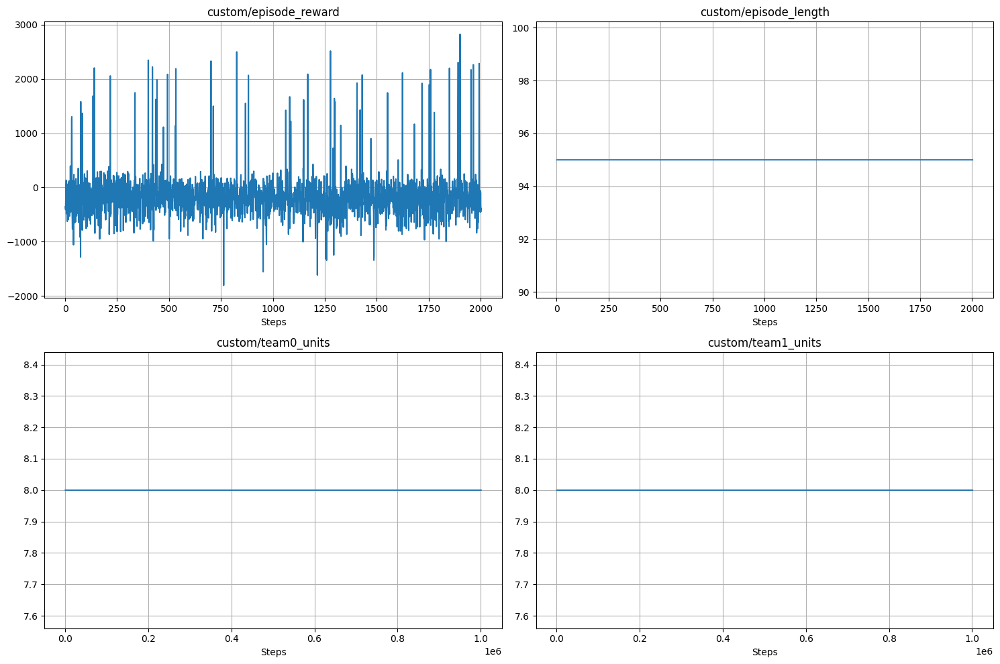

Processing: logs_final/ppo_lux_training_1/events.out.tfevents.1741563279.Siljas-MacBook-Pro.local.17443.0


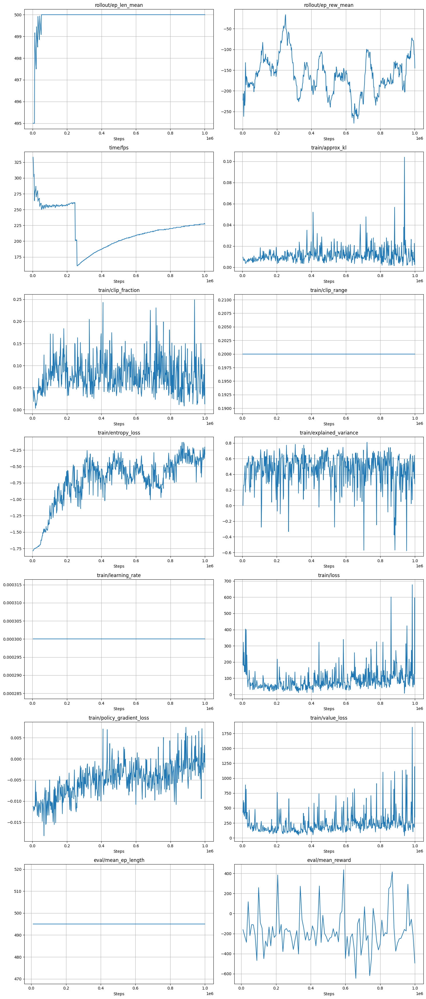

In [6]:
def plot_tensorboard_data(log_dir):
    """Plot TensorBoard data directly in the notebook"""
    # Find event files
    event_paths = []
    for root, dirs, files in os.walk(log_dir):
        for filename in files:
            if filename.startswith("events.out.tfevents"):
                event_paths.append(os.path.join(root, filename))
    
    if not event_paths:
        print(f"No TensorBoard event files found in {log_dir}")
        return
    
    # Process each event file
    for event_path in event_paths:
        print(f"Processing: {event_path}")
        event_acc = EventAccumulator(event_path)
        event_acc.Reload()
        
        # Get available tags (metrics)
        tags = event_acc.Tags()
        scalar_tags = tags.get('scalars', [])
        
        if not scalar_tags:
            print(f"No scalar data found in {event_path}")
            continue
        
        # Create a figure
        n_metrics = len(scalar_tags)
        fig_height = 5 * ((n_metrics + 1) // 2)  # Adjust figure height based on number of metrics
        fig, axes = plt.subplots(((n_metrics + 1) // 2), 2, figsize=(15, fig_height))
        axes = axes.flatten() if n_metrics > 1 else [axes]
        
        # Plot each metric
        for i, tag in enumerate(scalar_tags):
            events = event_acc.Scalars(tag)
            steps = [event.step for event in events]
            values = [event.value for event in events]
            
            axes[i].plot(steps, values)
            axes[i].set_title(tag)
            axes[i].set_xlabel('Steps')
            axes[i].grid(True)
        
        # Hide unused subplots
        for i in range(n_metrics, len(axes)):
            fig.delaxes(axes[i])
            
        plt.tight_layout()
        plt.show()

# Plot data from TensorBoard logs
plot_tensorboard_data("logs_final/")

In [7]:
# IPython.display.HTML(filename="replay.html")